# Microwaves and Optical Pumping
These things are intertwined enough that it makes sense to analyze both in one notebook.

In [1]:
from matplotlib import pyplot as plt
import matplotlib as mpl
import csv
import numpy as np
import os,sys
import PIL # for reading tif images
import h5py
import datetime as dt
import time
from skimage.filters import threshold_otsu
from scipy.optimize import curve_fit

sys.path.append("..\\")
from h5_data_utilities import * # helper functions for dealing with h5 files

def Rabi_oscillation_fit(t, r, f, C, tau):
    """
    t: array of time points
    r: baseline retention
    f: oscillation frequency Omega/2pi
    C: contrast
    tau: exponential decay rate
    """
    asymptote = r - C/2
    return (C/2)*np.cos(2*np.pi*f*t)*np.exp(-t/abs(tau)) + asymptote

def resonance_dip_fit(f, r, sigma, f0, C):
    """
    t: array of time points
    r: baseline retention
    Omega: oscillation angular frequency
    C: contrast
    tau: exponential decay rate
    """
    return r*(1-C*np.exp(-0.5*((f-f0)/sigma)**2))

def average_over_measurement(measurements, history):
    iteration = len(history) // measurements
    mean_by_iteration = [np.mean(history[j * measurements:(j + 1) * measurements]) for j in range(iteration)]
    return mean_by_iteration

aom_colors = ['mediumseagreen','mediumblue','violet','indianred','orange','cornflowerblue', 'plum', 'tomato', 'chartreuse']

# 2025-01-30

In [2]:
fnames = get_files_by_criteria(date_filters=["2025-01-30"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 44 files
file 0 (...results\2025-01-30\08\000021727-GeneralVariableScan.h5) scanned over p_pumping_repump
file 2 (...results\2025-01-30\09\000021733-GeneralVariableScan.h5) scanned over p_pumping_repump
file 4 (...results\2025-01-30\09\000021735-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 6 (...results\2025-01-30\10\000021737-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 8 (...results\2025-01-30\11\000021739-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 10 (...results\2025-01-30\12\000021741-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 12 (...results\2025-01-30\14\000021743-GeneralVariableScan.h5) scanned over set_point_excitation
file 13 (...results\2025-01-30\14\000021747-GeneralVariableScan.h5) scanned over set_point_excitation
file 14 (...results\2025-01-30\14\000021748-GeneralVariableScan.h5) scanned over set_point_excitation
file 15 (...results\2025-01-30\14\000021749-GeneralVariableScan.h5) scanned over set_point_e

## Microwave time scan - checking the Rabi oscillation

In [3]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = single_atom_counts_per_s*t_SPCM_first_shot # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    42: 'D1 on GRIN1. Shims=0',
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0.8,1e3,0.1,0],[1,1e5,1,100e-2]]}}


if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True,figsize=(10, 5))
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1)

    ### for plotting 
    ### xsteps_xform is a function that can transform scan_sequence1 for plotting. Here it is equal to identity, i.e. no change in scan_sequence1.
    if scan_variable1_name in xform_and_label and custom_xlabel:
        xsteps_xform, xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'], xform_and_label[scan_variable1_name]['xlabel'])
    else:
        xsteps_xform, xlabel = (lambda x: x, scan_variable1_name)
        
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    ### get_loading_and_retention
    ### These array have length = iterations
    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(SPCM0_RO1,SPCM0_RO2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    
    ### Necessary to analyze data with 2 scan_sequences
    ### reshaping each array into a 2D array with shape = shape, with order = 'F' (Fortran-style) to sort column by column
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

    ### show historam of first_shot and second_shot
    histMin = np.min([SPCM0_RO1, SPCM0_RO2])/t_SPCM_first_shot ## boundary for the histogram plots
    histMax = np.max([SPCM0_RO1, SPCM0_RO2])/t_SPCM_first_shot
    if showhist:
        first_shot_hists.append(
            [np.histogram(SPCM0_RO1[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(histMin,histMax,50))[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(SPCM0_RO2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(histMin,histMax,50))[0]
                                      for i in range(iterations)])
    
   
    ### plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))
            xlim1 = 0
            xlim2 = iterations
            ax_ret.set_xlim((xlim1,xlim2))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1[xlim1:xlim2], ydata=retention[xlim1:xlim2], p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
                
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            # ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

# if merge_data:
#     retention = merged_retention
#     scan_sequence1 = merged_scan_sequence1
#     errs = merged_errs

#     ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
#     ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
#     ax_ret.set_ylim((0,1))
    
#     if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
#         popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
#         hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
#         hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
#         fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
#         print(fit_str)
#         ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
#         ax_ret.legend()
#     else:
#         ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


# if not compare or len(file_indices)==1:
#     ax_ret.set_title(experiment_function+' '+str(rid))
# elif merge_data:
#     ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
# else:
#     ax_ret.set_title(experiment_function)

# if showhist:
#     fig,axes = plt.subplots(nrows=2,sharex=True)
#     ax,ax2 = axes
#     cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
#     ax.set_ylabel("shot 1 counts")
#     ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
#     ax.set_aspect('auto')
#     cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
#     ax2.set_ylabel("shot 2 counts")
    
#     ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
#     ax2.set_aspect('auto')
# plt.show()

# # AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


# if show_beam_power:
#     fig,axes = plt.subplots(nrows=2,sharex=True)
#     plot_num = 0
#     # PUMPING REPUMP: 
#     for i in range(2): # this time include the free space beams too
#         repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
#         repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
#         axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
#         axes[plot_num].set_ylabel("a.u.")
        
#     plot_num += 1

#     # GRIN1 : 1
#     GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
#     GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
#     axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
#     axes[plot_num].set_ylabel("a.u.")
    
#     axes[-1].set_xlabel("iteration")
    
#     for i,axis in enumerate(axes):
#         axis.legend(loc=(1.02, 0.3-i*0.01))
    
#     plt.show()

NameError: name 'single_atom_counts_per_s' is not defined

## Microwave time scan - Effect of shim coils on OP

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':True}
r=0.9463, Omega/2*pi=40650.5828, C=0.5414, tau=0.0264
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':True}
iteration 14, no measurements
r=0.9040, Omega/2*pi=36824.8611, C=0.9323, tau=1.0000


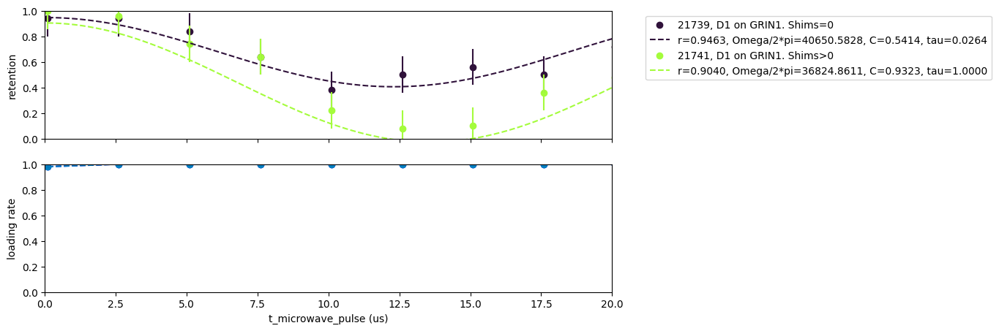

In [103]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = single_atom_counts_per_s*t_SPCM_first_shot # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    8: 'D1 on GRIN1. Shims=0',
    10: 'D1 on GRIN1. Shims>0'
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0.8,1e3,0.1,0],[1,1e5,1,100e-2]]}}


if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True,figsize=(10, 5))
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1)

    ### for plotting 
    ### xsteps_xform is a function that can transform scan_sequence1 for plotting. Here it is equal to identity, i.e. no change in scan_sequence1.
    if scan_variable1_name in xform_and_label and custom_xlabel:
        xsteps_xform, xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'], xform_and_label[scan_variable1_name]['xlabel'])
    else:
        xsteps_xform, xlabel = (lambda x: x, scan_variable1_name)
        
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    ### get_loading_and_retention
    ### These array have length = iterations
    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(SPCM0_RO1,SPCM0_RO2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    
    ### Necessary to analyze data with 2 scan_sequences
    ### reshaping each array into a 2D array with shape = shape, with order = 'F' (Fortran-style) to sort column by column
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

    ### show historam of first_shot and second_shot
    histMin = np.min([SPCM0_RO1, SPCM0_RO2])/t_SPCM_first_shot ## boundary for the histogram plots
    histMax = np.max([SPCM0_RO1, SPCM0_RO2])/t_SPCM_first_shot
    if showhist:
        first_shot_hists.append(
            [np.histogram(SPCM0_RO1[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(histMin,histMax,50))[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(SPCM0_RO2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(histMin,histMax,50))[0]
                                      for i in range(iterations)])
    
   
    ### plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))
            xlim1 = 0
            xlim2 = iterations
            ax_ret.set_xlim((xlim1,xlim2))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1[xlim1:xlim2], ydata=retention[xlim1:xlim2], p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
                
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            # ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

# if merge_data:
#     retention = merged_retention
#     scan_sequence1 = merged_scan_sequence1
#     errs = merged_errs

#     ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
#     ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
#     ax_ret.set_ylim((0,1))
    
#     if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
#         popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
#         hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
#         hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
#         fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
#         print(fit_str)
#         ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
#         ax_ret.legend()
#     else:
#         ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


# if not compare or len(file_indices)==1:
#     ax_ret.set_title(experiment_function+' '+str(rid))
# elif merge_data:
#     ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
# else:
#     ax_ret.set_title(experiment_function)

# if showhist:
#     fig,axes = plt.subplots(nrows=2,sharex=True)
#     ax,ax2 = axes
#     cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
#     ax.set_ylabel("shot 1 counts")
#     ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
#     ax.set_aspect('auto')
#     cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
#     ax2.set_ylabel("shot 2 counts")
    
#     ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
#     ax2.set_aspect('auto')
# plt.show()

# # AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


# if show_beam_power:
#     fig,axes = plt.subplots(nrows=2,sharex=True)
#     plot_num = 0
#     # PUMPING REPUMP: 
#     for i in range(2): # this time include the free space beams too
#         repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
#         repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
#         axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
#         axes[plot_num].set_ylabel("a.u.")
        
#     plot_num += 1

#     # GRIN1 : 1
#     GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
#     GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
#     axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
#     axes[plot_num].set_ylabel("a.u.")
    
#     axes[-1].set_xlabel("iteration")
    
#     for i,axis in enumerate(axes):
#         axis.legend(loc=(1.02, 0.3-i*0.01))
    
#     plt.show()

# 2025-01-24

In [88]:
fnames = get_files_by_criteria(date_filters=["2025-01-24"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2025-01-24\17\000021667-GeneralVariableScan.h5, which is corrupt
found 44 files
file 0 (...results\2025-01-24\09\000021631-GeneralVariableScan.h5) scanned over t_pumping
file 1 (...results\2025-01-24\09\000021632-GeneralVariableScan.h5) scanned over t_pumping
file 2 (...results\2025-01-24\09\000021633-GeneralVariableScan.h5) scanned over t_pumping
file 4 (...results\2025-01-24\09\000021635-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 6 (...results\2025-01-24\09\000021636-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 8 (...results\2025-01-24\10\000021637-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 10 (...results\2025-01-24\12\000021641-GeneralVariableScan.h5) scanned over t_pumping
file 11 (...results\2025-01-24\12\000021642-GeneralVariableScan.h5) scanned over t_pumping
file 13 (...results\2025-01-24\14\000021644-GeneralVariableScan.h5) scanned over t_pumping
file 15 (...resu

In [74]:
iteration

1060

## Microwave time scan - GRIN1 - Long scan

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False}
iteration 1062, no measurements
r=0.9010, Omega/2*pi=46559.7838, C=0.7190, tau=1.0000


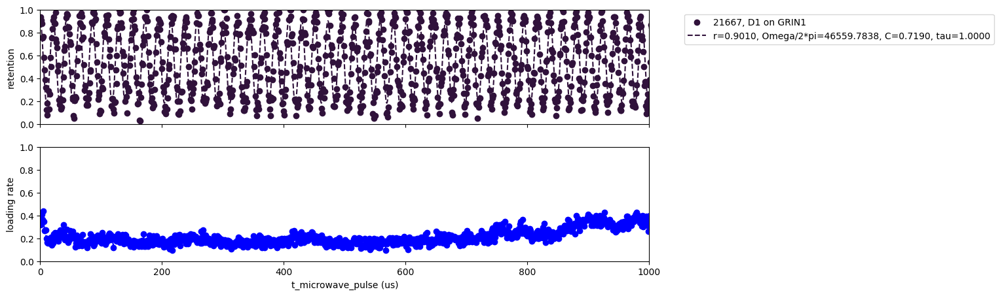

In [89]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = single_atom_counts_per_s*t_SPCM_first_shot # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    43: 'D1 on GRIN1',
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0.8,1e3,0.1,0],[1,1e5,1,100e-2]]}}


if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True,figsize=(12, 5))
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1)

    ### for plotting 
    ### xsteps_xform is a function that can transform scan_sequence1 for plotting. Here it is equal to identity, i.e. no change in scan_sequence1.
    if scan_variable1_name in xform_and_label and custom_xlabel:
        xsteps_xform, xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'], xform_and_label[scan_variable1_name]['xlabel'])
    else:
        xsteps_xform, xlabel = (lambda x: x, scan_variable1_name)
        
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    ### get_loading_and_retention
    ### These array have length = iterations
    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(SPCM0_RO1,SPCM0_RO2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    
    ### Necessary to analyze data with 2 scan_sequences
    ### reshaping each array into a 2D array with shape = shape, with order = 'F' (Fortran-style) to sort column by column
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

    ### show historam of first_shot and second_shot
    histMin = np.min([SPCM0_RO1, SPCM0_RO2])/t_SPCM_first_shot ## boundary for the histogram plots
    histMax = np.max([SPCM0_RO1, SPCM0_RO2])/t_SPCM_first_shot
    if showhist:
        first_shot_hists.append(
            [np.histogram(SPCM0_RO1[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(histMin,histMax,50))[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(SPCM0_RO2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(histMin,histMax,50))[0]
                                      for i in range(iterations)])
    
    # if showhist:
    #     first_shot_hists.append(
    #         [np.histogram(SPCM0_RO1[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
    #                           for i in range(iterations)])

    #     second_shot_hists.append(
    #         [np.histogram(SPCM0_RO2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
    #                                   for i in range(iterations)])

        

        # mean1_by_iteration.append([np.mean(SPCM0_RO1[i*n_measurements:(i+1)*n_measurements][SPCM0_RO1[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
        #                       for i in range(iterations)])
        # mean2_by_iteration.append([np.mean(SPCM0_RO2[i*n_measurements:(i+1)*n_measurements][SPCM0_RO2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
        #                       for i in range(iterations)])
    
    ### plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            # ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))
            xlim1 = 0
            xlim2 = 1000 ## iterations
            ax_ret.set_xlim((xlim1,xlim2))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1[xlim1:xlim2], ydata=retention[xlim1:xlim2], p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
                
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            # ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

# if merge_data:
#     retention = merged_retention
#     scan_sequence1 = merged_scan_sequence1
#     errs = merged_errs

#     ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
#     ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
#     ax_ret.set_ylim((0,1))
    
#     if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
#         popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
#         hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
#         hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
#         fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
#         print(fit_str)
#         ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
#         ax_ret.legend()
#     else:
#         ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


# if not compare or len(file_indices)==1:
#     ax_ret.set_title(experiment_function+' '+str(rid))
# elif merge_data:
#     ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
# else:
#     ax_ret.set_title(experiment_function)

# if showhist:
#     fig,axes = plt.subplots(nrows=2,sharex=True)
#     ax,ax2 = axes
#     cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
#     ax.set_ylabel("shot 1 counts")
#     ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
#     ax.set_aspect('auto')
#     cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
#     ax2.set_ylabel("shot 2 counts")
    
#     ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
#     ax2.set_aspect('auto')
# plt.show()

# # AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


# if show_beam_power:
#     fig,axes = plt.subplots(nrows=2,sharex=True)
#     plot_num = 0
#     # PUMPING REPUMP: 
#     for i in range(2): # this time include the free space beams too
#         repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
#         repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
#         axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
#         axes[plot_num].set_ylabel("a.u.")
        
#     plot_num += 1

#     # GRIN1 : 1
#     GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
#     GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
#     axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
#     axes[plot_num].set_ylabel("a.u.")
    
#     axes[-1].set_xlabel("iteration")
    
#     for i,axis in enumerate(axes):
#         axis.legend(loc=(1.02, 0.3-i*0.01))
    
#     plt.show()

# 2025-01-22

In [16]:
fnames = get_files_by_criteria(date_filters=["2025-01-22"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 25 files
file 0 (...results\2025-01-22\08\000021573-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 2 (...results\2025-01-22\09\000021574-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 4 (...results\2025-01-22\09\000021575-GeneralVariableScan.h5) scanned over t_blowaway
file 5 (...results\2025-01-22\09\000021576-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 6 (...results\2025-01-22\14\000021597-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 8 (...results\2025-01-22\14\000021598-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 10 (...results\2025-01-22\14\000021599-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 12 (...results\2025-01-22\15\000021600-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 14 (...results\2025-01-22\16\000021607-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 16 (...results\2025-01-22\16\000021608-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 18 

## Microwave time scan - GRIN1 - Long scan

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False}
iteration 182, no measurements
r=0.7053, Omega/2*pi=43750.8323, C=1.0000, tau=0.0001


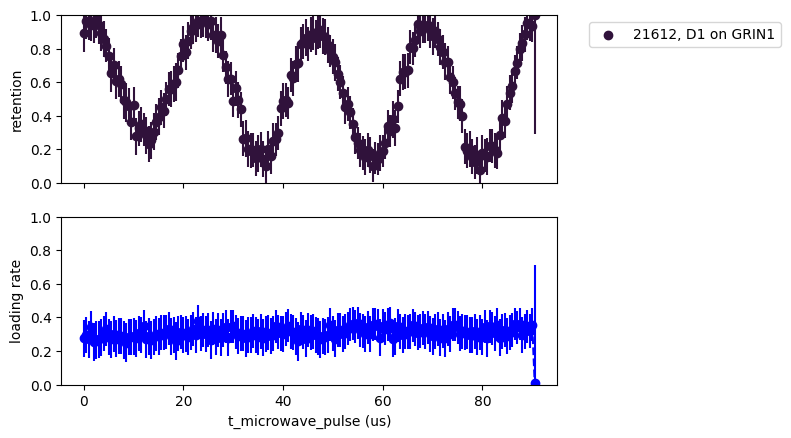

In [21]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = single_atom_counts_per_s*t_SPCM_first_shot # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    23: 'D1 on GRIN1',
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(SPCM0_RO1,SPCM0_RO2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(SPCM0_RO1[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(SPCM0_RO2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(SPCM0_RO1[i*n_measurements:(i+1)*n_measurements][SPCM0_RO1[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(SPCM0_RO2[i*n_measurements:(i+1)*n_measurements][SPCM0_RO2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                # ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

# if merge_data:
#     retention = merged_retention
#     scan_sequence1 = merged_scan_sequence1
#     errs = merged_errs

#     ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
#     ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
#     ax_ret.set_ylim((0,1))
    
#     if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
#         popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
#         hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
#         hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
#         fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
#         print(fit_str)
#         ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
#         ax_ret.legend()
#     else:
#         ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


# if not compare or len(file_indices)==1:
#     ax_ret.set_title(experiment_function+' '+str(rid))
# elif merge_data:
#     ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
# else:
#     ax_ret.set_title(experiment_function)

# if showhist:
#     fig,axes = plt.subplots(nrows=2,sharex=True)
#     ax,ax2 = axes
#     cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
#     ax.set_ylabel("shot 1 counts")
#     ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
#     ax.set_aspect('auto')
#     cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
#     ax2.set_ylabel("shot 2 counts")
    
#     ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
#     ax2.set_aspect('auto')
# plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


# if show_beam_power:
#     fig,axes = plt.subplots(nrows=2,sharex=True)
#     plot_num = 0
#     # PUMPING REPUMP: 
#     for i in range(2): # this time include the free space beams too
#         repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
#         repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
#         axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
#         axes[plot_num].set_ylabel("a.u.")
        
#     plot_num += 1

#     # GRIN1 : 1
#     GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
#     GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
#     axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
#     axes[plot_num].set_ylabel("a.u.")
    
#     axes[-1].set_xlabel("iteration")
    
#     for i,axis in enumerate(axes):
#         axis.legend(loc=(1.02, 0.3-i*0.01))
    
#     plt.show()

In [22]:
np.linspace(-20,20,10)

array([-20.        , -15.55555556, -11.11111111,  -6.66666667,
        -2.22222222,   2.22222222,   6.66666667,  11.11111111,
        15.55555556,  20.        ])

## Microwave time scan - GRIN1 vs GRIN2

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False}
r=0.5547, Omega/2*pi=100.0000, C=0.5000, tau=0.0000
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False}
r=1.0000, Omega/2*pi=41650.6304, C=0.8833, tau=1.0000
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False}
r=1.0000, Omega/2*pi=39428.0629, C=0.9149, tau=0.0002
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False}
r=0.9442, Omega/2*pi=39321.1111, C=0.7447, tau=1.0000


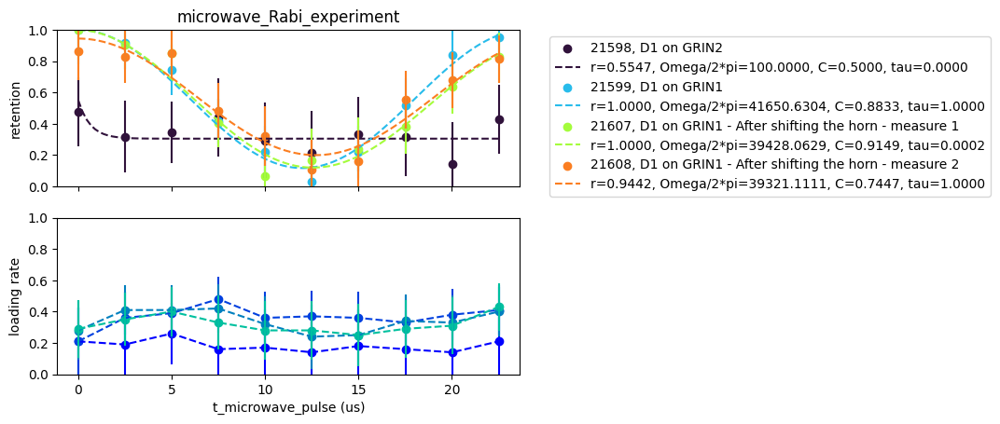

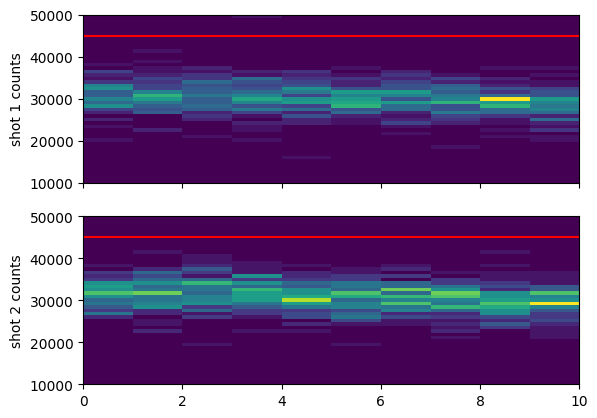

In [14]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = single_atom_counts_per_s*t_SPCM_first_shot # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    8: 'D1 on GRIN2',
    10: 'D1 on GRIN1',
    14: 'D1 on GRIN1 - After shifting the horn - measure 1',
    16: 'D1 on GRIN1 - After shifting the horn - measure 2'
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(SPCM0_RO1,SPCM0_RO2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(SPCM0_RO1[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(SPCM0_RO2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(SPCM0_RO1[i*n_measurements:(i+1)*n_measurements][SPCM0_RO1[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(SPCM0_RO2[i*n_measurements:(i+1)*n_measurements][SPCM0_RO2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


if show_beam_power:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    plot_num = 0
    # PUMPING REPUMP: 
    for i in range(2): # this time include the free space beams too
        repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
        repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
        axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
        axes[plot_num].set_ylabel("a.u.")
        
    plot_num += 1

    # GRIN1 : 1
    GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
    GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
    axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
    axes[plot_num].set_ylabel("a.u.")
    
    axes[-1].set_xlabel("iteration")
    
    for i,axis in enumerate(axes):
        axis.legend(loc=(1.02, 0.3-i*0.01))
    
    plt.show()

# 2025.01.07

In [19]:
fnames = get_files_by_criteria(date_filters=["2025-01-07", "2025-01-08"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2025-01-08\00\000021394-GeneralVariableScan.h5, which is corrupt
found 50 files
file 0 (...results\2025-01-07\02\000021347-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 2 (...results\2025-01-07\08\000021349-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_cost'
file 4 (...results\2025-01-07\08\000021350-GeneralVariableScan.h5) scanned over set_point_excitation
file 5 (...results\2025-01-07\09\000021351-GeneralVariableScan.h5) scanned over set_point_excitation
file 6 (...results\2025-01-07\09\000021352-GeneralVariableScan.h5) scanned over set_point_excitation
file 8 (...results\2025-01-07\10\000021353-GeneralVariableScan.h5) scanned over set_point_excitation
file 9 (...results\2025-01-07\10\000021355-GeneralVariableScan.h5) scanned over set_point_excitation
file 10 (...results\2025-01-07\10\000021357-GeneralVariableS

## Microwave time scan - Back to GRIN1

experiment: test_exc_microwave_Rabi_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True, 'gate_start_offset_mu': 750, 'n_excitation_cycles':100, 't_excitation_pulse': 30*ns}
r=0.9960, Omega/2*pi=41853.4322, C=0.9880, tau=0.0001
experiment: test_exc_microwave_Rabi_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True, 'gate_start_offset_mu': 750, 'n_excitation_cycles':200, 't_excitation_pulse': 30*ns, 'set_point_excitation': .001}
r=0.9637, Omega/2*pi=41381.6634, C=0.8838, tau=0.3376


C:\Users\QC\AppData\Local\Temp\ipykernel_31788\2743644575.py:113: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])


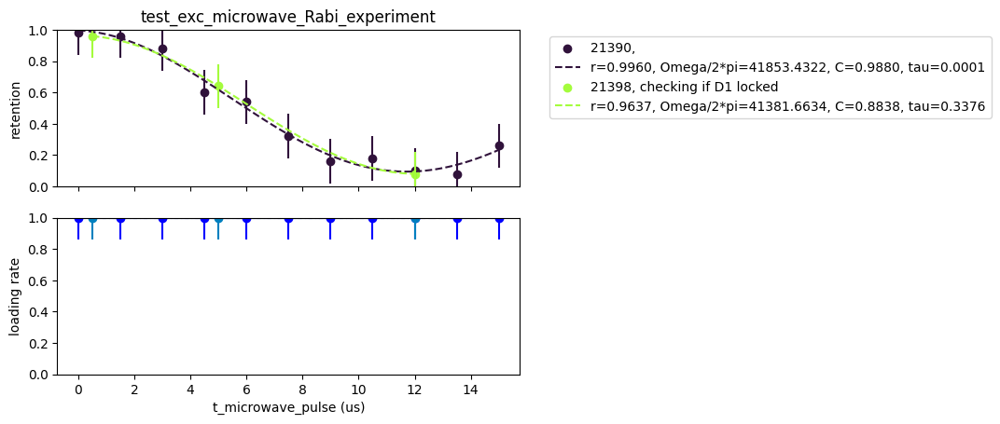

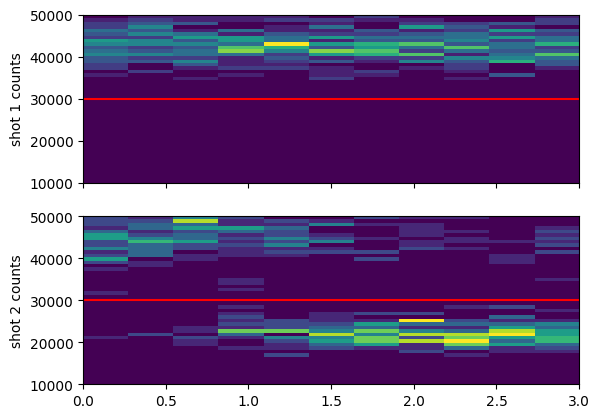

50

In [21]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = 30000*.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    36: '',
    46: 'checking if D1 locked'
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


if show_beam_power:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    plot_num = 0
    # PUMPING REPUMP: 
    for i in range(2): # this time include the free space beams too
        repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
        repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
        axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
        axes[plot_num].set_ylabel("a.u.")
        
    plot_num += 1

    # GRIN1 : 1
    GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
    GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
    axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
    axes[plot_num].set_ylabel("a.u.")
    
    axes[-1].set_xlabel("iteration")
    
    for i,axis in enumerate(axes):
        axis.legend(loc=(1.02, 0.3-i*0.01))
    
    plt.show()

    
n_measurements


## Microwave time scan - GRIN2

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True, 'gate_start_offset_mu': 750, 'n_excitation_cycles':100, 't_excitation_pulse': 30*ns}
iteration 13, no measurements
r=0.6159, Omega/2*pi=22149.2895, C=0.9312, tau=0.0001


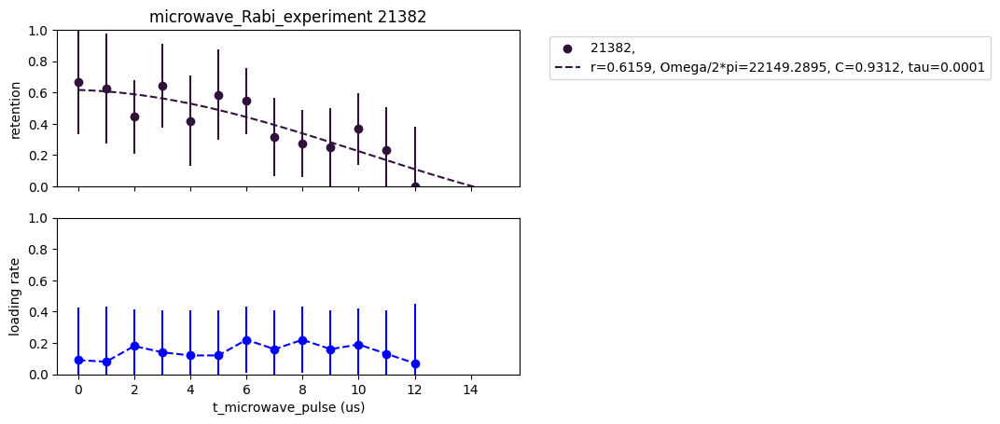

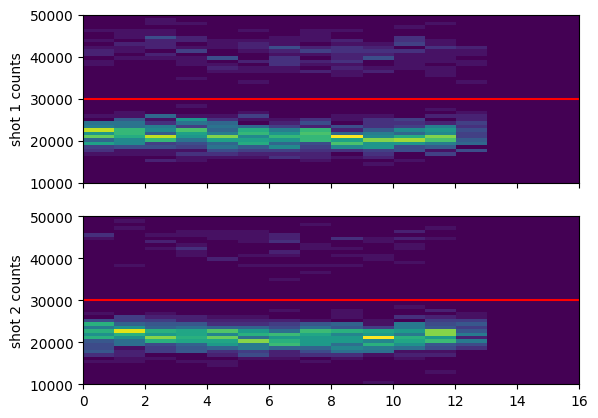

100

In [11]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = 30000*.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    29: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


if show_beam_power:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    plot_num = 0
    # PUMPING REPUMP: 
    for i in range(2): # this time include the free space beams too
        repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
        repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
        axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
        axes[plot_num].set_ylabel("a.u.")
        
    plot_num += 1

    # GRIN1 : 1
    GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
    GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
    axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
    axes[plot_num].set_ylabel("a.u.")
    
    axes[-1].set_xlabel("iteration")
    
    for i,axis in enumerate(axes):
        axis.legend(loc=(1.02, 0.3-i*0.01))
    
    plt.show()

    
n_measurements


## Microwave time scan - aligned to fast axis

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True, 'gate_start_offset_mu': 750, 'n_excitation_cycles':100}
r=1.0000, Omega/2*pi=38965.0991, C=0.6564, tau=1.0000


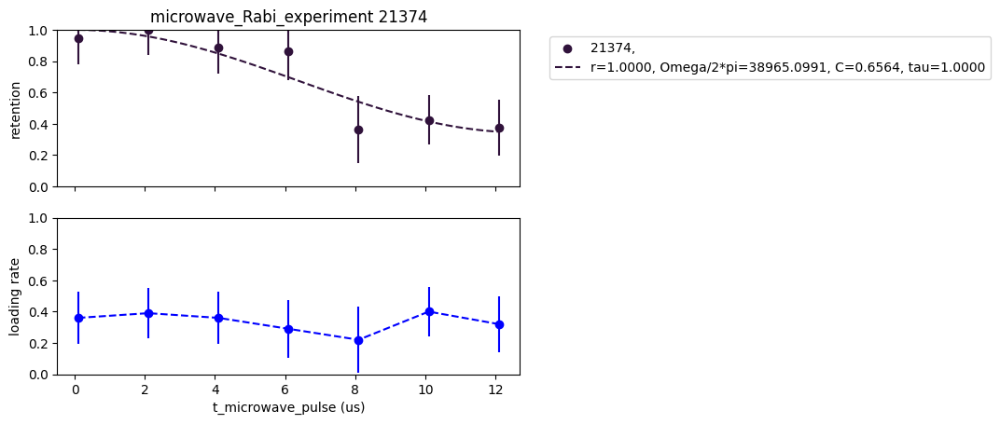

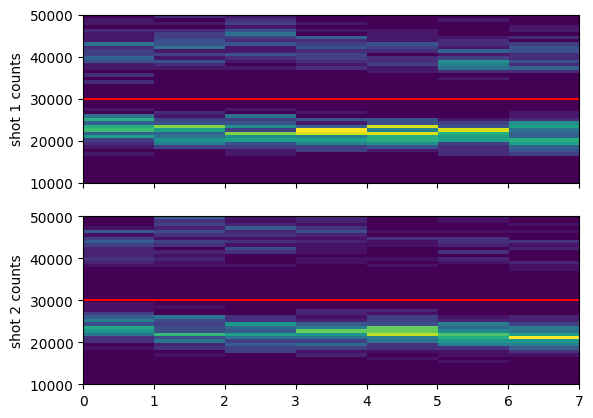

100

In [8]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = 30000*.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    25: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


if show_beam_power:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    plot_num = 0
    # PUMPING REPUMP: 
    for i in range(2): # this time include the free space beams too
        repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
        repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
        axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
        axes[plot_num].set_ylabel("a.u.")
        
    plot_num += 1

    # GRIN1 : 1
    GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
    GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
    axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
    axes[plot_num].set_ylabel("a.u.")
    
    axes[-1].set_xlabel("iteration")
    
    for i,axis in enumerate(axes):
        axis.legend(loc=(1.02, 0.3-i*0.01))
    
    plt.show()

    
n_measurements


# 2025.01.03

In [23]:
fnames = get_files_by_criteria(date_filters=["2025-01-03"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 8 files
file 0 (...results\2025-01-03\12\000021120-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 2 (...results\2025-01-03\12\000021121-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 4 (...results\2025-01-03\13\000021123-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 6 (...results\2025-01-03\16\000021142-GeneralVariableScan.h5) scanned over t_microwave_pulse
skipped 4 redundant files
1 scan_variables over 4 variable scans


## Microwave time scan

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334684101.0}
r=0.8075, Omega/2*pi=42080.0164, C=0.7341, tau=1.0000


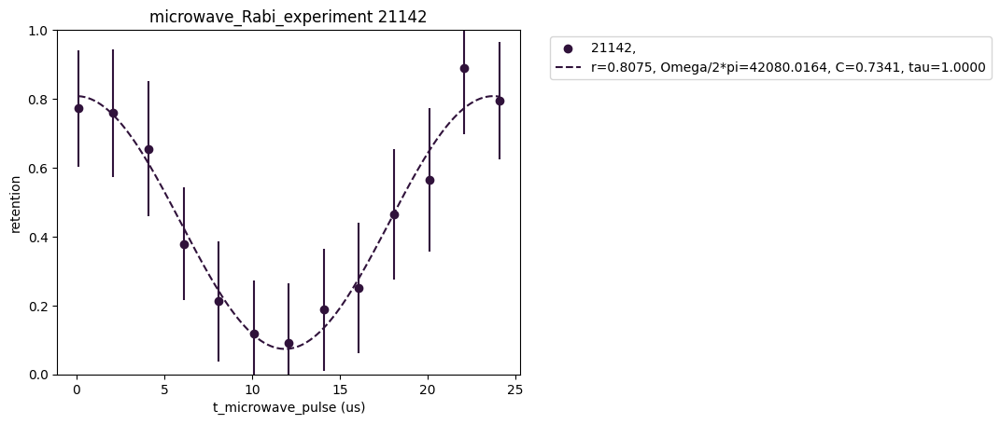

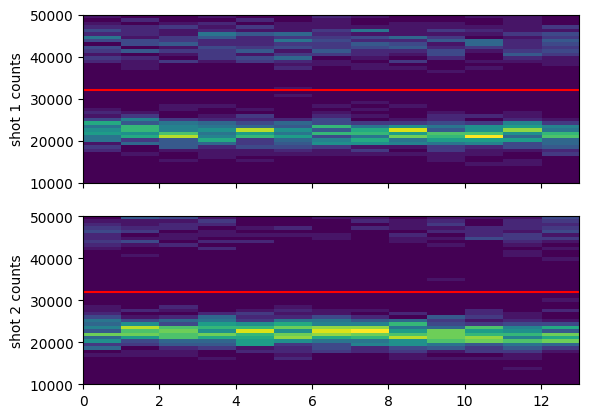

100

In [25]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = single_atom_counts_per_s*t_SPCM_first_shot # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    6: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


if show_beam_power:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    plot_num = 0
    # PUMPING REPUMP: 
    for i in range(2): # this time include the free space beams too
        repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
        repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
        axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
        axes[plot_num].set_ylabel("a.u.")
        
    plot_num += 1

    # GRIN1 : 1
    GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
    GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
    axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
    axes[plot_num].set_ylabel("a.u.")
    
    axes[-1].set_xlabel("iteration")
    
    for i,axis in enumerate(axes):
        axis.legend(loc=(1.02, 0.3-i*0.01))
    
    plt.show()

    
n_measurements


# 2025.01.01

In [13]:
fnames = get_files_by_criteria(date_filters=["2025-01-01"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 6 files
file 0 (...results\2025-01-01\18\000021002-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 2 (...results\2025-01-01\18\000021003-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 4 (...results\2025-01-01\18\000021004-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 5 (...results\2025-01-01\19\000021005-GeneralVariableOptimizer_microwave_Rabi_optimized_for_atom_retention_and_loading.h5) optimized ["'AZ_bottom_volts_OP'", "'AZ_top_volts_OP'", "'AX_volts_OP'", "'AY_volts_OP'"] for 'atom_retention_and_loading_cost'
skipped 2 redundant files
3 scan_variables over 3 variable scans


## Something wrong

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334684101.0}


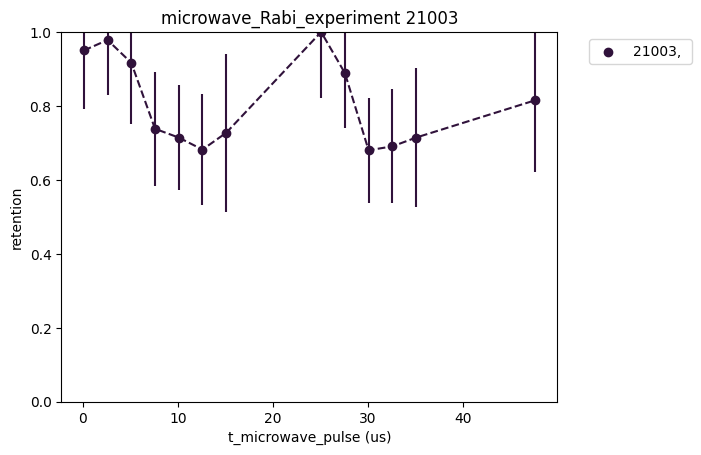

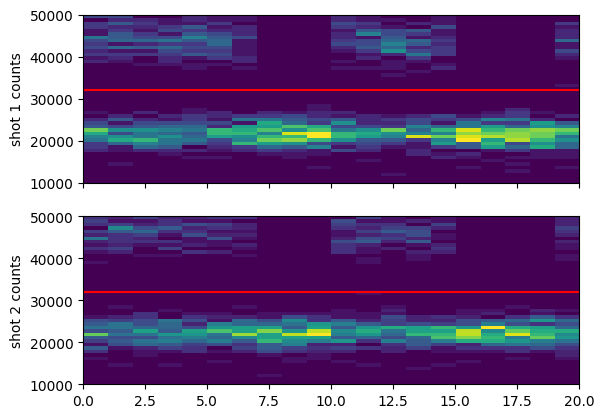

100

In [14]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

show_beam_power = False

cutoff1 = cutoff2 = single_atom_counts_per_s*t_SPCM_first_shot # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    2: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


if show_beam_power:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    plot_num = 0
    # PUMPING REPUMP: 
    for i in range(2): # this time include the free space beams too
        repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
        repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
        axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
        axes[plot_num].set_ylabel("a.u.")
        
    plot_num += 1

    # GRIN1 : 1
    GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
    GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
    axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
    axes[plot_num].set_ylabel("a.u.")
    
    axes[-1].set_xlabel("iteration")
    
    for i,axis in enumerate(axes):
        axis.legend(loc=(1.02, 0.3-i*0.01))
    
    plt.show()

    
n_measurements


# 2024.12.19

In [3]:
fnames = get_files_by_criteria(date_filters=["2024-12-19"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 15 files
file 0 (...results\2024-12-19\09\000020549-GeneralVariableScan_microwave_Rabi_scan_over_t_microwave_pulse.h5) scanned over t_microwave_pulse
file 1 (...results\2024-12-19\09\000020550-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 3 (...results\2024-12-19\13\000020553-GeneralVariableScan.h5) scanned over dummy_variable
file 4 (...results\2024-12-19\14\000020557-GeneralVariableScan.h5) scanned over dummy_variable
file 5 (...results\2024-12-19\14\000020559-GeneralVariableScan.h5) scanned over dummy_variable
file 7 (...results\2024-12-19\15\000020560-GeneralVariableScan.h5) scanned over dummy_variable
file 8 (...results\2024-12-19\15\000020561-GeneralVariableScan.h5) scanned over dummy_variable
file 9 (...results\2024-12-19\15\000020566-GeneralVariableScan.h5) scanned over dummy_variable
file 10 (...results\2024-12-19\15\000020571-GeneralVariableScan.h5) scanned over dummy_variable
file 11 (...results\2024-12-19\15\000020572-GeneralVariableScan.h5) scanned over

## Additional Microwave Scans

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334684101.0}
r=0.9817, Omega/2*pi=43087.9725, C=0.8402, tau=0.0044


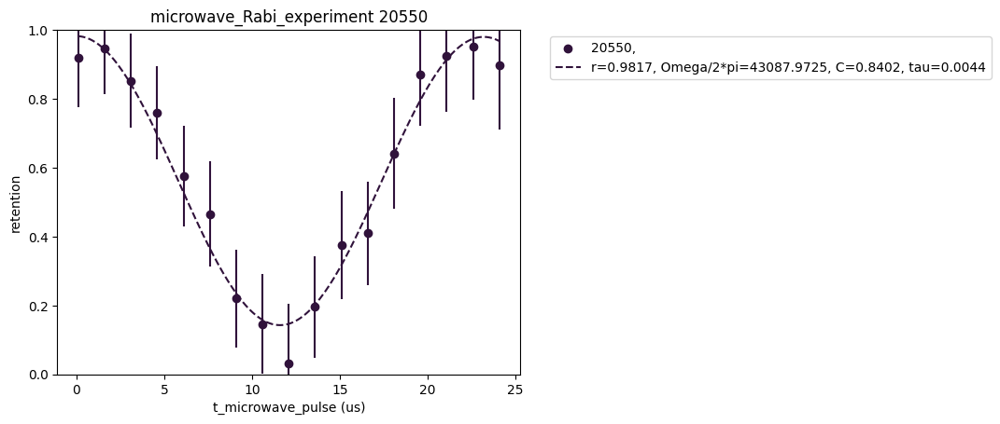

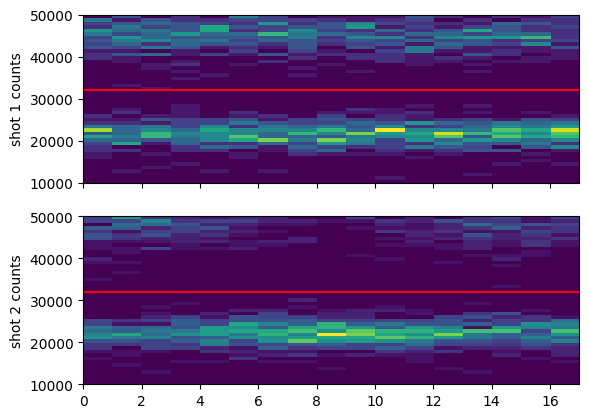

100

In [4]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = 32000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    1: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


if show_beam_power:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    plot_num = 0
    # PUMPING REPUMP: 
    for i in range(2): # this time include the free space beams too
        repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
        repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
        axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
        axes[plot_num].set_ylabel("a.u.")
        
    plot_num += 1

    # GRIN1 : 1
    GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
    GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
    axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
    axes[plot_num].set_ylabel("a.u.")
    
    axes[-1].set_xlabel("iteration")
    
    for i,axis in enumerate(axes):
        axis.legend(loc=(1.02, 0.3-i*0.01))
    
    plt.show()

    
n_measurements

## Microwave Time Scan

# 2024.12.04

In [233]:
fnames = get_files_by_criteria(date_filters=["2024-12-04","2024-12-05"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 43 files
file 0 (...results\2024-12-04\12\000019931-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 1 (...results\2024-12-04\12\000019934-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 3 (...results\2024-12-04\12\000019935-GeneralVariableScan.h5) scanned over f_D1_pumping_DP
file 5 (...results\2024-12-04\12\000019936-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 7 (...results\2024-12-04\13\000019938-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 9 (...results\2024-12-04\13\000019940-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 11 (...results\2024-12-04\15\000019942-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 12 (...results\2024-12-04\16\000019943-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 13 (...results\2024-12-04\16\000019944-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 15 (...results\2024-12-04\16\000019945-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 16

## Additional Microwave Scans

experiment: single_photon_experiment
override: {'dummy_variable':4}


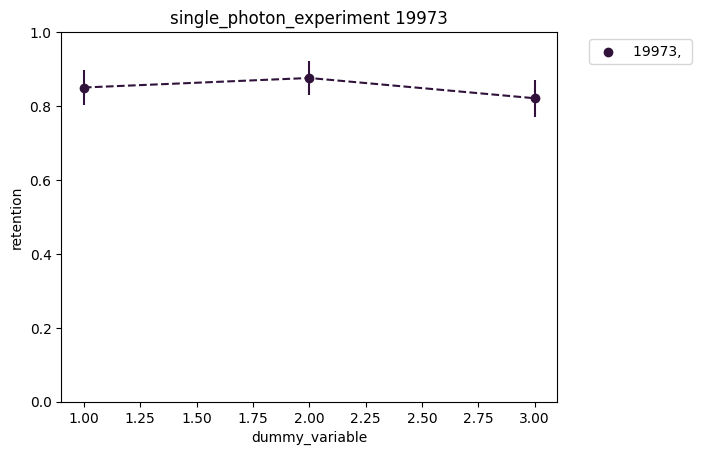

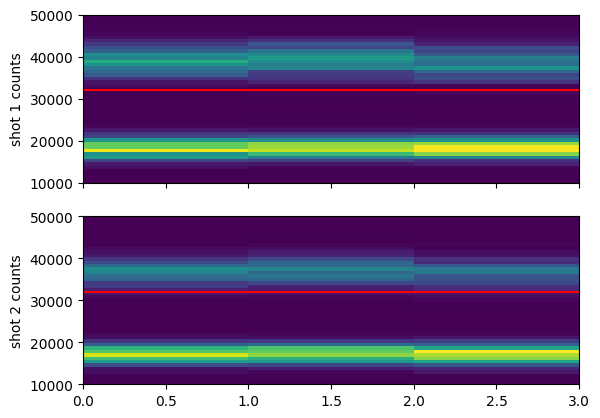

In [239]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = 32000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    41: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


if show_beam_power:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    plot_num = 0
    # PUMPING REPUMP: 
    for i in range(2): # this time include the free space beams too
        repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
        repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
        axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
        axes[plot_num].set_ylabel("a.u.")
        
    plot_num += 1

    # GRIN1 : 1
    GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
    GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
    axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
    axes[plot_num].set_ylabel("a.u.")
    
    axes[-1].set_xlabel("iteration")
    
    for i,axis in enumerate(axes):
        axis.legend(loc=(1.02, 0.3-i*0.01))
    
    plt.show()

    


## Microwave Time Scan

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':12*us}
r=0.9806, Omega/2*pi=43373.9792, C=0.8640, tau=1.0000


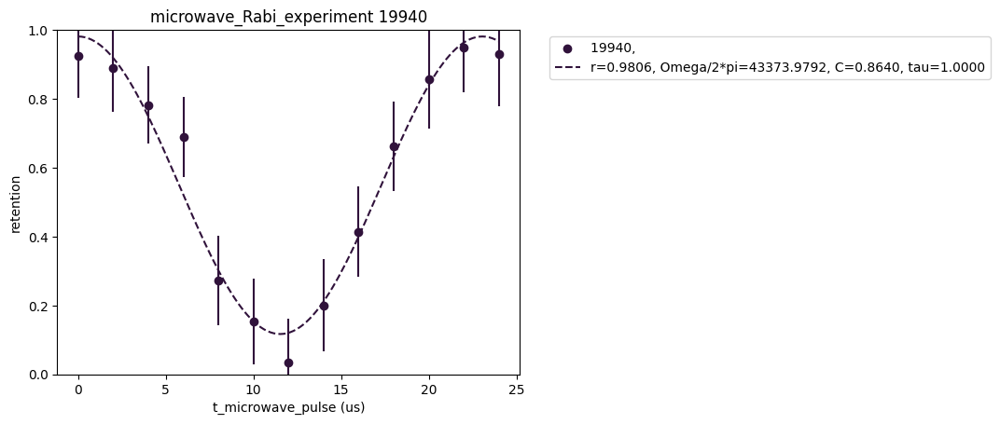

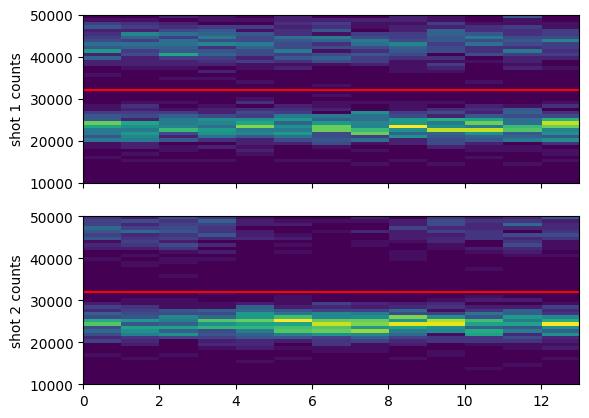

In [237]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = 32000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    9: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


if show_beam_power:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    plot_num = 0
    # PUMPING REPUMP: 
    for i in range(2): # this time include the free space beams too
        repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
        repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
        axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
        axes[plot_num].set_ylabel("a.u.")
        
    plot_num += 1

    # GRIN1 : 1
    GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
    GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
    axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
    axes[plot_num].set_ylabel("a.u.")
    
    axes[-1].set_xlabel("iteration")
    
    for i,axis in enumerate(axes):
        axis.legend(loc=(1.02, 0.3-i*0.01))
    
    plt.show()

    


In [242]:
0.5/43373

1.1527909067853273e-05

In [217]:
f_microwaves_dds

334684101.0

## OP frequency and power scans
Akbar realized the DP frequency was off by about 5 MHz, so we were off-resonance by about 10 MHz.

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':12*us}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':12*us}


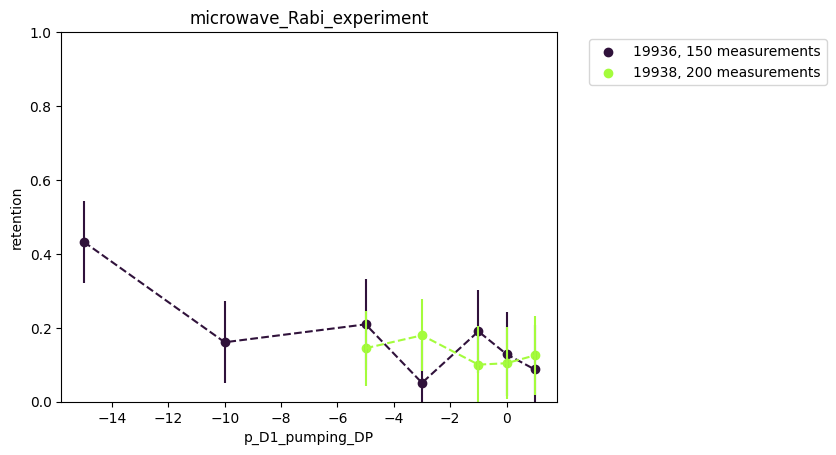

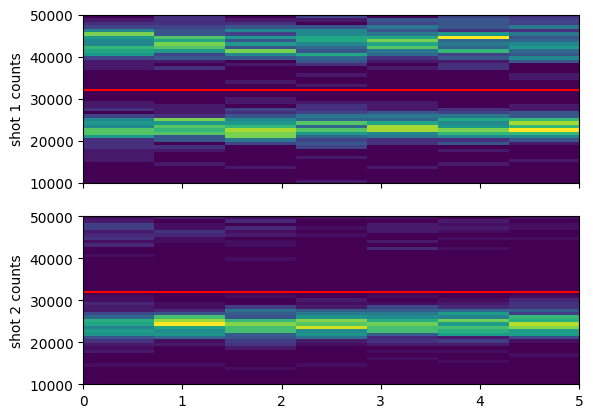

In [210]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = 32000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # 3: ''# frequency
    5: '150 measurements', # power
    7: '200 measurements'
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


if show_beam_power:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    plot_num = 0
    # PUMPING REPUMP: 
    for i in range(2): # this time include the free space beams too
        repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
        repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
        axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
        axes[plot_num].set_ylabel("a.u.")
        
    plot_num += 1

    # GRIN1 : 1
    GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
    GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
    axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
    axes[plot_num].set_ylabel("a.u.")
    
    axes[-1].set_xlabel("iteration")
    
    for i,axis in enumerate(axes):
        axis.legend(loc=(1.02, 0.3-i*0.01))
    
    plt.show()

In [206]:
np.arange(0,25,2)

array([ 0,  2,  4,  6,  8, 10, 12, 14, 16, 18, 20, 22, 24])

# 2024.12.03

In [19]:
fnames = get_files_by_criteria(date_filters=["2024-12-03"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-03\21\000019927-GeneralVariableScan_microwave_Rabi_scan_over_t_microwave_pulse.h5, which is corrupt
found 25 files
file 0 (...results\2024-12-03\11\000019895-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 2 (...results\2024-12-03\12\000019896-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 4 (...results\2024-12-03\12\000019897-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 6 (...results\2024-12-03\16\000019913-GeneralVariableScan.h5) scanned over p_pumping_repump
file 8 (...results\2024-12-03\16\000019914-GeneralVariableScan.h5) scanned over p_pumping_repump
file 10 (...results\2024-12-03\17\000019915-GeneralVariableScan.h5) scanned over p_pumping_repump
file 12 (...results\2024-12-03\17\000019917-GeneralVariableScan.h5) scanned over p_pumping_repump
file 14 (...results\2024-12-03\17\000019919-GeneralVariableScan.h5) scanned over p_pumping_repump
file 16 (...results\2024-12-03\1

## Microwave Frequency Scan

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':10*us}
r=0.9174, sigma=-25358.5251, f0=334674519.3862, C=0.8187


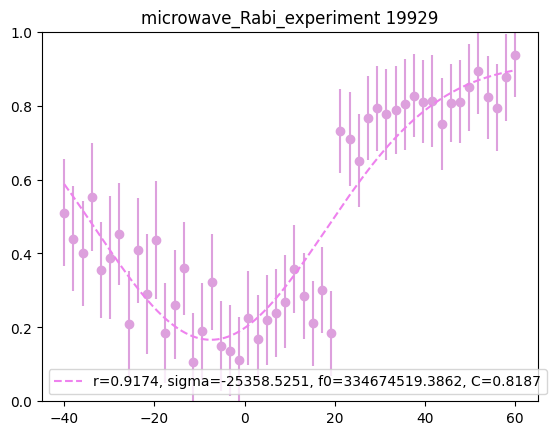

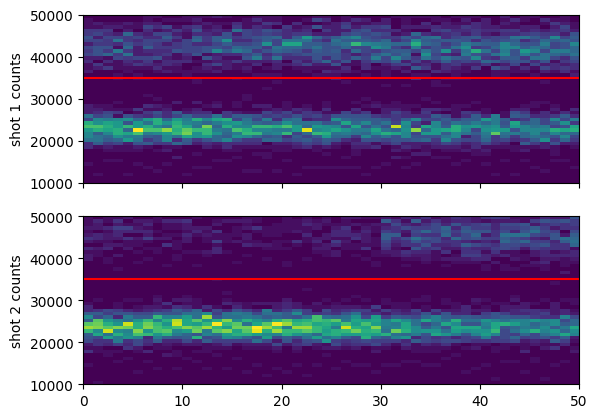

In [20]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = True # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = 35000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    23: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e4,0.7,0],[1,1e6,1,10e-3]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


if show_beam_power:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    plot_num = 0
    # PUMPING REPUMP: 
    for i in range(2): # this time include the free space beams too
        repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
        repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
        axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
        axes[plot_num].set_ylabel("a.u.")
        
    plot_num += 1

    # GRIN1 : 1
    GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
    GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
    axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
    axes[plot_num].set_ylabel("a.u.")
    
    axes[-1].set_xlabel("iteration")
    
    for i,axis in enumerate(axes):
        axis.legend(loc=(1.02, 0.3-i*0.01))
    
    plt.show()

    


## Microwave Time Scan

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False,'f_microwaves_dds':334680438.6307}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False,'f_microwaves_dds':334680438.6307}
r=0.8680, Omega/2*pi=42845.9179, C=0.7213, tau=0.0012


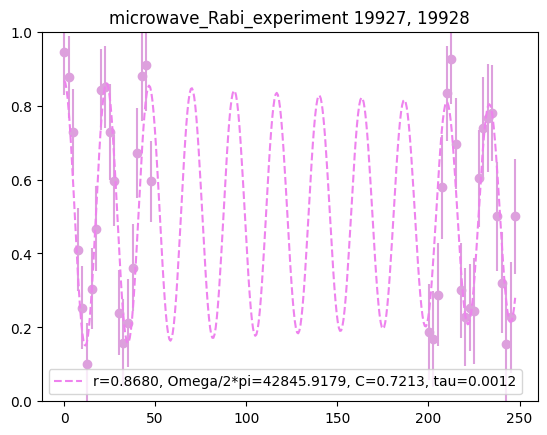

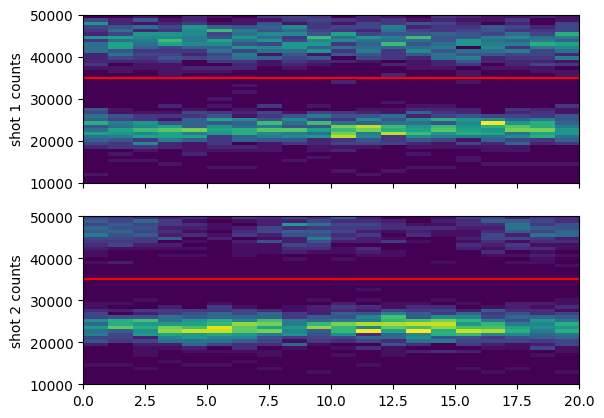

-12.0

In [22]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = True # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = 35000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    20: '',
    21: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e4,0.7,0],[1,1e6,1,10e-3]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


if show_beam_power:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    plot_num = 0
    # PUMPING REPUMP: 
    for i in range(2): # this time include the free space beams too
        repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
        repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
        axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
        axes[plot_num].set_ylabel("a.u.")
        
    plot_num += 1

    # GRIN1 : 1
    GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
    GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
    axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
    axes[plot_num].set_ylabel("a.u.")
    
    axes[-1].set_xlabel("iteration")
    
    for i,axis in enumerate(axes):
        axis.legend(loc=(1.02, 0.3-i*0.01))
    
    plt.show()


p_microwaves

## OP Scan

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':10*us,'f_microwaves_dds':334680438.6307}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':10*us,'f_microwaves_dds':334680438.6307}


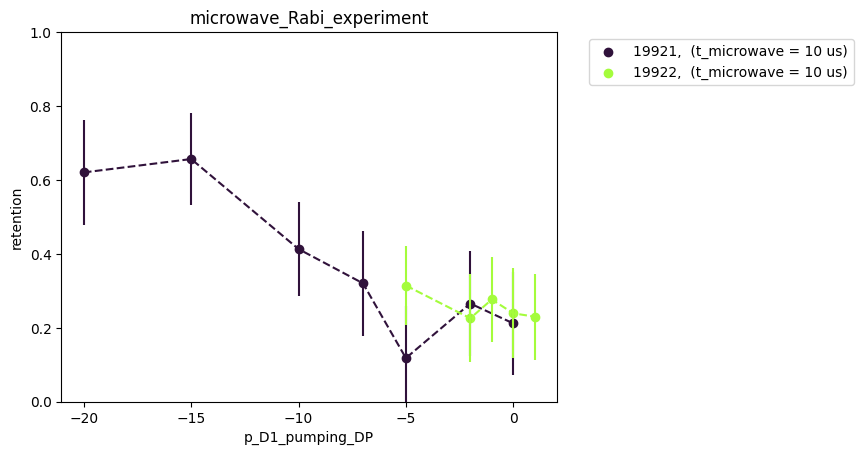

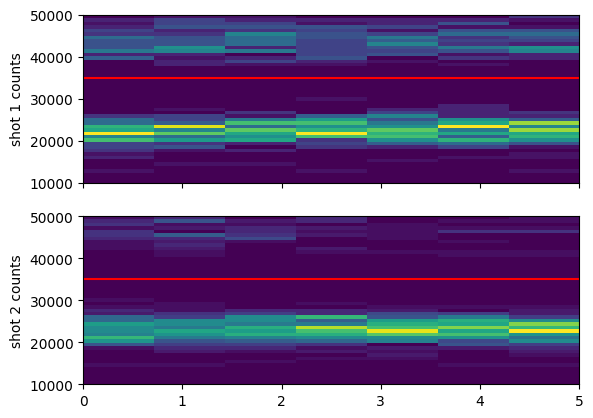

In [175]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

show_beam_power = False

cutoff1 = cutoff2 = 35000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    16: ' (t_microwave = 10 us)',
    18: ' (t_microwave = 10 us)'
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


if show_beam_power:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    plot_num = 0
    # PUMPING REPUMP: 
    for i in range(2): # this time include the free space beams too
        repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
        repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
        axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
        axes[plot_num].set_ylabel("a.u.")
        
    plot_num += 1

    # GRIN1 : 1
    GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
    GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
    axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
    axes[plot_num].set_ylabel("a.u.")
    
    axes[-1].set_xlabel("iteration")
    
    for i,axis in enumerate(axes):
        axis.legend(loc=(1.02, 0.3-i*0.01))
    
    plt.show()

    


## PR Scan

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':10*us,'f_microwaves_dds':334680438.6307, 'p_D1_pumping_DP':-150.0, 't_microwave_pulse': 0.}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':10*us,'f_microwaves_dds':334680438.6307, 'p_D1_pumping_DP':-150.0, 't_microwave_pulse': 0.}


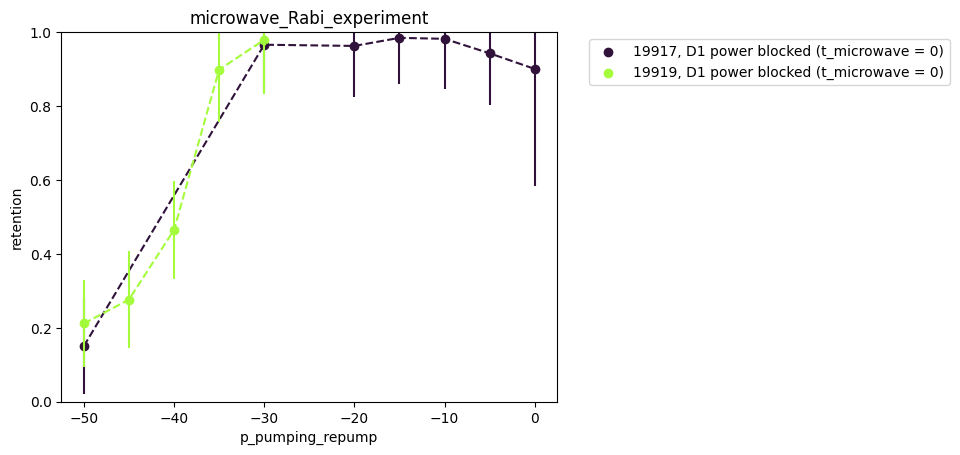

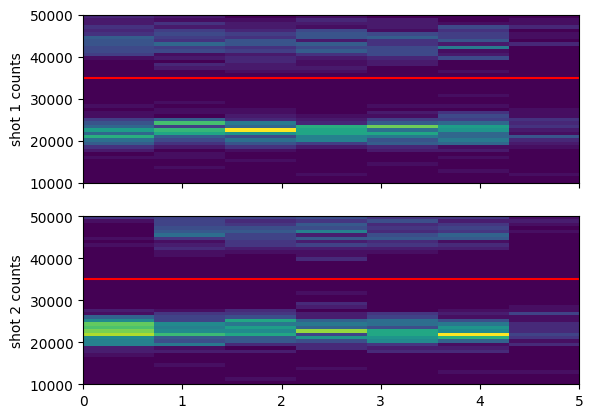

In [170]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

show_beam_power = False

cutoff1 = cutoff2 = 35000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    12: 'D1 power blocked (t_microwave = 0)',
    14: 'D1 power blocked (t_microwave = 0)'
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


if show_beam_power:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    plot_num = 0
    # REPUMP: 
    for i in range(2): # this time include the free space beams too
        repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
        repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
        axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
        axes[plot_num].set_ylabel("a.u.")
        
    plot_num += 1

    # GRIN1 : 1
    GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
    GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
    axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
    axes[plot_num].set_ylabel("a.u.")
    
    axes[-1].set_xlabel("iteration")
    
    for i,axis in enumerate(axes):
        axis.legend(loc=(1.02, 0.3-i*0.01))
    
    plt.show()

    


## Microwave Time scans

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':11.3*us,'f_microwaves_dds':334680438.6307, 'p_D1_pumping_DP':-1.0}
r=0.9638, Omega/2*pi=44771.5744, C=0.8095, tau=0.0007


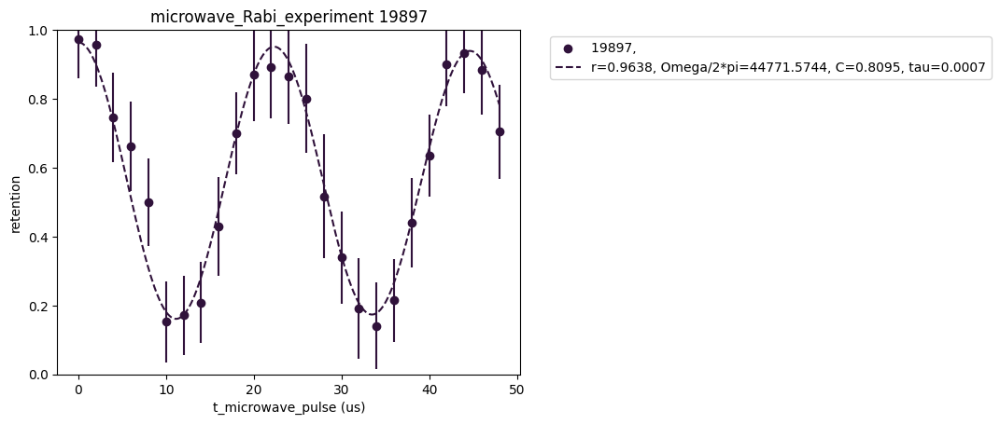

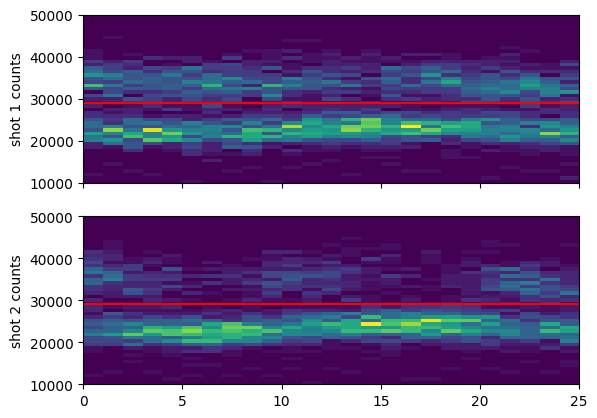

In [143]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 29000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {

    ### PR -15dbm:
    4: ''
    
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

## OP Scan

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':11.3*us,'f_microwaves_dds':334680438.6307}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':11.3*us,'f_microwaves_dds':334680438.6307}


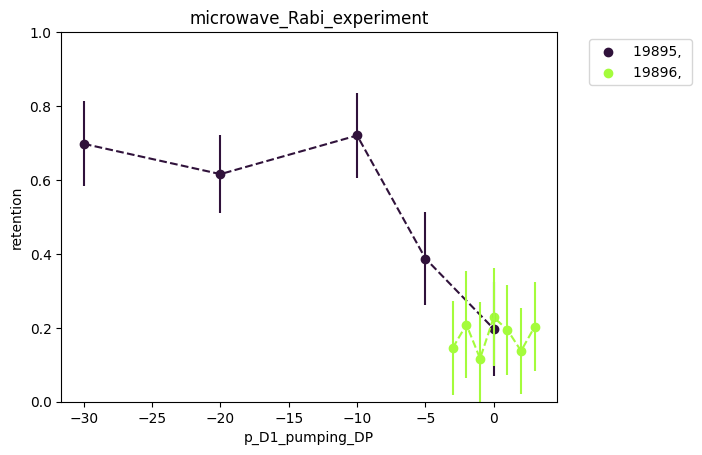

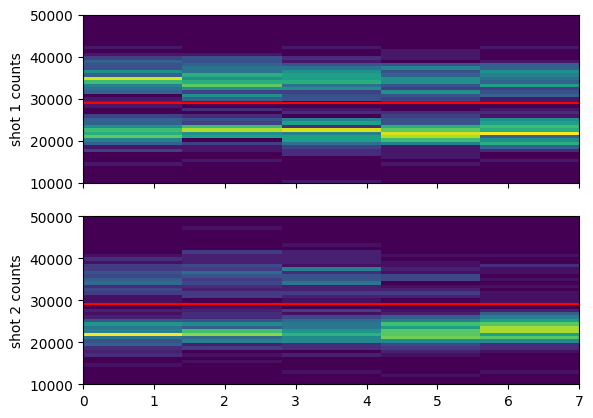

In [144]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 29000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {

    ### PR -15dbm:
    1: '',
    2: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

# 2024.12.02

In [128]:
fnames = get_files_by_criteria(date_filters=["2024-11-30","2024-12-01"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 20 files
file 0 (...results\2024-11-30\13\000019830-GeneralVariableScan.h5) scanned over t_blowaway
file 2 (...results\2024-11-30\13\000019832-GeneralVariableScan.h5) scanned over t_blowaway
file 4 (...results\2024-11-30\13\000019834-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 6 (...results\2024-11-30\15\000019837-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 7 (...results\2024-11-30\16\000019839-GeneralVariableScan.h5) scanned over p_pumping_repump
file 9 (...results\2024-11-30\16\000019840-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 11 (...results\2024-11-30\16\000019842-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 12 (...results\2024-11-30\17\000019851-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 14 (...results\2024-11-30\17\000019852-GeneralVariableScan.h5) scanned over p_pumping_repump
file 16 (...results\2024-11-30\17\000019853-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 18 (...results\202

## power scans

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':True, 't_microwave_pulse':11.3*us,'f_microwaves_dds':334680438.6307}


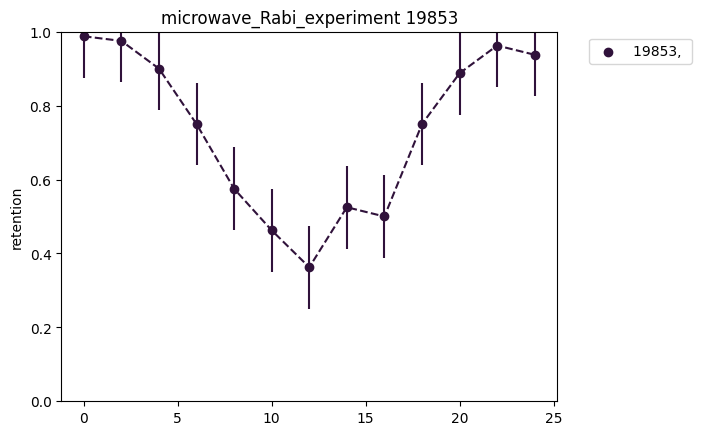

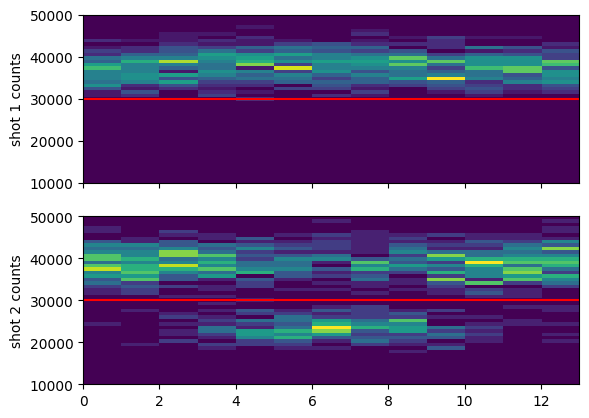

(6.9553662109375, 7.50943212890625, 0.47779272460937505, -0.292164794921875)

In [134]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

cutoff1 = cutoff2 = 600 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 530
# cutoff2 = 560 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # 4: '', # bad oscillation
    # 6: '' # failed after first point
    16: '', # bad oscillation
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': r"t_microwave_pulse ($\mu$s)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            # if not showloading:
            # ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')

title = experiment_function+' '+str(rid)
if not compare or len(file_indices)==1:
    ax_ret.set_title(title)
elif merge_data:
    title = experiment_function+' '+ rid_str[:-2]
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

# ax.set_xlabel('t_m)

plt.savefig(title.replace(',','_') + '.svg', bbox_inches='tight')


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')

plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

## microwave time scans

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':True, 't_microwave_pulse':11.3*us,'f_microwaves_dds':334680438.6307}


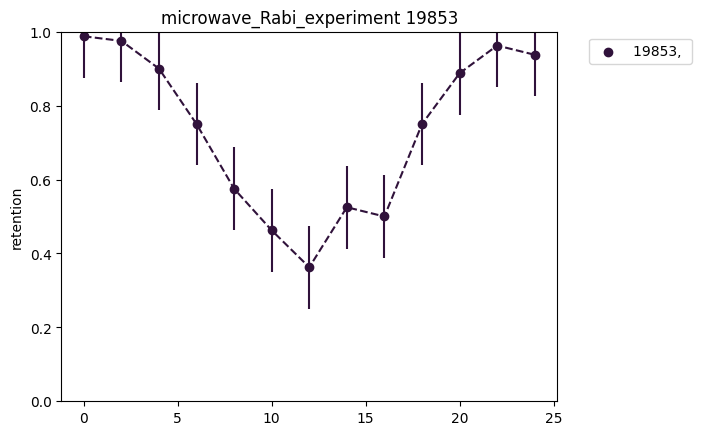

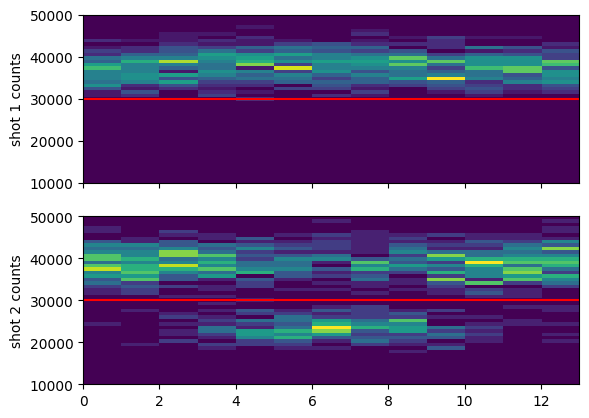

(6.9553662109375, 7.50943212890625, 0.47779272460937505, -0.292164794921875)

In [134]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

cutoff1 = cutoff2 = 600 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 530
# cutoff2 = 560 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # 4: '', # bad oscillation
    # 6: '' # failed after first point
    16: '', # bad oscillation
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': r"t_microwave_pulse ($\mu$s)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            # if not showloading:
            # ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')

title = experiment_function+' '+str(rid)
if not compare or len(file_indices)==1:
    ax_ret.set_title(title)
elif merge_data:
    title = experiment_function+' '+ rid_str[:-2]
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

# ax.set_xlabel('t_m)

plt.savefig(title.replace(',','_') + '.svg', bbox_inches='tight')


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')

plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

# 2024.11.29
To check the effect of Pumping repumper power, I have blocked the Pumping repumper.

In [127]:
fnames = get_files_by_criteria(date_filters=["2024-11-30"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 20 files
file 0 (...results\2024-11-30\13\000019830-GeneralVariableScan.h5) scanned over t_blowaway
file 2 (...results\2024-11-30\13\000019832-GeneralVariableScan.h5) scanned over t_blowaway
file 4 (...results\2024-11-30\13\000019834-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 6 (...results\2024-11-30\15\000019837-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 7 (...results\2024-11-30\16\000019839-GeneralVariableScan.h5) scanned over p_pumping_repump
file 9 (...results\2024-11-30\16\000019840-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 11 (...results\2024-11-30\16\000019842-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 12 (...results\2024-11-30\17\000019851-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 14 (...results\2024-11-30\17\000019852-GeneralVariableScan.h5) scanned over p_pumping_repump
file 16 (...results\2024-11-30\17\000019853-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 18 (...results\202

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':True, 't_microwave_pulse':11.3*us,'f_microwaves_dds':334680438.6307}
iteration 12, no measurements
r=1.0000, Omega/2*pi=44573.6311, C=0.5000, tau=0.0000


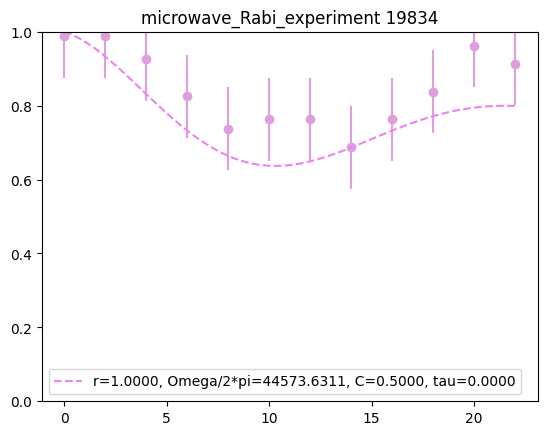

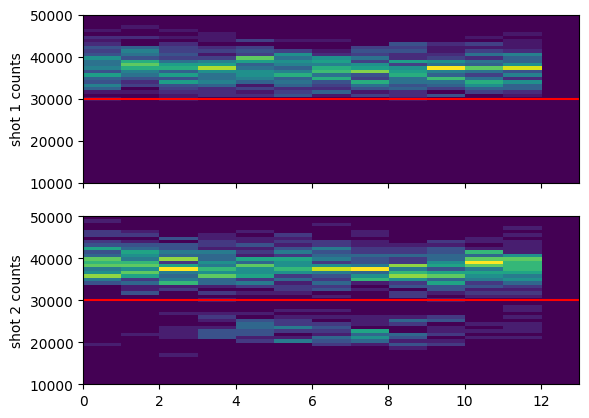

(6.9553662109375, 7.50943212890625, 0.47779272460937505, -0.292164794921875)

In [126]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = True # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 600 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 530
# cutoff2 = 560 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    4: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': r"t_microwave_pulse ($\mu$s)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            # if not showloading:
            # ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')

title = experiment_function+' '+str(rid)
if not compare or len(file_indices)==1:
    ax_ret.set_title(title)
elif merge_data:
    title = experiment_function+' '+ rid_str[:-2]
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

# ax.set_xlabel('t_m)

plt.savefig(title.replace(',','_') + '.svg', bbox_inches='tight')


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')

plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

# 2024.11.29
To check the effect of Pumping repumper power, I have blocked the Pumping repumper.

In [115]:
fnames = get_files_by_criteria(date_filters=["2024-11-29"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-11-29\10\000019777-GeneralVariableScan_microwave_Rabi_scan_over_p_pumping_repump.h5, which is corrupt
found 80 files
file 0 (...results\2024-11-29\09\000019763-GeneralVariableScan.h5) scanned over p_excitation
file 1 (...results\2024-11-29\09\000019764-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 3 (...results\2024-11-29\10\000019768-GeneralVariableScan.h5) scanned over p_pumping_repump
file 5 (...results\2024-11-29\10\000019769-GeneralVariableScan.h5) scanned over p_pumping_repump
file 7 (...results\2024-11-29\10\000019770-GeneralVariableScan.h5) scanned over p_pumping_repump
file 9 (...results\2024-11-29\10\000019772-GeneralVariableScan.h5) scanned over p_pumping_repump
file 11 (...results\2024-11-29\10\000019773-GeneralVariableScan.h5) scanned over p_pumping_repump
file 13 (...results\2024-11-29\10\000019777-GeneralVariableScan.h5) scanned over p_pumping_repump
file 14 (...results\2024-11-29\11\0000

## Scans Preston scheduled to run after he left on 2024.11.29

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':True, 't_microwave_pulse':11.3*us,'f_microwaves_dds':334680438.6307}
iteration 5, no measurements


ValueError: cannot reshape array of size 6 into shape (6,6)

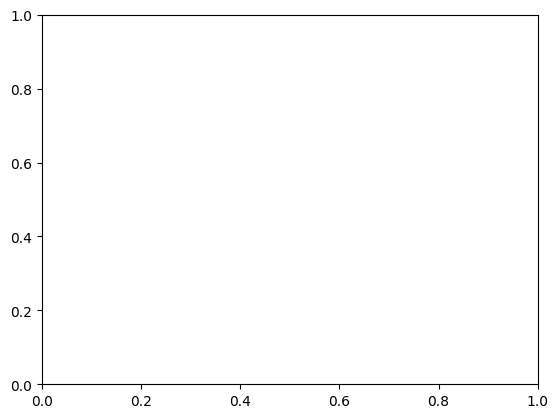

In [121]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

cutoff1 = cutoff2 = 30000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    ### 16 mW before the pumping RP AOM:
    # 72: 'AX_volts_OP',
    # 74: 'AZ_bottom_volts_OP',
    # 76: '' # blowaway time
    78: '' # this is 2D scan over power but it seems like it encountered an underflow in iteration 4 based on the length of photocounts
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    # loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    # n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

In [123]:
len(photocounts)/n_measurements

4.9125

In [120]:
len(loading_rate_array)

6

## D1 power scans

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':True, 't_microwave_pulse':11.3*us,'f_microwaves_dds':334680438.6307}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':True, 't_microwave_pulse':11.3*us,'f_microwaves_dds':334680438.6307}


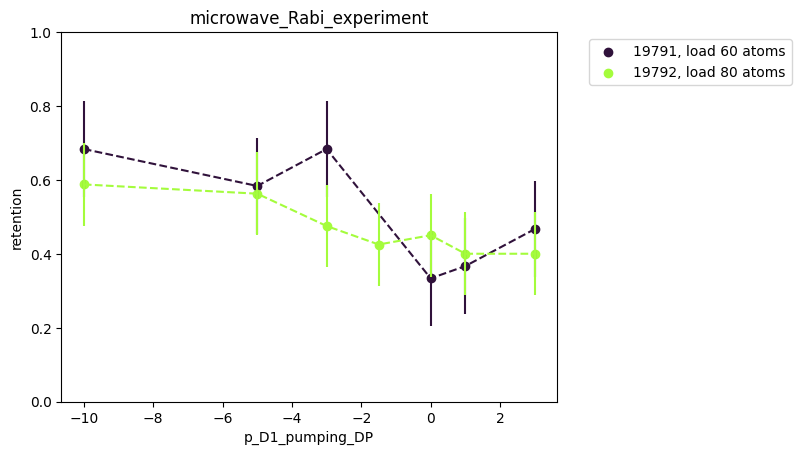

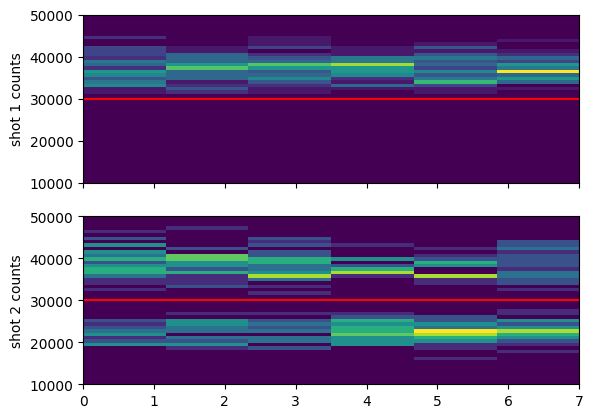

(6.9553662109375, 7.50943212890625, 0.47779272460937505, -0.292164794921875)

In [102]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 30000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    34: 'load 60 atoms',
    36: 'load 80 atoms'
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

## microwave time scans

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':True, 't_microwave_pulse':0.0*us,'f_microwaves_dds':334680438.6307}
r=1.0000, Omega/2*pi=44007.4655, C=0.6432, tau=0.0002


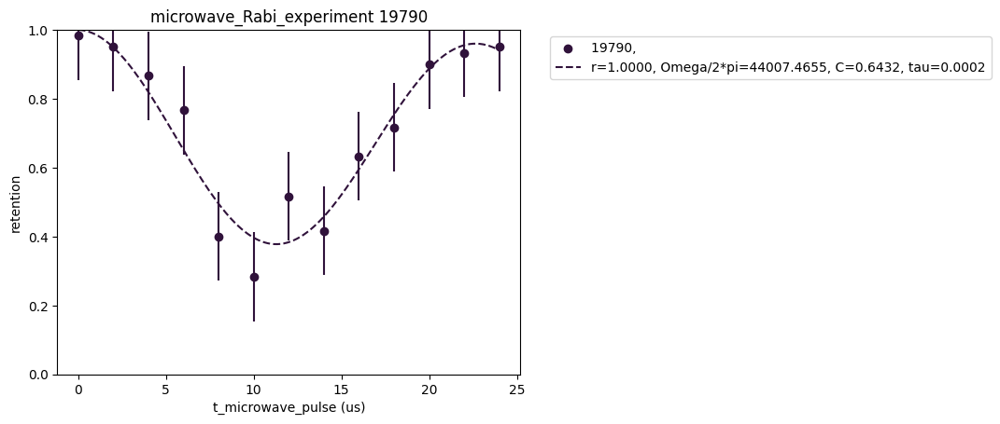

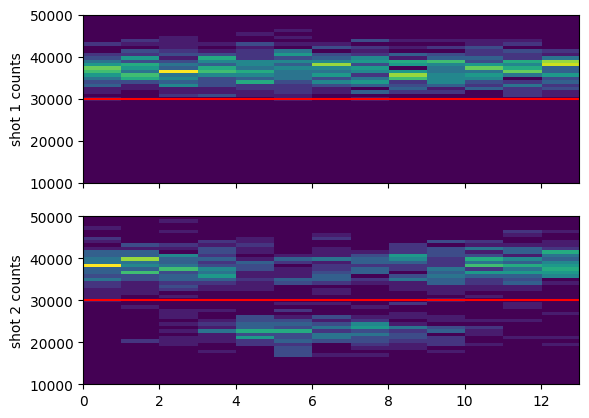

(6.9553662109375, 7.50943212890625, 0.47779272460937505, -0.292164794921875)

In [93]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 30000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    32: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

In [96]:
print("pi time",0.5/44007)

pi time 1.1361828799963642e-05


## pumping repump power scans

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':True, 't_microwave_pulse':11.3*us,'f_microwaves_dds':334680438.6307}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':True, 't_microwave_pulse':11.3*us,'f_microwaves_dds':334680438.6307}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':True, 't_microwave_pulse':11.3*us,'f_microwaves_dds':334680438.6307}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':True, 't_microwave_pulse':11.3*us,'f_microwaves_dds':334680438.6307}


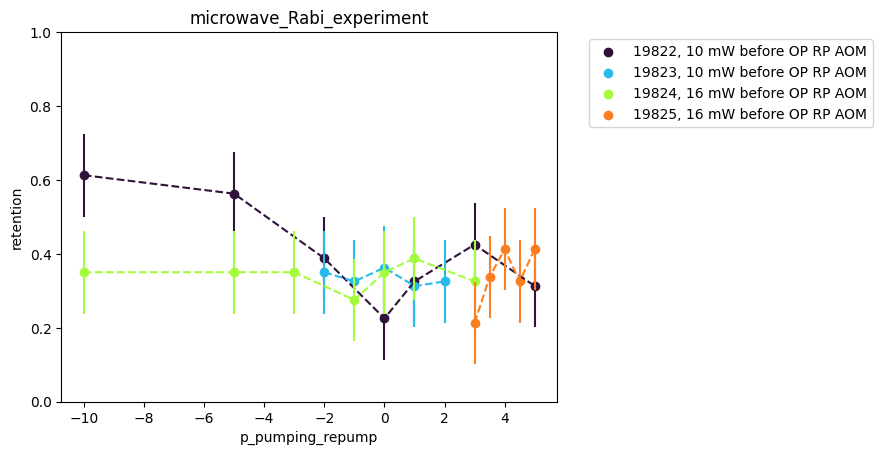

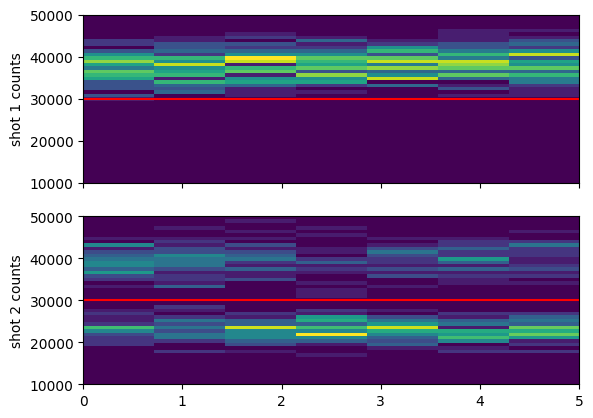

(6.9553662109375, 7.50943212890625, 0.47779272460937505, -0.292164794921875)

In [114]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

cutoff1 = cutoff2 = 30000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {

    ### 7.7 mW before the pumping RP AOM:
    # 14: 'Pumping repumper blocked',
    # # 16: 'D1 blocked',
    # 24: 'D1 blocked',
    # 28: 'D1 blocked',
    # 30: '',
    # # 38: 'with microwave pi pulse' # accidentally still had pumping repump blocked
    # 55: 'with microwave pi pulse',
    # 60: 'with microwave pi pulse',
    # 62: 'with microwave pi pulse'

    ### 10 mW before the pumping RP AOM:
    64: '10 mW before OP RP AOM',
    66: '10 mW before OP RP AOM',

    ### 16 mW before the pumping RP AOM:
    68: '16 mW before OP RP AOM',
    70: '16 mW before OP RP AOM',
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

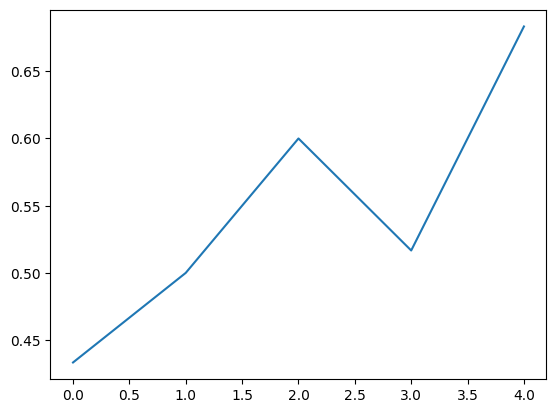

In [78]:
plt.plot(loading_rate_array)

(array([ 1.,  3.,  3.,  3.,  6.,  8.,  9.,  6.,  9., 10.,  6.,  7.,  5.,
         3.,  1.,  0.,  3.,  0.,  0.,  0.,  1.,  0.,  2.,  3.,  7.,  2.,
         7., 12., 15.,  4., 16., 14., 14., 14., 12., 15., 14., 18., 14.,
        12.,  6.,  4.,  4.,  3.,  0.,  2.,  1.,  0.,  0.,  1.]),
 array([362.  , 374.26, 386.52, 398.78, 411.04, 423.3 , 435.56, 447.82,
        460.08, 472.34, 484.6 , 496.86, 509.12, 521.38, 533.64, 545.9 ,
        558.16, 570.42, 582.68, 594.94, 607.2 , 619.46, 631.72, 643.98,
        656.24, 668.5 , 680.76, 693.02, 705.28, 717.54, 729.8 , 742.06,
        754.32, 766.58, 778.84, 791.1 , 803.36, 815.62, 827.88, 840.14,
        852.4 , 864.66, 876.92, 889.18, 901.44, 913.7 , 925.96, 938.22,
        950.48, 962.74, 975.  ]),
 <BarContainer object of 50 artists>)

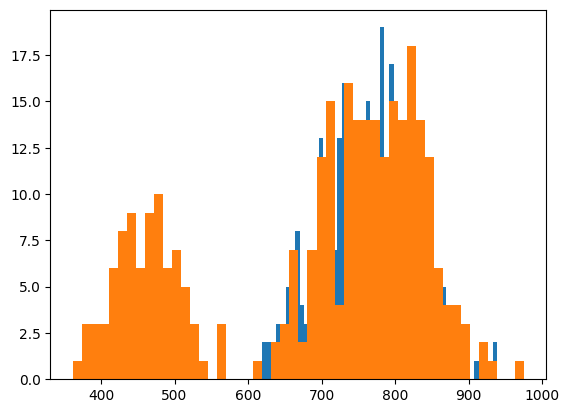

In [80]:
plt.hist(photocounts,bins=50)
plt.hist(photocounts2,bins=50)

# 2024.11.28

In [86]:
fnames = get_files_by_criteria(date_filters=["2024-11-28"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 26 files
file 0 (...results\2024-11-28\20\000019732-GeneralVariableScan.h5) scanned over p_pumping_repump
file 2 (...results\2024-11-28\21\000019736-GeneralVariableScan.h5) scanned over p_pumping_repump
file 4 (...results\2024-11-28\21\000019738-GeneralVariableScan.h5) scanned over p_pumping_repump
file 6 (...results\2024-11-28\21\000019740-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 8 (...results\2024-11-28\21\000019741-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 10 (...results\2024-11-28\21\000019743-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 12 (...results\2024-11-28\22\000019746-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 14 (...results\2024-11-28\22\000019747-GeneralVariableScan.h5) scanned over p_excitation
file 15 (...results\2024-11-28\22\000019749-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 17 (...results\2024-11-28\22\000019752-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 19 (...results\

### Rabi

In [84]:
28000*t_SPCM_first_shot

560.0

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334682901.8277}
r=0.9984, Omega/2*pi=45099.9227, C=0.7698, tau=0.0004


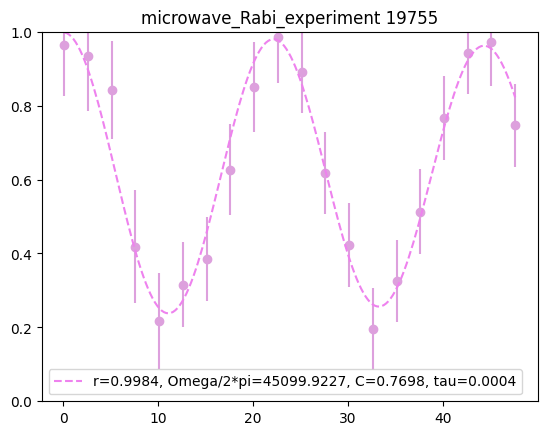

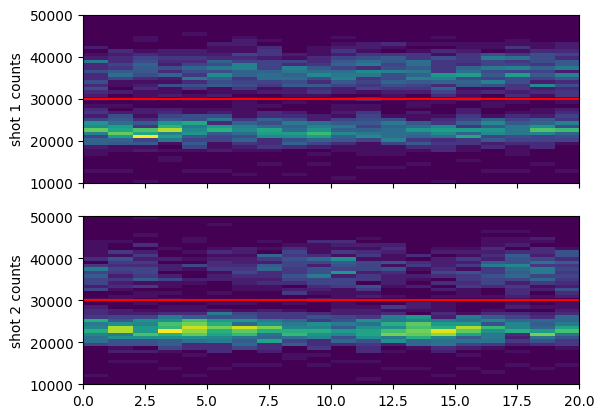

(6.9553662109375, 7.50943212890625, 0.47779272460937505, -0.292164794921875)

In [87]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = True # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 600 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 530
# cutoff2 = 560 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    22: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': r"t_microwave_pulse ($\mu$s)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            # if not showloading:
            # ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')

title = experiment_function+' '+str(rid)
if not compare or len(file_indices)==1:
    ax_ret.set_title(title)
elif merge_data:
    title = experiment_function+' '+ rid_str[:-2]
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

# ax.set_xlabel('t_m)

plt.savefig(title.replace(',','_') + '.svg', bbox_inches='tight')


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')

plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

### microwave frequency scan

In [103]:
29000*t_SPCM_first_shot

580.0

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':10*us}
r=0.7719, sigma=23723.1457, f0=334680438.6307, C=0.6620


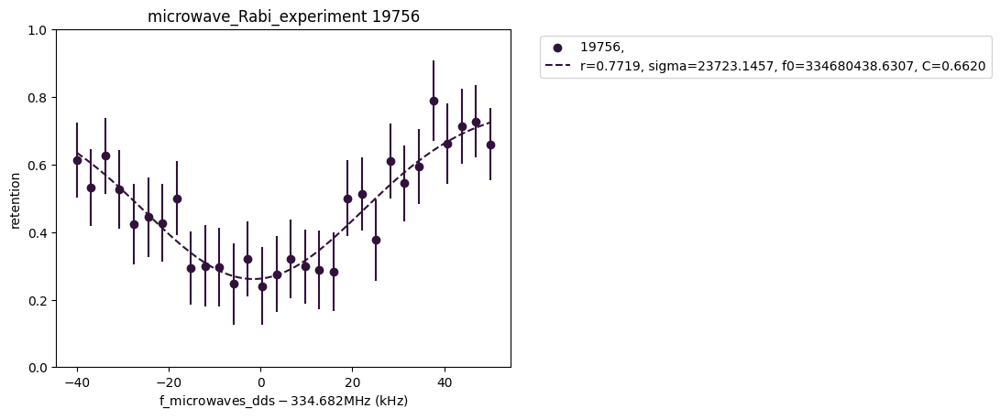

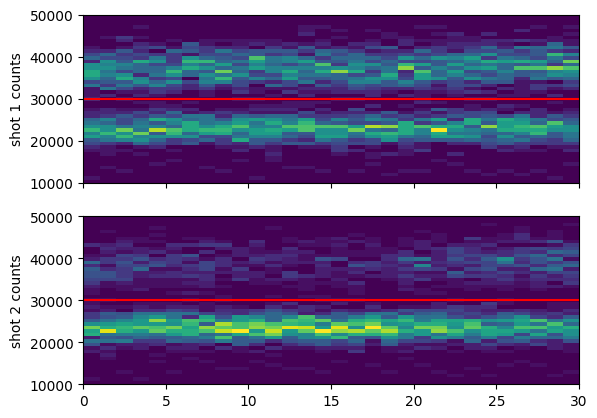

(6.9553662109375, 7.50943212890625, 0.47779272460937505, -0.292164794921875)

In [36]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 600 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 550
# cutoff2 = 550 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    24:''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

### 2024-11-27 PR power scan

In [27]:
30000*t_SPCM_first_shot

600.0

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334682901.8277, 't_microwave_pulse':10*us}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':10*us,'f_microwaves_dds':334682901.8277}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':10*us,'f_microwaves_dds':334680438.6307}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':10*us,'f_microwaves_dds':334680438.6307}
iteration 4, no measurements
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':10*us,'f_microwaves_dds':334680438.6307}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_mi

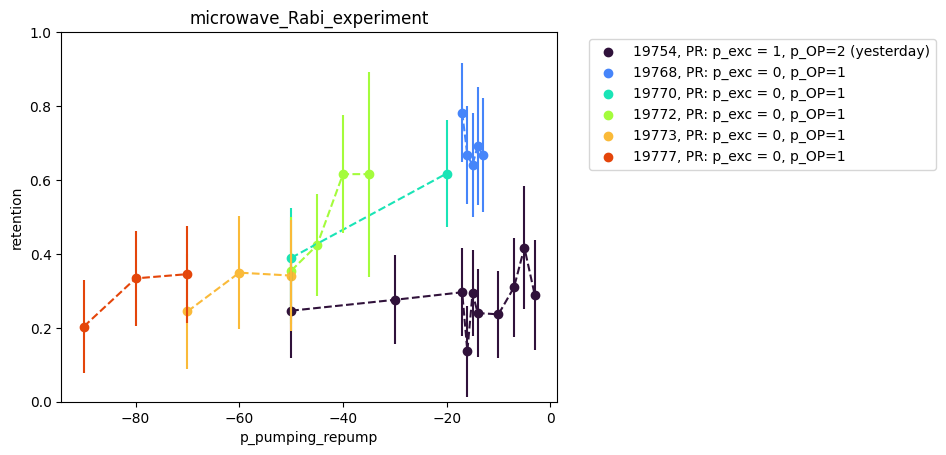

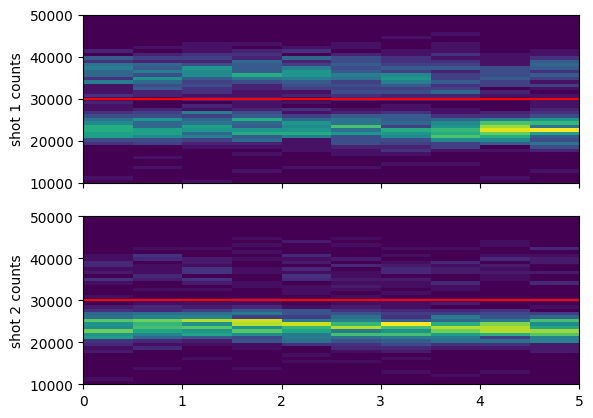

(6.9553662109375, 7.50943212890625, 0.47779272460937505, -0.292164794921875)

In [58]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

cutoff1 = cutoff2 = 600 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # p_exc = 1, p_OP=2
    20: 'PR: p_exc = 1, p_OP=2 (yesterday)',
    29: 'PR: p_exc = 0, p_OP=1',
    33: 'PR: p_exc = 0, p_OP=1',
    35: 'PR: p_exc = 0, p_OP=1',
    37: 'PR: p_exc = 0, p_OP=1',
    39: 'PR: p_exc = 0, p_OP=1'
    
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

### 2024-11-27 OP power scan

In [128]:
29000*t_SPCM_first_shot

580.0

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334682901.8277, 't_microwave_pulse':10*us}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334682901.8277, 't_microwave_pulse':10*us}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':10*us}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334682901.8277, 't_microwave_pulse':10*us, 'p_excitation':1}
iteration 0, no measurements


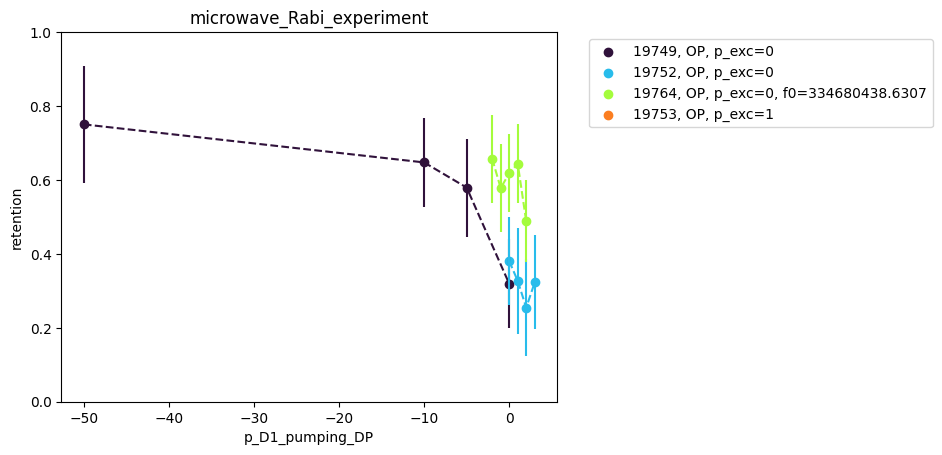

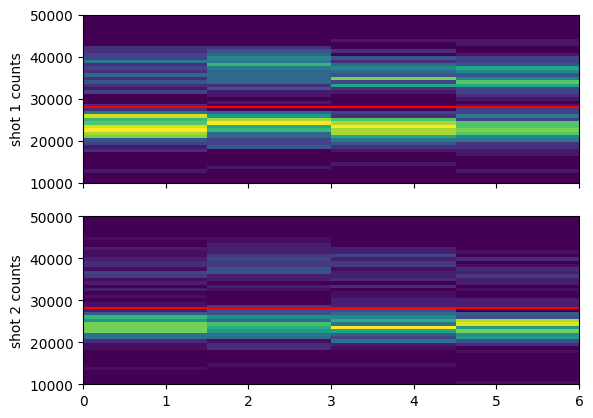

(6.9553662109375, 7.50943212890625, 0.47779272460937505, -0.292164794921875)

In [39]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

cutoff1 = cutoff2 = 562 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    ## p_excitation = 0
    # 10: 'OP', # before optimizing fiber coupling to GRIN1 fiber bench
    # 12: 'OP' # before optimizing fiber coupling to GRIN1 fiber bench
    15: 'OP, p_exc=0', # after optimizing fiber coupling to GRIN1 fiber bench: p_excitation = 0
    17: 'OP, p_exc=0', # after optimizing fiber coupling to GRIN1 fiber bench: p_excitation = 0
    27: 'OP, p_exc=0, f0=334680438.6307',
    ## p_excitation = 1, p_D1 = 2
    19: 'OP, p_exc=1'
    
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

# 2024.11.27

In [8]:
fnames = get_files_by_criteria(date_filters=["2024-11-27"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 9 files
file 0 (...results\2024-11-27\14\000019696-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 1 (...results\2024-11-27\14\000019697-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 3 (...results\2024-11-27\15\000019700-GeneralVariableScan.h5) scanned over p_pumping_repump
file 5 (...results\2024-11-27\15\000019701-GeneralVariableScan.h5) scanned over p_pumping_repump
file 7 (...results\2024-11-27\16\000019706-GeneralVariableScan.h5) scanned over p_pumping_repump
skipped 4 redundant files
2 scan_variables over 5 variable scans


### 2024-11-27 PR power scan

In [128]:
29000*t_SPCM_first_shot

580.0

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':True, 'f_microwaves_dds':334682901.8277, 't_microwave_pulse':10*us}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':True, 'f_microwaves_dds':334682901.8277, 't_microwave_pulse':10*us}
iteration 5, no measurements
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':True, 'f_microwaves_dds':334682901.8277, 't_microwave_pulse':10*us}


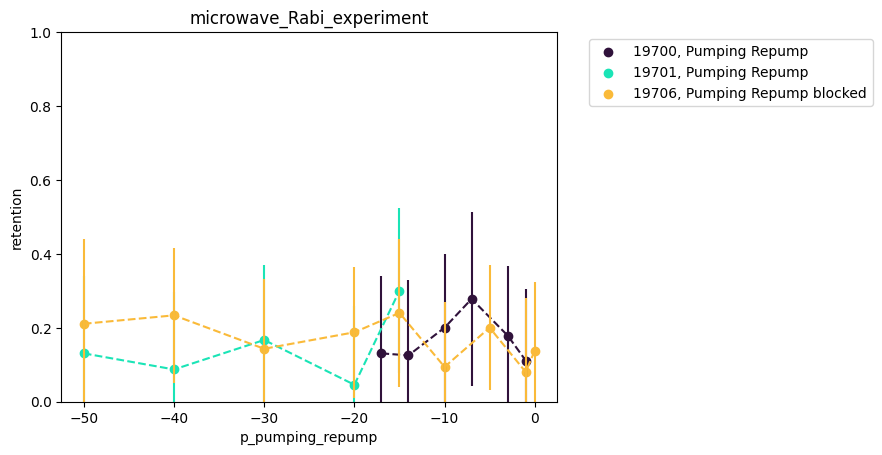

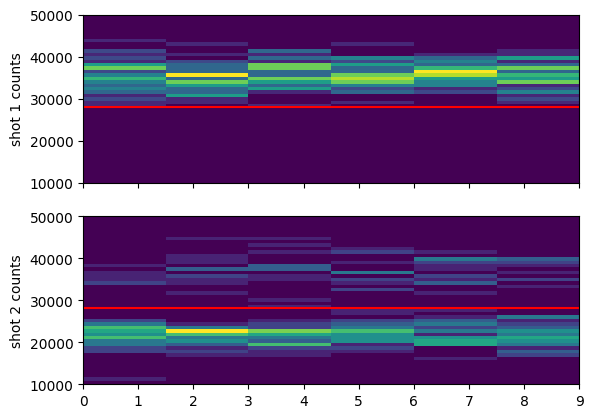

(6.9553662109375, 7.50943212890625, 0.47779272460937505, -0.292164794921875)

In [133]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 562 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    3: 'Pumping Repump',
    5: 'Pumping Repump',
    7: 'Pumping Repump blocked'
    # 8: 'OP',
    # 12: 'OP',
    # 24: 'OP repump',
    # 26: 'OP repump',
    # 35: 'OP repump, after increasing optical power by x5',
    # 30: 'OP repump, physically blocked',
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

# 2024.11.26

In [123]:
fnames = get_files_by_criteria(date_filters=["2024-11-25", "2024-11-26"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 48 files
file 0 (...results\2024-11-25\13\000019612-GeneralVariableScan.h5) scanned over p_pumping_repump
file 2 (...results\2024-11-25\14\000019617-GeneralVariableScan.h5) scanned over p_pumping_repump
file 4 (...results\2024-11-25\14\000019618-GeneralVariableScan.h5) scanned over p_pumping_repump
file 6 (...results\2024-11-25\14\000019619-GeneralVariableScan.h5) scanned over p_pumping_repump
file 8 (...results\2024-11-25\15\000019620-GeneralVariableScan.h5) scanned over p_pumping_repump
file 10 (...results\2024-11-25\16\000019621-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 12 (...results\2024-11-25\16\000019622-GeneralVariableScan.h5) scanned over dummy_variable
file 14 (...results\2024-11-25\16\000019623-GeneralVariableScan.h5) scanned over dummy_variable
file 16 (...results\2024-11-25\16\000019629-GeneralVariableScan.h5) scanned over dummy_variable
file 17 (...results\2024-11-25\17\000019631-GeneralVariableScan.h5) scanned over dummy_variable
file 18 (...results

### Rabi

In [99]:
28000*t_SPCM_first_shot

560.0

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334682901.8277}
r=0.9742, Omega/2*pi=44865.1040, C=0.8114, tau=0.0005


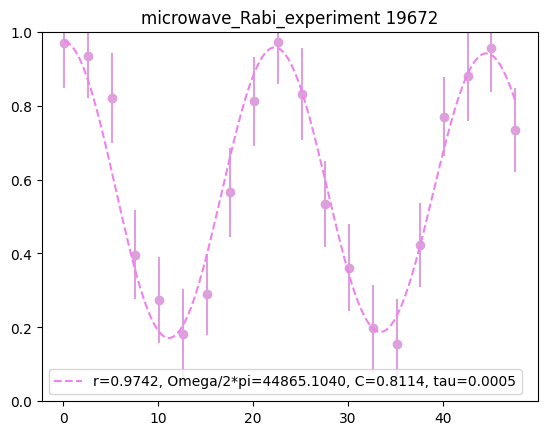

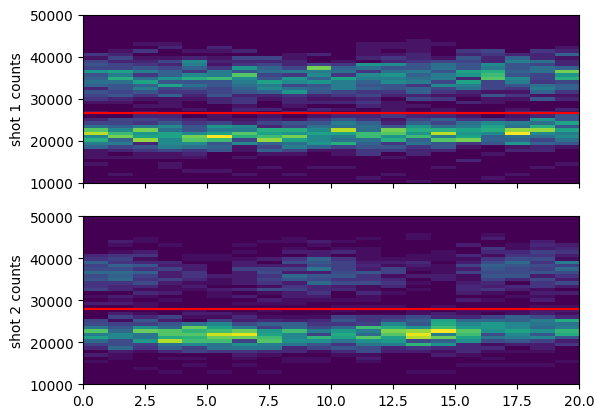

(6.955, 7.504, 0.559, -0.342)

In [124]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = True # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

# cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
cutoff1 = 530
cutoff2 = 560 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    46: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': r"t_microwave_pulse ($\mu$s)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            # if not showloading:
            # ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')

title = experiment_function+' '+str(rid)
if not compare or len(file_indices)==1:
    ax_ret.set_title(title)
elif merge_data:
    title = experiment_function+' '+ rid_str[:-2]
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

# ax.set_xlabel('t_m)

plt.savefig(title.replace(',','_') + '.svg', bbox_inches='tight')


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')

plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

### microwave frequency scan

In [103]:
29000*t_SPCM_first_shot

580.0

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':10*us}
r=0.9133, sigma=36254.0987, f0=334682901.8277, C=0.6547


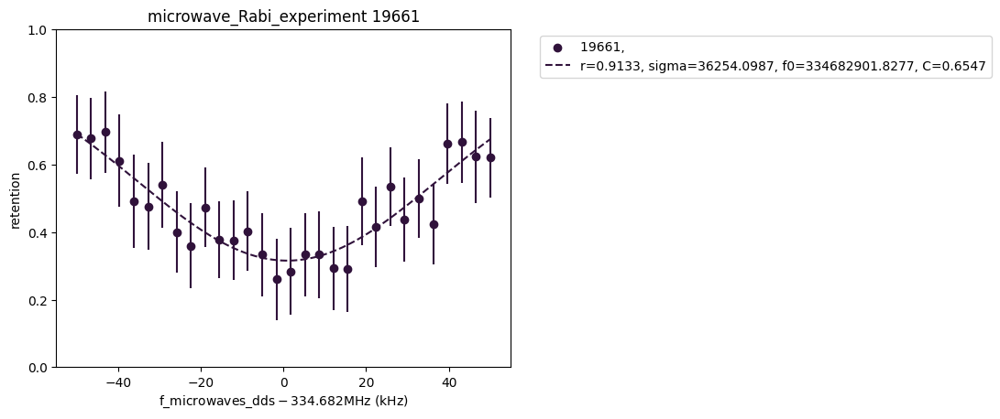

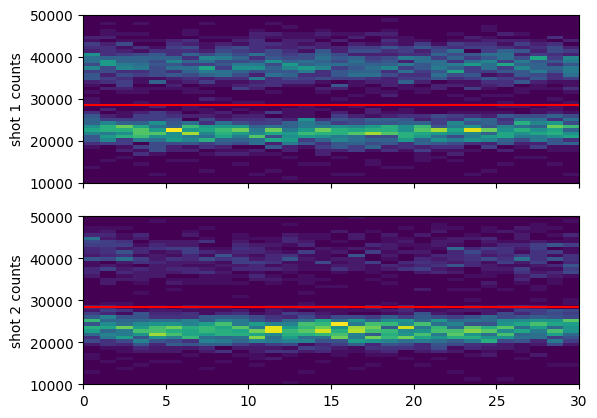

(5.958021240234375, 6.500978759765625, 0.44196508789062505, -0.32619189453125)

In [119]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 570 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 550
# cutoff2 = 550 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    34:''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

## 2024.11.24 - tuning in optical pumping 

In [110]:
fnames = get_files_by_criteria(date_filters=["2024-11-24"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 10 files
file 0 (...results\2024-11-24\15\000019550-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 2 (...results\2024-11-24\15\000019551-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 4 (...results\2024-11-24\16\000019553-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 6 (...results\2024-11-24\18\000019565-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_RO'", "'AZ_top_volts_RO'", "'AX_volts_RO'", "'AY_volts_RO'"] for 'atom_retention_and_loading_cost'
file 8 (...results\2024-11-24\18\000019566-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'", "'set_point_PD1_AOM_A1'", "'set_point_PD2_AOM_A2'", "'set_point_PD3_AOM_A3'", "'set_point_PD4_AOM_A4'", "'set_point_PD5_AOM_A5'", "'set_point_PD6_AOM_A6'"] for 'atom_loading_cost'
skipped 5 redundant files
3 scan_variables over 3 variable scans


### Rabi

In [99]:
28000*t_SPCM_first_shot

560.0

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334688576.6805}
iteration 18, no measurements
r=0.9426, Omega/2*pi=43424.2235, C=0.6858, tau=1.0000


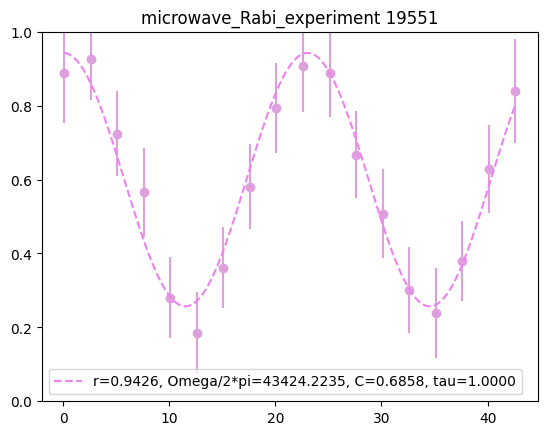

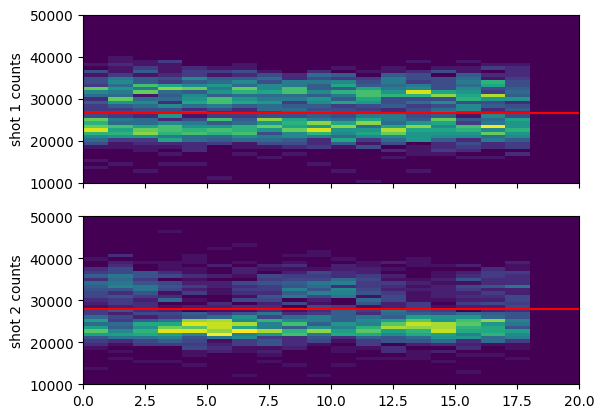

(6.975924350160151, 7.521880172988458, 0.596, -0.32061647218087713)

In [102]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = True # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

# cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
cutoff1 = 530
cutoff2 = 560 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    2: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': r"t_microwave_pulse ($\mu$s)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            # if not showloading:
            # ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')

title = experiment_function+' '+str(rid)
if not compare or len(file_indices)==1:
    ax_ret.set_title(title)
elif merge_data:
    title = experiment_function+' '+ rid_str[:-2]
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

# ax.set_xlabel('t_m)

plt.savefig(title.replace(',','_') + '.svg', bbox_inches='tight')


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')

plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

### microwave frequency scan

In [103]:
29000*t_SPCM_first_shot

580.0

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':15*us}
r=0.8320, sigma=17558.3446, f0=334688576.6805, C=0.5879


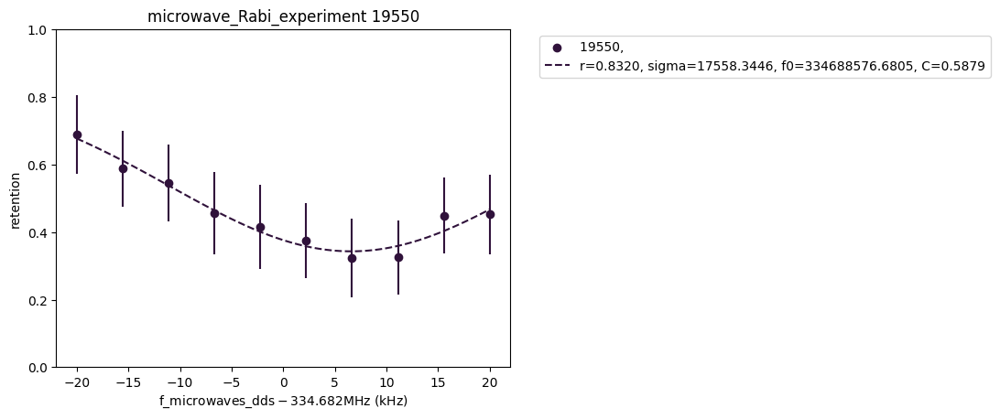

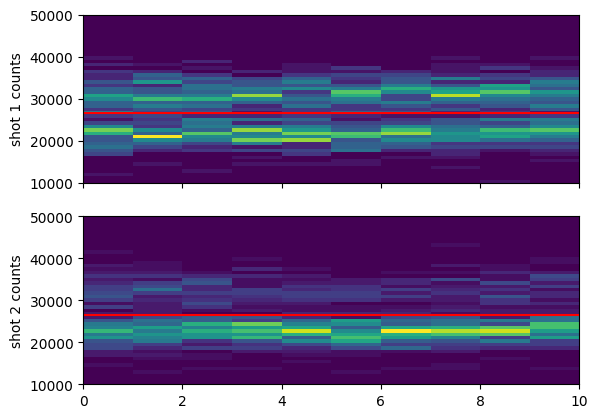

(6.975924350160151, 7.521880172988458, 0.596, -0.32061647218087713)

In [106]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 530 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 550
# cutoff2 = 550 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    0:''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

## 2024.11.19 - tuning in optical pumping 

In [2]:
fnames = get_files_by_criteria(date_filters=["2024-11-19"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 47 files
file 0 (...results\2024-11-19\10\000019184-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 2 (...results\2024-11-19\10\000019186-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 4 (...results\2024-11-19\11\000019187-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 6 (...results\2024-11-19\14\000019188-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 8 (...results\2024-11-19\15\000019189-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 10 (...results\2024-11-19\15\000019190-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 12 (...results\2024-11-19\15\000019191-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 14 (...results\2024-11-19\16\000019192-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 16 (...results\2024-11-19\16\000019193-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 18 (...results\2024-11-19\17\000019194-GeneralVariableScan.h5) scanned over AX_volts_OP
file 20 (...re

### Rabi

In [53]:
35000*t_SPCM_first_shot

700.0

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':10*us}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':10*us}
r=0.9334, Omega/2*pi=46534.1469, C=0.8401, tau=0.0958
saved file to  microwave_Rabi_experiment 19212_ 19211.svg


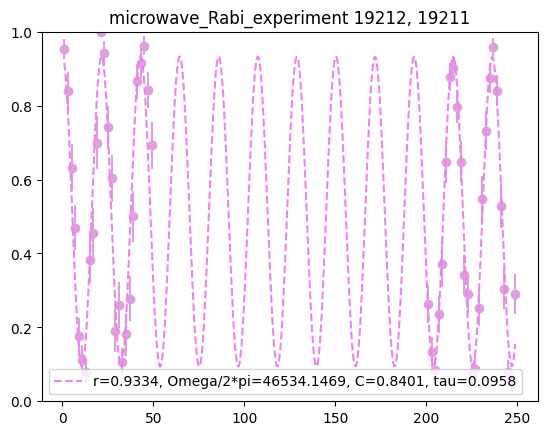

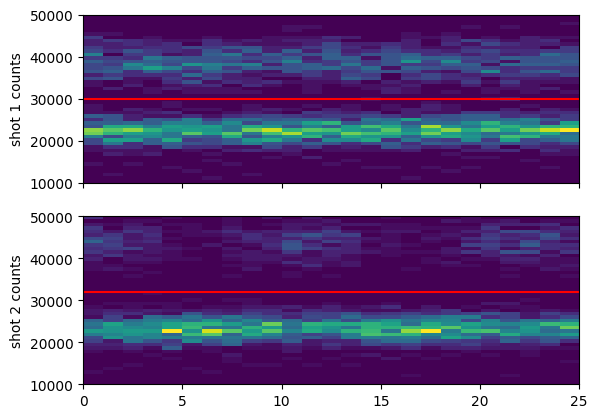

(6.974218017578125, 7.525364990234375, 0.496196044921875, -0.2810302734375)

In [9]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = True # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

# cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
cutoff1 = 600
cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    45: '',
    43: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': r"t_microwave_pulse ($\mu$s)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        # errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        errs = binomial_err(n_loaded, retention)

        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            # if not showloading:
            # ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            # errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            errs = binomial_err(n_loaded, loading)
            
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')

title = experiment_function+' '+str(rid)
if not compare or len(file_indices)==1:
    ax_ret.set_title(title)
elif merge_data:
    title = experiment_function+' '+ rid_str[:-2]
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

# ax.set_xlabel('t_m)

savename = title.replace(',','_') + '.svg'
plt.savefig(savename, bbox_inches='tight')
print("saved file to ", savename)
if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')

plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

In [92]:
xlabel

't_microwave_pulse (us)'

In [88]:
',_,'.replace(',','0')

'0_0'

### OP shim scans

In [53]:
35000*t_SPCM_first_shot

700.0

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334686609.0, 't_microwave_pulse':10*us, 'p_D1_pumping_DP':-5.0}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334686609.0, 't_microwave_pulse':10*us, 'p_D1_pumping_DP':-5.0}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334686609.0, 't_microwave_pulse':10*us, 'p_D1_pumping_DP':-5.0}


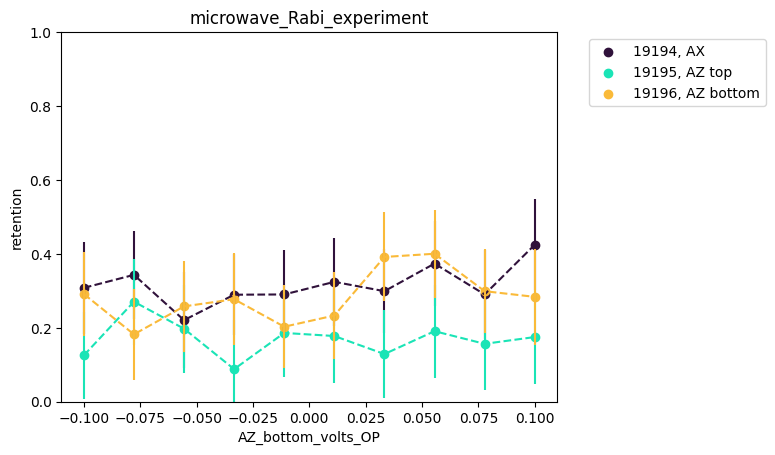

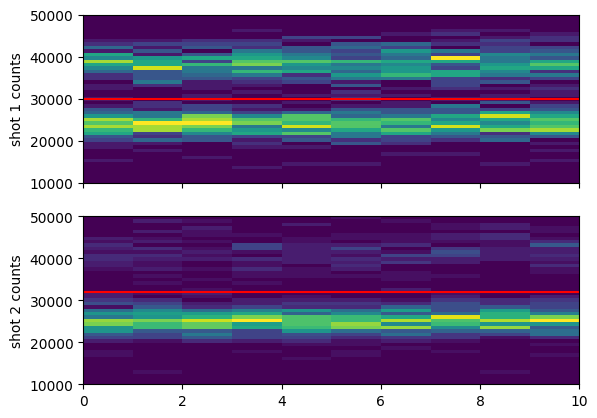

(6.974218017578125, 7.525364990234375, 0.496196044921875, -0.2810302734375)

In [66]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

# cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
cutoff1 = 600
cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    18: 'AX',
    20: 'AZ top',
    22: 'AZ bottom'
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

In [65]:
np.linspace(-0.1,0.1,10)

array([-0.1       , -0.07777778, -0.05555556, -0.03333333, -0.01111111,
        0.01111111,  0.03333333,  0.05555556,  0.07777778,  0.1       ])

### OP power scan

In [53]:
35000*t_SPCM_first_shot

700.0

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334686609.0, 't_microwave_pulse':10*us}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334686609.0, 't_microwave_pulse':10*us}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334686609.0, 't_microwave_pulse':10*us, 'p_D1_pumping_DP':-5.0}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334686609.0, 't_microwave_pulse':10*us, 'p_D1_pumping_DP':-5.0}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334686609.0, 't_microwave_pulse':10*us, 'p_D1_pumping_DP':-5.0}
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_

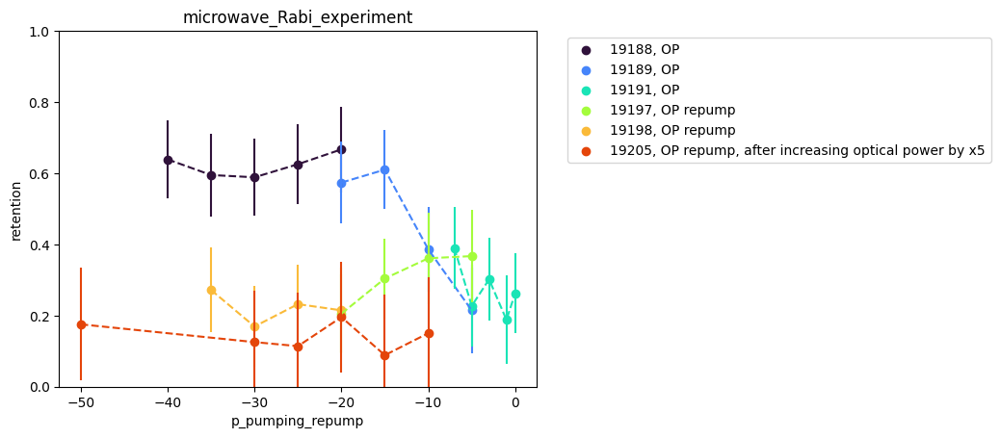

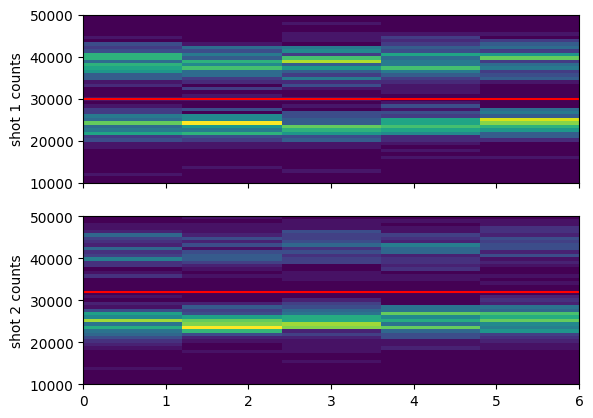

(6.974218017578125, 7.525364990234375, 0.496196044921875, -0.2810302734375)

In [78]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

# cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
cutoff1 = 600
cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    6: 'OP',
    8: 'OP',
    12: 'OP',
    24: 'OP repump',
    26: 'OP repump',
    35: 'OP repump, after increasing optical power by x5',
    # 30: 'OP repump, physically blocked',
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

### microwave frequency scan

In [53]:
35000*t_SPCM_first_shot

700.0

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334686609.0, 't_microwave_pulse':10*us, 'p_D1_pumping_DP':-5.0}
r=0.9708, sigma=41572.1785, f0=334684101.1312, C=0.6957


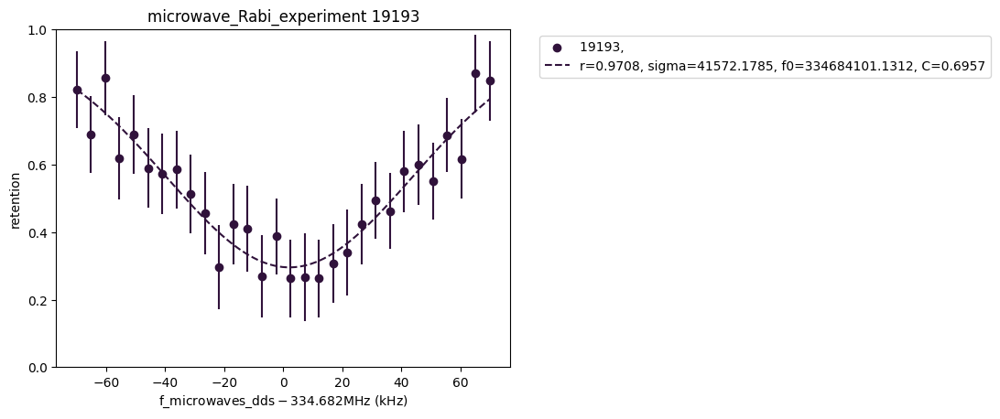

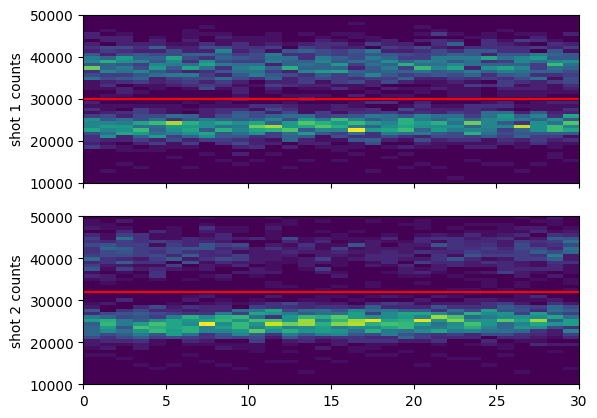

(6.974218017578125, 7.525364990234375, 0.496196044921875, -0.2810302734375)

In [75]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

# cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
cutoff1 = 600
cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    16:''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

### microwave time scan


In [53]:
35000*t_SPCM_first_shot

700.0

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334686609.0, 't_microwave_pulse':10*us}
r=1.0000, Omega/2*pi=45773.6258, C=0.5000, tau=0.0001
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334686609.0, 't_microwave_pulse':10*us}
r=1.0000, Omega/2*pi=44748.3034, C=0.5000, tau=0.0001
experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334686609.0, 't_microwave_pulse':10*us, 'p_D1_pumping_DP':-5.0}
r=0.9673, Omega/2*pi=40347.4587, C=0.6978, tau=1.0000


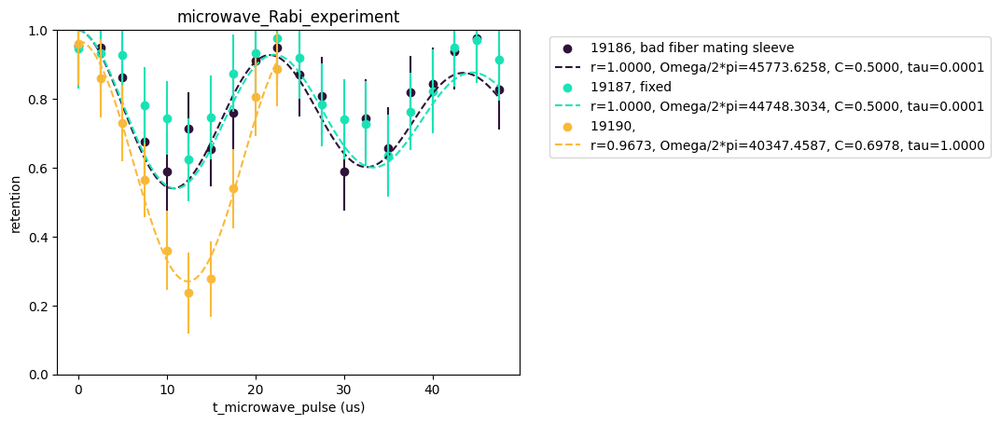

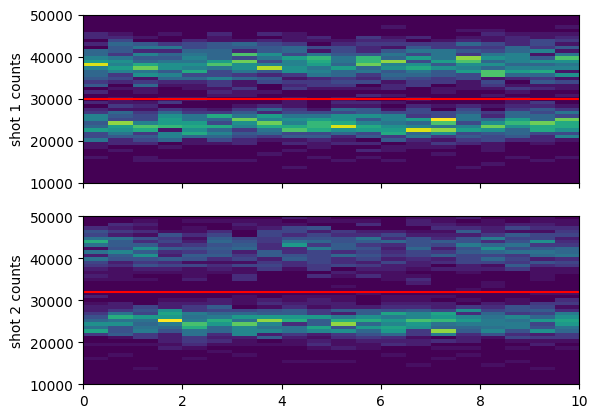

(6.974218017578125, 7.525364990234375, 0.496196044921875, -0.2810302734375)

In [62]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

# cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
cutoff1 = 600
cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    2: 'bad fiber mating sleeve',
    4: 'fixed',
    10:''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

## 2024.11.18 After MOT lasers rebuild

In [39]:
np.linspace(-30, 30, 20)

array([-30.        , -26.84210526, -23.68421053, -20.52631579,
       -17.36842105, -14.21052632, -11.05263158,  -7.89473684,
        -4.73684211,  -1.57894737,   1.57894737,   4.73684211,
         7.89473684,  11.05263158,  14.21052632,  17.36842105,
        20.52631579,  23.68421053,  26.84210526,  30.        ])

In [48]:
fnames = get_files_by_criteria(date_filters=["2024-11-18"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 19 files
file 0 (...results\2024-11-18\11\000019163-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 1 (...results\2024-11-18\11\000019165-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 3 (...results\2024-11-18\11\000019166-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 5 (...results\2024-11-18\12\000019168-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 7 (...results\2024-11-18\12\000019169-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 9 (...results\2024-11-18\12\000019170-GeneralVariableScan.h5) scanned over p_D1_pumping_DP
file 11 (...results\2024-11-18\13\000019173-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 13 (...results\2024-11-18\13\000019174-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 15 (...results\2024-11-18\14\000019175-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 17 (...results\2024-11-18\15\000019177-GeneralVariableScan.h5) scanned over t_microwave_pulse
skipped 9 r

### microwave time scan


In [53]:
35000*t_SPCM_first_shot

700.0

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 'f_microwaves_dds':334686609.0}
r=1.0000, Omega/2*pi=45042.1742, C=0.5000, tau=0.0000


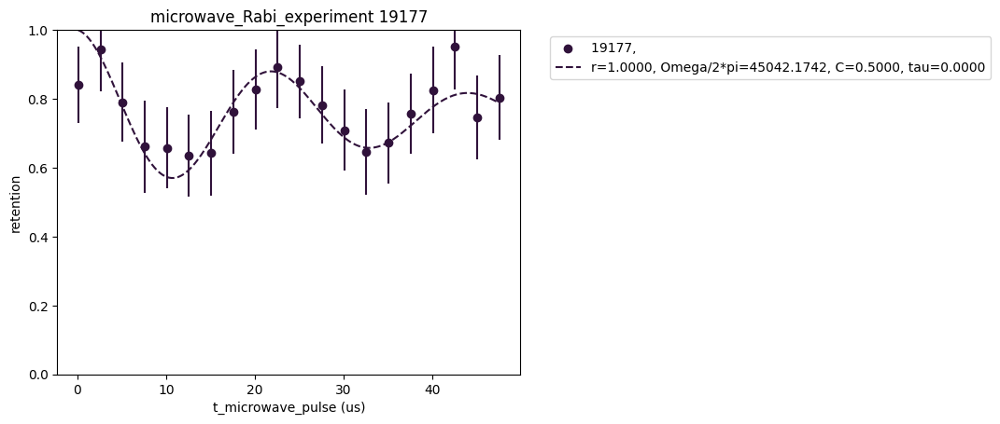

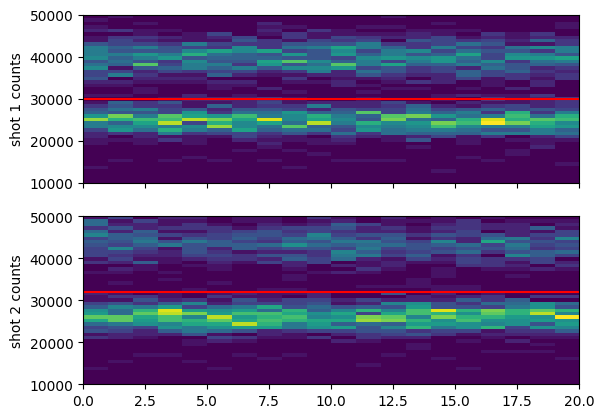

(6.974218017578125, 7.525364990234375, 0.496196044921875, -0.2810302734375)

In [54]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

# cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
cutoff1 = 600
cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    17: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

### microwave frequency scan: t_microwave_pulse = 15us


In [34]:
30000*t_SPCM_first_shot

600.0

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':15*us}


RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.

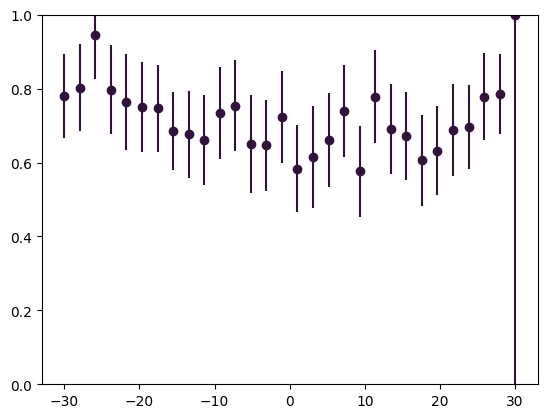

In [47]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

# cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
cutoff1 = cutoff2 = 600 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    13: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

## 2024.11.08


In [39]:
np.linspace(-30, 30, 20)

array([-30.        , -26.84210526, -23.68421053, -20.52631579,
       -17.36842105, -14.21052632, -11.05263158,  -7.89473684,
        -4.73684211,  -1.57894737,   1.57894737,   4.73684211,
         7.89473684,  11.05263158,  14.21052632,  17.36842105,
        20.52631579,  23.68421053,  26.84210526,  30.        ])

In [30]:
fnames = get_files_by_criteria(date_filters=["2024-11-08"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 10 files
file 0 (...results\2024-11-08\09\000019064-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_RO'", "'AZ_top_volts_RO'", "'AX_volts_RO'", "'AY_volts_RO'"] for 'atom_retention_cost'
file 2 (...results\2024-11-08\10\000019066-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_cost'
file 4 (...results\2024-11-08\11\000019067-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_RO'", "'AZ_top_volts_RO'", "'AX_volts_RO'", "'AY_volts_RO'"] for 'atom_retention_and_loading_cost'
file 6 (...results\2024-11-08\12\000019069-GeneralVariableOptimizer_atom_loading_optimized_for_atom_retention_and_loading.h5) optimized ["'AZ_bottom_volts_RO'", "'AZ_top_volts_RO'", "'AX_volts_RO'", "'AY_volts_RO'"] for 'atom_retention_and_loading_cost'
file 7 (...results\2024-11-08\12\000019070-GeneralVariableOptimizer_atom_loading_optimized_for_atom_loading.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_

### microwave frequency scan: t_microwave_pulse = 15us


In [34]:
30000*t_SPCM_first_shot

600.0

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4, 'require_atom_loading_to_advance':False, 't_microwave_pulse':15*us}
r=1.5914, sigma=43162.0424, f0=334686609.0054, C=0.5804


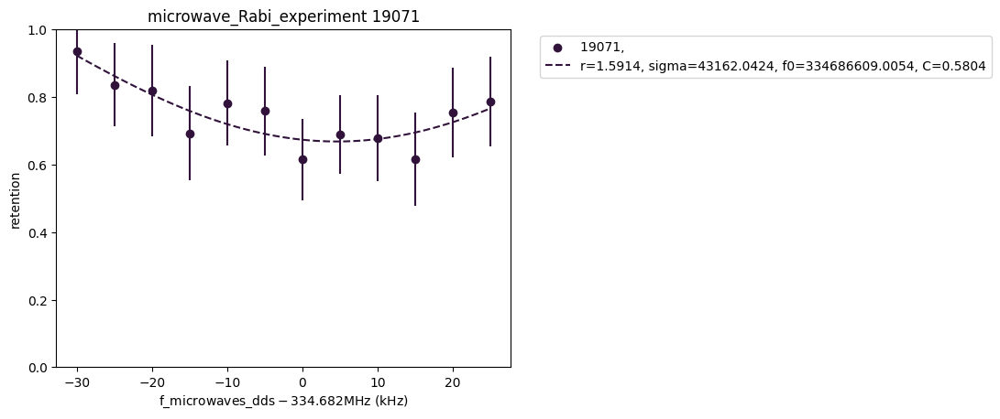

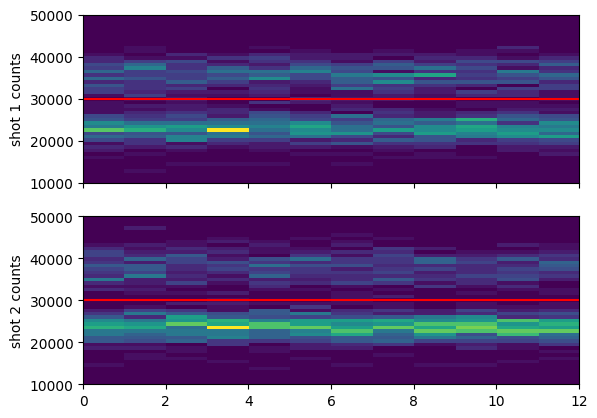

(6.792866340195949, 7.244518850482369, 0.546496246286349, -0.2383127515286812)

In [35]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

# cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
cutoff1 = cutoff2 = 600 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    8: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

In [36]:
334686609.0054 - f_dds_clock_resonance

4609.005400002003

## 2024.11.06


In [26]:
fnames = get_files_by_criteria(date_filters=["2024-11-05","2024-11-06"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 51 files
file 0 (...results\2024-11-05\14\000018928-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_cost'
file 1 (...results\2024-11-05\16\000018942-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 2 (...results\2024-11-05\16\000018944-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 4 (...results\2024-11-05\16\000018945-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 6 (...results\2024-11-05\17\000018947-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 8 (...results\2024-11-06\09\000018949-GeneralVariableOptimizer_atom_loading_optimized_for_atom_loading.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'atom_loading_cost'
file 9 (...results\2024-11-06\10\000018953-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_MOT'", "'AZ_top_volts_MOT'", "'AX_volts_MOT'", "'AY_volts_MOT'"] for 'ato

### microwave time scan


In [50]:
29000*t_SPCM_first_shot

435.0

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4}
r=0.8608, Omega/2*pi=50341.4822, C=0.5006, tau=0.0007


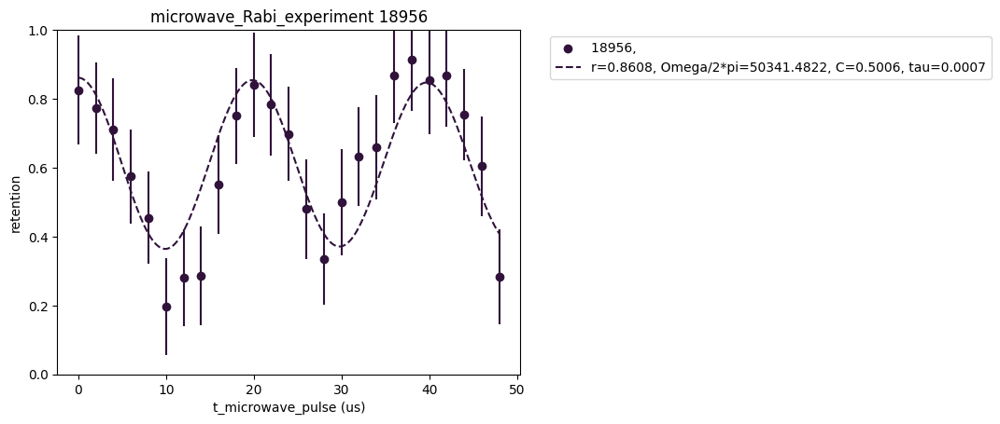

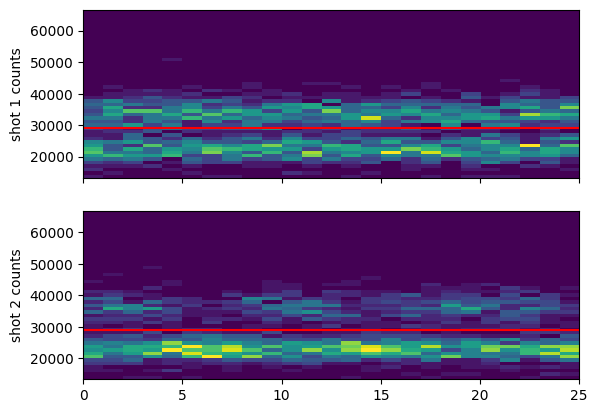

(7.01, 7.487, 0.413, -0.291)

In [28]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

# cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
cutoff1 = cutoff2 = 435 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # 6: ''  #
    11: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

### microwave frequency scan

experiment: microwave_Rabi_experiment
override: {'dummy_variable':4}
r=1.3186, sigma=27566.2477, f0=334687269.1117, C=0.6201


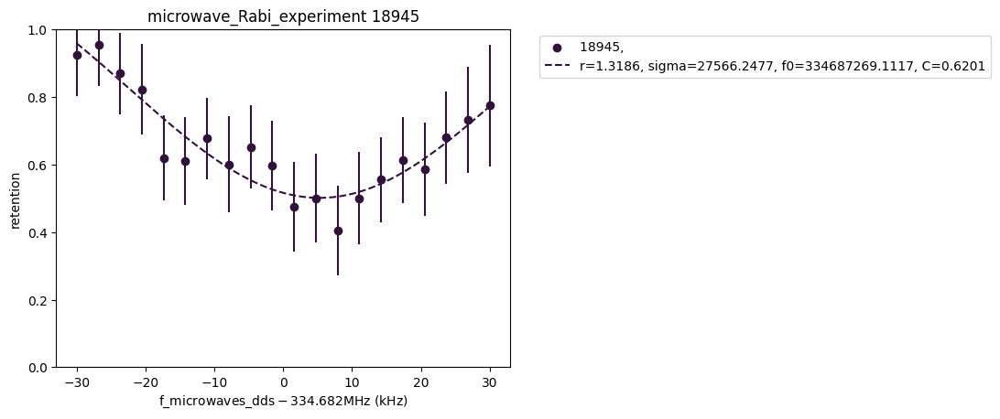

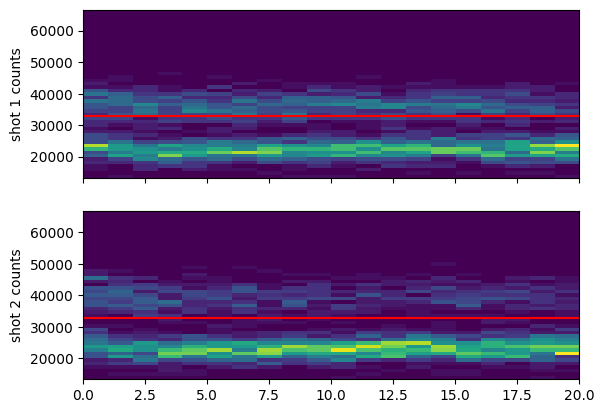

In [8]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    4: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'
# r=1.3186, sigma=27566.2477, f0=334687269.1117, C=0.6201

# fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
#             't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0.5,0],[1,1e6,1,100e-2]]}}

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit  'bounds':(-np.inf, np.inf)     
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0,0],[1,1e5,1,1e-2]]}}
            
if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [24]:
t_microwave_pulse

1.6179999999999998e-05

(array([30.,  5.,  6.,  4.,  2.,  0.,  0.,  1.,  0.,  1.]),
 array([ 0. ,  2.3,  4.6,  6.9,  9.2, 11.5, 13.8, 16.1, 18.4, 20.7, 23. ]),
 <BarContainer object of 10 artists>)

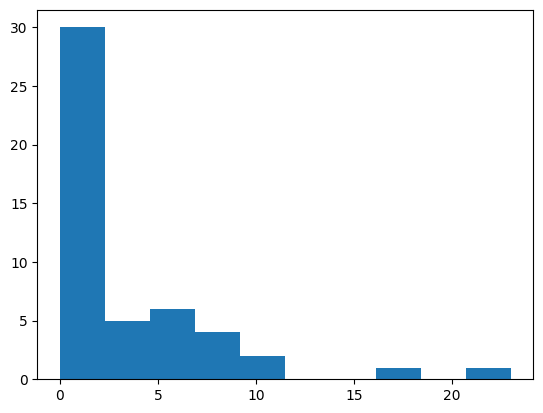

In [19]:
plt.hist(np.array(first_shot_hists[0])[0])

(array([30.,  5.,  6.,  4.,  2.,  0.,  0.,  1.,  0.,  1.]),
 array([ 0. ,  2.3,  4.6,  6.9,  9.2, 11.5, 13.8, 16.1, 18.4, 20.7, 23. ]),
 <BarContainer object of 10 artists>)

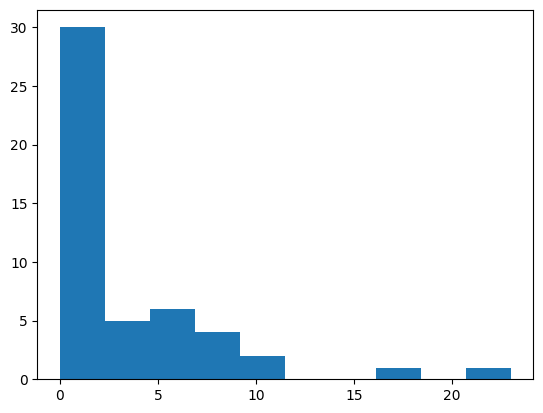

In [21]:
plt.hist(np.array(first_shot_hists)[0][0])

## 2024.09.24
This follows the interruptions we had from some Sinara issues of unknown cause, which have now been resolved. I am trying to get a microwave oscillation again to check the OP fidelity before moving to single photon experiments this week. We are foregoing chopped readout for the moment.

In [2]:
fnames = get_files_by_criteria(date_filters=["2024-09-24", "2024-09-25"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 39 files
file 0 (...results\2024-09-24\11\000017800-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 1 (...results\2024-09-24\12\000017803-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 3 (...results\2024-09-24\13\000017804-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 5 (...results\2024-09-24\13\000017805-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 7 (...results\2024-09-24\14\000017808-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 9 (...results\2024-09-24\14\000017810-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 11 (...results\2024-09-24\16\000017811-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 13 (...results\2024-09-24\16\000017814-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 15 (...results\2024-09-24\17\000017815-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 17 (...results\2024-09-24\17\000017816-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 19

### microwave time scan

experiment: microwave_Rabi_experiment
override: {'require_atom_loading_to_advance':False, 'AY_volts_OP':5.0, 'f_microwaves_dds':334690472.9}
r=0.9565, Omega/2*pi=36443.4531, C=0.8741, tau=0.0017


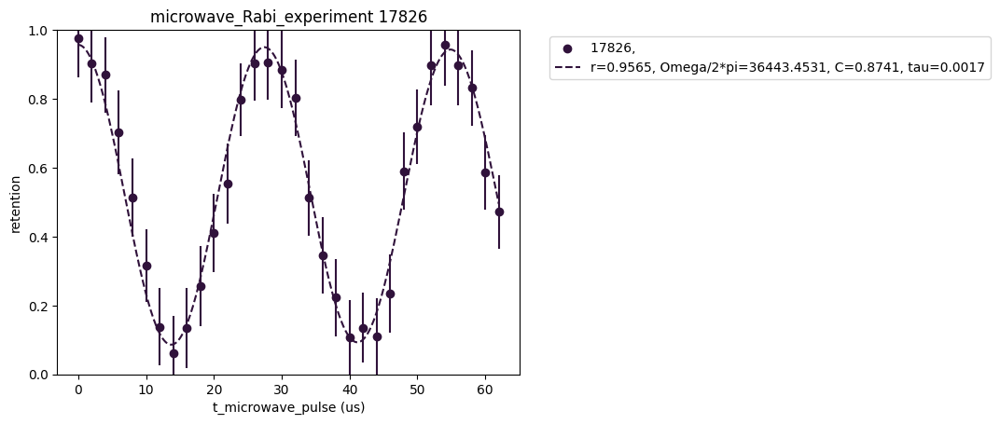

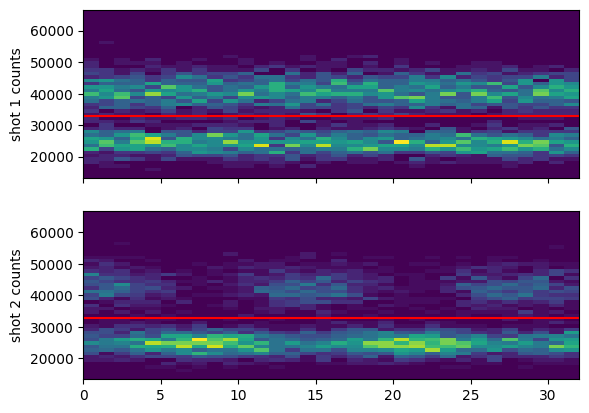

In [3]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # 9: '', # looks familiar
    # # 15: '' # OP came unlocked but didn't trip the lock monitor, so probably we need to adjust the boundaries on the card
    # 33: '',
    37: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0,0],[1,1e5,1,1e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [6]:
print(p_AOM_A1)
print(p_AOM_A2)
print(p_AOM_A3)
print(p_AOM_A4)
print(p_AOM_A5)
print(p_AOM_A6)

-15.417650207448297
-17.53117183036207
-14.809541724291089
-14.88667457050469
-19.098971049022218
-14.93247529412046


### microwave frequency scan

experiment: microwave_Rabi_experiment
override: {'require_atom_loading_to_advance':False, 'AY_volts_OP':5.0}
r=0.9190, sigma=-19087.8362, f0=334690472.9308, C=0.9033
experiment: microwave_Rabi_experiment
override: {'require_atom_loading_to_advance':False, 'AY_volts_OP':6.0, 'f_microwaves_dds':334690472.9}
r=0.9710, sigma=20675.9778, f0=334696837.4376, C=0.8570
experiment: microwave_Rabi_experiment
override: {'require_atom_loading_to_advance':False, 'AY_volts_OP':2.0, 'f_microwaves_dds':334690472.9}
r=0.9579, sigma=17307.8020, f0=334677268.6366, C=0.3763


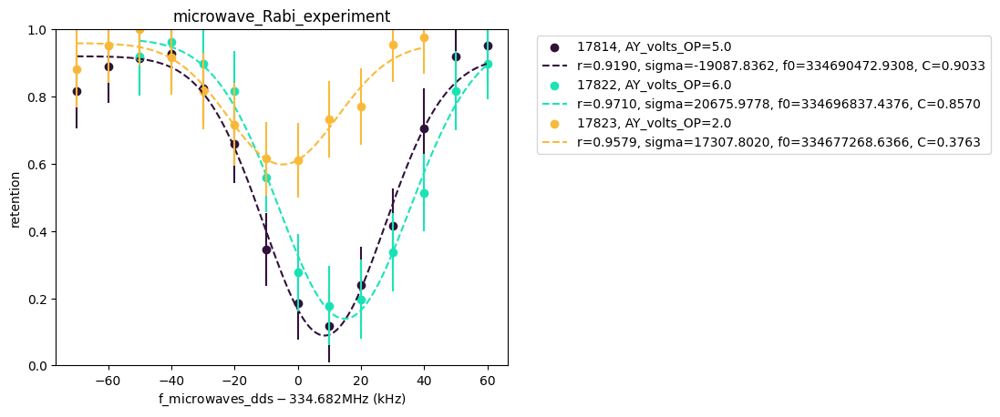

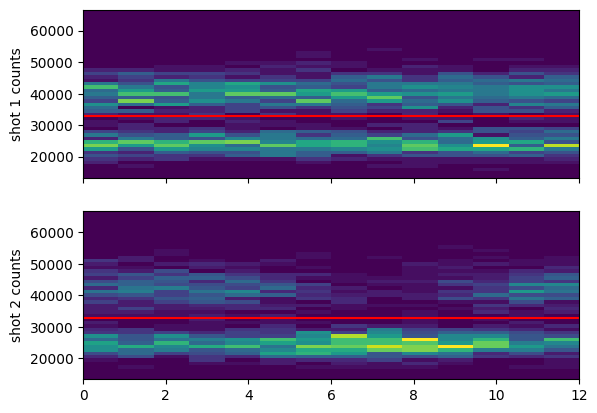

f_microwaves_dds
10000.0
333333.3333333333


In [77]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # 5: '', # loading degraded, bad result
    # 7: '' # looks familiar, good.
    # 11: '', # typical ~ 3 V AY
    13: '', # 5 V
    # 17: '', # 6 V - probably D1 OP unlocked
    # 19: '', # 2 V - probably D1 OP unlocked
    # 27: ''  # 5V - scanned again - conforms with #13. - confirmed that the parameters are still optimal
    29: '', # 6V, 
    31: '' # 2V
} # the files to plot

legend_vars =[]
legend_vars = ['AY_volts_OP'] #, 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0,0],[1,1e5,1,1e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))

            # print(fit_dict[scan_variable1_name]['params'][2], popt[2])
            
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()
print(scan_variable1_name)
print(-3.34612e+08 + 3.34622e+08)
print(1/t_OP_chop_period/2)

## 2024.09.18

In [214]:
fnames = get_files_by_criteria(date_filters=["2024-09-17", "2024-09-18"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 31 files
file 0 (...results\2024-09-17\09\000017439-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 2 (...results\2024-09-17\11\000017441-GeneralVariableScan.h5) scanned over t_pumping
file 4 (...results\2024-09-17\11\000017442-GeneralVariableScan.h5) scanned over p_pumping_repump
file 6 (...results\2024-09-17\11\000017443-GeneralVariableScan.h5) scanned over t_OP_chop_period
file 8 (...results\2024-09-17\11\000017444-GeneralVariableScan.h5) scanned over t_OP_chop_period
file 10 (...results\2024-09-17\11\000017445-GeneralVariableScan.h5) scanned over t_OP_chop_period
file 12 (...results\2024-09-17\12\000017447-GeneralVariableOptimizer_microwave_Rabi_optimized_for_atom_blowaway.h5) optimized ["'AZ_bottom_volts_OP'", "'AZ_top_volts_OP'", "'AX_volts_OP'", "'AY_volts_OP'"] for 'atom_blowaway_cost'
file 13 (...results\2024-09-17\14\000017448-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 15 (...results\2024-09-17\14\000017453-GeneralVariableScan.h5) scanned ov

### scans to improve the microwave population transfer
Longer OP phase? are we depumping the atoms by using too much repump?

experiment: microwave_Rabi_experiment
override: {'require_atom_loading_to_advance':False}
experiment: microwave_Rabi_experiment
override: {'require_atom_loading_to_advance':False}
iteration 0, no measurements
experiment: microwave_Rabi_experiment
override: {'require_atom_loading_to_advance':False, 't_microwave_pulse':0}
iteration 0, no measurements


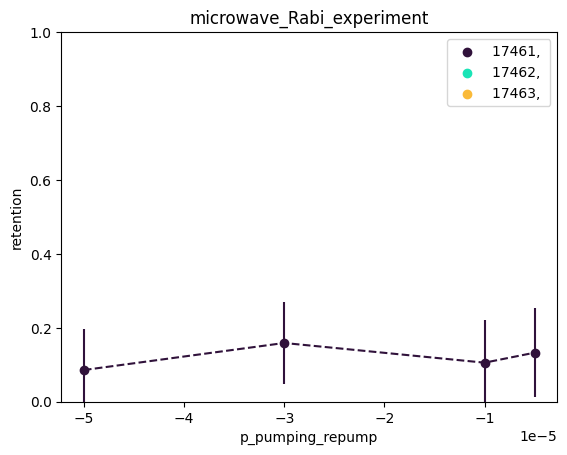

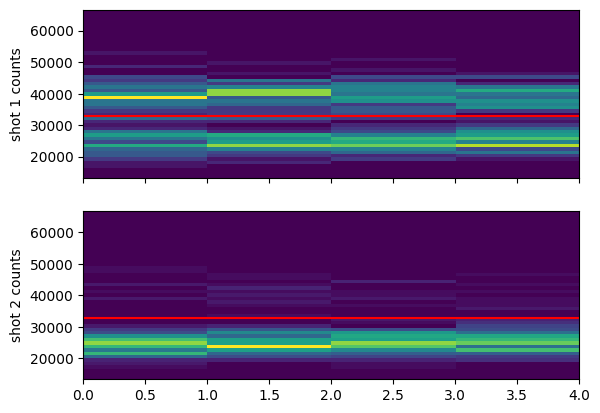

In [215]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = False
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    27: '',
    29: '',
    30: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0,0],[1,1e5,1,1e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            ax_ret.legend(loc=loc)
            # ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()


## 2024.09.17

In [205]:
fnames = get_files_by_criteria(date_filters=["2024-09-16", "2024-09-17", "2024-09-18"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 61 files
file 0 (...results\2024-09-16\09\000017409-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 2 (...results\2024-09-16\09\000017411-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 4 (...results\2024-09-16\10\000017413-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_OP'", "'AZ_top_volts_OP'", "'AX_volts_OP'", "'AY_volts_OP'"] for 'atom_blowaway_cost'
file 5 (...results\2024-09-16\10\000017414-GeneralVariableOptimizer_microwave_Rabi_optimized_for_atom_blowaway.h5) optimized ["'AZ_bottom_volts_OP'", "'AZ_top_volts_OP'", "'AX_volts_OP'", "'AY_volts_OP'"] for 'atom_blowaway_cost'
file 6 (...results\2024-09-16\10\000017416-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 8 (...results\2024-09-16\10\000017418-GeneralVariableOptimizer_microwave_Rabi_optimized_for_atom_blowaway.h5) optimized ["'AZ_bottom_volts_OP'", "'AZ_top_volts_OP'", "'AX_volts_OP'", "'AY_volts_OP'"] for 'atom_blowaway_cost'
file 9 (...results\2024-09-16\11\000017420-Gene

### Rabi oscillations

experiment: microwave_Rabi_experiment
override: {'require_atom_loading_to_advance':False}
experiment: microwave_Rabi_experiment
override: {'require_atom_loading_to_advance':False}
r=0.9904, Omega/2*pi=29618.0739, C=0.9128, tau=0.0002


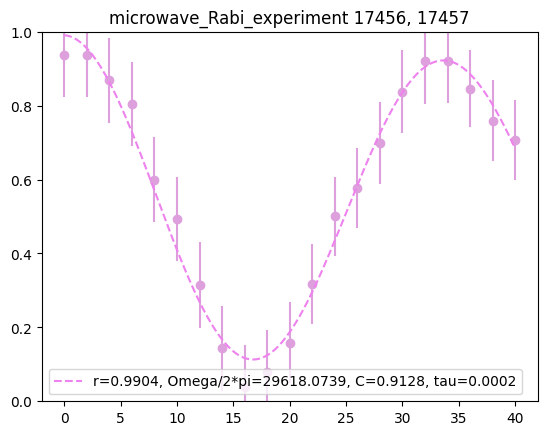

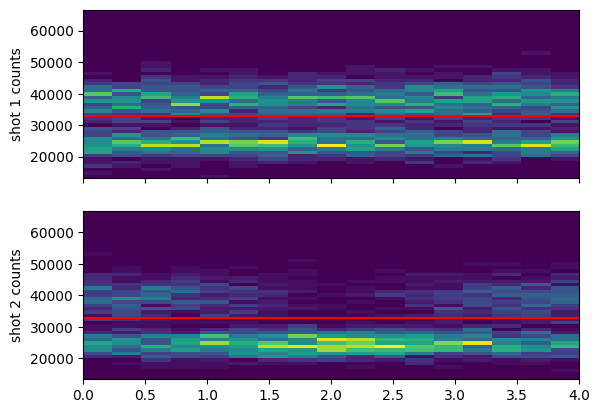

In [201]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = True # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # 47: '',
    51: '',
    53: '',
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0,0],[1,1e5,1,1e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            ax_ret.legend(loc=loc)
            # ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [193]:
0.5/29922.3243

1.670993185512664e-05

### scans to improve the microwave population transfer
Longer OP phase? are we depumping the atoms by using too much repump?

experiment: microwave_Rabi_experiment
override: {'require_atom_loading_to_advance':False}
experiment: microwave_Rabi_experiment
override: {'require_atom_loading_to_advance':False}
experiment: microwave_Rabi_experiment
override: {'require_atom_loading_to_advance':False,'blowaway_light_off':True}


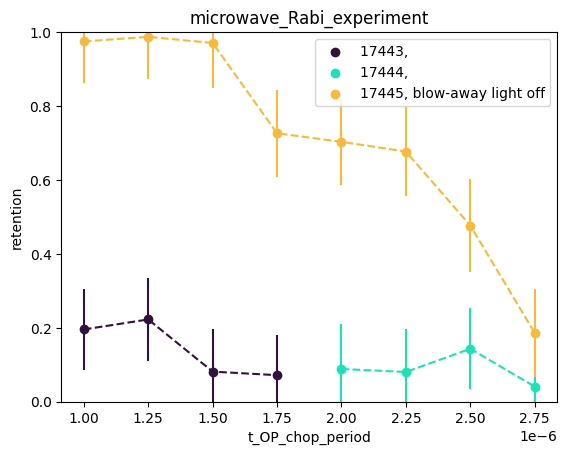

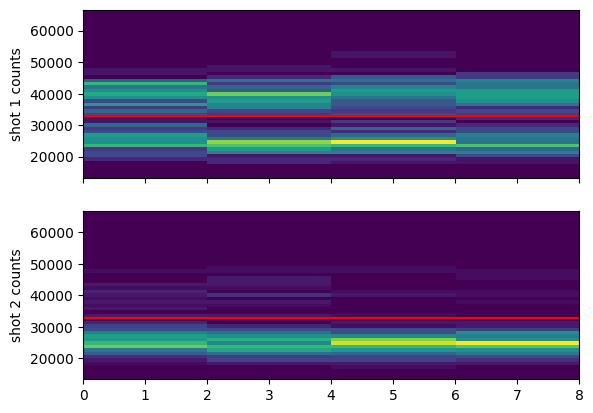

In [186]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # 34: '' # pumping time
    # 36: '' # pumping repump power
    38: '',
    40: '',
    42: 'blow-away light off',
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0,0],[1,1e5,1,1e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            ax_ret.legend(loc=loc)
            # ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### microwave Rabi oscillations

experiment: microwave_Rabi_experiment
override: {'require_atom_loading_to_advance':False}
r=0.9508, Omega/2*pi=30902.4792, C=0.8356, tau=0.0100


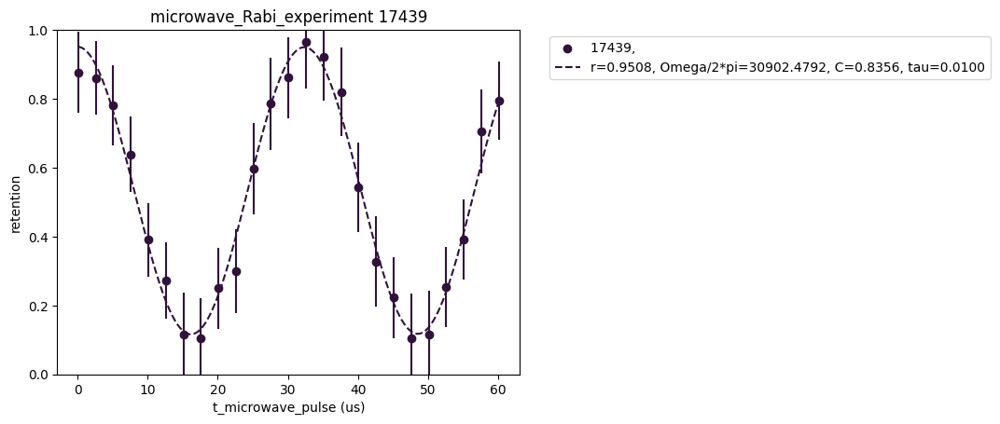

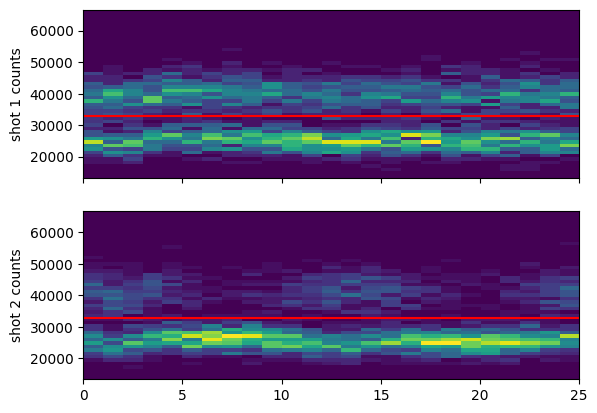

In [176]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    32: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0,0],[1,1e5,1,1e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [177]:
0.5/30902.4792

1.6179931608852923e-05

### microwave frequency scan: f0=334679583.9679

experiment: microwave_Rabi_experiment
override: {'require_atom_loading_to_advance':False, 't_microwave_pulse':15*us}
r=0.9824, sigma=26195.1233, f0=334679583.9679, C=0.6502


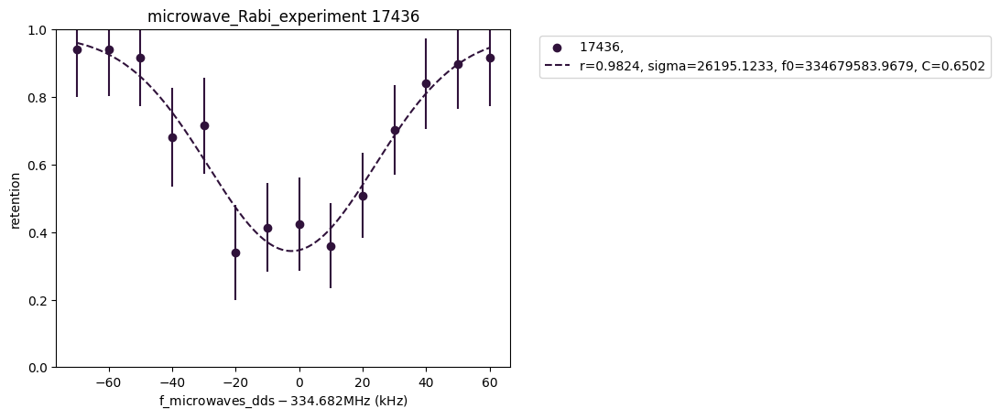

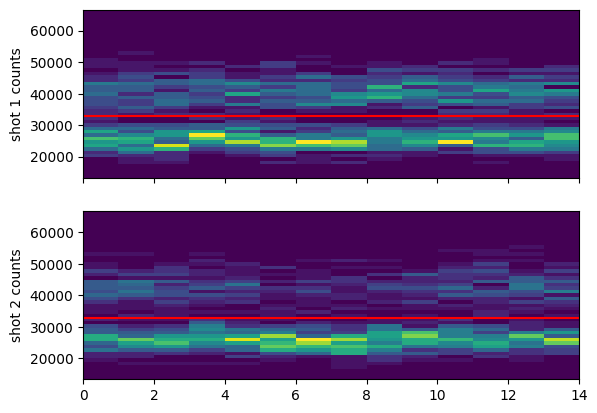

In [174]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    28: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0,0],[1,1e5,1,1e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

## 2024.09.16

In [158]:
fnames = get_files_by_criteria(date_filters=["2024-09-13", "2024-09-16"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-09-13\15\000017382-GeneralVariableScan_atom_loading_scan_over_t_FORT_drop.h5, which is corrupt
found 53 files
file 0 (...results\2024-09-13\09\000017365-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 2 (...results\2024-09-13\09\000017366-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 4 (...results\2024-09-13\10\000017367-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 6 (...results\2024-09-13\10\000017368-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 8 (...results\2024-09-13\11\000017369-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 10 (...results\2024-09-13\11\000017370-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 12 (...results\2024-09-13\12\000017373-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 14 (...results\2024-09-13\13\000017377-GeneralVariableOptimizer_atom_loading_optimized_for_atom_retention.h5) optimized ["'AZ_bo

### microwave time scan

experiment: microwave_Rabi_experiment
override: {'require_atom_loading_to_advance':False}
r=1.0000, Omega/2*pi=29044.4527, C=0.6587, tau=0.0100


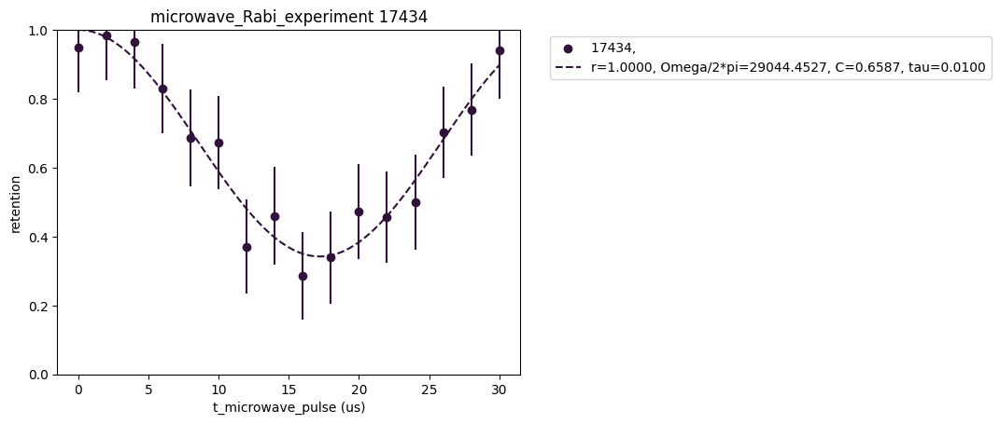

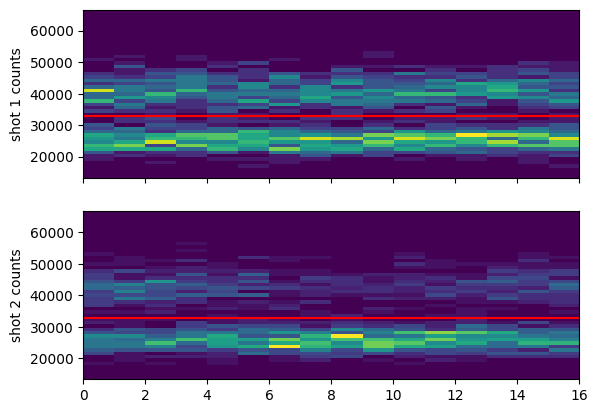

In [161]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    50: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0,0],[1,1e5,1,1e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [163]:
0.5/29044.4527

1.72149912812783e-05

### microwave frequency scan

experiment: microwave_Rabi_experiment
override: {'require_atom_loading_to_advance':False, 't_microwaves':self.t_pi_microwave_pulse}
r=1.1670, sigma=48046.5369, f0=334679078.9485, C=0.5549


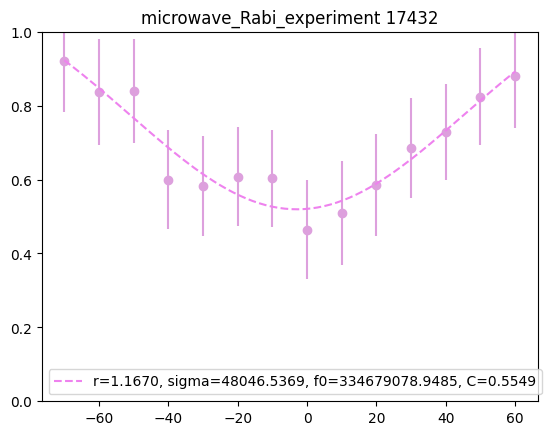

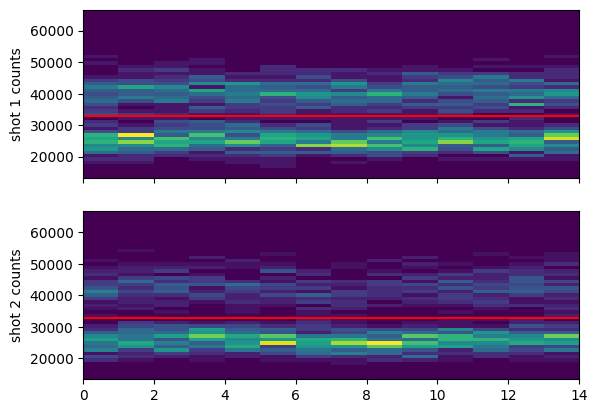

In [157]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = True # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # 25: '',
    # 27: ''
    48: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0,0],[1,1e5,1,1e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [149]:
0.5/31631.4346
print(334679554.0568-334678539.6613)

1014.3955000042915


## 2024.09.12

In [151]:
fnames = get_files_by_criteria(date_filters=["2024-09-11", "2024-09-12", "2024-09-13"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["General"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
            elif "GeneralVariableOptimizer" in f:
                optimizer_vars_dataset = [str(x)[1:] for x in ds['optimizer_vars_dataset']]
                cost_function = str(ds['cost_function'][()])[1:]
                print(f"file {i} (...{f[len(results)-8:]}) optimized {optimizer_vars_dataset} for {cost_function}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-09-13\15\000017382-GeneralVariableScan_atom_loading_scan_over_t_FORT_drop.h5, which is corrupt
found 76 files
file 0 (...results\2024-09-11\10\000017314-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 2 (...results\2024-09-11\10\000017315-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 4 (...results\2024-09-11\10\000017316-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 6 (...results\2024-09-11\11\000017317-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 8 (...results\2024-09-11\11\000017320-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 10 (...results\2024-09-11\12\000017321-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 12 (...results\2024-09-11\13\000017323-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 14 (...results\2024-09-11\14\000017327-GeneralVariableOptimizer.h5) optimized ["'AZ_bottom_volts_OP'", "'AZ_top_volts_OP'", "'AX_

### microwave frequency scan

experiment: microwave_Rabi_experiment
microwave: 334681343.29999995
experiment: microwave_Rabi_experiment
microwave: 334681343.29999995
r=1.2388, sigma=53532.8914, f0=334679554.0568, C=0.6545


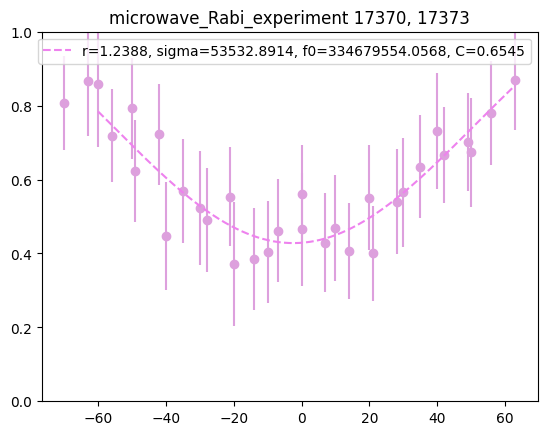

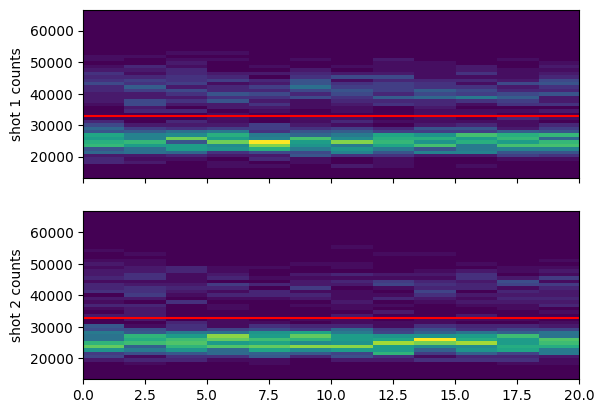

In [152]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = True # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    61: '',
    63: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0,0],[1,1e5,1,1e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("microwave:",f_microwaves_dds)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [127]:
0.5/31631.4346

1.5807060486595824e-05

### microwave pulse time scans: cost=-98 Multiple Scans

experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment
r=0.9929, Omega/2*pi=30672.3651, C=0.9122, tau=0.0002


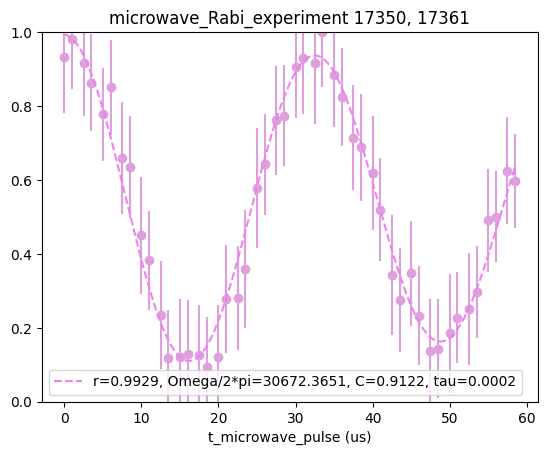

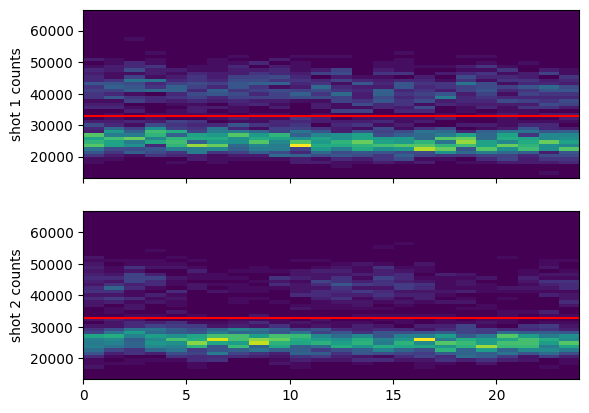

In [155]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = True # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    40: '',    # cost = - 98: first Rabi Exp after running the optimizer - range(0,60,2.5)
    47: '',    # range(1,61,2.5)
    # 49: '',    # range(100,160,2.5)
    # 51: '',    # range(100,160,5)  --- data scanned 9/13 ---
    # 53: '',    # range(300,360,5)
    # 55: '',     # range(600,660,5)
    # 57: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C'], 'bounds':(-np.inf, np.inf)}, # (-inf, inf) is default for curve fit
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau'], 'bounds':[[0,1e2,0,0],[1,1e5,1,1e-2]]}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu='otsu_threshold')

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))

    if not showloading:
        ax_ret.set_xlabel(xlabel)
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [131]:
0.5/31631.4346

1.5807060486595824e-05

### microwave pulse time scans: cost~-95

experiment: microwave_Rabi_experiment
r=0.9639, Omega/2*pi=30941.2807, C=0.8633, tau=0.0004


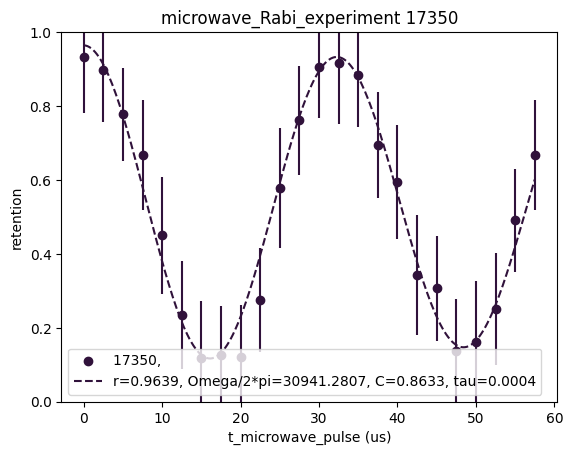

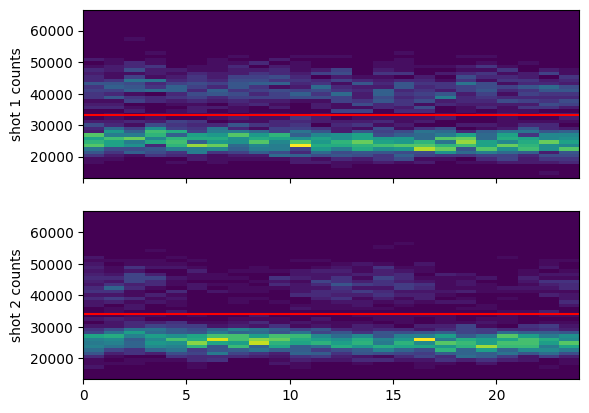

In [56]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # 34: '', # using microwave freq from 17340
    40: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C']},
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau']}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            ax_ret.legend(loc=loc)
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

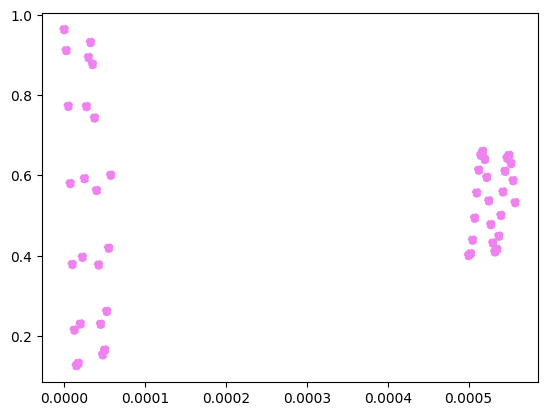

In [65]:
timesteps = np.concatenate((np.arange(0,60,2.5)*us, np.arange(500,560,2.5)*us))
plt.scatter(timesteps, fit_dict[scan_variable1_name]['model'](timesteps, *popt),linestyle='--',color='violet', label=fit_str)

In [54]:
0.5/30941.2807

1.61596413816187e-05

### microwave pulse time scans: cost~-95

experiment: microwave_Rabi_experiment
r=0.9603, Omega/2*pi=30935.8221, C=0.8062, tau=0.0007


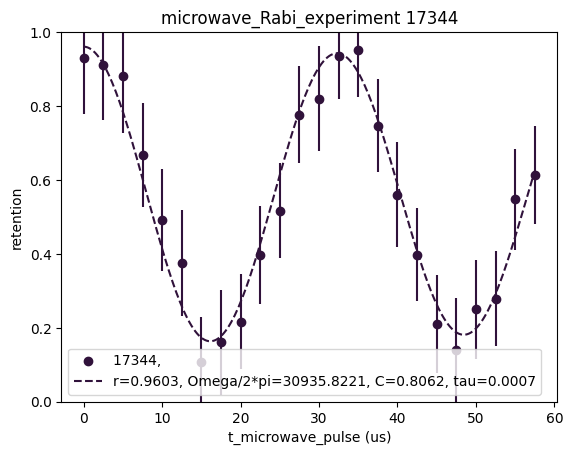

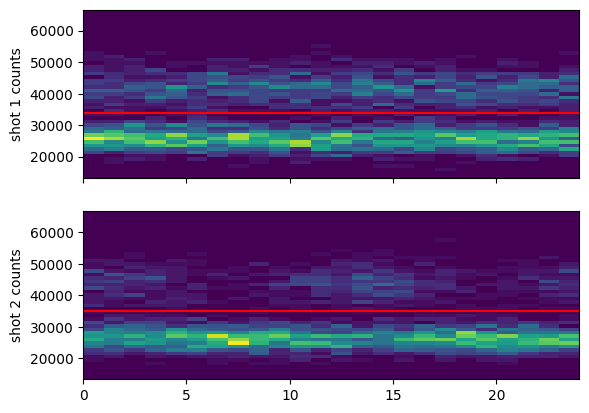

In [46]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    34: '' # using microwave freq from 17340
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C']},
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau']}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            ax_ret.legend(loc=loc)
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [57]:
0.5/30935.8221

1.6162492736858607e-05

### microwave frequency scans

experiment: microwave_Rabi_experiment
r=0.93, sigma=18869.02, f0=334681343.33, C=0.95,


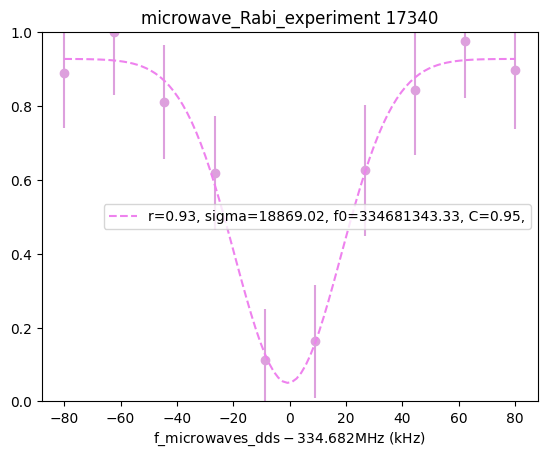

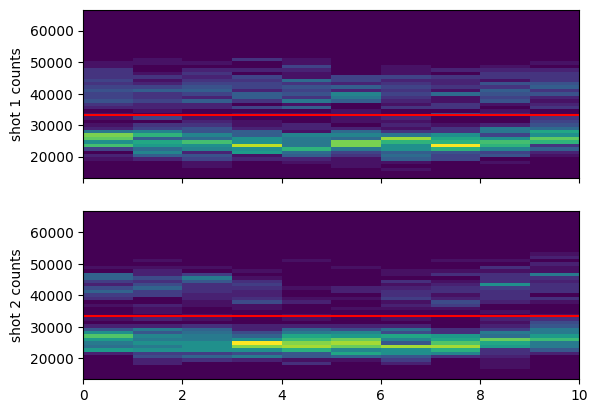

In [41]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = True # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    32: ''
} # the files to plot

legend_vars = []
# legend_vars = ['AY_volts_OP', 'p_microwaves'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (ms)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
# loc='best'

fit_dict = {'f_microwaves_dds':
            {'model':resonance_dip_fit,
             'p0':[0.9, 20e3, 334682000 + 5e3, 0.4],
             'params':['r', 'sigma', 'f0', 'C']},
            't_microwave_pulse':
            {'model':Rabi_oscillation_fit,
             'p0':[0.95, 33e3, 0.7, 0.006]}} # r, Omega, C, tau

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'])
    
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)))
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            ax_ret.legend(loc=loc)
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.2f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-1]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')
    if not showloading:
        ax_ret.set_xlabel(xlabel)


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### blowaway checks

experiment: microwave_Rabi_experiment


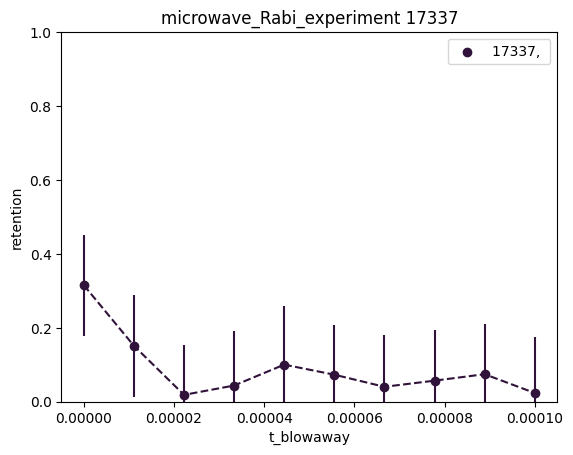

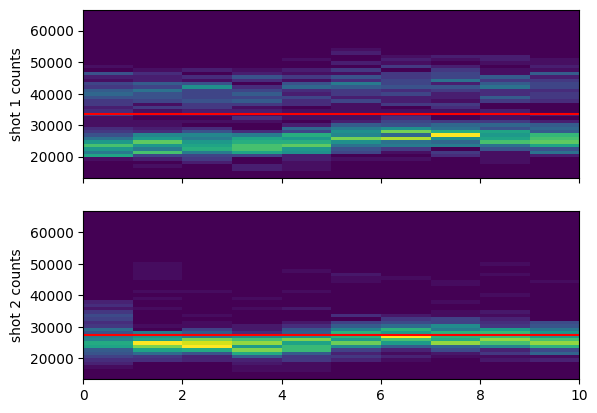

In [34]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # 26: '', 
    30: '' # time scan. shows saturation beyond about 50 us, but the blowaway is imperfect.
} # the files to plot

legend_vars = []
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C']},
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau']}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            ax_ret.legend(loc=loc)
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.3f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### microwave pulse time scans

experiment: microwave_Rabi_experiment
r=0.9491, Omega/2*pi=32503.2490, C=0.7710, tau=-0.0038


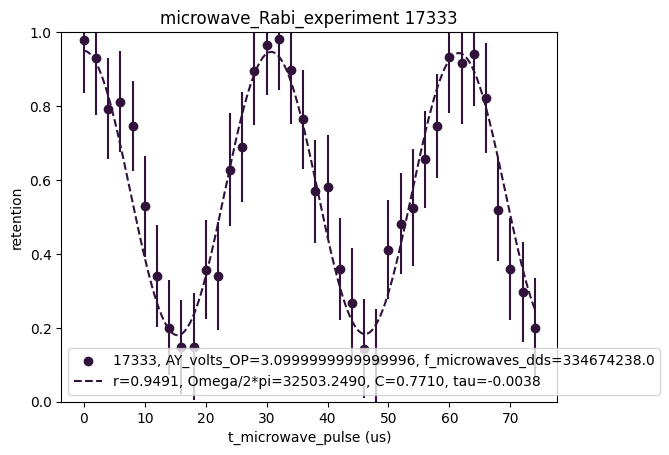

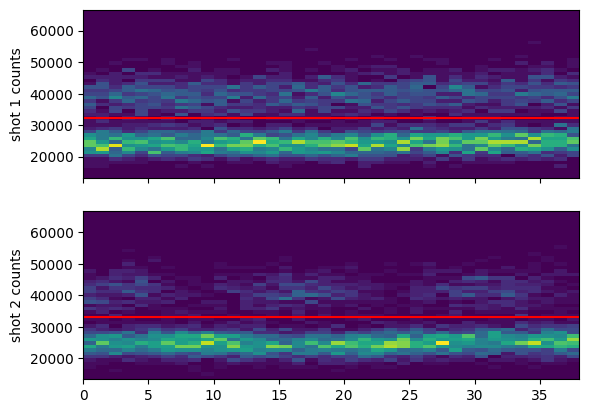

In [29]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    22: '' # good oscillation after optimization run 9.11, but only 77% contrast
    # 24: '' # aborted scan early because population didn't go to zero
} # the files to plot

legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C']},
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau']}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            ax_ret.legend(loc=loc)
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.3f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

## 2024.09.11

In [15]:
fnames = get_files_by_criteria(date_filters=["2024-09-09","2024-09-10","2024-09-11"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 34 files
file 0 (...results\2024-09-09\17\000017227-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 1 (...results\2024-09-09\17\000017229-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 2 (...results\2024-09-09\17\000017230-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 3 (...results\2024-09-09\17\000017241-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 4 (...results\2024-09-09\17\000017244-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 5 (...results\2024-09-09\18\000017247-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 7 (...results\2024-09-09\18\000017248-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 9 (...results\2024-09-09\18\000017249-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 11 (...results\2024-09-10\14\000017289-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 13 (...results\2024-09-10\14\000017291-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 14 (...r

### microwave pulse time scans

experiment: microwave_Rabi_experiment
r=1.0026, Omega/2*pi=33456.6453, C=0.7756, tau=-0.0004


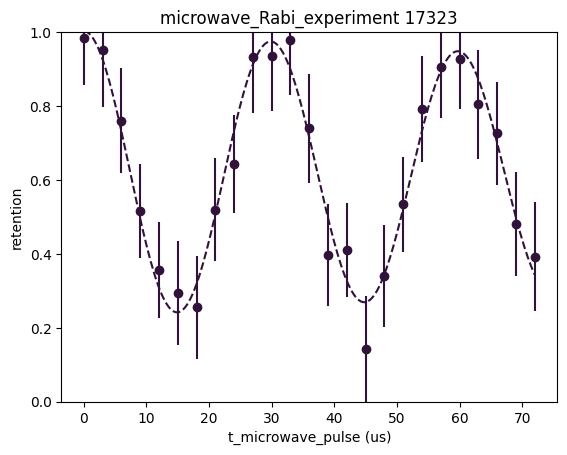

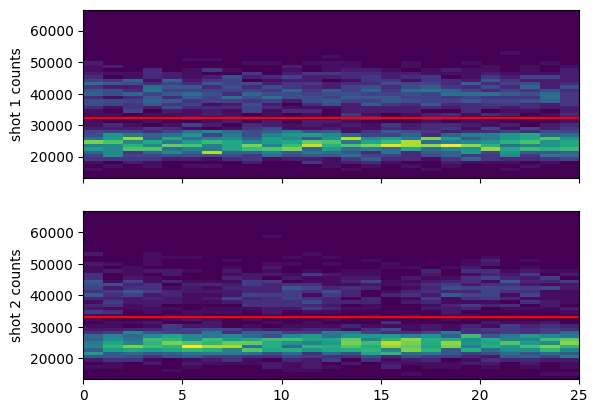

In [20]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # 28: '', # I think this was off resonance by too much or something else happened. it looks really dephased
    # 30: '', # solid oscillation at 32 kHz
    32: ''
} # the files to plot

legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (us)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

fit_dict = {'f_microwaves_dds': {'model':resonance_dip_fit, 'p0':[0.9, 30e3, 334682000 + 5e3, 0.4], 'params':['r', 'sigma', 'f0', 'C']},
            't_microwave_pulse': {'model':Rabi_oscillation_fit, 'p0':[0.95, 33e3, 0.8, 0.006], 'params':['r', 'Omega/2*pi', 'C', 'tau']}}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            # ax_ret.legend(loc=loc)
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.3f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [19]:
0.5/33456.6453

1.4944714137253925e-05

In [48]:
"".join([f'{p}={v:.2f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-1]

'r=0.94, Omega=203322.29, C=0.65, tau=0.00,'

In [49]:
fit_str

'r=0.96, sigma=36463.60, f0=334679727.55, C=0.45,'

### microwave frequency scans

experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment
r=0.96, sigma=36463.60, f0=334679727.55, C=0.45,


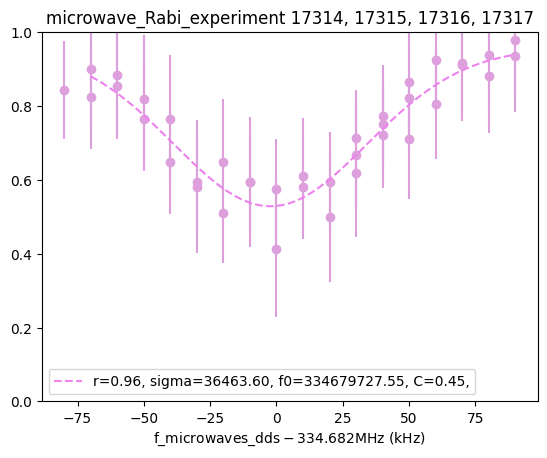

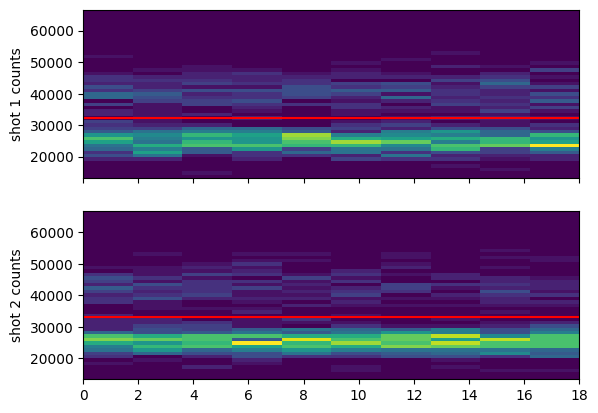

In [29]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = True # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    20: '',
    22: '',
    24: '',
    26: '',
} # the files to plot

legend_vars = ['AY_volts_OP', 'p_microwaves'] # will be included in the plot legend

xform_and_label = {'f_microwaves_dds':{'xsteps_xform': lambda x: (x - 334.682e6)*1e-3, 'xlabel':r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"},
                   't_microwave_pulse':{'xsteps_xform': lambda x: 1e6*x, 'xlabel': "t_microwave_pulse (ms)"},
                   't_pumping': {'xsteps_xform': lambda x: 1e3*x, 'xlabel': "t_pumping (ms)"}}

loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
# loc='best'

fit_dict = {'f_microwaves_dds':
            {'model':resonance_dip_fit,
             'p0':[0.9, 20e3, 334682000 + 5e3, 0.4],
             'params':['r', 'sigma', 'f0', 'C']},
            't_microwave_pulse':
            {'model':Rabi_oscillation_fit,
             'p0':[0.95, 33e3, 0.7, 0.006]}} # r, Omega, C, tau

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'])
    
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)))
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            ax_ret.legend(loc=loc)
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.2f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-1]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')
    if not showloading:
        ax_ret.set_xlabel(xlabel)


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [26]:
f_dds_clock_resonance - 334680030.66, f_dds_clock_resonance

(1969.339999973774, 334682000.0)

In [24]:
AY_volts_OP

3.0

### microwave frequency scans
Scans that Preston ran on 9/10

experiment: microwave_Rabi_experiment


TypeError: get_loading_and_retention() got an unexpected keyword argument 'otsu'

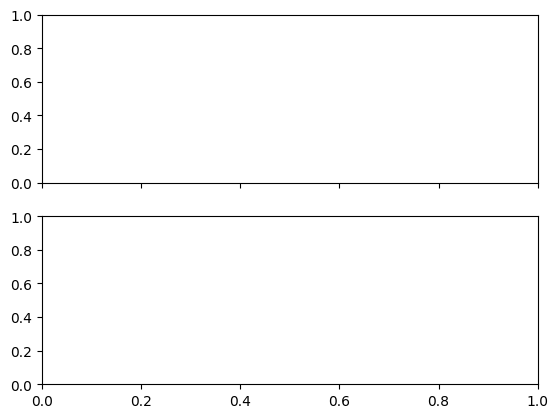

In [381]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
merge_data = True # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    20: '',
    22: '',
    24: ''
} # the files to plot

legend_vars = ['AY_volts_OP', 'p_microwaves'] # will be included in the plot legend

if custom_xlabel:
    if scan_variable1_name == 'f_microwaves_dds':
        xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"
        xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
    elif scan_variable1_name == 't_microwave_pulse':
        xsteps_xform = lambda x: 1e6*x
        xlabel = "t_microwave_pulse (ms)"
    elif scan_variable1_name == 't_pumping':
        xsteps_xform = lambda x: 1e3*x
        xlabel = "t_pumping (ms)"

else:
    xsteps_xform = lambda x: x # do nothing

loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
# loc='best'

fit_dict = {'f_microwaves_dds':
            {'model':resonance_dip_fit,
             'p0':[0.9, 20e3, 334682000 + 5e3, 0.4],
             'params':['r', 'sigma', 'f0', 'C']},
            't_microwave_pulse':
            {'model':Rabi_oscillation_fit},
             'p0':[0.95, 30e3, 0.7, 0.006]} # r, Omega, C, tau

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=True)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))
    
            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'])
    
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)))
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                if custom_xlabel:
                    ax_ret.set_xlabel(xlabel)
                else:
                    ax_ret.set_xlabel(scan_variable1_name)
            ax_ret.set_ylabel("retention")
            ax_ret.legend(loc=loc)
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.2f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-1]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [373]:
"".join([f'{p}={v:.2f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])

'r=0.93, sigma=32712.35, f0=334684072.03, C=0.45, '

### microwave frequency scans
Scans that Preston ran on 9/10

experiment: microwave_Rabi_experiment
AY_volts_OP: 3.0
show loading
experiment: microwave_Rabi_experiment
AY_volts_OP: 3.0
show loading
experiment: microwave_Rabi_experiment
AY_volts_OP: 3.0
show loading


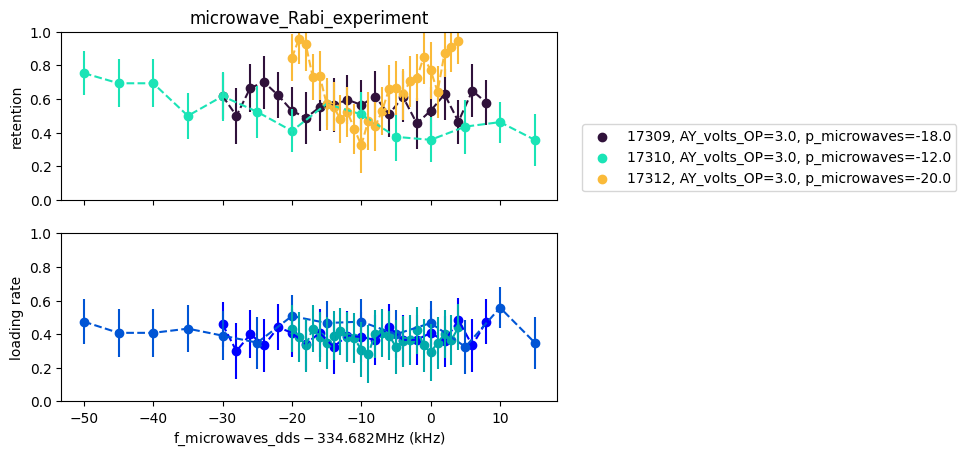

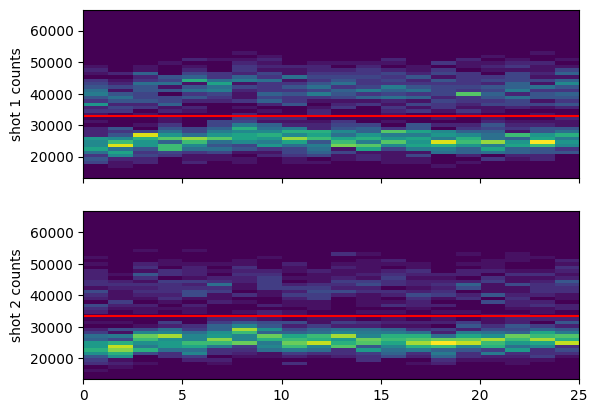

In [331]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
fit = False

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    14: '',
    16: '',
    18: ''
} # the files to plot

legend_vars = ['AY_volts_OP', 'p_microwaves'] # will be included in the plot legend

if custom_xlabel:
    if scan_variable1_name == 'f_microwaves_dds':
        xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 MHz  ~(\rm kHz)$"
        xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
    elif scan_variable1_name == 't_microwave_pulse':
        xsteps_xform = lambda x: 1e6*x
        xlabel = "t_microwave_pulse (ms)"
    elif scan_variable1_name == 't_pumping':
        xsteps_xform = lambda x: 1e3*x
        xlabel = "t_pumping (ms)"

else:
    xsteps_xform = lambda x: x # do nothing

loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
# loc='best'

fit_dict = {'f_microwaves_dds':
            {'model':resonance_dip_fit,
             'p0':[0.95, 30e3, -10e3, 0.7]}, # r, sigma, f0, C
            't_microwave_pulse':
            {'model':Rabi_oscillation_fit},
             'p0':[0.95, 30e3, 0.7, 0.006]} # r, Omega, C, tau

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    # f_comment += variable_val_string(legend_vars)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not ncols > 1 and fit and scan_variable1_name in fit_dict:
            popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'])

            hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
            hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
            
            ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)))
        else:
            ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))


        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            print("show loading")
            
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [328]:
curve_fit?

Signature:
curve_fit(
    f,
    xdata,
    ydata,
    p0=None,
    sigma=None,
    absolute_sigma=False,
    check_finite=None,
    bounds=(-inf, inf),
    method=None,
    jac=None,
    *,
    full_output=False,
    nan_policy=None,
    **kwargs,
)
Docstring:
Use non-linear least squares to fit a function, f, to data.

Assumes ``ydata = f(xdata, *params) + eps``.

Parameters
----------
f : callable
    The model function, f(x, ...). It must take the independent
    variable as the first argument and the parameters to fit as
    separate remaining arguments.
xdata : array_like
    The independent variable where the data is measured.
    Should usually be an M-length sequence or an (k,M)-shaped array for
    functions with k predictors, and each element should be float
    convertible if it is an array like object.
ydata : array_like
    The dependent data, a length M array - nominally ``f(xdata, ...)``.
p0 : array_like, optional
    Initial guess for the parameters (length N). If None

In [ ]:
class Dog

In [293]:
np.arange(-70,30,10)

array([-70, -60, -50, -40, -30, -20, -10,   0,  10,  20])

In [289]:
p_microwaves

-20.0

## 2024.09.10

In [271]:
fnames = get_files_by_criteria(date_filters=["2024-09-08","2024-09-09","2024-09-10"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 18 files
file 0 (...results\2024-09-08\14\000017188-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 1 (...results\2024-09-08\14\000017190-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 3 (...results\2024-09-08\14\000017191-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 5 (...results\2024-09-08\16\000017192-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 7 (...results\2024-09-09\17\000017227-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 8 (...results\2024-09-09\17\000017229-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 9 (...results\2024-09-09\17\000017230-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 10 (...results\2024-09-09\17\000017241-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 11 (...results\2024-09-09\17\000017244-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 12 (...results\2024-09-09\18\000017247-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 14 

### microwave pulse time scans
Scans that Preston ran on 9/9

experiment: microwave_Rabi_experiment
AY_volts_OP: 3.0
show loading
experiment: microwave_Rabi_experiment
AY_volts_OP: 3.0
show loading


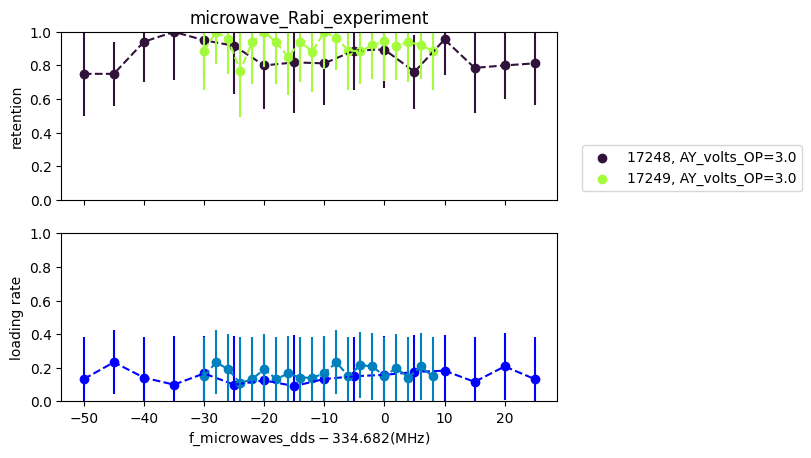

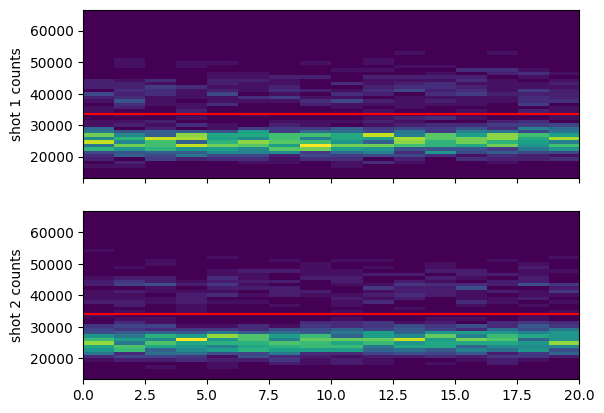

In [275]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    14: '',
    16: '',
} # the files to plot

legend_vars = ['AY_volts_OP'] # will be included in the plot legend

if custom_xlabel:
    if scan_variable1_name == 'f_microwaves_dds':
        xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
        xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
    elif scan_variable1_name == 't_microwave_pulse':
        xsteps_xform = lambda x: 1e6*x
        xlabel = "t_microwave_pulse (ms)"
    elif scan_variable1_name == 't_pumping':
        xsteps_xform = lambda x: 1e3*x
        xlabel = "t_pumping (ms)"

else:
    xsteps_xform = lambda x: x # do nothing

loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
# loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    # f_comment += variable_val_string(legend_vars)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            print("show loading")
            
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [277]:
myfunction?

Signature: myfunction(a, b, c)
Docstring:
a: a float
b: an int
c: a boolean

don't name your variables like this its not useful

returns: d, an int
File:      c:\users\qc\appdata\local\temp\ipykernel_18384\3572658031.py
Type:      function

In [279]:
help(myfunction)

Help on function myfunction in module __main__:

myfunction(a, b, c)
    a: a float
    b: an int
    c: a boolean
    
    don't name your variables like this its not useful
    
    returns: d, an int



## 2024.09.09

In [264]:
fnames = get_files_by_criteria(date_filters=["2024-09-05","2024-09-06","2024-09-07","2024-09-08"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 61 files
file 0 (...results\2024-09-05\17\000017111-GeneralVariableScan.h5) scanned over AY_volts_OP
file 2 (...results\2024-09-05\17\000017117-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 4 (...results\2024-09-05\17\000017118-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 6 (...results\2024-09-05\18\000017119-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 8 (...results\2024-09-05\18\000017120-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 10 (...results\2024-09-05\18\000017121-GeneralVariableScan.h5) scanned over p_pumping_repump
file 12 (...results\2024-09-06\09\000017123-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 14 (...results\2024-09-06\10\000017124-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 16 (...results\2024-09-06\10\000017125-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 18 (...results\2024-09-06\10\000017126-GeneralVariableScan.h5) scanned over dummy_variable
file 20 (...resu

### microwave pulse time scans
Scans that Akbar ran on Sunday

experiment: microwave_Rabi_experiment
AY_volts_OP: 3.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 4.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 5.0


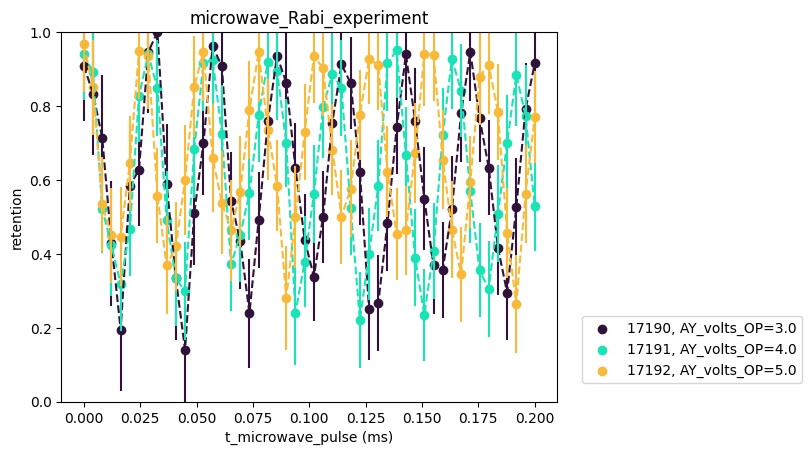

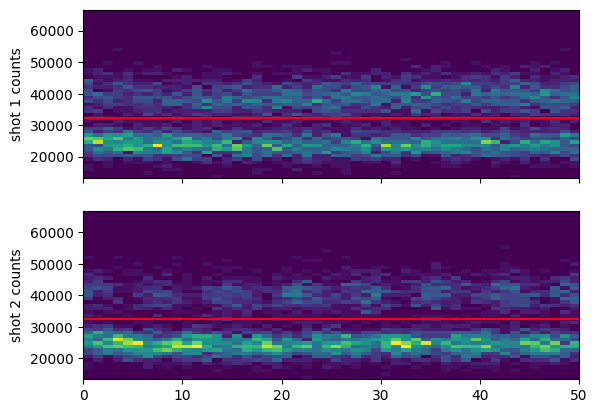

In [269]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    55: '',
    57: '',
    59: '',
} # the files to plot

legend_vars = ['AY_volts_OP'] # will be included in the plot legend

if custom_xlabel:
    if scan_variable1_name == 'f_microwaves_dds':
        xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
        xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
    elif scan_variable1_name == 't_microwave_pulse':
        xsteps_xform = lambda x: 1e6*x
        xlabel = "t_microwave_pulse (ms)"
    elif scan_variable1_name == 't_pumping':
        xsteps_xform = lambda x: 1e3*x
        xlabel = "t_pumping (ms)"

else:
    xsteps_xform = lambda x: x # do nothing

loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
# loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    # f_comment += variable_val_string(legend_vars)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            print("show loading")
            
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

## 2024.09.06

In [256]:
fnames = get_files_by_criteria(date_filters=["2024-09-05","2024-09-06"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 54 files
file 0 (...results\2024-09-05\17\000017111-GeneralVariableScan.h5) scanned over AY_volts_OP
file 2 (...results\2024-09-05\17\000017117-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 4 (...results\2024-09-05\17\000017118-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 6 (...results\2024-09-05\18\000017119-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 8 (...results\2024-09-05\18\000017120-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 10 (...results\2024-09-05\18\000017121-GeneralVariableScan.h5) scanned over p_pumping_repump
file 12 (...results\2024-09-06\09\000017123-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 14 (...results\2024-09-06\10\000017124-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 16 (...results\2024-09-06\10\000017125-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 18 (...results\2024-09-06\10\000017126-GeneralVariableScan.h5) scanned over dummy_variable
file 20 (...resu

In [250]:
((np.arange(-15,-5,1.5)*kHz + f_dds_clock_resonance)[3] + (np.arange(-15,-5,1.5)*kHz + f_dds_clock_resonance)[2])/2

334670750.0

### microwave frequency scans
A frequency scan +-20kHz around the frequency where we observed the best time-scan results, below. If there is any dip, it is very broad!

experiment: microwave_Rabi_experiment
AY_volts_OP: 3.0
show loading


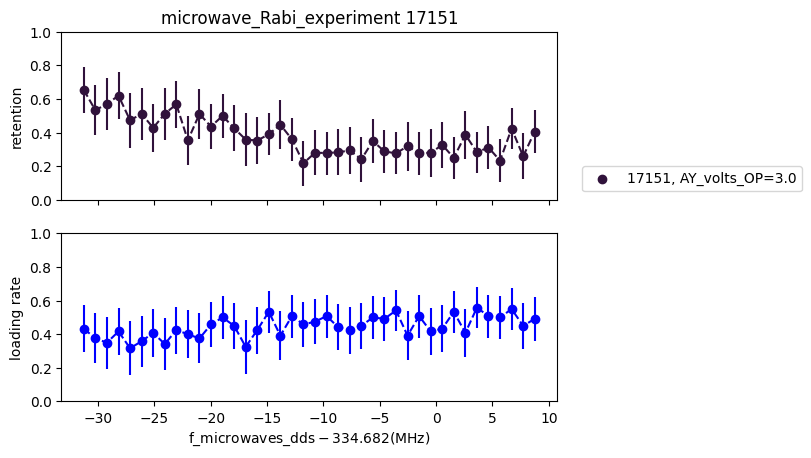

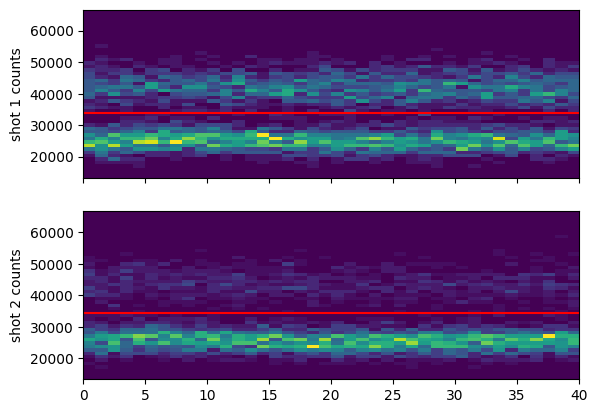

In [262]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    46: ''
} # the files to plot

legend_vars = ['AY_volts_OP'] # will be included in the plot legend

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

    # xsteps_xform = lambda x: 1e3*x
    # xlabel = "t_pumping (ms)"

else:
    xsteps_xform = lambda x: x # do nothing

loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
# loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    # f_comment += variable_val_string(legend_vars)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            print("show loading")
            
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### microwave pulse time scans (different bias field amplitudes)

experiment: microwave_Rabi_experiment
AY_volts_OP: 3.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 1.0


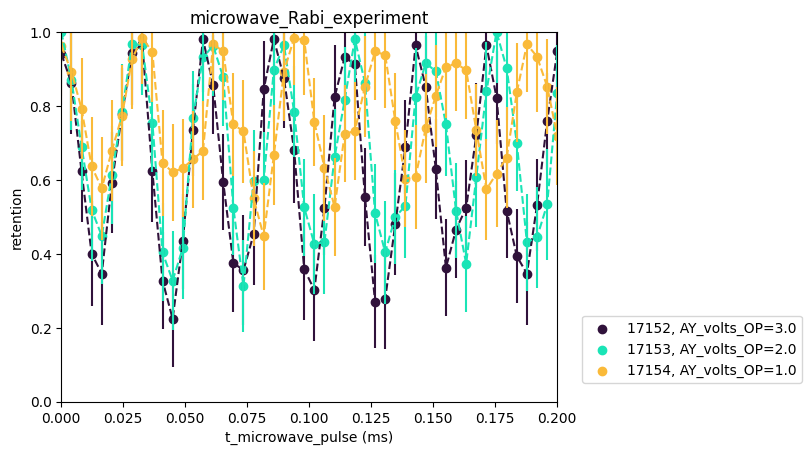

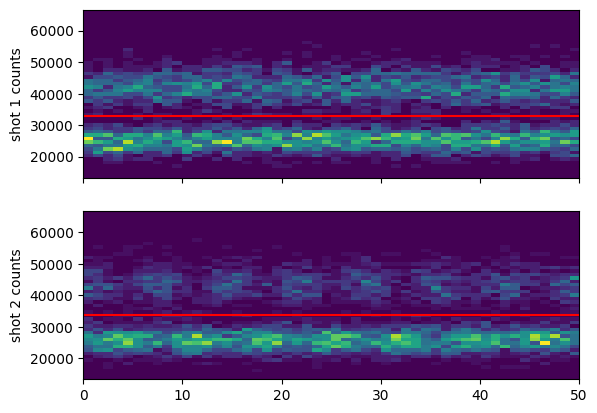

In [261]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
xlim = (0,0.2)
# xlim = None

file_indices = {
    48:'',
    50:'',
    52:''
} # the files to plot

legend_vars = ['AY_volts_OP'] # will be included in the plot legend

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    # xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    # xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

    xsteps_xform = lambda x: 1e3*x
    xlabel = "t_microwave_pulse (ms)"

else:
    xsteps_xform = lambda x: x # do nothing

loc='best'
loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    # f_comment += variable_val_string(legend_vars)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            print("show loading")
            
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if xlim is not None:
    ax_ret.set_xlim(xlim)
    if showloading:
            ax_ldng.set_xlim(xlim)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### microwave pulse time scans

experiment: microwave_Rabi_experiment
AY_volts_OP: 3.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 3.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 3.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 3.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 3.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 3.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 3.0


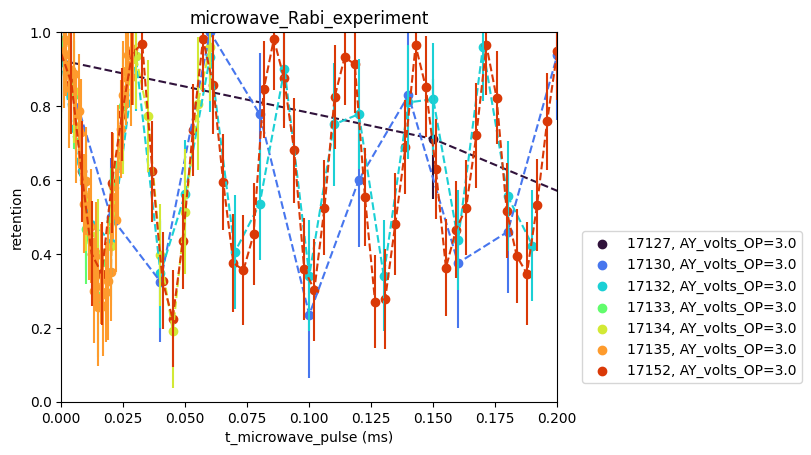

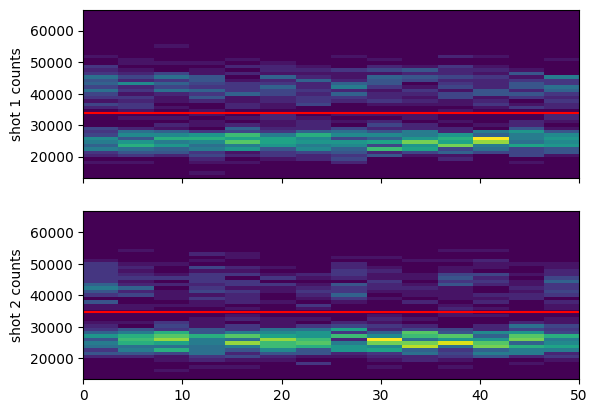

In [259]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
xlim = (0,0.2)
# xlim = None

file_indices = {
    # 14: '' # uses the frequency and bias settings as 17123 as far as I can tell, but the population transfer is terrible... what's going on? I aborted the experiment early. this seems to have been a fluke.
    20: '',
    # 22:'',
    # 24:'',
    26:'',
    28:'',
    30:'',
    32:'',
    34:'',
    48:''
} # the files to plot

legend_vars = ['AY_volts_OP'] # will be included in the plot legend

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    # xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    # xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

    xsteps_xform = lambda x: 1e3*x
    xlabel = "t_microwave_pulse (ms)"

else:
    xsteps_xform = lambda x: x # do nothing

loc='best'
loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    # f_comment += variable_val_string(legend_vars)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            print("show loading")
            
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if xlim is not None:
    ax_ret.set_xlim(xlim)
    if showloading:
            ax_ldng.set_xlim(xlim)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

NameError: name 'pi' is not defined

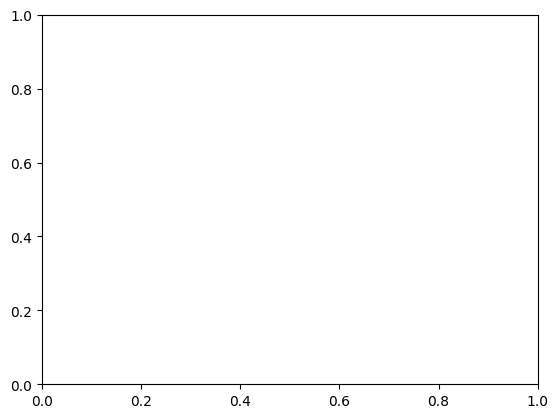

In [223]:
fig, ax_ret = plt.subplots()
# ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))

ax_ret.plot(xsteps_xform(scan_sequence1), np.cos(2*pi*2*scan_sequence1/2)**2)

ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))

### microwave frequency scans
Frequency scans for different bias coil values. This was motivating by Mark’s comment that if the splitting between the hyperfine states is comparable to the FORT chopping rate then Raman transitions could be depumping the atoms. Scanning the bias field changes the detuning; We could also have checked this by scanning the chopping rate instead but timing in ARTIQ can be finnicky, so this is probably more reliable.


experiment: microwave_Rabi_experiment
AY_volts_OP: 3.0
show loading
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.5
show loading
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
show loading
experiment: microwave_Rabi_experiment
AY_volts_OP: 1.5
show loading
experiment: microwave_Rabi_experiment
AY_volts_OP: 3.0
show loading
experiment: microwave_Rabi_experiment
AY_volts_OP: 3.0
show loading


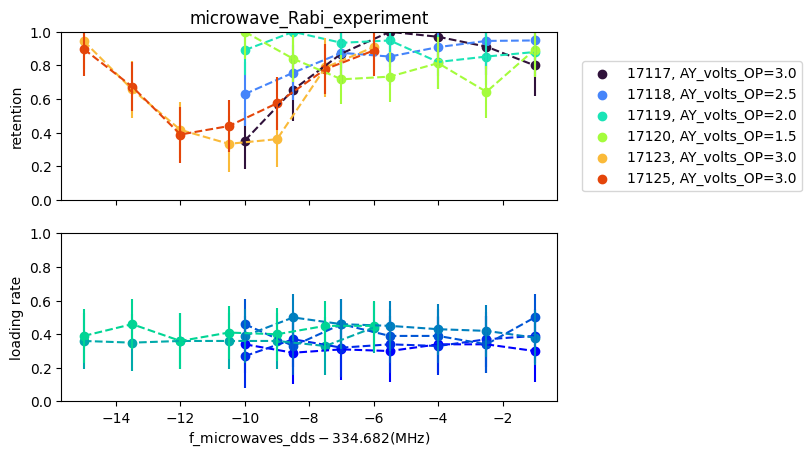

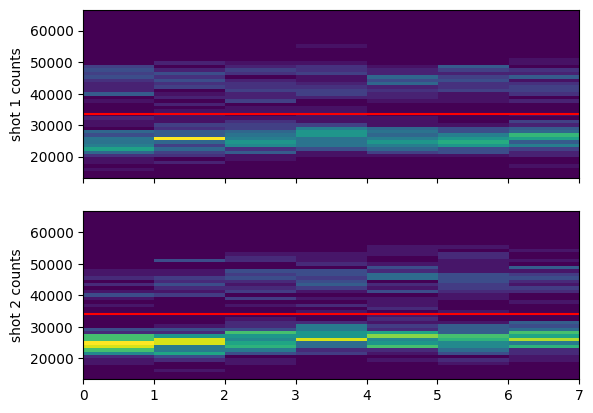

In [213]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    2: '',
    4: '',
    6: '',
    8: '', # significant population transfer
    12: '', # wider scan range
    16: ''
} # the files to plot

legend_vars = ['AY_volts_OP'] # will be included in the plot legend

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

    # xsteps_xform = lambda x: 1e3*x
    # xlabel = "t_pumping (ms)"

else:
    xsteps_xform = lambda x: x # do nothing

loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
# loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    # f_comment += variable_val_string(legend_vars)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            print("show loading")
            
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### AY bias coil scan for fixed microwave frequency and pulse time
this failed because the microwave source was off despite looking like it was on.

experiment: atom_loading_experiment
AY_volts_OP: 2.0
show loading


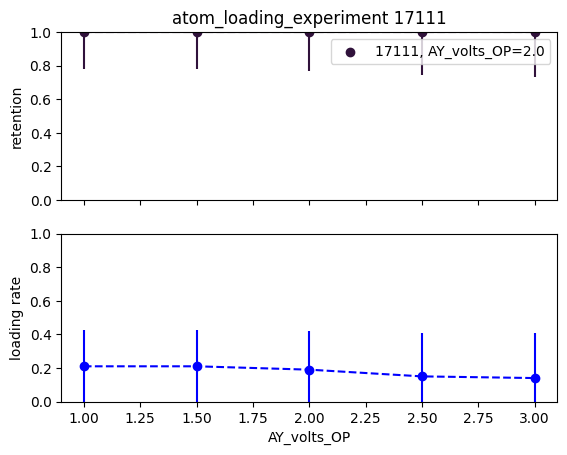

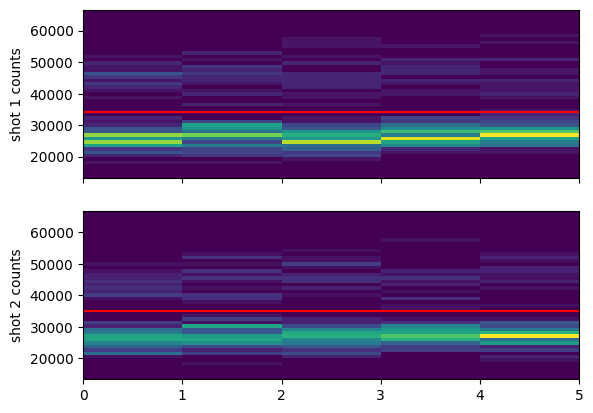

In [202]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = False

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    0: '',
} # the files to plot

legend_vars = ['AY_volts_OP'] # will be included in the plot legend

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

    # xsteps_xform = lambda x: 1e3*x
    # xlabel = "t_pumping (ms)"

else:
    xsteps_xform = lambda x: x # do nothing

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    # f_comment += variable_val_string(legend_vars)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            print("show loading")
            
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### pumping repump power scan
If this is way too strong we could be getting some depumping from it.

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
show loading


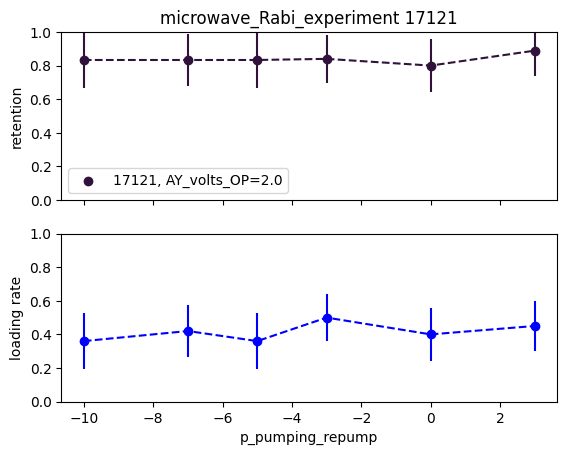

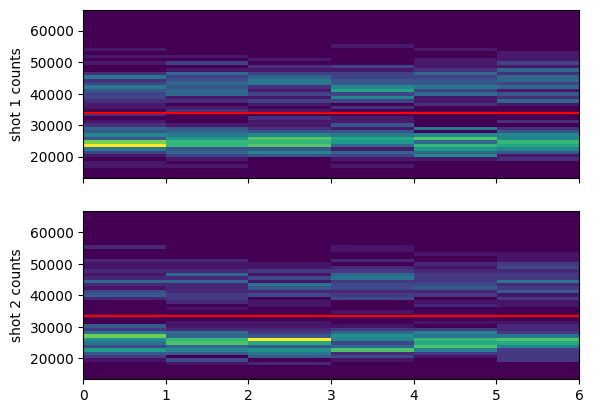

In [201]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = False

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    10: '' # shows no effect
} # the files to plot

legend_vars = ['AY_volts_OP'] # will be included in the plot legend

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

    # xsteps_xform = lambda x: 1e3*x
    # xlabel = "t_pumping (ms)"

else:
    xsteps_xform = lambda x: x # do nothing

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    # f_comment += variable_val_string(legend_vars)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            print("show loading")
            
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [190]:
locals()['AY_volts_OP']

2.0

In [186]:
def overload(*x):
    print(x)
overload(1,2,3)

def overload(*x):
    x = list(x)
    print(x)
overload(1,2,3)

(1, 2, 3)
[1, 2, 3]


## 2024.08.30

In [176]:
fnames = get_files_by_criteria(date_filters=["2024-08-30"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 2 files
file 0 (...results\2024-08-30\11\000017041-GeneralVariableScan.h5) scanned over f_microwaves_dds
skipped 1 redundant files
1 scan_variables over 1 variable scans


### microwave frequency scan

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
show loading


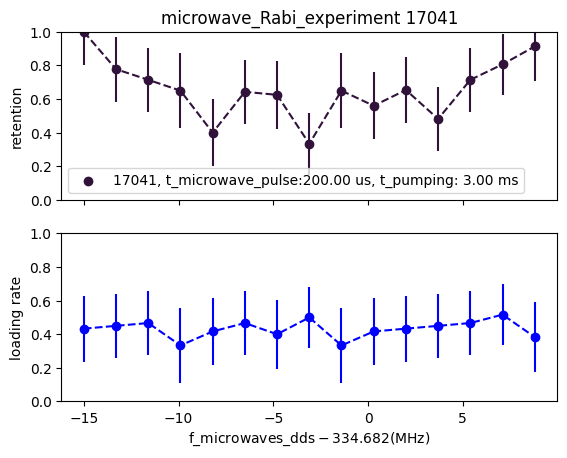

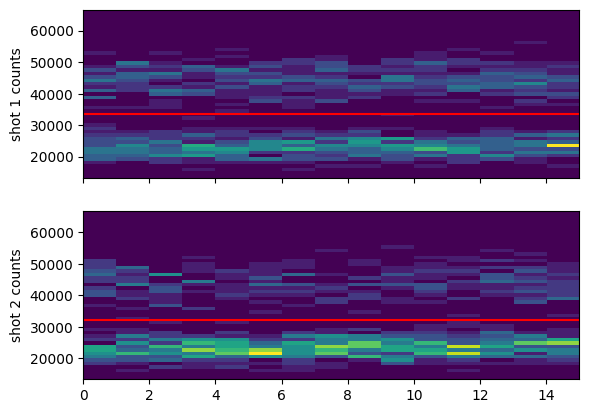

In [179]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    0: '',
} # the files to plot


if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

    # xsteps_xform = lambda x: 1e3*x
    # xlabel = "t_pumping (ms)"

else:
    xsteps_xform = lambda x: x # do nothing

f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us, t_pumping: {(t_pumping)*1e3:.2f} ms'

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            print("show loading")
            
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [181]:
sorted_idcs = np.argsort(retention)
retention[sorted_idcs]

array([0.33333333, 0.4       , 0.48148148, 0.56      , 0.625     ,
       0.64285714, 0.65      , 0.65      , 0.65384615, 0.71428571,
       0.71428571, 0.77777778, 0.80645161, 0.91304348, 1.        ])

In [182]:
scan_sequence1[sorted_idcs]

array([3.346789e+08, 3.346738e+08, 3.346857e+08, 3.346823e+08,
       3.346772e+08, 3.346755e+08, 3.346721e+08, 3.346806e+08,
       3.346840e+08, 3.346704e+08, 3.346874e+08, 3.346687e+08,
       3.346891e+08, 3.346908e+08, 3.346670e+08])

## 2024.08.29

In [174]:
fnames = get_files_by_criteria(date_filters=["2024-08-29","2024-08-28","2024-08-27","2024-08-23"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} (...{f[len(results)-8:]}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 79 files
file 0 (...results\2024-08-23\10\000016861-GeneralVariableScan.h5) scanned over AX_volts_OP
file 2 (...results\2024-08-23\10\000016862-GeneralVariableScan.h5) scanned over p_D1_pumping_SP
file 4 (...results\2024-08-23\11\000016865-GeneralVariableScan.h5) scanned over dummy_variable
file 6 (...results\2024-08-23\11\000016867-GeneralVariableScan.h5) scanned over dummy_variable
file 7 (...results\2024-08-23\11\000016869-GeneralVariableScan.h5) scanned over dummy_variable
file 8 (...results\2024-08-23\11\000016871-GeneralVariableScan.h5) scanned over dummy_variable
file 9 (...results\2024-08-23\11\000016872-GeneralVariableScan.h5) scanned over p_D1_pumping_SP
file 10 (...results\2024-08-23\11\000016874-GeneralVariableScan.h5) scanned over p_D1_pumping_SP
file 12 (...results\2024-08-23\12\000016876-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 14 (...results\2024-08-23\13\000016880-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 16 (...results\2024-08

### check OP duty cycle

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
show loading
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
show loading


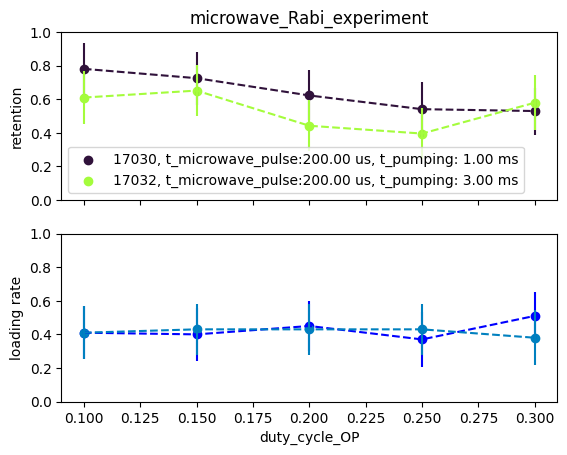

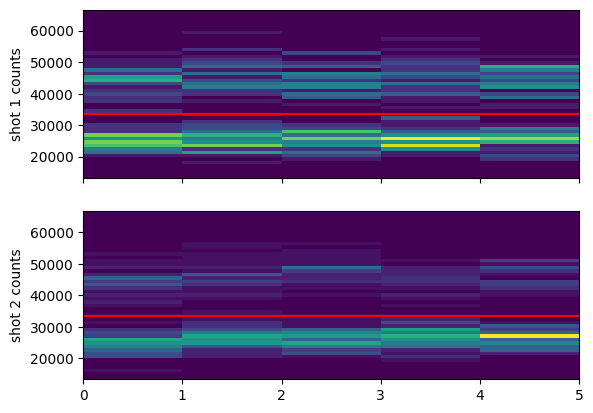

In [171]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = False

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    73: '',
    75: ''
} # the files to plot


if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    # xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    # xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

    xsteps_xform = lambda x: 1e3*x
    xlabel = "t_pumping (ms)"

else:
    xsteps_xform = lambda x: x # do nothing

f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us, t_pumping: {(t_pumping)*1e3:.2f} ms'

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            print("show loading")
            
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### check OP pulse delay time

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
show loading


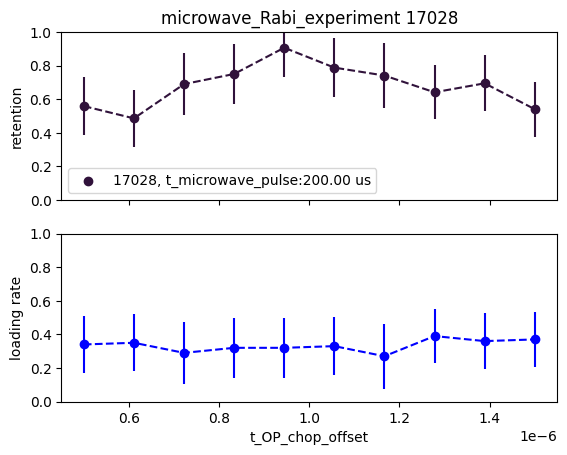

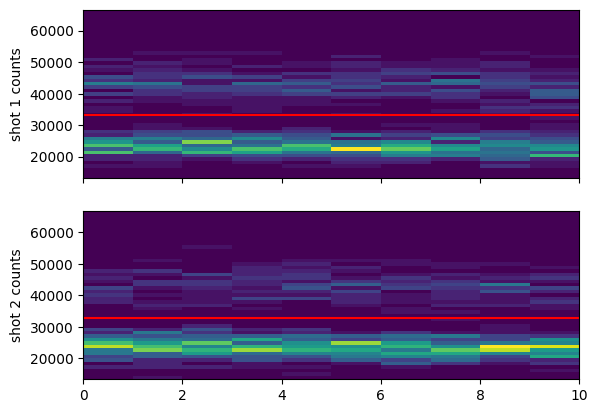

In [167]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = False

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    70: '' 
} # the files to plot


if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    # xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    # xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

    xsteps_xform = lambda x: 1e3*x
    xlabel = "t_pumping (ms)"

else:
    xsteps_xform = lambda x: x # do nothing

f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            print("show loading")
            
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### check OP time - are we saturating the population transfer?

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
show loading


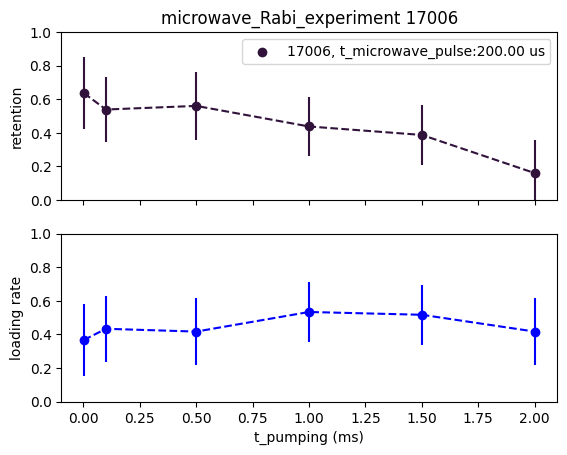

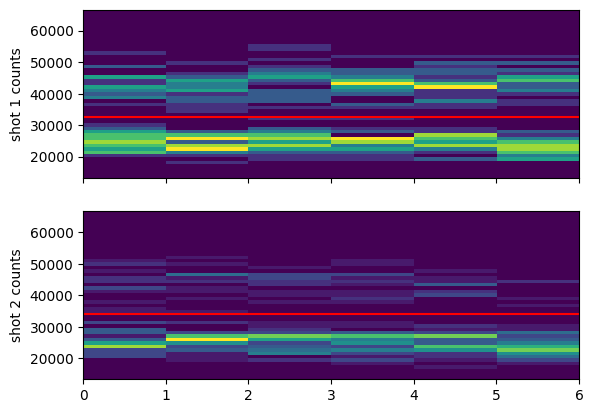

In [164]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    54: '' # failed because I used ints instead of booleans for blowaway and pumping light off
} # the files to plot


if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    # xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    # xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

    xsteps_xform = lambda x: 1e3*x
    xlabel = "t_pumping (ms)"

else:
    xsteps_xform = lambda x: x # do nothing

f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            print("show loading")
            
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### check blow-away performance

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


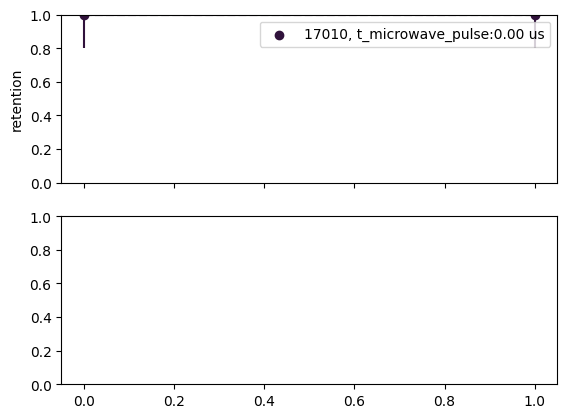

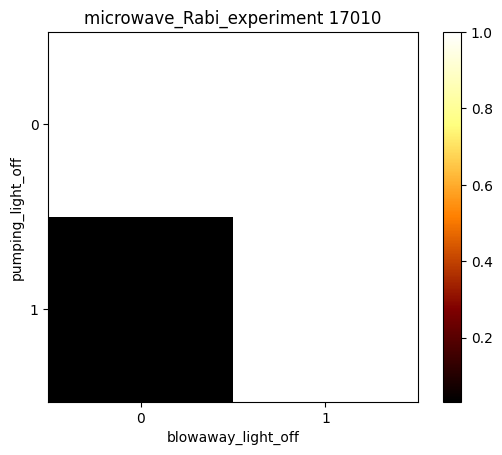

show loading


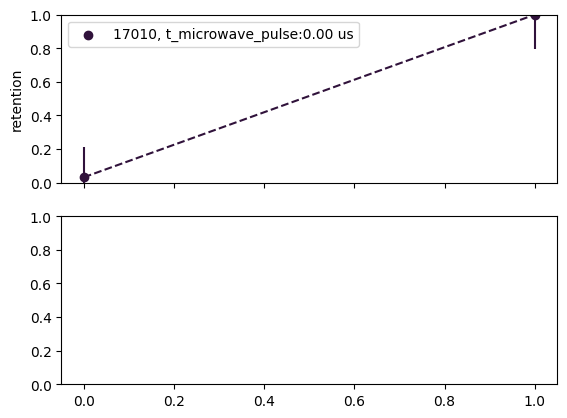

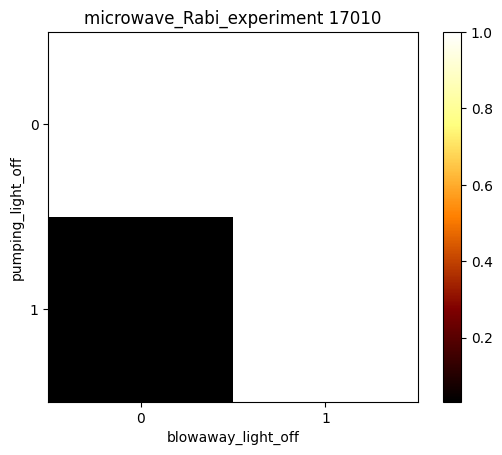

show loading


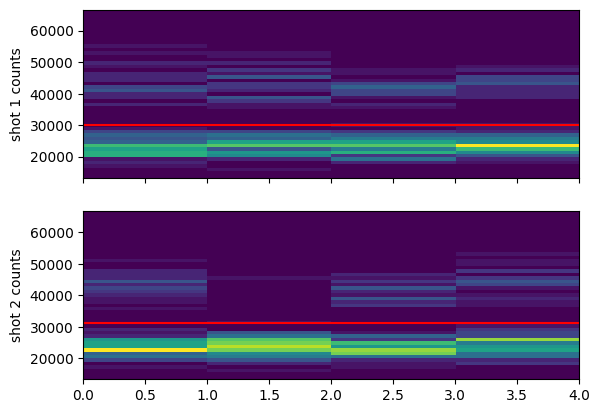

In [161]:
compare = False # compare multiple files in the same retention and loading plots. set to False for 2D plotting of only 1 file
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = False

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    58: '' # failed because I used ints instead of booleans for blowaway and pumping light off
} # the files to plot

# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) + len(scan_sequence2)*(len(scan_sequence2)>1) #int(len(photocounts)/n_measurements)

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)

        if len(scan_sequence2) > 1 and not compare:
            dvar1 = abs(float(scan_sequence1[1])-float(scan_sequence1[0]))
            dvar2 = abs(float(scan_sequence2[1])-float(scan_sequence2[0]))
            
            # plot a colormap of the retention
            fig,ax = plt.subplots()
            cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                          extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
            im = ax.get_images()
            extent =  im[0].get_extent()
            # plt.setp(ax.spines.values(), linewidth=0.1)
            ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
            ax.set_xticks(scan_sequence1)
            ax.set_yticks(scan_sequence2)
            ax.set_title(experiment_function+' '+str(rid))
            ax.set_xlabel(scan_variable1_name)
            ax.set_ylabel(scan_variable2_name)
            # ax.tick_params(axis='both', labelsize=10)
            fig.colorbar(cax)
            # plt.clim(0,1)
            plt.show()
    
        if showloading:
            print("show loading")
            
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [162]:
retention_array

array([1.        , 0.03225806, 1.        , 1.        ])

In [155]:
scan_sequence1, scan_sequence2

(array([False,  True]), array([False,  True]))

### microwave time scans

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
show loading


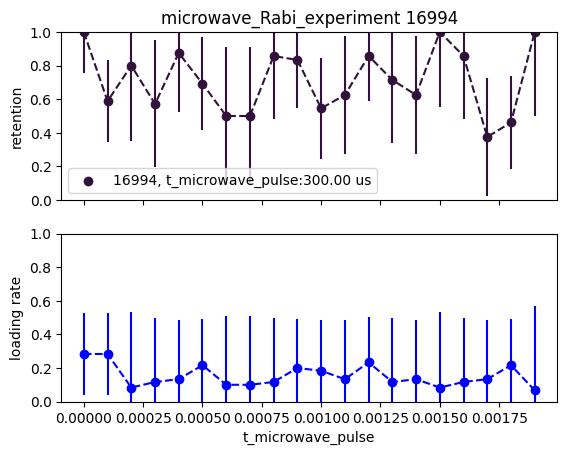

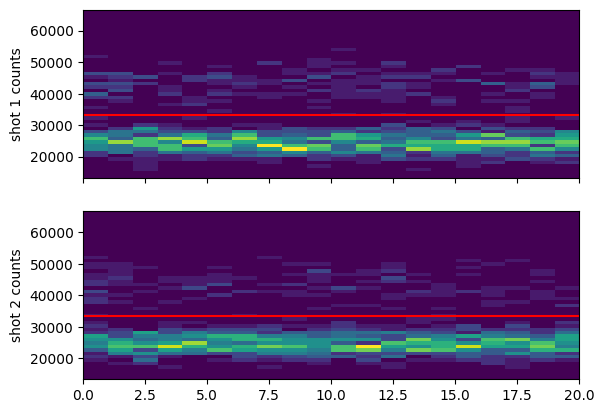

In [145]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = False

cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    47: '' # garbage, but atom loading rate was low so the signal is hidden in the noise
} # the files to plot

# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            print("show loading")
            
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### microwave frequency scans - compare to 8.27 and 8.23

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


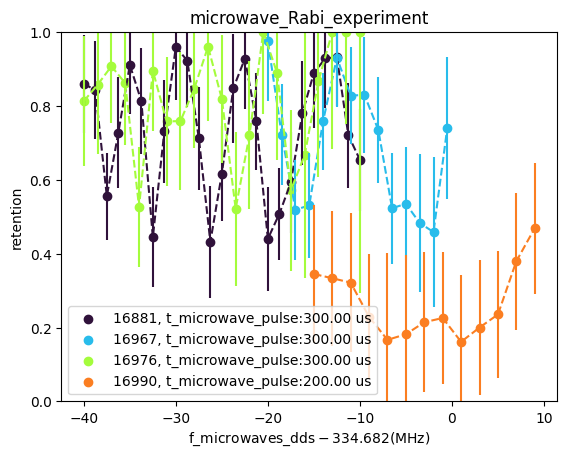

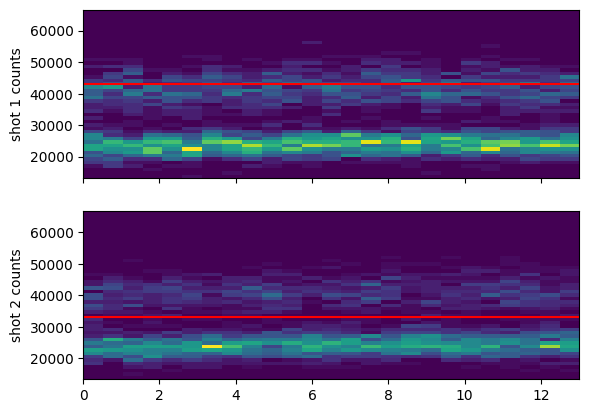

In [138]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    16: '',
    36: '',
    38: '',
    44: '' # uses optimizer values from \2024-08-28\13\000016983-GeneralVariableOptimizer_microwave_Rabi_optimized_for_atom_blowaway.h5. if this is real, it is the best contrast so far.
} # the files to plot

custom_xlabel = True
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            print("show loading")
            
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

## 2024.08.28

In [130]:
fnames = get_files_by_criteria(date_filters=["2024-08-28","2024-08-27","2024-08-23"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} ({f}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 40 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\10\000016861-GeneralVariableScan.h5) scanned over AX_volts_OP
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\10\000016862-GeneralVariableScan.h5) scanned over p_D1_pumping_SP
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\11\000016865-GeneralVariableScan.h5) scanned over dummy_variable
file 6 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\11\000016867-GeneralVariableScan.h5) scanned over dummy_variable
file 7 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\11\000016869-GeneralVariableScan.h5) scanned over dummy_variable
file 8 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\11\000016871-GeneralVariableScan.h5) scanned over dummy_variable
file 9 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\11\000016872-GeneralVariableScan.h5) scanned over p_D1_pum

### microwave frequency scans (t_microwave_pulse=300us) - compare to 8.27

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


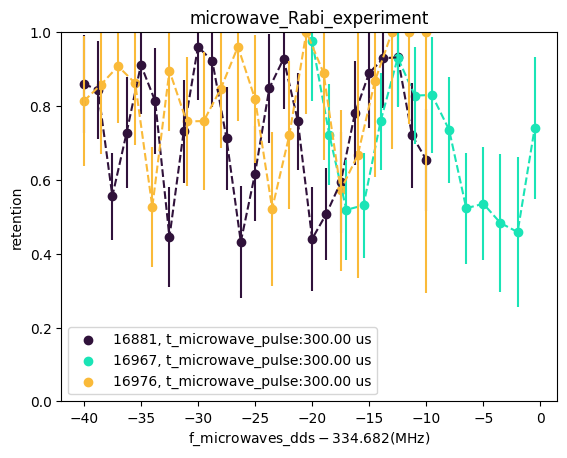

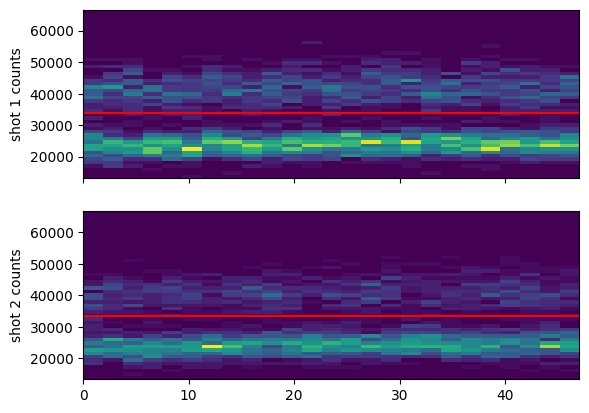

In [134]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    16: '',
    36: '',
    38: '',
} # the files to plot

custom_xlabel = True
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            print("show loading")
            
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

## 2024.08.27

In [135]:
fnames = get_files_by_criteria(date_filters=["2024-08-27","2024-08-23"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} ({f}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 40 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\10\000016861-GeneralVariableScan.h5) scanned over AX_volts_OP
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\10\000016862-GeneralVariableScan.h5) scanned over p_D1_pumping_SP
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\11\000016865-GeneralVariableScan.h5) scanned over dummy_variable
file 6 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\11\000016867-GeneralVariableScan.h5) scanned over dummy_variable
file 7 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\11\000016869-GeneralVariableScan.h5) scanned over dummy_variable
file 8 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\11\000016871-GeneralVariableScan.h5) scanned over dummy_variable
file 9 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\11\000016872-GeneralVariableScan.h5) scanned over p_D1_pum

### microwave frequency scans (t_microwave_pulse=300us) - compare to 8.27

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


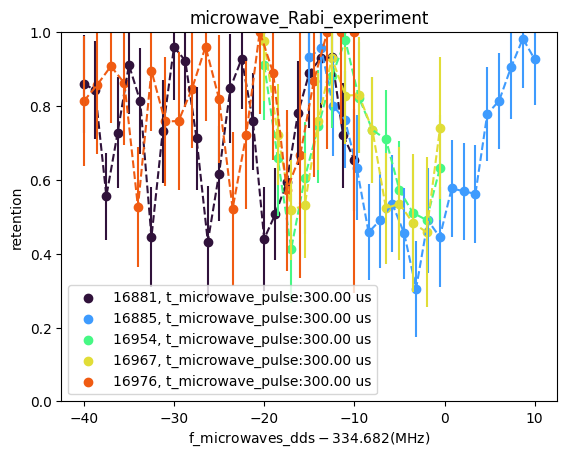

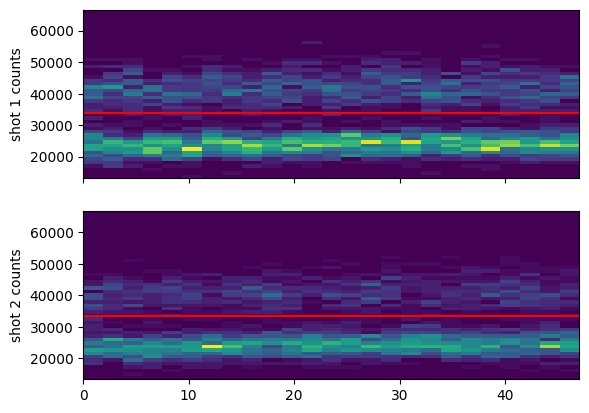

In [136]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    16: '',
    24: '',
    34: '',
    36: '',
    38: '',
} # the files to plot

custom_xlabel = True
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### microwave frequency scans (t_microwave_pulse=300us)

In [116]:
fnames = get_files_by_criteria(date_filters=["2024-08-27","2024-08-26"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} ({f}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 15 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-26\10\000016892-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-26\12\000016909-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-26\12\000016912-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-26\16\000016923-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 7 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-26\17\000016924-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 9 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-27\10\000016932-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 11 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-27\15\000016954-GeneralVariableScan.h5) scanne

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


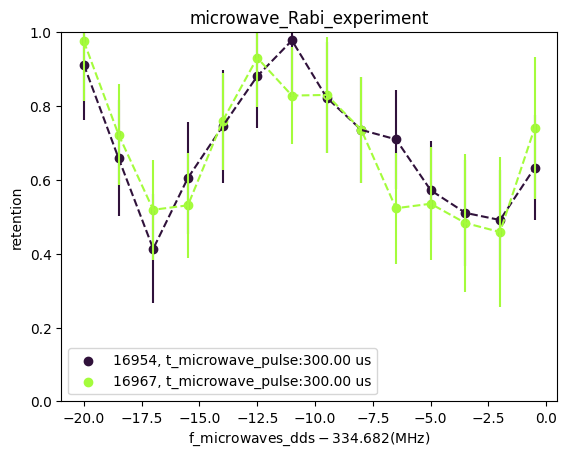

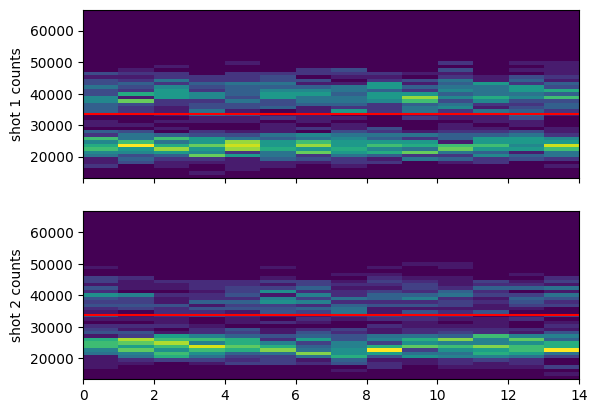

In [119]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    11: '',
    13: '',
} # the files to plot

custom_xlabel = True
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

# loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### microwave frequency scans (t_microwave_pulse=350us)
Lots of dips, but the main dip shows up roughly where we expect it given a FORT depth of ~ 2.1 mK and ~ 3.2 G bias field.

In [92]:
-4.8*2.1 + 0.5*3.2**2 # Stark shift from FORT + differential Zeeman shift

-4.959999999999999

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


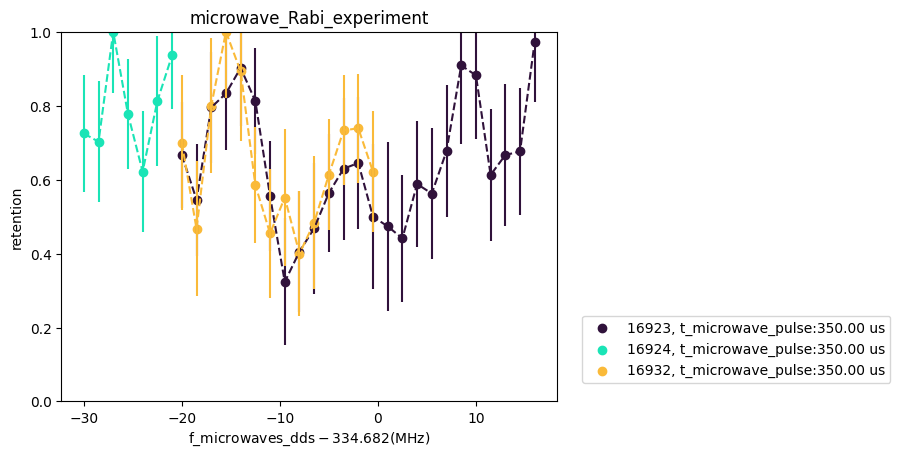

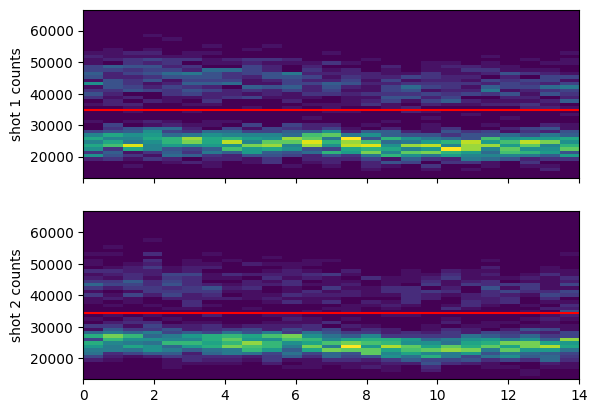

In [113]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
cutoff1 = cutoff2 = 492 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    5: '',
    7: '',
    9: '',
} # the files to plot

custom_xlabel = True
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
# loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    if otsu_threshold:
        cutoff1 = threshold_otsu(photocounts)
        cutoff2 = threshold_otsu(photocounts2)
    
    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

523


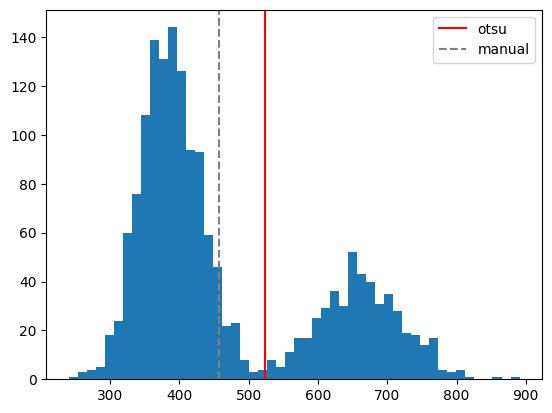

In [112]:
fig,ax = plt.subplots()
ax.hist(photocounts,bins=50)
otsu_cutoff = threshold_otsu(photocounts)
print(otsu_cutoff)
ax.axvline(otsu_cutoff,label='otsu',color='red')
ax.axvline(cutoff1,label='manual',color='grey',linestyle='--')
ax.legend()

In [96]:
fnames = get_files_by_criteria(date_filters=["2024-08-26"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} ({f}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 9 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-26\10\000016892-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-26\12\000016909-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-26\12\000016912-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-26\16\000016923-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 7 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-26\17\000016924-GeneralVariableScan.h5) scanned over f_microwaves_dds
skipped 4 redundant files
1 scan_variables over 5 variable scans


### microwave frequency scans
Lots of dips, but the main dip shows up roughly where we expect it given a FORT depth of ~ 2.1 mK and ~ 3.2 G bias field.

In [92]:
-4.8*2.1 + 0.5*3.2**2 # Stark shift from FORT + differential Zeeman shift

-4.959999999999999

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


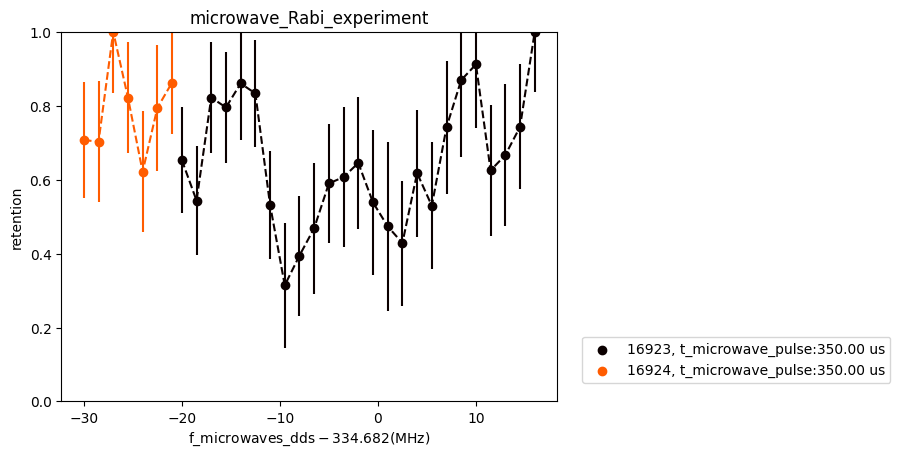

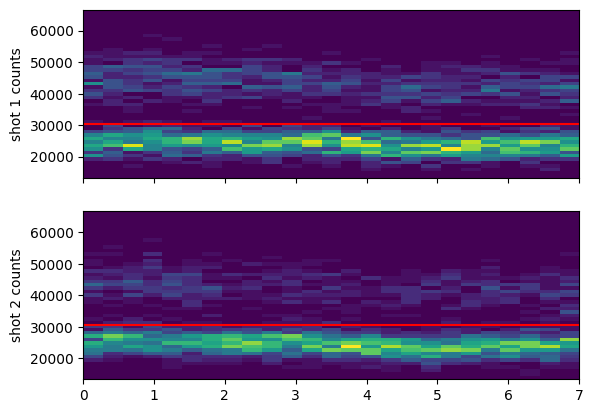

In [99]:
compare = True # compare multiple files in the same retention and loading plots

file_indices = {
    # 3: '',
    5: '',
    7: '',
} # the files to plot

custom_xlabel = True
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
# loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 30500*t_SPCM_first_shot  # changed to 30500

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

## 2024.08.23

In [101]:
fnames = get_files_by_criteria(date_filters=["2024-08-23"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} ({f}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 32 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\10\000016861-GeneralVariableScan.h5) scanned over AX_volts_OP
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\10\000016862-GeneralVariableScan.h5) scanned over p_D1_pumping_SP
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\11\000016865-GeneralVariableScan.h5) scanned over dummy_variable
file 6 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\11\000016867-GeneralVariableScan.h5) scanned over dummy_variable
file 7 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\11\000016869-GeneralVariableScan.h5) scanned over dummy_variable
file 8 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\11\000016871-GeneralVariableScan.h5) scanned over dummy_variable
file 9 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-23\11\000016872-GeneralVariableScan.h5) scanned over p_D1_pum

### microwave pulse time scan -- our first clear Rabi oscillations
Frequency parked by eye at the center of the main spectroscopy feature, ~ -3.2 kHz from the bare state resonance

In [102]:
-4.8*2.1 + 0.5*3.2**2 # Stark shift from FORT + differential Zeeman shift

-4.959999999999999

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


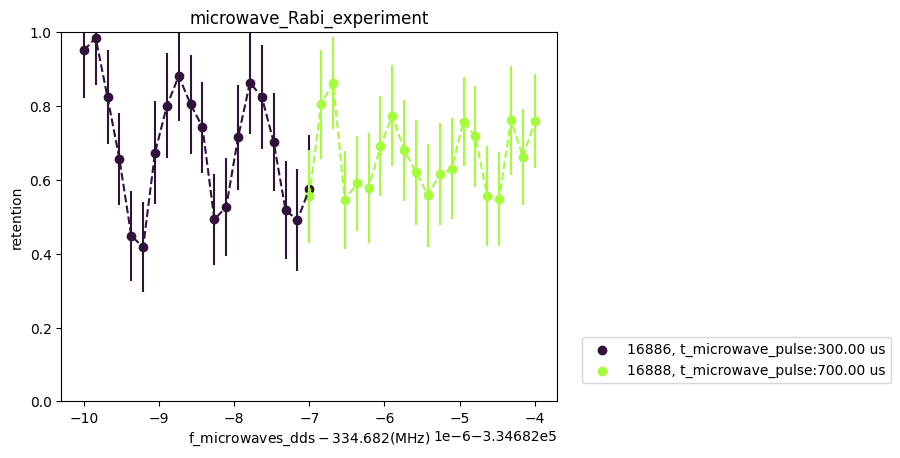

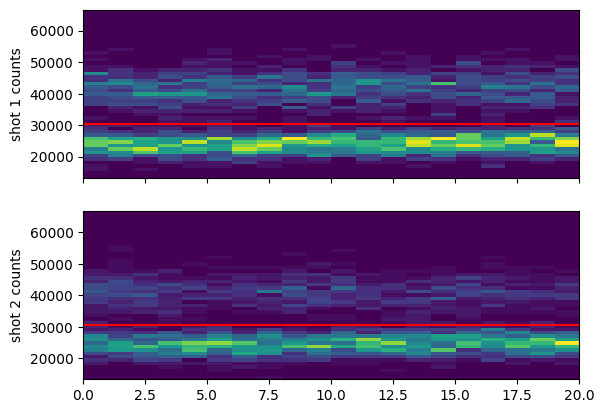

In [103]:
compare = True # compare multiple files in the same retention and loading plots

file_indices = {
    26: '',
    28: ''
} # the files to plot

custom_xlabel = True
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''

loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
# loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 30500*t_SPCM_first_shot  # changed to 30500

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### microwave frequency scans
Lots of dips, but the main dip shows up roughly where we expect it given a FORT depth of ~ 2.1 mK and ~ 3.2 G bias field.

In [92]:
-4.8*2.1 + 0.5*3.2**2 # Stark shift from FORT + differential Zeeman shift

-4.959999999999999

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


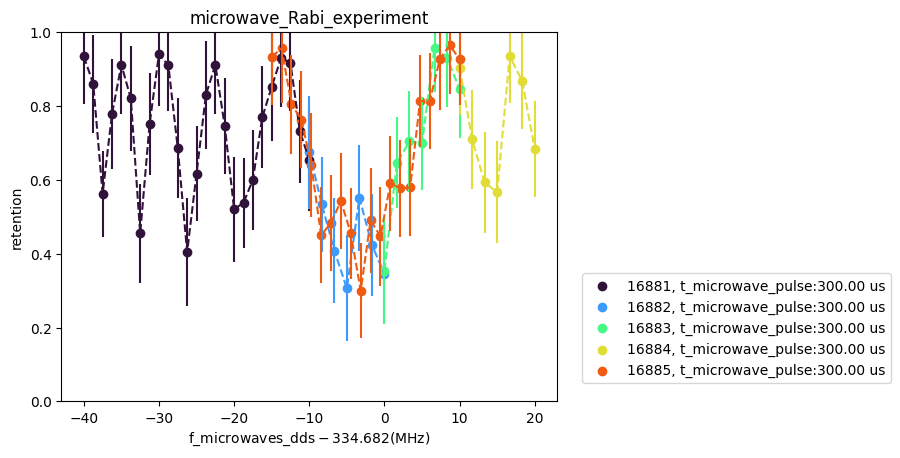

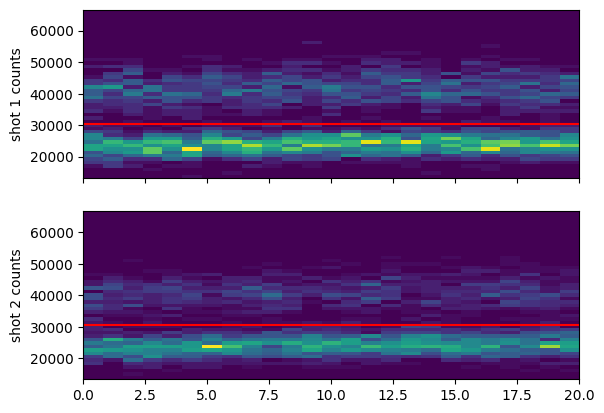

In [105]:
compare = True # compare multiple files in the same retention and loading plots

file_indices = {
    # 12: '', # 350 us pulse time; others below are 300 us
    16: '',
    18: '',
    20: '',
    22: '',
    24: ''
} # the files to plot

custom_xlabel = True
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,0.05)
# loc='lower left' 
# loc='upper right'
# loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 30500*t_SPCM_first_shot  # changed to 30500

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

## 2024.08.22

In [70]:
fnames = get_files_by_criteria(date_filters=["2024-08-21"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} ({f}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 39 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-21\10\000016773-GeneralVariableScan.h5) scanned over t_FORT_drop
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-21\10\000016774-GeneralVariableScan.h5) scanned over t_FORT_drop
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-21\10\000016775-GeneralVariableScan.h5) scanned over t_FORT_drop
file 6 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-21\13\000016781-GeneralVariableScan.h5) scanned over dummy_variable
file 8 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-21\13\000016784-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 10 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-21\14\000016785-GeneralVariableScan_microwave_Rabi_scan_over_f_microwaves_dds.h5) scanned over f_microwaves_dds
file 11 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-08-21\14\000016787-Gene

### microwave frequency scans - after switching to the APD for FORT feedback - cutoff @ 30500

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


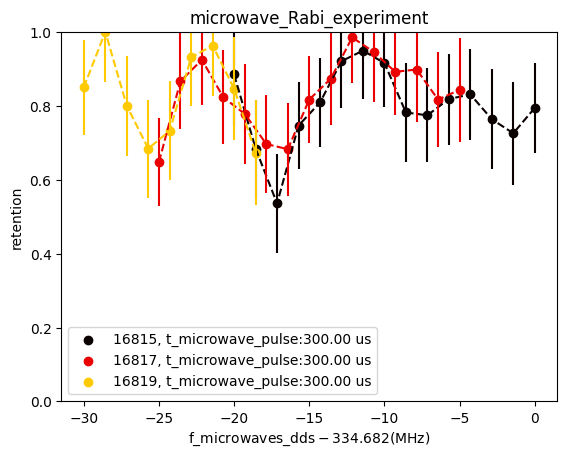

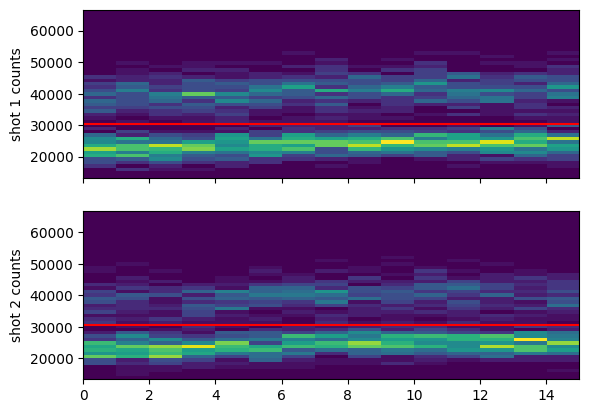

In [81]:
compare = True # compare multiple files in the same retention and loading plots

file_indices = {
    # 8: '', # frequency scan from -20kHz to 0 with t_microwave_pulse=300us. horn is close to upper quad coil but it was removed and reinstalled, because the Luca was there this week.
    # # 12: '', # this was a fluke.
    # # 16: '', # this was a fluke.
    33: '',
    35: '',
    37: ''
} # the files to plot

custom_xlabel = True
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,-0.05)
loc='lower left' 
loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 30500*t_SPCM_first_shot  # changed to 30500

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [82]:
0.584*3**2

5.255999999999999

### microwave pulse time scans - after switching to the APD for FORT feedback - cutoff @ 30000

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


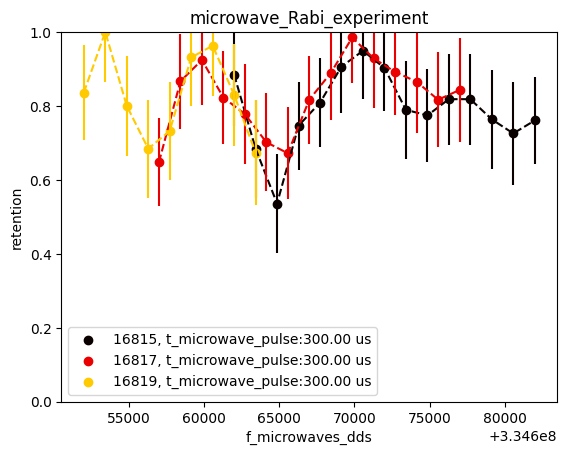

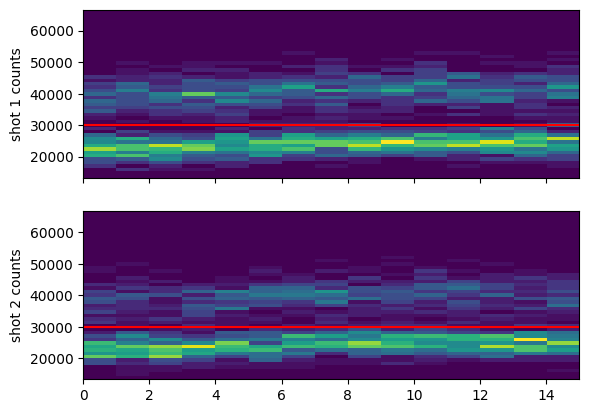

In [78]:
compare = True # compare multiple files in the same retention and loading plots

# blow-away is working but there's some kind of bug such that the t_blowaway variable seems to be ignored. 
file_indices = {
    33: '',
    35: '',
    37: ''
} # the files to plot

custom_xlabel = False
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,-0.05)
loc='lower left' 
loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 30000*t_SPCM_first_shot  # changed to 30000

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [79]:
np.linspace(-20.0,0.0,11)*kHz

array([-20000., -18000., -16000., -14000., -12000., -10000.,  -8000.,
        -6000.,  -4000.,  -2000.,      0.])

In [80]:
t_microwave_pulse

0.0003

## 2024.07.31

In [63]:
fnames = get_files_by_criteria(date_filters=["2024-07-31"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} ({f}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 29 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-31\10\000016285-GeneralVariableScan.h5) scanned over dummy_variable
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-31\10\000016287-GeneralVariableScan.h5) scanned over dummy_variable
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-31\10\000016291-GeneralVariableScan.h5) scanned over dummy_variable
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-31\15\000016305-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 6 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-31\15\000016307-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 8 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-31\15\000016308-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 10 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-31\16\000016312-GeneralVariableScan.h5) scanned over

### microwave frequency scans - after switching to the APD for FORT feedback

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


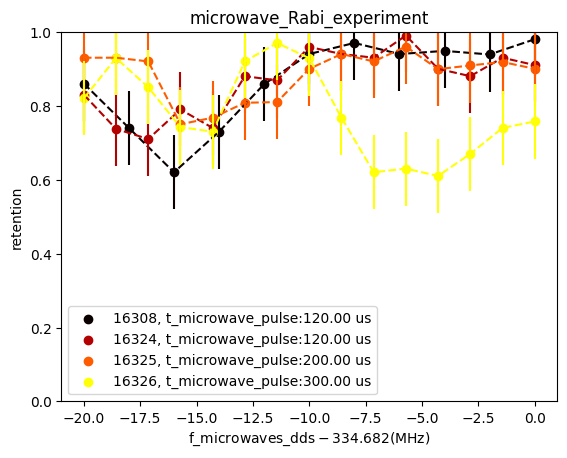

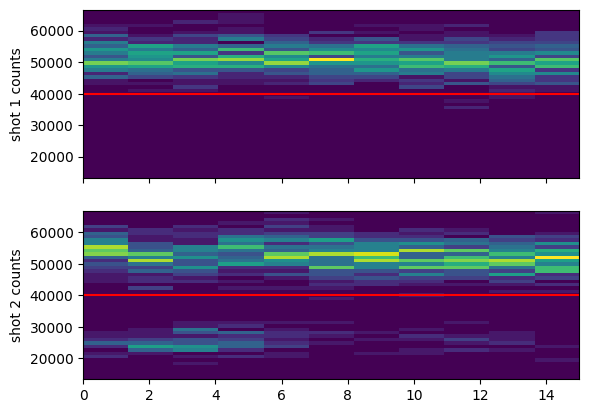

In [69]:
compare = True # compare multiple files in the same retention and loading plots

# blow-away is working but there's some kind of bug such that the t_blowaway variable seems to be ignored. 
file_indices = {
    8: '', # frequency scan from -20kHz to 0 with t_microwave_pulse=300us. horn is close to upper quad coil but it was removed and reinstalled, because the Luca was there this week.
    # 12: '', # this was a fluke.
    # 16: '', # this was a fluke.
    23: '',
    25: '',
    27: ''
} # the files to plot

custom_xlabel = True
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,-0.05)
loc='lower left' 
loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 40000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### microwave pulse time scans - after switching to the APD for FORT feedback

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


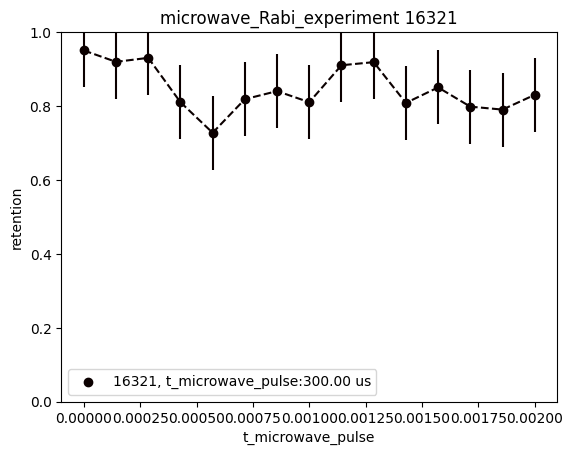

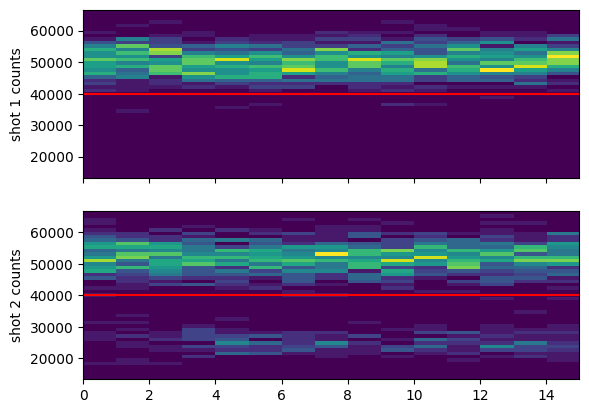

In [62]:
compare = True # compare multiple files in the same retention and loading plots

# blow-away is working but there's some kind of bug such that the t_blowaway variable seems to be ignored. 
file_indices = {
    # 18: '',
    19: '',
} # the files to plot

custom_xlabel = False
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,-0.05)
loc='lower left' 
loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 40000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [47]:
np.linspace(-20.0,0.0,11)*kHz

array([-20000., -18000., -16000., -14000., -12000., -10000.,  -8000.,
        -6000.,  -4000.,  -2000.,      0.])

In [49]:
t_microwave_pulse

0.00011999999999999999

In [63]:
fnames = get_files_by_criteria(date_filters=["2024-07-31"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} ({f}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 29 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-31\10\000016285-GeneralVariableScan.h5) scanned over dummy_variable
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-31\10\000016287-GeneralVariableScan.h5) scanned over dummy_variable
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-31\10\000016291-GeneralVariableScan.h5) scanned over dummy_variable
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-31\15\000016305-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 6 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-31\15\000016307-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 8 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-31\15\000016308-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 10 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-31\16\000016312-GeneralVariableScan.h5) scanned over

### microwave frequency scans - after switching to the APD for FORT feedback

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


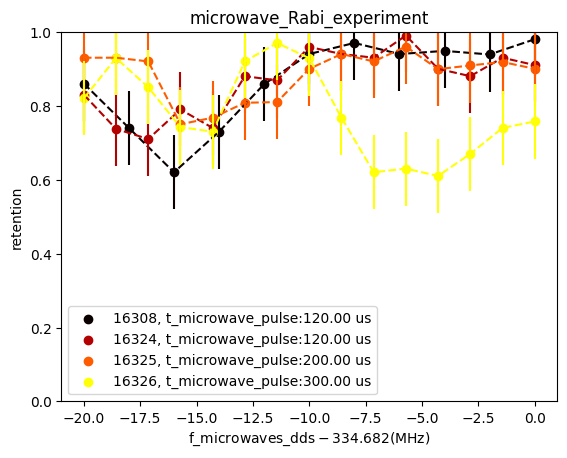

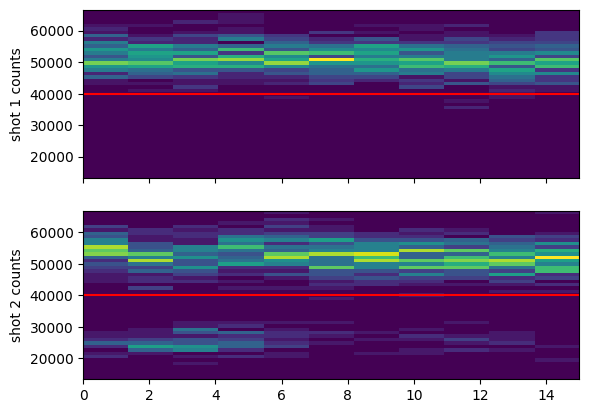

In [69]:
compare = True # compare multiple files in the same retention and loading plots

# blow-away is working but there's some kind of bug such that the t_blowaway variable seems to be ignored. 
file_indices = {
    8: '', # frequency scan from -20kHz to 0 with t_microwave_pulse=300us. horn is close to upper quad coil but it was removed and reinstalled, because the Luca was there this week.
    # 12: '', # this was a fluke.
    # 16: '', # this was a fluke.
    23: '',
    25: '',
    27: ''
} # the files to plot

custom_xlabel = True
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,-0.05)
loc='lower left' 
loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 40000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### microwave pulse time scans - after switching to the APD for FORT feedback

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


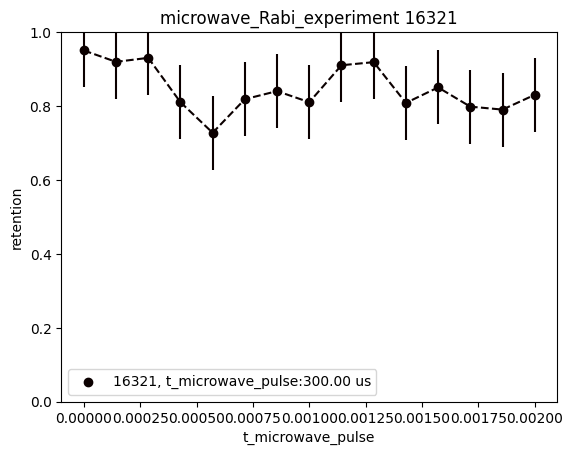

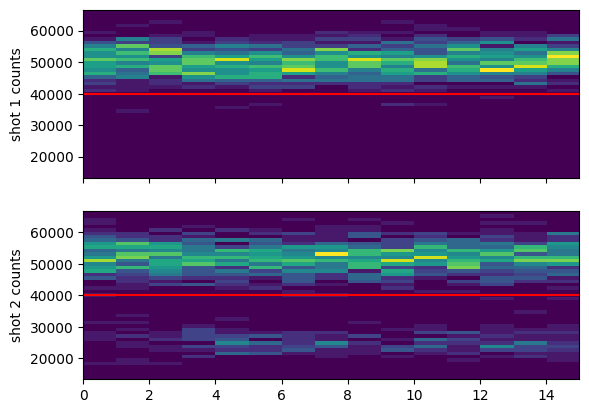

In [62]:
compare = True # compare multiple files in the same retention and loading plots

# blow-away is working but there's some kind of bug such that the t_blowaway variable seems to be ignored. 
file_indices = {
    # 18: '',
    19: '',
} # the files to plot

custom_xlabel = False
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing

if custom_xlabel:
    # xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,-0.05)
loc='lower left' 
loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 40000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [47]:
np.linspace(-20.0,0.0,11)*kHz

array([-20000., -18000., -16000., -14000., -12000., -10000.,  -8000.,
        -6000.,  -4000.,  -2000.,      0.])

In [49]:
t_microwave_pulse

0.00011999999999999999

## 2024.07.22

In [35]:
fnames = get_files_by_criteria(date_filters=["2024-07-22"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} ({f}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 13 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-22\09\000015741-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-22\09\000015745-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-22\10\000015746-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-22\11\000015747-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 7 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-22\11\000015750-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 9 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-22\11\000015751-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 11 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-22\12\000015752-GeneralVariableScan.h5) scan

### microwave frequency scans - After moving the horn - t_microwave_pulse=300us

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


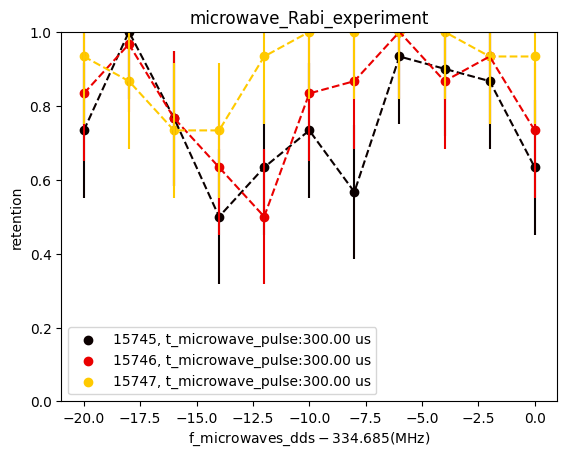

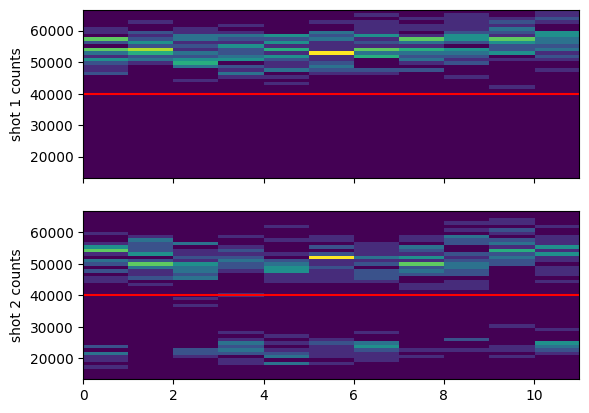

In [31]:
compare = True # compare multiple files in the same retention and loading plots

# blow-away is working but there's some kind of bug such that the t_blowaway variable seems to be ignored. 
file_indices = {
    1: '', # frequency scan from -20kHz to 0 with t_microwave_pulse=300us (after moving the horn)
    3: '', # the exact same as 1
    5: '' # the exact same as 1, but with the experiment box closed.
} # the files to plot

custom_xlabel = True
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xlabel = r"$\rm{f\_microwaves\_dds} - 334.685 (\rm MHz)$"
xsteps_xform = lambda x: x # do nothing
xsteps_xform = lambda x: (x - 334.685e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

if custom_xlabel:
    xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xsteps_xform = lambda x: (x - 334.685e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,-0.05)
loc='lower left' 
loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 40000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### microwave pulse length scan

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


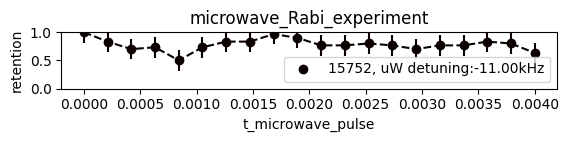

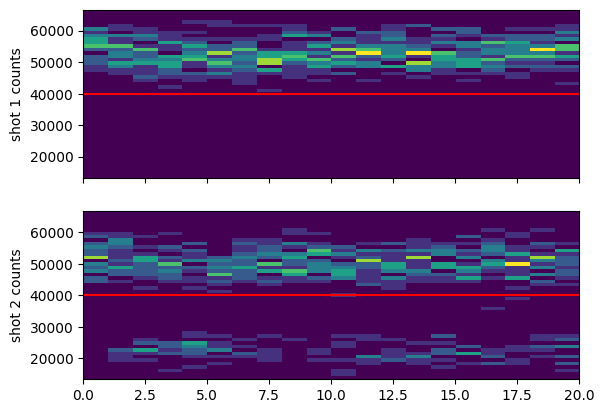

In [44]:
compare = True # compare multiple files in the same retention and loading plots

# blow-away is working but ther's some kind of bug such that the t_blowaway variable seems to be ignored. 
file_indices = {
    # 9: '',
    11: '',
} # the files to plot

custom_xlabel = False
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xlabel = r"$\rm{f\_microwaves\_dds} - 334.685 (\rm MHz)$"
xsteps_xform = lambda x: x # do nothing
xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

if custom_xlabel:
    xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xsteps_xform = lambda x: (x - 334.685e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,-0.05)
loc='lower left' 
loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 40000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        # ax_ret.set_aspect(0.0005)
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

## 2024.07.21

In [13]:
fnames = get_files_by_criteria(date_filters=["2024-07-21"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} ({f}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

found 51 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-21\11\000015694-GeneralVariableScan.h5) scanned over p_D1_pumping_SP
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-21\12\000015695-GeneralVariableScan.h5) scanned over p_D1_pumping_SP
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-21\13\000015703-GeneralVariableScan.h5) scanned over t_depumping
file 6 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-21\13\000015705-GeneralVariableScan.h5) scanned over t_depumping
file 8 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-21\13\000015707-GeneralVariableScan_optical_pumping_scan_over_f_microwaves_dds.h5) scanned over f_microwaves_dds
file 9 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-21\14\000015708-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 11 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-21\14\000015709

### microwave frequency scans - several dips - reproducable - before moving the horn

In [17]:
scan_dictionary

{'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-21\\11\\000015694-GeneralVariableScan.h5': 'p_D1_pumping_SP',
 'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-21\\12\\000015695-GeneralVariableScan.h5': 'p_D1_pumping_SP',
 'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-21\\13\\000015703-GeneralVariableScan.h5': 't_depumping',
 'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-21\\13\\000015705-GeneralVariableScan.h5': 't_depumping',
 'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-21\\13\\000015707-GeneralVariableScan_optical_pumping_scan_over_f_microwaves_dds.h5': 'f_microwaves_dds',
 'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-21\\14\\000015708-GeneralVariableScan.h5': 'f_microwaves_dds',
 'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-21\\14\\000015709-GeneralVariableScan.h5': 'f_microwaves_dds',
 'C:\\Networking 

In [18]:
scan_groups = {}
for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
scan_groups

{'p_D1_pumping_SP': ['C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-21\\11\\000015694-GeneralVariableScan.h5',
  'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-21\\12\\000015695-GeneralVariableScan.h5',
  'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-21\\16\\000015721-GeneralVariableScan.h5',
  'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-21\\17\\000015727-GeneralVariableScan.h5',
  'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-21\\17\\000015728-GeneralVariableScan.h5'],
 't_depumping': ['C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-21\\13\\000015703-GeneralVariableScan.h5',
  'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-21\\13\\000015705-GeneralVariableScan.h5'],
 'f_microwaves_dds': ['C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-21\\13\\000015707-GeneralVariableScan_optical_pumpi

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


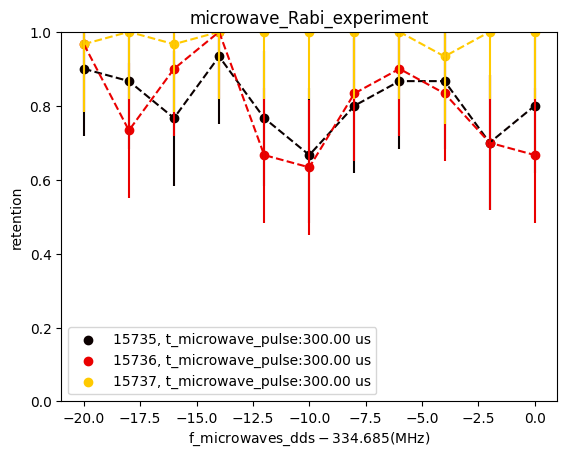

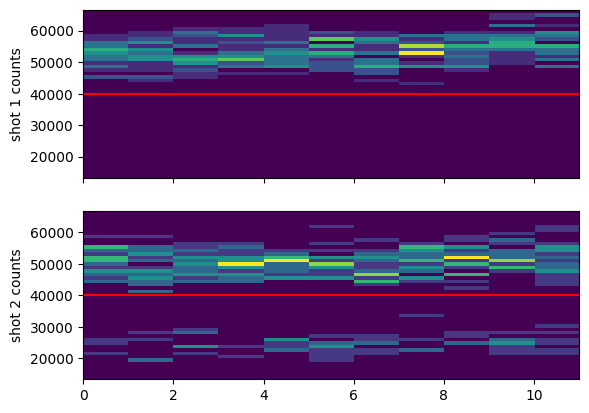

In [22]:
compare = True # compare multiple files in the same retention and loading plots

# blow-away is working but ther's some kind of bug such that the t_blowaway variable seems to be ignored. 
file_indices = {
    41: '', # frequency scan from -20kHz to 0 with t_microwave_pulse=300us (before moving the horn)
    43: '', # the ecaxt same as 41
    45: '' # the same but with microwave cable disconnected.
} # the files to plot

custom_xlabel = True
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xlabel = r"$\rm{f\_microwaves\_dds} - 334.685 (\rm MHz)$"
xsteps_xform = lambda x: x # do nothing
xsteps_xform = lambda x: (x - 334.685e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

if custom_xlabel:
    xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xsteps_xform = lambda x: (x - 334.685e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,-0.05)
loc='lower left' 
loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 40000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### microwave frequency scans - After moving the horn - t_microwave_pulse=300us

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


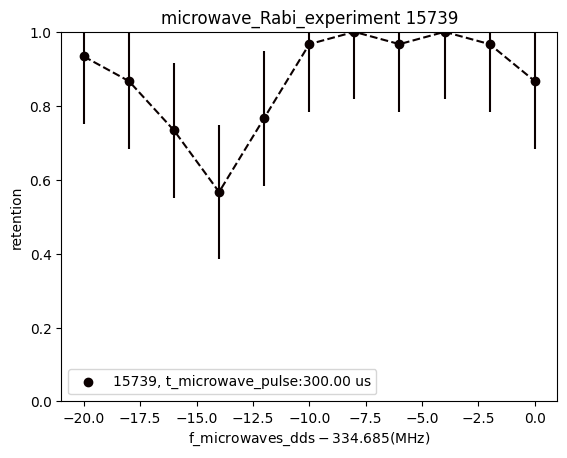

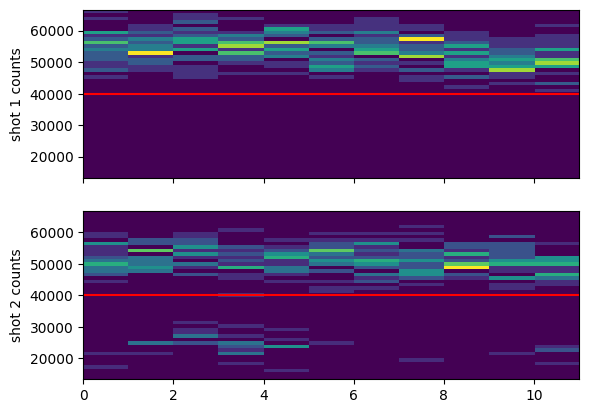

In [23]:
compare = False # compare multiple files in the same retention and loading plots

# blow-away is working but ther's some kind of bug such that the t_blowaway variable seems to be ignored. 
file_indices = {
    47: '', # frequency scan from -20kHz to 0 with t_microwave_pulse=300us (after moving the horn)
} # the files to plot

custom_xlabel = True
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xlabel = r"$\rm{f\_microwaves\_dds} - 334.685 (\rm MHz)$"
xsteps_xform = lambda x: x # do nothing
xsteps_xform = lambda x: (x - 334.685e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

if custom_xlabel:
    xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xsteps_xform = lambda x: (x - 334.685e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,-0.05)
loc='lower left' 
loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 40000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### microwave frequency scans - After moving the horn - t_microwave_pulse=100us

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


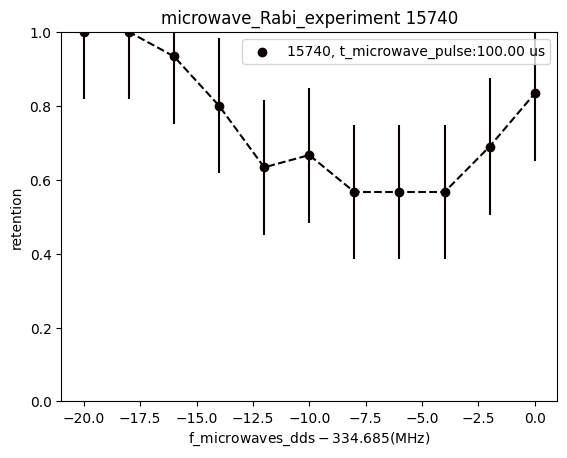

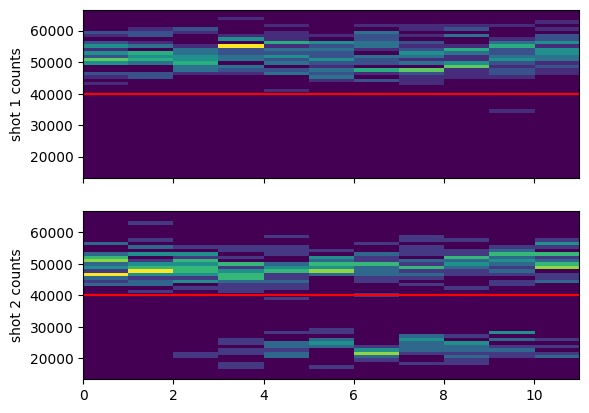

In [24]:
compare = False # compare multiple files in the same retention and loading plots

# blow-away is working but ther's some kind of bug such that the t_blowaway variable seems to be ignored. 
file_indices = {
    49: '', # frequency scan from -20kHz to 0 with t_microwave_pulse=300us (after moving the horn)
} # the files to plot

custom_xlabel = True
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xlabel = r"$\rm{f\_microwaves\_dds} - 334.685 (\rm MHz)$"
xsteps_xform = lambda x: x # do nothing
xsteps_xform = lambda x: (x - 334.685e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

if custom_xlabel:
    xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xsteps_xform = lambda x: (x - 334.685e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,-0.05)
loc='lower left' 
loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 40000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

## 2024.07.01

In [7]:
fnames = get_files_by_criteria(date_filters=["2024-07-01"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = [] 

scan_dictionary = {}
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))
        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            if "GeneralVariableScan" in f:
                try:
                    scan_var1 = str_from_h5(ds['scan_variable1_name'])
                    scan_str = scan_var1
                    if str_from_h5(ds['scan_variable2_name']) != '':
                        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                    print(f"file {i} ({f}) scanned over "+scan_str)
                    scan_dictionary[f] = scan_var1
                except:
                    print(f"oops... something wrong with {f}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
    finally:
        file.close()
print(f"skipped {len(fnames)-len(rid_list)} redundant files")
scan_groups = {}

for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
print(f"{len(scan_groups)} scan_variables over {len(scan_dictionary)} variable scans")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-01\10\000015470-GeneralVariableScan_microwave_Rabi_scan_over_f_microwaves_dds.h5, which is corrupt
skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-01\15\000015479-GeneralVariableScan_microwave_Rabi_scan_over_AZ_top_volts_OP.h5, which is corrupt
found 27 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-01\08\000015454-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-01\08\000015455-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-01\09\000015466-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-07-01\09\000015468-GeneralVariableScan.h5) scanned over f_microwaves_dds
file 6 (C:\Networking Experiment\artiq codes\artiq-master\resu

In [3]:
dir(file)

['_MutableMapping__marker',
 '__abstractmethods__',
 '__bool__',
 '__class__',
 '__class_getitem__',
 '__contains__',
 '__delattr__',
 '__delitem__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__enter__',
 '__eq__',
 '__exit__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__getnewargs__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__nonzero__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__reversed__',
 '__setattr__',
 '__setitem__',
 '__sizeof__',
 '__slots__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 '_d',
 '_e',
 '_gcpl_crt_order',
 '_id',
 '_ipython_key_completions_',
 '_lapl',
 '_lcpl',
 '_libver',
 'attrs',
 'build_virtual_dataset',
 'clear',
 'close',
 'copy',
 'create_dataset',
 'create_dataset_like',
 'create_group',
 'create_virtual_dataset',
 'driver',
 'file',
 'filename',
 'flush',
 'get',
 'id',
 'items',
 'key

### OP coil scans
The microwave frequency is set at -12 kHz from the bare resonance, which is where the dip seems to show up (see frequency scans below).

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


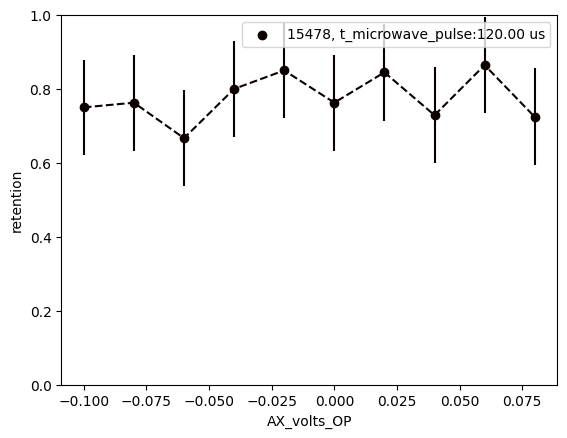

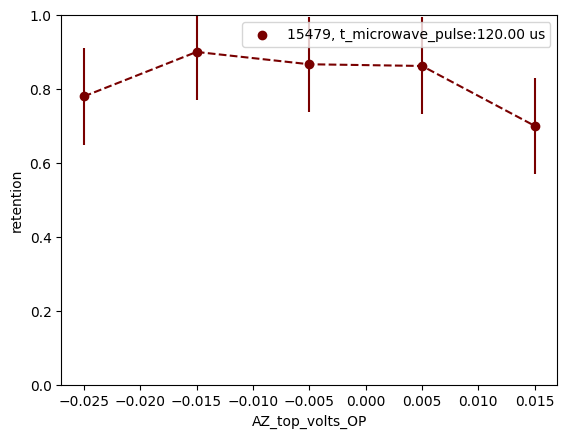

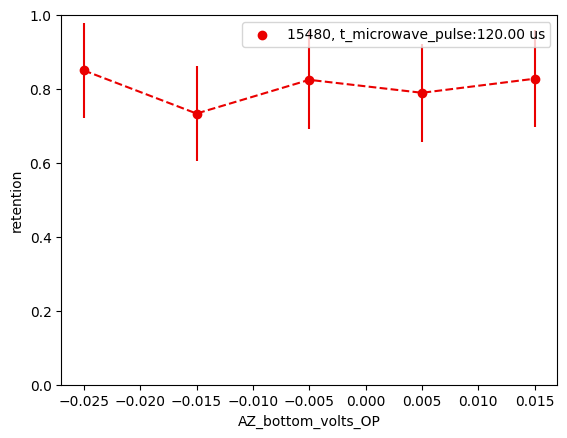

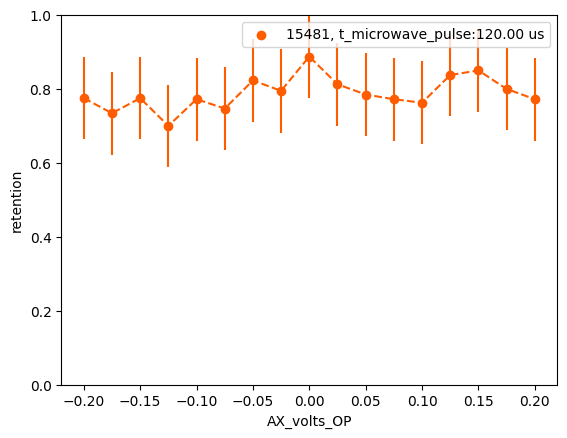

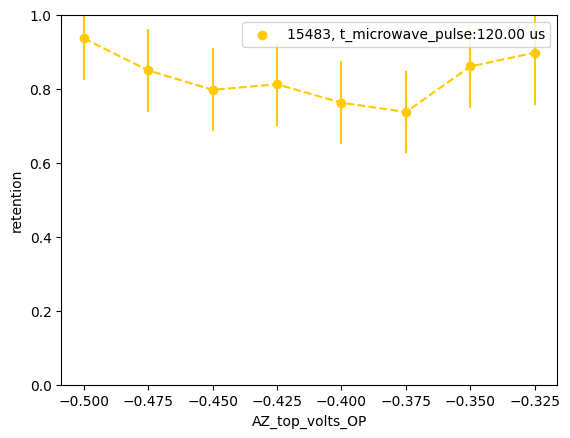

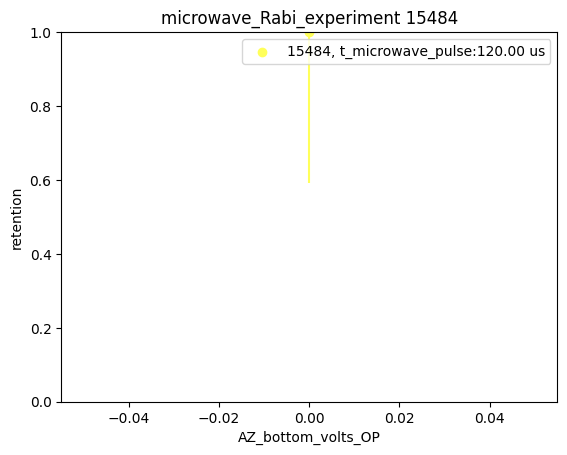

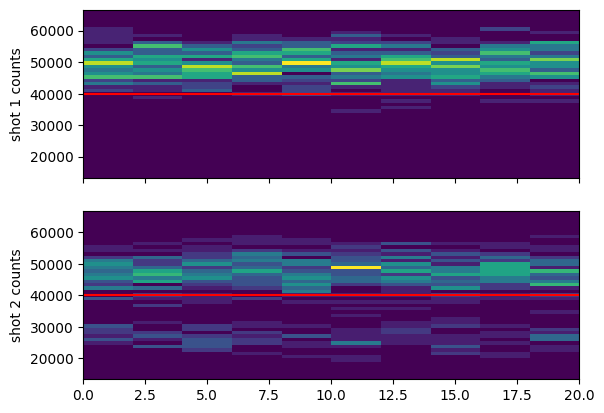

In [38]:
compare = False # compare multiple files in the same retention and loading plots, grouped by scan_variable1

# blow-away is working but ther's some kind of bug such that the t_blowaway variable seems to be ignored. 
file_indices = {
    17: '',
    19: '',
    20: '',
    22: '',
    24: '',
    26: ''
} # the files to plot

custom_xlabel = False
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
xsteps_xform = lambda x: x # do nothing
xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

if custom_xlabel:
    xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,-0.05)
loc='lower left'
loc='upper right'
loc='best'

ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 40000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [33]:
scan_dictionary

{'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-01\\08\\000015454-GeneralVariableScan.h5': 'f_microwaves_dds',
 'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-01\\08\\000015455-GeneralVariableScan.h5': 'f_microwaves_dds',
 'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-01\\09\\000015466-GeneralVariableScan.h5': 'f_microwaves_dds',
 'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-01\\09\\000015468-GeneralVariableScan.h5': 'f_microwaves_dds',
 'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-01\\10\\000015469-GeneralVariableScan.h5': 'f_microwaves_dds',
 'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-01\\10\\000015470-GeneralVariableScan.h5': 'f_microwaves_dds',
 'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-01\\11\\000015471-GeneralVariableScan.h5': 't_microwave_pulse',
 'C:\\Networking Experiment\\artiq codes\\artiq

In [34]:
scan_groups = {}
for key,val in scan_dictionary.items():
    if not val in scan_groups:
        scan_groups[val] = []
    scan_groups[val].append(key)
scan_groups

{'f_microwaves_dds': ['C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-01\\08\\000015454-GeneralVariableScan.h5',
  'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-01\\08\\000015455-GeneralVariableScan.h5',
  'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-01\\09\\000015466-GeneralVariableScan.h5',
  'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-01\\09\\000015468-GeneralVariableScan.h5',
  'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-01\\10\\000015469-GeneralVariableScan.h5',
  'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-01\\10\\000015470-GeneralVariableScan.h5',
  'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-01\\14\\000015476-GeneralVariableScan.h5'],
 't_microwave_pulse': ['C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-07-01\\11\\000015471-GeneralVariableScan.h5',
  'C:\\Networking Expe

### microwave pulse length scans

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


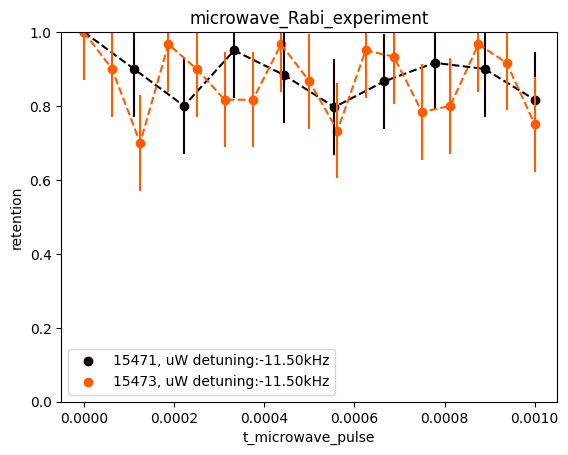

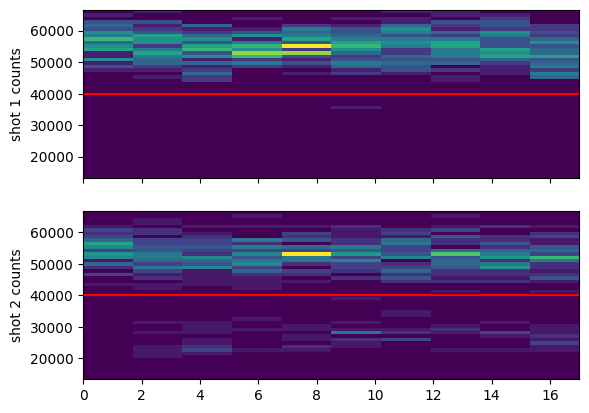

In [14]:
compare = True # compare multiple files in the same retention and loading plots

# blow-away is working but ther's some kind of bug such that the t_blowaway variable seems to be ignored. 
file_indices = {
    9: '',
    11: '',
} # the files to plot

custom_xlabel = False
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
xsteps_xform = lambda x: x # do nothing
xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

if custom_xlabel:
    xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,-0.05)
loc='lower left' 
loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 40000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### microwave frequency scans - reproducible dip around -12 kHz

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


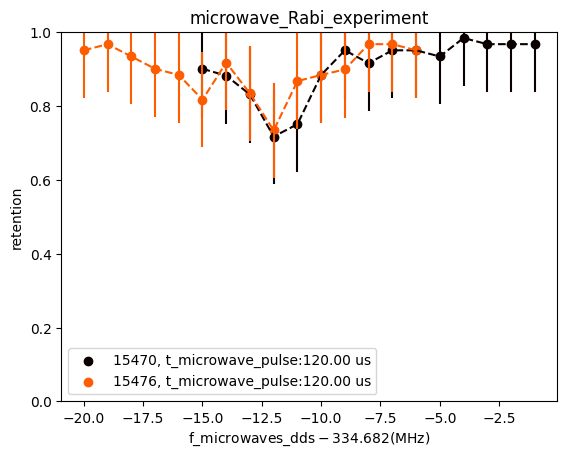

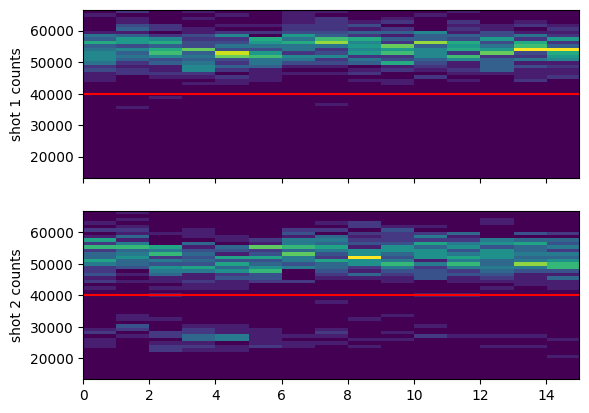

In [16]:
compare = True # compare multiple files in the same retention and loading plots

# blow-away is working but ther's some kind of bug such that the t_blowaway variable seems to be ignored. 
file_indices = {
    # 4: '', # no OP
    # 6: '', # no OP
    8: '', # first clear signal? with OP on
    15: ''
} # the files to plot

custom_xlabel = True
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
xsteps_xform = lambda x: x # do nothing
xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

if custom_xlabel:
    xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,-0.05)
loc='lower left' 
loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 40000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [17]:
334682000 - 12*kHz

334670000.0

In [ ]:
# todo: fit the dip
model = lambda f,r,a,f0,sf: r - ar*np.exp(-((f-2*f0)/sf)**2)

f_list = np.linspace(30000,350000,400)
guess = [1,0.9,0.8,155e3,37e3,5e3,15e3]
# ax.plot(f_list,model(f_list,*guess)) # check my guess
popt, pcov = curve_fit(model, combined_frequencies, combined_retention, p0=guess)
r,ar,az,fr,fz,sr,sz = popt

lmbda = 8.52e-7

def func(x):
    w0, TFORT = x
    zR = np.pi*w0**2/lmbda
    U0 = kB*TFORT
    
    # [radial eq = 0, axial eq = 0]
    return [(2/w0)*np.sqrt(kB*TFORT/mRb)/(2*np.pi) - fr, (1/zR)*np.sqrt(2*kB*TFORT/mRb)/(2*np.pi) - fz]

print("sanity check")
initial_guess = [0.7e-6, 1e-3]
print(func(initial_guess))

initial_guess = [0.7e-6, 1e-3]
w0, TFORT = fsolve(func, initial_guess)

# verify solution
print(np.isclose(func([w0, TFORT]), [0.0,0.0]))

print("radial freq.", fr*1e-3, "kHz")
print("axial freq.", fz*1e-3, "kHz")
print(f"waist w0 = {w0*1e6:.2} um")
print(f"trap depth T = {TFORT*1e3:.2} mK")

ax.plot(f_list*1e-3,model(f_list,*popt),color='indigo',zorder=3, label=r"$T_{\rm FORT}=$"+f"{TFORT*1e3:.2} mK \n"+r"$w_0=$"+f"{w0*1e6:.2} um")
ax.legend(loc='lower right')
ax.set_ylabel("retention")
ax.set_xlabel("modulation frequency (kHz)")

## 2024.06.26

In [38]:
fnames = get_files_by_criteria(date_filters=["2024-06-26"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
rid_list = []
for i,f in enumerate(fnames):
    try:
        file = h5py.File(os.path.join(results, f))

        rid = file['rid'][()]
        if rid not in rid_list:
            rid_list.append(rid)
            ds = file['datasets']
            # if "GeneralVariableScan" in f:
            try:
                scan_str = str_from_h5(ds['scan_variable1_name'])
                if str_from_h5(ds['scan_variable2_name']) != '':
                    scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
                print(f"file {i} ({f}) scanned over "+scan_str)
            except:
                print(f"oops... something wrong with {f}")
    except OSError:
        pass # if rid wasn't in the file, its corrupt
print(f"skipped {len(fnames)-len(rid_list)} redundant files")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-26\12\000015331-GeneralVariableScan_microwave_Rabi_scan_over_f_microwaves_dds.h5, which is corrupt
found 22 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-26\10\000015318-GeneralVariableScan.h5) scanned over t_blowaway
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-26\10\000015319-GeneralVariableScan.h5) scanned over t_blowaway
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-26\10\000015320-GeneralVariableScan.h5) scanned over t_blowaway
file 6 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-26\10\000015321-GeneralVariableScan.h5) scanned over t_blowaway
file 8 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-26\10\000015322-GeneralVariableScan.h5) scanned over t_blowaway
file 10 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-26\11\000015323-GeneralVariableScan.h5) scanne

In [3]:
f = h5py.File(os.path.join(results, fnames[4]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)

experiment: optical_pumping_experiment


In [5]:
override_ExperimentVariables

"{'t_pumping':2*us}"

### microwave frequency scans
No optical pumping, so we're measuring the population transfer from F=2,0 to F=1,0. The retention should increase from 0 due to microwave rotation.

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


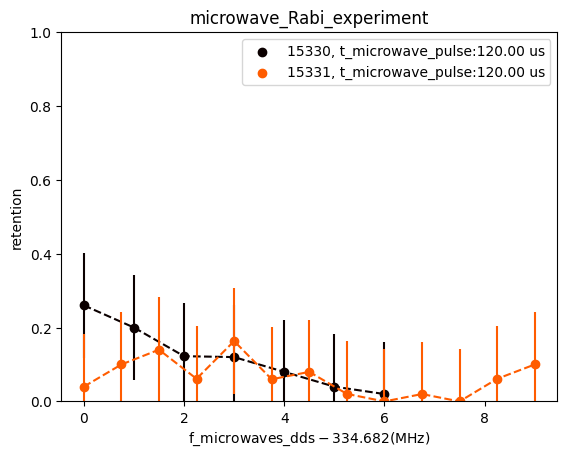

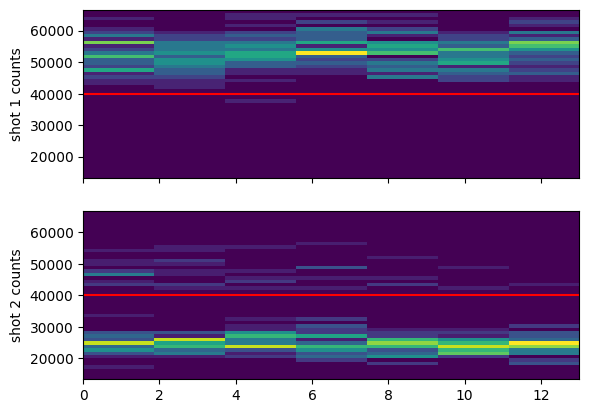

In [40]:
compare = True # compare multiple files in the same retention and loading plots

# blow-away is working but ther's some kind of bug such that the t_blowaway variable seems to be ignored. 
file_indices = {
    19: '', # something is happening, but it's gross
    21: '' # something is happening, but it's gross
} # the files to plot

custom_xlabel = True
# xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm MHz)$"
xsteps_xform = lambda x: x # do nothing
xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

if custom_xlabel:
    xsteps_xform = lambda x: 816.656 - 2*x - 92.65
    xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,-0.05)
loc='lower left' 
loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 40000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### microwave pulse time scans
No optical pumping, so we're measuring the population transfer from F=2,0 to F=1,0. The retention should increase from 0 due to microwave rotation.

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


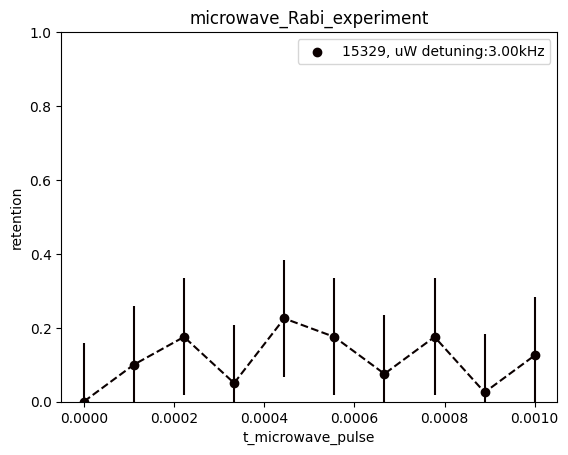

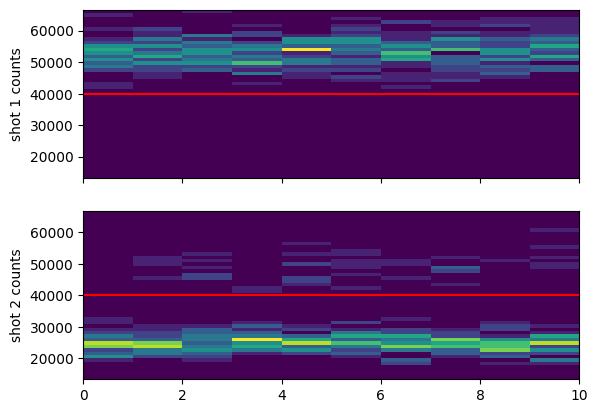

In [30]:
compare = True # compare multiple files in the same retention and loading plots

# blow-away is working but ther's some kind of bug such that the t_blowaway variable seems to be ignored. 
file_indices = {
    17: '' # something is happening, but it's gross
} # the files to plot

custom_xlabel = False
xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
if custom_xlabel:
    xsteps_xform = lambda x: 816.656 - 2*x - 92.65
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,-0.05)
loc='lower left' 
loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 40000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### blow-away diagnostics
I want to make sure I'm saturating the blow away so that my microwave signal with no OP is reliable. it's working as expected.

experiment: optical_pumping_experiment
AY_volts_OP: 2.0
experiment: optical_pumping_experiment
AY_volts_OP: 2.0
experiment: optical_pumping_experiment
AY_volts_OP: 2.0


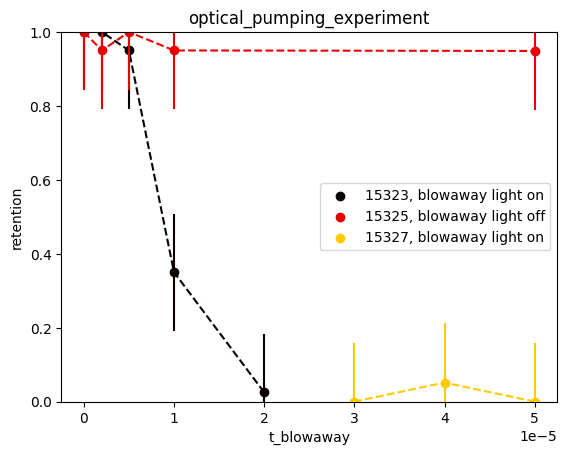

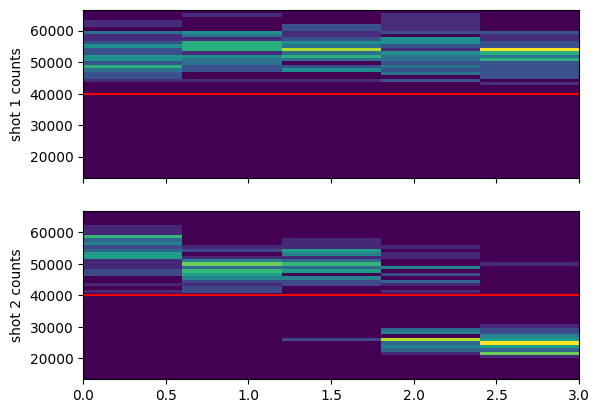

In [27]:
compare = True # compare multiple files in the same retention and loading plots

# blow-away is working but ther's some kind of bug such that the t_blowaway variable seems to be ignored. 
file_indices = {
    # 0: '', # blowaway light on
    # 2: '', # blowaway light off
    # 8: '', # maybe the above experiment with light on was a fluke
    10: '',
    13: '',
    15: ''
} # the files to plot

custom_xlabel = False
xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
if custom_xlabel:
    xsteps_xform = lambda x: 816.656 - 2*x - 92.65
else:
    xsteps_xform = lambda x: x # do nothing

showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f't_microwave_pulse:{(t_microwave_pulse)*1e6:.2f} us'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'blowaway light {"off" if blowaway_light_off else "on"}'

loc=(1.05,-0.05)
loc='lower left' 
loc='upper right'
loc='best'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 40000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### pulse time scans

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


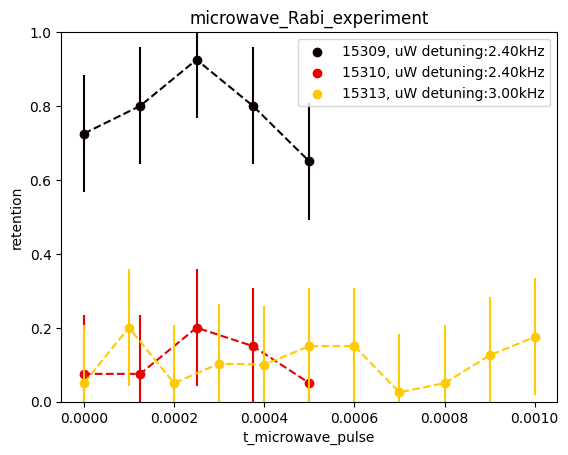

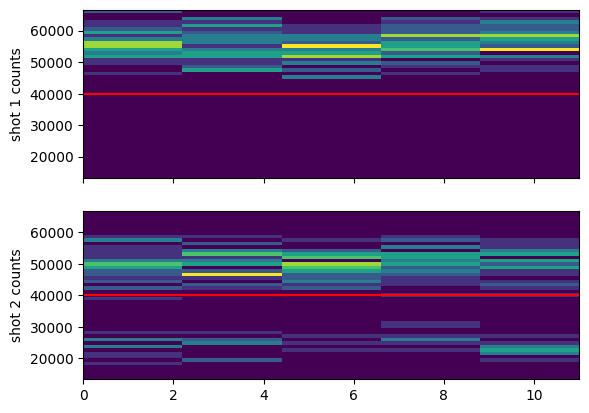

In [7]:
compare = True # compare multiple files in the same retention and loading plots
file_indices = {
    32: '',
    33: '', # no OP. the atoms are left in F=2 from the MOT RP after the first readout, so now the signal should sit on a ~0 background if the blowaway is good
    40: '' # no OP. the atoms are left in F=2 from the MOT RP after the first readout, so now the signal should sit on a ~0 background if the blowaway is good
} # the files to plot


showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'

loc=(1.05,-0.05)
loc='lower left' 
loc='upper right'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

custom_xlabel = False
xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing
# xsteps_xform = lambda x: 816.656 - 2*x - 92.65

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 40000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

## 2024.06.25

In [2]:
fnames = get_files_by_criteria(date_filters=["2024-06-25"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    try:
        scan_str = str_from_h5(ds['scan_variable1_name'])
        if str_from_h5(ds['scan_variable2_name']) != '':
            scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
        # print(f"file {i} ({f[72:]}) scanned over "+scan_str)
        print(f"file {i} ({f}) scanned over "+scan_str)
    except:
        print(f"oops... something wrong with {f}")

found 41 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-25\13\000015269-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-25\13\000015269-GeneralVariableScan_microwave_Rabi_scan_over_t_microwave_pulse.h5) scanned over t_microwave_pulse
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-25\14\000015270-GeneralVariableScan.h5) scanned over t_pumping
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-25\14\000015270-GeneralVariableScan_optical_pumping_scan_over_t_pumping.h5) scanned over t_pumping
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-25\14\000015271-GeneralVariableScan.h5) scanned over t_depumping
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-25\14\000015271-GeneralVariableScan_optical_pumping_scan_over_t_depumping.h5) scanned over t_depumping
file 6 (C:\Networking Expe

In [3]:
f = h5py.File(os.path.join(results, fnames[4]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)

experiment: optical_pumping_experiment


In [5]:
override_ExperimentVariables

"{'t_pumping':2*us}"

### pulse time scans

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


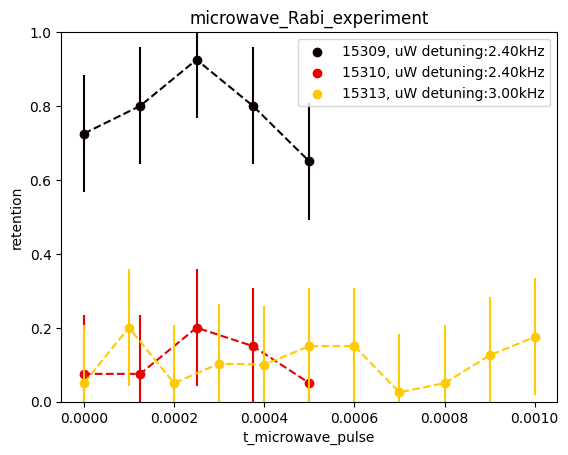

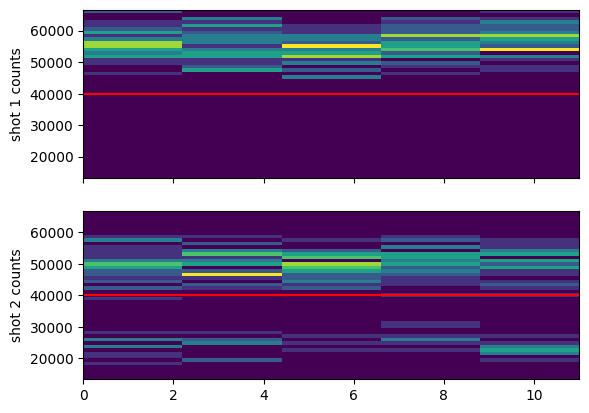

In [7]:
compare = True # compare multiple files in the same retention and loading plots
file_indices = {
    32: '',
    33: '',
    40: ''
} # the files to plot


showhist = True
showloading = False
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
# f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''f'uW detuning:{(f_microwaves_dds-f_dds_clock_resonance)*1e-3:.2f}kHz'

loc=(1.05,-0.05)
loc='lower left' 
loc='upper right'

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

custom_xlabel = False
xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing
# xsteps_xform = lambda x: 816.656 - 2*x - 92.65

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 40000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,cutoff2=cutoff1)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [8]:
np.linspace(-3,3,11)*kHz + f_microwaves_dds

array([3.346820e+08, 3.346826e+08, 3.346832e+08, 3.346838e+08,
       3.346844e+08, 3.346850e+08, 3.346856e+08, 3.346862e+08,
       3.346868e+08, 3.346874e+08, 3.346880e+08])

## 2024.06.15

In [26]:
fnames = get_files_by_criteria(date_filters=["2024-06-15"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    try:
        scan_str = str_from_h5(ds['scan_variable1_name'])
        if str_from_h5(ds['scan_variable2_name']) != '':
            scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
        # print(f"file {i} ({f[72:]}) scanned over "+scan_str)
        print(f"file {i} ({f}) scanned over "+scan_str)
    except:
        print(f"oops... something wrong with {f}")

found 14 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-15\11\000014954-GeneralVariableScan.h5) scanned over AZ_top_volts_OP
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-15\11\000014954-GeneralVariableScan_microwave_Rabi_scan_over_AZ_top_volts_OP.h5) scanned over AZ_top_volts_OP
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-15\12\000014963-GeneralVariableScan.h5) scanned over AZ_top_volts_OP
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-15\12\000014967-GeneralVariableScan.h5) scanned over AZ_top_volts_OP
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-15\12\000014967-GeneralVariableScan_microwave_Rabi_scan_over_AZ_top_volts_OP.h5) scanned over AZ_top_volts_OP
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-15\13\000014968-GeneralVariableScan.h5) scanned over AZ_top_volts_OP
file 6 (C:\Networking Experiment\artiq codes\

### coil scan for OP optimization
minimizing the retention vs OP coils with a microwave experiment. after pumping into |1,0>, microwaves drive population into |2,0>, and we want to maximize the population transfer (minimize number of atoms that survive the blow-away), which corresponds to maximizing the population accumulation in |1,0>. The Y coil is set to give about 1 G.

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


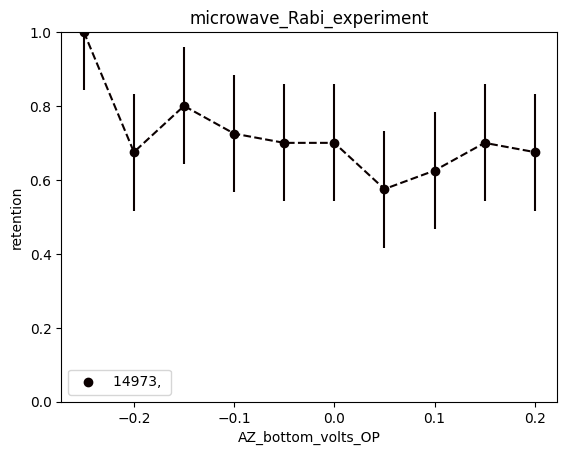

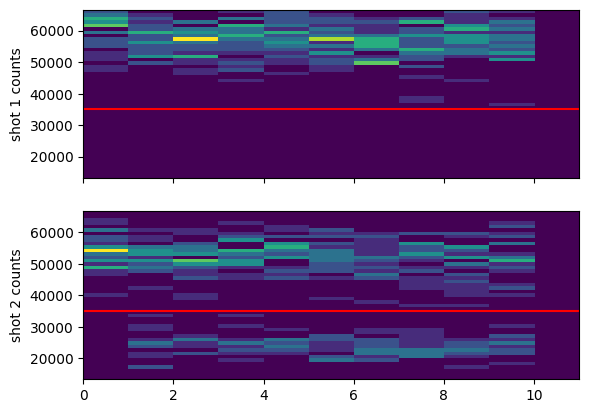

In [27]:
compare = True # compare multiple files in the same retention and loading plots

# Z top coil scans
file_indices = {
    9: '',
    11: ''
} # the files to plot

# Z bottom coil scans
file_indices = {
    13: ''
} # the files to plot


showhist = True
showloading = False
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'

loc=(1.05,-0.05)
loc='lower left' 

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

custom_xlabel = False
xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing
# xsteps_xform = lambda x: 816.656 - 2*x - 92.65

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 35000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)
    
    retention_array = np.zeros(iterations)
    loading_rate_array = np.zeros(iterations)
    n_atoms_loaded_array = np.zeros(iterations)
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    
    measurements = n_measurements #if not control_experiment else n_measurements//2
    
    for i in range(iterations):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        
        atoms_loaded = [x > cutoff1 for x in shot1]
        n_atoms_loaded = sum(atoms_loaded)
        atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
        retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
        loading_rate_array[i] = n_atoms_loaded/n_measurements
        n_atoms_loaded_array[i] = n_atoms_loaded
        retention_array[i] = retention_fraction

    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

## 2024.06.14

In [16]:
fnames = get_files_by_criteria(date_filters=["2024-06-14"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    try:
        scan_str = str_from_h5(ds['scan_variable1_name'])
        if str_from_h5(ds['scan_variable2_name']) != '':
            scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
        # print(f"file {i} ({f[72:]}) scanned over "+scan_str)
        print(f"file {i} ({f}) scanned over "+scan_str)
    except:
        print(f"oops... something wrong with {f}")

found 80 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-14\07\000014866-GeneralVariableScan.h5) scanned over p_D1_pumping_SP
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-14\07\000014869-GeneralVariableScan.h5) scanned over p_D1_pumping_SP
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-14\07\000014869-GeneralVariableScan_optical_pumping_scan_over_p_D1_pumping_SP.h5) scanned over p_D1_pumping_SP
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-14\08\000014870-GeneralVariableScan.h5) scanned over p_D1_pumping_SP
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-14\08\000014870-GeneralVariableScan_optical_pumping_scan_over_p_D1_pumping_SP.h5) scanned over p_D1_pumping_SP
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-14\08\000014872-GeneralVariableScan.h5) scanned over dummy_variable
file 6 (C:\Networking Experiment\artiq codes

### coil scan for OP optimization
minimizing the retention vs OP coils with a microwave experiment. after pumping into |1,0>, microwaves drive population into |2,0>, and we want to maximize the population transfer (minimize number of atoms that survive the blow-away), which corresponds to maximizing the population accumulation in |1,0>. The Y coil is set to give about 1 G.

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


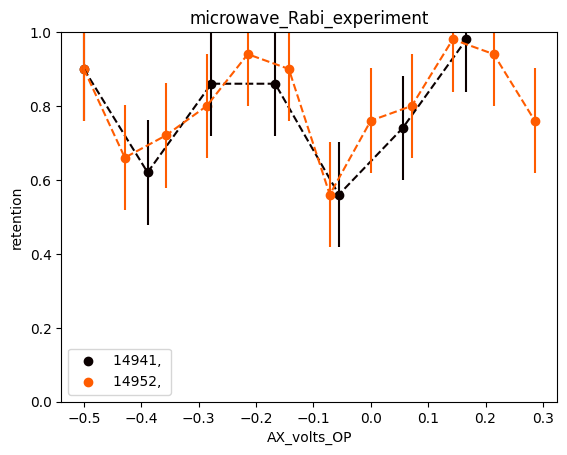

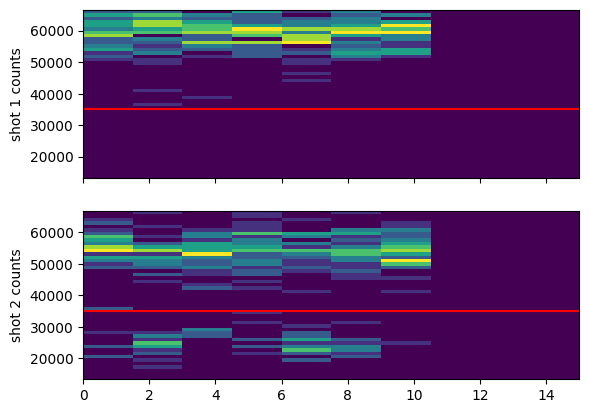

In [20]:
compare = True # compare multiple files in the same retention and loading plots

# X coil scans
file_indices = {
    75: '',
    79: ''
} # the files to plot

# # Z coil scans
# file_indices = {
#     77: '',
# } # the files to plot


showhist = True
showloading = False
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'

loc=(1.05,-0.05)
loc='lower left' 

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

custom_xlabel = False
xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing
# xsteps_xform = lambda x: 816.656 - 2*x - 92.65

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 35000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)
    
    retention_array = np.zeros(iterations)
    loading_rate_array = np.zeros(iterations)
    n_atoms_loaded_array = np.zeros(iterations)
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    
    measurements = n_measurements #if not control_experiment else n_measurements//2
    
    for i in range(iterations):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        
        atoms_loaded = [x > cutoff1 for x in shot1]
        n_atoms_loaded = sum(atoms_loaded)
        atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
        retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
        loading_rate_array[i] = n_atoms_loaded/n_measurements
        n_atoms_loaded_array[i] = n_atoms_loaded
        retention_array[i] = retention_fraction

    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [22]:
scan_sequence1

array([-0.5       , -0.42857143, -0.35714286, -0.28571429, -0.21428571,
       -0.14285714, -0.07142857,  0.        ,  0.07142857,  0.14285714,
        0.21428571,  0.28571429,  0.35714286,  0.42857143,  0.5       ])

### pulse time scans

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0
experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


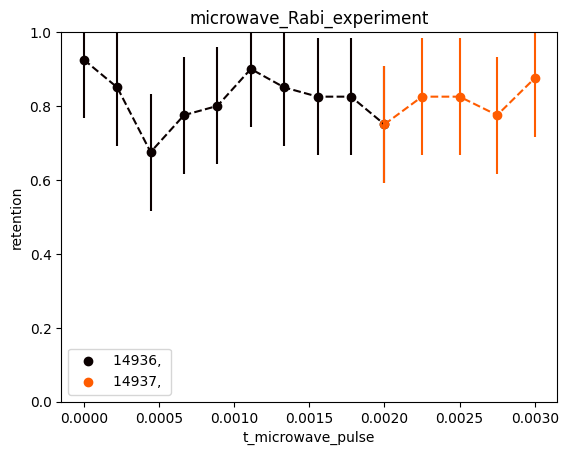

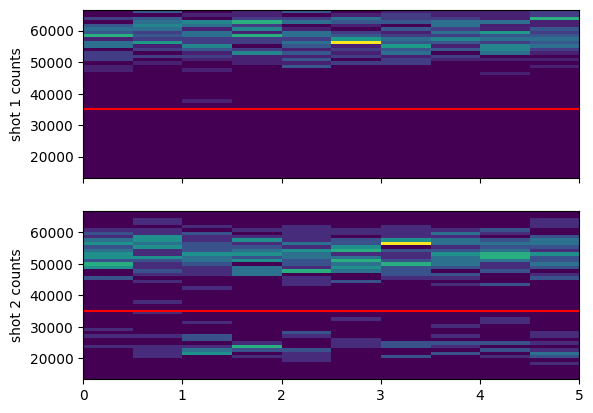

In [10]:
compare = True # compare multiple files in the same retention and loading plots
file_indices = {
    67: '',
    69: ''
} # the files to plot


showhist = True
showloading = False
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'

loc=(1.05,-0.05)
loc='lower left' 

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

custom_xlabel = False
xlabel = r"detuning from F=1$\rightarrow$F'=1 (MHz)"
xsteps_xform = lambda x: x # do nothing
# xsteps_xform = lambda x: 816.656 - 2*x - 92.65

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 35000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)
    
    retention_array = np.zeros(iterations)
    loading_rate_array = np.zeros(iterations)
    n_atoms_loaded_array = np.zeros(iterations)
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    
    measurements = n_measurements #if not control_experiment else n_measurements//2
    
    for i in range(iterations):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        
        atoms_loaded = [x > cutoff1 for x in shot1]
        n_atoms_loaded = sum(atoms_loaded)
        atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
        retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
        loading_rate_array[i] = n_atoms_loaded/n_measurements
        n_atoms_loaded_array[i] = n_atoms_loaded
        retention_array[i] = retention_fraction

    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### frequency scans

experiment: microwave_Rabi_experiment
AY_volts_OP: 2.0


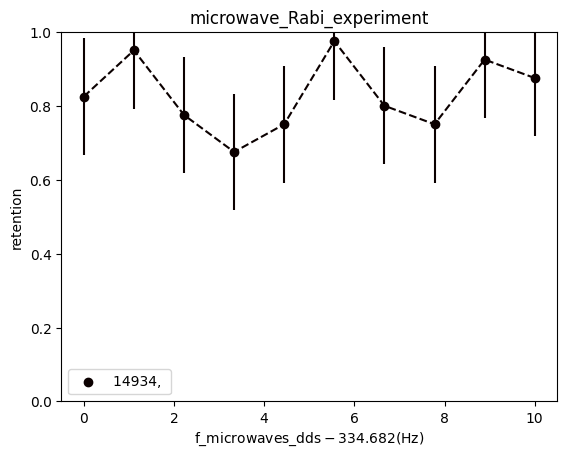

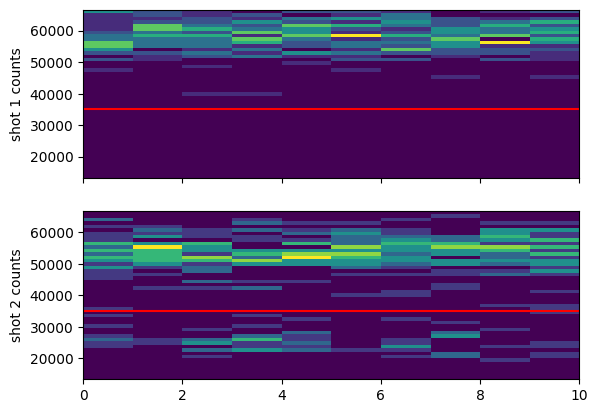

In [12]:
compare = True # compare multiple files in the same retention and loading plots
file_indices = {
    65: '',
} # the files to plot


showhist = True
showloading = False
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'AZtop:{azt:.2f},AZbottom:{azb:.2f},AX:{ax:.2f},AY:{ay:.2f},t_depumping:{t_depump*1e6:.2f}us,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: f'no bias,t_depumping:{t_depump*1e6:.2f}us' #,p_D1_pumping_SP:{p_D1_SP:.2f}dBm'
f_comment_func = lambda azt,azb,ax,ay,t_depump,p_D1_SP: ''#f'p_D1_pumping_SP:{p_D1_SP:.2f}dBm'

loc=(1.05,-0.05)
loc='lower left' 

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['hot']
ldng_cmap = mpl.colormaps['winter']

custom_xlabel = True
xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm Hz)$"
xsteps_xform = lambda x: x # do nothing
xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 35000*t_SPCM_first_shot

    print("AY_volts_OP:",AY_volts_OP)
    f_comment += f_comment_func(AZ_top_volts_OP,AZ_bottom_volts_OP,AX_volts_OP,AY_volts_OP,t_depumping,p_D1_pumping_SP)
    
    retention_array = np.zeros(iterations)
    loading_rate_array = np.zeros(iterations)
    n_atoms_loaded_array = np.zeros(iterations)
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    
    measurements = n_measurements #if not control_experiment else n_measurements//2
    
    for i in range(iterations):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        
        atoms_loaded = [x > cutoff1 for x in shot1]
        n_atoms_loaded = sum(atoms_loaded)
        atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
        retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
        loading_rate_array[i] = n_atoms_loaded/n_measurements
        n_atoms_loaded_array[i] = n_atoms_loaded
        retention_array[i] = retention_fraction

    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if not compare:
            if showloading:
                fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))
        # ax_ret.set_ylim((0.6,1))

        if not showloading:
            if custom_xlabel:
                ax_ret.set_xlabel(xlabel)
            else:
                ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=loc)
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
if not compare:
    ax_ret.set_title(experiment_function+' '+str(rid))
else:
    ax_ret.set_title(experiment_function)


if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [13]:
np.linspace(0,2000,10)*us

array([0.        , 0.00022222, 0.00044444, 0.00066667, 0.00088889,
       0.00111111, 0.00133333, 0.00155556, 0.00177778, 0.002     ])

## trying to get good population transfer
The optical pumping last week was found not be optimized, and I'm tuning the coils now using a microwave rotation instead of depump measurement to optimize this.

In [29]:
fnames = get_files_by_criteria(date_filters=["2024-06-06"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    try:
        scan_str = str_from_h5(ds['scan_variable1_name'])
        if str_from_h5(ds['scan_variable2_name']) != '':
            scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
        # print(f"file {i} ({f[72:]}) scanned over "+scan_str)
        print(f"file {i} ({f}) scanned over "+scan_str)
    except:
        print(f"oops... something wrong with {f}")

found 12 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-06\13\000014521-GeneralVariableScan.h5) scanned over AZ_top_volts_OP
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-06\15\000014553-GeneralVariableScan.h5) scanned over AZ_top_volts_OP
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-06\15\000014557-GeneralVariableScan.h5) scanned over AZ_top_volts_OP
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-06\20\000014587-GeneralVariableScan.h5) scanned over f_microwaves
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-06\20\000014588-GeneralVariableScan.h5) scanned over f_microwaves
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-06\20\000014588-GeneralVariableScan_microwave_Rabi_scan_over_f_microwaves.h5) scanned over f_microwaves
file 6 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-06\21\000014590-GeneralV

### frequency scans

experiment: microwave_Rabi_experiment
AZ_bottom_volts_OP=0.0, AZ_top_volts_OP=0.0, AX_volts_OP=0.0, AY_volts_OP=-6.2
p_D1_pumping_SP=-25.0, t_pumping=1000.00 us
experiment: microwave_Rabi_experiment
AZ_bottom_volts_OP=0.0, AZ_top_volts_OP=0.0, AX_volts_OP=0.0, AY_volts_OP=-6.2
p_D1_pumping_SP=-25.0, t_pumping=1000.00 us
experiment: microwave_Rabi_experiment
AZ_bottom_volts_OP=0.0, AZ_top_volts_OP=0.0, AX_volts_OP=0.0, AY_volts_OP=-6.2
p_D1_pumping_SP=-25.0, t_pumping=1000.00 us
experiment: microwave_Rabi_experiment
AZ_bottom_volts_OP=0.0, AZ_top_volts_OP=0.0, AX_volts_OP=0.0, AY_volts_OP=-6.2
p_D1_pumping_SP=-25.0, t_pumping=1000.00 us


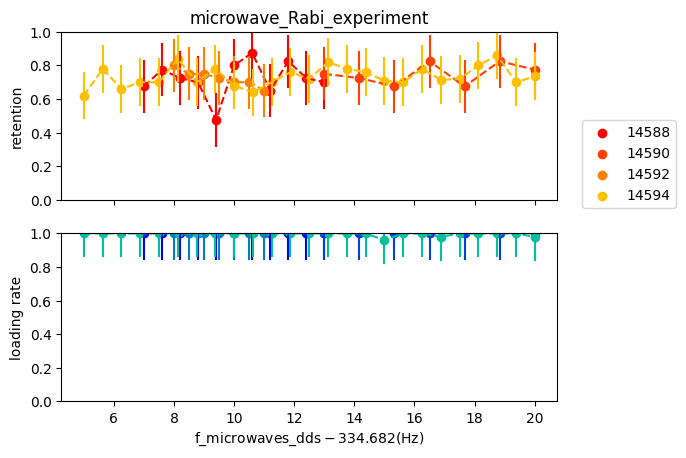

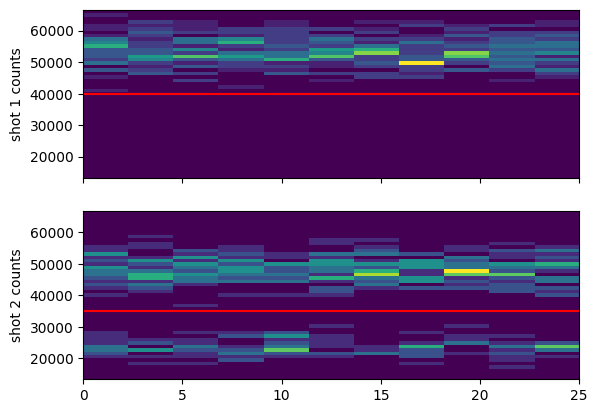

In [30]:
file_indices = [5,6,9,11] # the files to plot

showhist = True
showloading = True
showOPparams = True

if showloading:
    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
    ax_ret, ax_ldng = axes
else:
    fig_ret,ax_ret = plt.subplots(nrows=2, sharex=True)
ret_cmap = mpl.colormaps['autumn']
ldng_cmap = mpl.colormaps['winter']

custom_xlabel = True
xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm Hz)$"
xsteps_xform = lambda x: x # do nothing
xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_idx in enumerate(file_indices):
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1 = 40000*t_SPCM_first_shot
    cutoff2 = 35000*t_SPCM_second_shot

    if showOPparams:
        print(f"AZ_bottom_volts_OP={AZ_top_volts_OP}, AZ_top_volts_OP={AZ_top_volts_OP}, AX_volts_OP={AX_volts_OP}, AY_volts_OP={AY_volts_OP}")
        print(f"p_D1_pumping_SP={p_D1_pumping_SP}, t_pumping={t_pumping*1e6:.2f} us")
    
    retention_array = np.zeros(iterations)
    loading_rate_array = np.zeros(iterations)
    n_atoms_loaded_array = np.zeros(iterations)
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    
    measurements = n_measurements #if not control_experiment else n_measurements//2
    
    for i in range(iterations):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        
        atoms_loaded = [x > cutoff1 for x in shot1]
        n_atoms_loaded = sum(atoms_loaded)
        atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
        retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
        loading_rate_array[i] = n_atoms_loaded/n_measurements
        n_atoms_loaded_array[i] = n_atoms_loaded
        retention_array[i] = retention_fraction

    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        # ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color=ret_cmap(idx/len(file_indices)))
        # ax_ret.scatter(xsteps_xform(scan_sequence1), retention,label=rid, color=ret_cmap(idx/len(file_indices)))
        # errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        # ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=rid, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))

        if not showloading:
            ax_ret.set_xlabel(xlabel) #scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=(1.05,-0.05))
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

## trying to get good population transfer
The optical pumping last week was found not be optimized, and I'm tuning the coils now using a microwave rotation instead of depump measurement to optimize this.

In [16]:
fnames = get_files_by_criteria(date_filters=["2024-06-04"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    try:
        scan_str = str_from_h5(ds['scan_variable1_name'])
        if str_from_h5(ds['scan_variable2_name']) != '':
            scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
        # print(f"file {i} ({f[72:]}) scanned over "+scan_str)
        print(f"file {i} ({f}) scanned over "+scan_str)
    except:
        print(f"oops... something wrong with {f}")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-04\13\000014439-GeneralVariableScan_microwave_Rabi_scan_over_f_microwaves_dds.h5, which is corrupt
found 9 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-04\11\000014434-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-04\11\000014434-GeneralVariableScan_microwave_Rabi_scan_over_t_microwave_pulse.h5) scanned over t_microwave_pulse
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-04\11\000014435-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-04\11\000014435-GeneralVariableScan_microwave_Rabi_scan_over_t_microwave_pulse.h5) scanned over t_microwave_pulse
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-06-04\11\000014438-GeneralVariableScan.h5) scanned over f_microwaves_dds
fi

### frequency scans

experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment


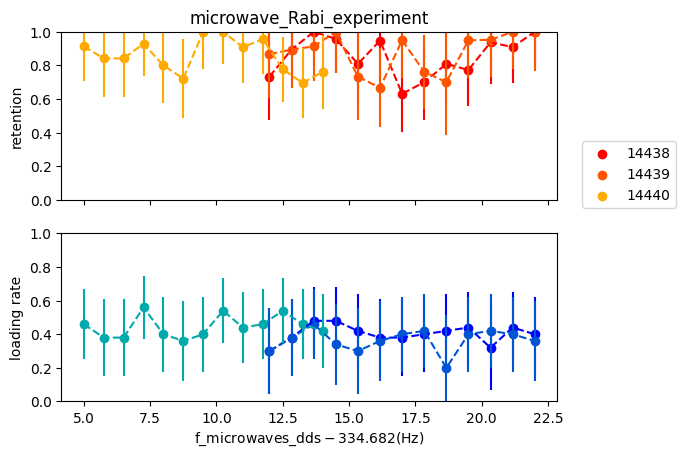

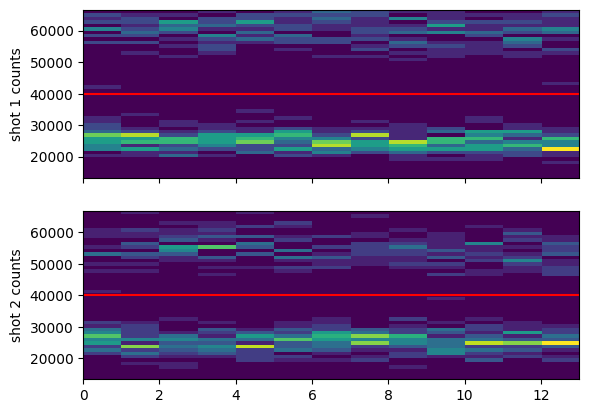

In [17]:
file_indices = [5,6,7] # the files to plot

showhist = True
showloading = True

cutoff1=cutoff2 = 40000*t_SPCM_first_shot

if showloading:
    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
    ax_ret, ax_ldng = axes
else:
    fig_ret,ax_ret = plt.subplots(nrows=2, sharex=True)
ret_cmap = mpl.colormaps['autumn']
ldng_cmap = mpl.colormaps['winter']

custom_xlabel = True
xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm Hz)$"
xsteps_xform = lambda x: x # do nothing
xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_idx in enumerate(file_indices):
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)
    
    retention_array = np.zeros(iterations)
    loading_rate_array = np.zeros(iterations)
    n_atoms_loaded_array = np.zeros(iterations)
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    
    measurements = n_measurements #if not control_experiment else n_measurements//2
    
    for i in range(iterations):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        
        atoms_loaded = [x > cutoff1 for x in shot1]
        n_atoms_loaded = sum(atoms_loaded)
        atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
        retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
        loading_rate_array[i] = n_atoms_loaded/n_measurements
        n_atoms_loaded_array[i] = n_atoms_loaded
        retention_array[i] = retention_fraction

    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        # ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color=ret_cmap(idx/len(file_indices)))
        # ax_ret.scatter(xsteps_xform(scan_sequence1), retention,label=rid, color=ret_cmap(idx/len(file_indices)))
        # errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        # ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=rid, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))

        if not showloading:
            ax_ret.set_xlabel(xlabel) #scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=(1.05,-0.05))
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### pulse time scans

experiment: microwave_Rabi_experiment
[]


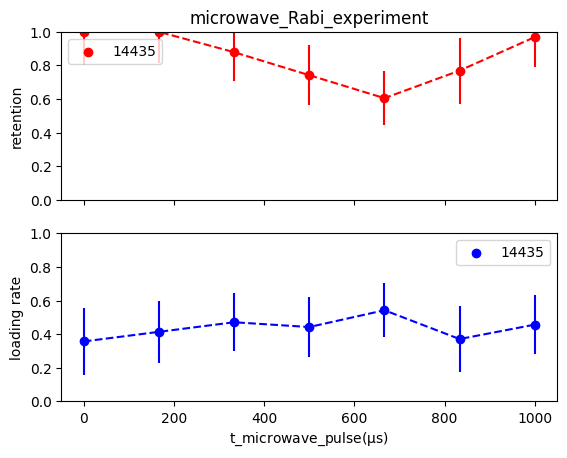

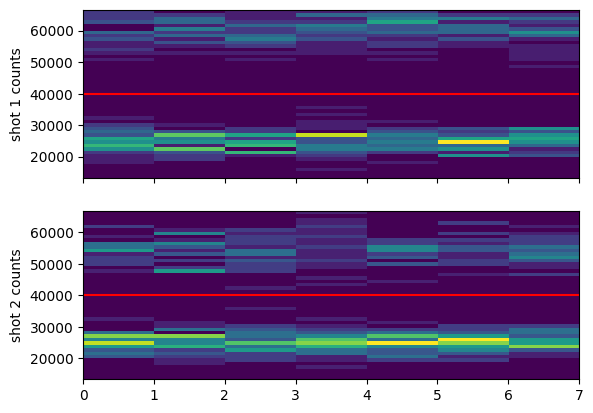

In [14]:
file_indices = [3] # the files to plot

showhist = True
showloading = True

if showloading:
    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
    ax_ret, ax_ldng = axes
else:
    fig_ret,ax_ret = plt.subplots(nrows=2, sharex=True)
ret_cmap = mpl.colormaps['autumn']
ldng_cmap = mpl.colormaps['winter']

custom_xlabel = True
xlabel = r"$\rm{t\_microwave\_pulse} (\mu s)$"
xsteps_xform = lambda x: x # do nothing
xsteps_xform = lambda x: (x)*1e6 # offset from the dds freq. for bare resonance and convert to kHz

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_idx in enumerate(file_indices):
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    cutoff1=cutoff2 = 40000*t_SPCM_first_shot
    
    retention_array = np.zeros(iterations)
    loading_rate_array = np.zeros(iterations)
    n_atoms_loaded_array = np.zeros(iterations)
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    
    measurements = n_measurements #if not control_experiment else n_measurements//2
    
    for i in range(iterations):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        
        atoms_loaded = [x > cutoff1 for x in shot1]
        n_atoms_loaded = sum(atoms_loaded)
        atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
        retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
        loading_rate_array[i] = n_atoms_loaded/n_measurements
        n_atoms_loaded_array[i] = n_atoms_loaded
        retention_array[i] = retention_fraction

    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        # ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color=ret_cmap(idx/len(file_indices)))
        # ax_ret.scatter(xsteps_xform(scan_sequence1), retention,label=rid, color=ret_cmap(idx/len(file_indices)))
        # errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        # ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=rid, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))

        print(scan_sequence1[retention < 0.6])
        if not showloading:
            ax_ret.set_xlabel(xlabel) #scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend()
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            ax_ldng.legend()
ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

## 2024.05.24

## looking for a microwave signal
See the section below. I parked the dds frequency at 1 kHz > than the clock frequency per the frequency scan, and did a course scan over the microwave pulse time. It looks like there is indeed something real, but the oscillation (if you can call it that) is low contrast. The experiment is pumping the atom into F=1,m=0, doing a microwave pulse (which may not be on the 0-0 transition given how small of a detuning I'm using; maybe this is an off-resonant weak driving of one of the other hyperfine transitions) which should transfer population to an F=2 state, and then subsequently be blown away. So at t = 0, the atoms should mostly survive, while at t % t_pi == 0, the atoms should all be blown away.

In [114]:
fnames = get_files_by_criteria(date_filters=["2024-05-2"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["microwave_Rabi", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    try:
        scan_str = str_from_h5(ds['scan_variable1_name'])
        if str_from_h5(ds['scan_variable2_name']) != '':
            scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
        # print(f"file {i} ({f[72:]}) scanned over "+scan_str)
        print(f"file {i} ({f}) scanned over "+scan_str)
    except:
        print(f"oops... something wrong with {f}")

found 20 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-20\18\000013977-GeneralVariableScan_microwave_Rabi_scan_over_f_microwaves_dds.h5) scanned over f_microwaves_dds
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-21\08\000013978-GeneralVariableScan_microwave_Rabi_scan_over_f_microwaves_dds.h5) scanned over f_microwaves_dds
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-21\08\000013979-GeneralVariableScan_microwave_Rabi_scan_over_f_microwaves_dds.h5) scanned over f_microwaves_dds
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-21\09\000013980-GeneralVariableScan_microwave_Rabi_scan_over_t_microwave_pulse.h5) scanned over t_microwave_pulse
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-23\16\000014133-GeneralVariableScan_microwave_Rabi_scan_over_f_microwaves_dds.h5) scanned over f_microwaves_dds
file 5 (C:\Networking Experiment\artiq codes\artiq-ma

In [90]:
scan_sequence1 - 334.682*MHz

array([20000.        , 20666.66666669, 21333.33333331, 22000.        ,
       22666.66666669, 23333.33333331, 24000.        , 24666.66666669,
       25333.33333331, 26000.        ])

### frequency scans

experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment


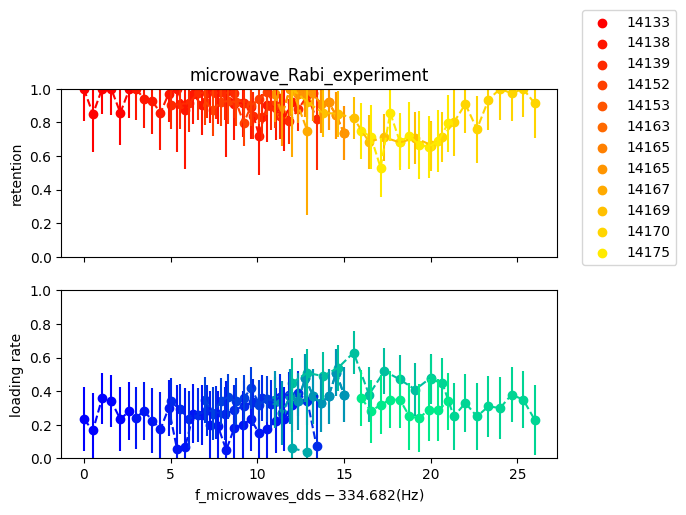

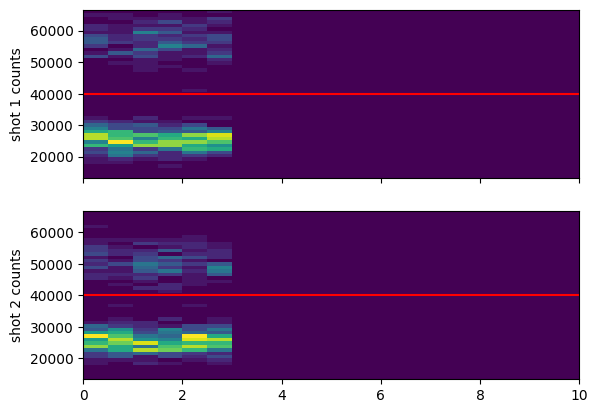

In [115]:
# all of these are frequency scans with pulse time 250 us (some yesterday might be 200 us) until 14170 (16). 
# after that, the pulse time is 555 us. 
file_indices = [4,5,6,9,10,11,12,12,14,15,16,19] # the files to plot

showhist = True
showloading = True

cutoff1=cutoff2 = 40000*t_SPCM_first_shot

if showloading:
    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
    ax_ret, ax_ldng = axes
else:
    fig_ret,ax_ret = plt.subplots(nrows=2, sharex=True)
ret_cmap = mpl.colormaps['autumn']
ldng_cmap = mpl.colormaps['winter']

custom_xlabel = True
xlabel = r"$\rm{f\_microwaves\_dds} - 334.682 (\rm Hz)$"
xsteps_xform = lambda x: x # do nothing
xsteps_xform = lambda x: (x - 334.682e6)*1e-3 # offset from the dds freq. for bare resonance and convert to kHz

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_idx in enumerate(file_indices):
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)
    
    retention_array = np.zeros(iterations)
    loading_rate_array = np.zeros(iterations)
    n_atoms_loaded_array = np.zeros(iterations)
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    
    measurements = n_measurements #if not control_experiment else n_measurements//2
    
    for i in range(iterations):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        
        atoms_loaded = [x > cutoff1 for x in shot1]
        n_atoms_loaded = sum(atoms_loaded)
        atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
        retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
        loading_rate_array[i] = n_atoms_loaded/n_measurements
        n_atoms_loaded_array[i] = n_atoms_loaded
        retention_array[i] = retention_fraction

    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        # ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color=ret_cmap(idx/len(file_indices)))
        # ax_ret.scatter(xsteps_xform(scan_sequence1), retention,label=rid, color=ret_cmap(idx/len(file_indices)))
        # errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        # ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=rid, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))

        if not showloading:
            ax_ret.set_xlabel(xlabel) #scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend(loc=(1.05,-0.05))
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            # ax_ldng.legend(loc=(1.05,0.01))
ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

### pulse time scans

experiment: microwave_Rabi_experiment
[0.00055556]
experiment: microwave_Rabi_experiment
[0.00144444 0.00155556 0.00166667 0.00177778 0.00188889 0.002     ]


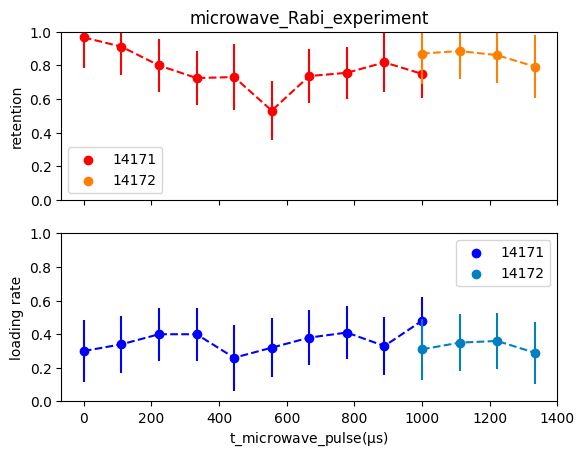

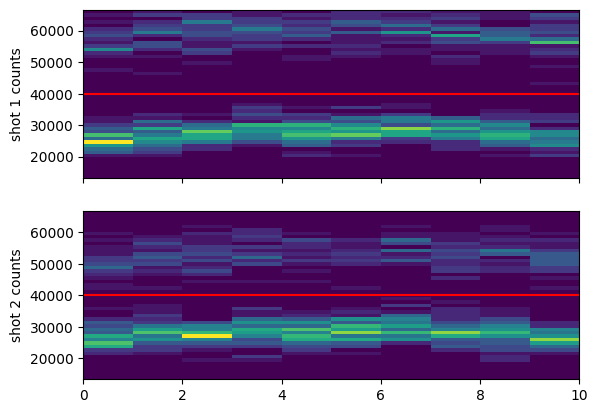

In [116]:
file_indices = [17, 18] # the files to plot

showhist = True
showloading = True

cutoff1=cutoff2 = 40000*t_SPCM_first_shot

if showloading:
    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
    ax_ret, ax_ldng = axes
else:
    fig_ret,ax_ret = plt.subplots(nrows=2, sharex=True)
ret_cmap = mpl.colormaps['autumn']
ldng_cmap = mpl.colormaps['winter']

custom_xlabel = True
xlabel = r"$\rm{t\_microwave\_pulse} (\mu s)$"
xsteps_xform = lambda x: x # do nothing
xsteps_xform = lambda x: (x)*1e6 # offset from the dds freq. for bare resonance and convert to kHz

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for idx,f_idx in enumerate(file_indices):
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)
    
    retention_array = np.zeros(iterations)
    loading_rate_array = np.zeros(iterations)
    n_atoms_loaded_array = np.zeros(iterations)
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    
    measurements = n_measurements #if not control_experiment else n_measurements//2
    
    for i in range(iterations):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        
        atoms_loaded = [x > cutoff1 for x in shot1]
        n_atoms_loaded = sum(atoms_loaded)
        atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
        retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
        loading_rate_array[i] = n_atoms_loaded/n_measurements
        n_atoms_loaded_array[i] = n_atoms_loaded
        retention_array[i] = retention_fraction

    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        # ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color=ret_cmap(idx/len(file_indices)))
        # ax_ret.scatter(xsteps_xform(scan_sequence1), retention,label=rid, color=ret_cmap(idx/len(file_indices)))
        # errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        # ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
        ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=rid, color=ret_cmap(idx/len(file_indices)))
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
        ax_ret.set_ylim((0,1))

        print(scan_sequence1[retention < 0.6])
        if not showloading:
            ax_ret.set_xlabel(xlabel) #scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend()
    
        if showloading:
            # for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            if custom_xlabel:
                ax_ldng.set_xlabel(xlabel)
            else:
                ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            ax_ldng.legend()
ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

In [71]:
3.34964e8 - 334.682e6

282000.0

In [74]:
(np.linspace(5,15,20)*kHz)[7]

8684.21052631579

## 2024.05.21

## looking for a microwave signal
See the section below. I parked the dds frequency at 1 kHz > than the clock frequency per the frequency scan, and did a course scan over the microwave pulse time. It looks like there is indeed something real, but the oscillation (if you can call it that) is low contrast. The experiment is pumping the atom into F=1,m=0, doing a microwave pulse (which may not be on the 0-0 transition given how small of a detuning I'm using; maybe this is an off-resonant weak driving of one of the other hyperfine transitions) which should transfer population to an F=2 state, and then subsequently be blown away. So at t = 0, the atoms should mostly survive, while at t % t_pi == 0, the atoms should all be blown away.

In [4]:
fnames = get_files_by_criteria(date_filters=["2024-05-2"], # only find files from these dates. to include all dates in the 20s, do 2024-05-2
                               name_filters=["microwave_Rabi", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    try:
        scan_str = str_from_h5(ds['scan_variable1_name'])
        if str_from_h5(ds['scan_variable2_name']) != '':
            scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
        # print(f"file {i} ({f[72:]}) scanned over "+scan_str)
        print(f"file {i} ({f}) scanned over "+scan_str)
    except:
        print(f"oops... something wrong with {f}")

found 3 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-20\18\000013977-GeneralVariableScan_microwave_Rabi_scan_over_f_microwaves_dds.h5) scanned over f_microwaves_dds
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-21\08\000013978-GeneralVariableScan_microwave_Rabi_scan_over_f_microwaves_dds.h5) scanned over f_microwaves_dds
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-21\08\000013979-GeneralVariableScan_microwave_Rabi_scan_over_f_microwaves_dds.h5) scanned over f_microwaves_dds


experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment
experiment: microwave_Rabi_experiment


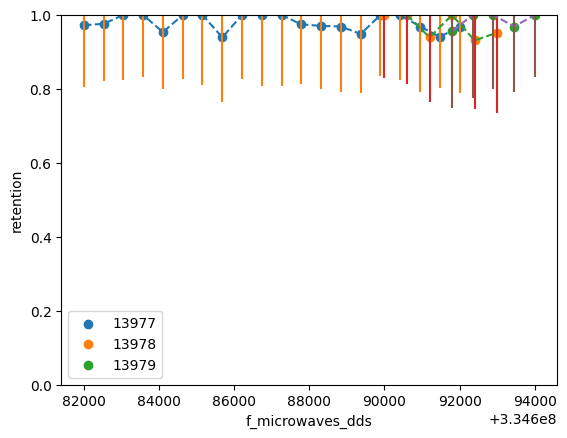

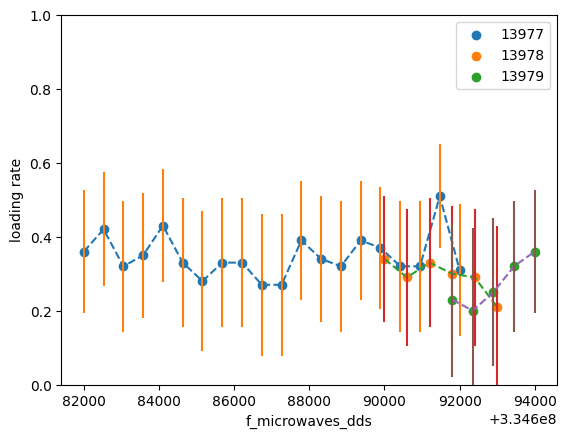

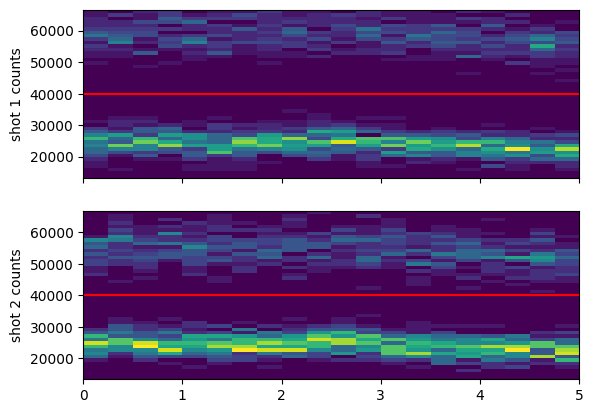

In [44]:
showhist = True
showloading = True

units = None

cutoff1=cutoff2 = 40000*t_SPCM_first_shot

fig_ret,ax_ret = plt.subplots()
fig_ldng,ax_ldng = plt.subplots()

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

for i in [0,1,2]:
    f = h5py.File(os.path.join(results, fnames[i]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    iterations = int(len(photocounts)/n_measurements)
        
    retention_array = np.zeros(iterations)
    loading_rate_array = np.zeros(iterations)
    n_atoms_loaded_array = np.zeros(iterations)
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    
    measurements = n_measurements #if not control_experiment else n_measurements//2
    
    for i in range(iterations):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        
        atoms_loaded = [x > cutoff1 for x in shot1]
        n_atoms_loaded = sum(atoms_loaded)
        atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
        retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
        retention_array[i] = retention_fraction
        loading_rate_array[i] = n_atoms_loaded/n_measurements
        n_atoms_loaded_array[i] = n_atoms_loaded
    
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        # fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
        # for i, ax in enumerate(axes.flat):
        #     print("trying but failing")
        #     shot1 = photocounts[i*measurements:(i+1)*measurements]
        #     shot2 = photocounts2[i*measurements:(i+1)*measurements]
        #     ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        #     ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        #     ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        #     ax.axvline(cutoff1,color='grey',linestyle='--')
        #     # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        # plt.show()
        # # fig.tight_layout()
        # # plt.show()

        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    cmap = mpl.colormaps['inferno']
    for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
        ax_ret.plot(scan_sequence1, retention,linestyle='--')
        ax_ret.scatter(scan_sequence1, retention,label=rid)
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        ax_ret.errorbar(scan_sequence1, retention, errs, ls='none')
        ax_ret.set_ylim((0,1))
    
        ax_ret.set_xlabel(scan_variable1_name)
        ax_ret.set_ylabel("retention")
        ax_ret.legend()
    
    if showloading:
        for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            ax_ldng.plot(scan_sequence1, loading,linestyle='--')
            ax_ldng.scatter(scan_sequence1, loading,label=rid)
            errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
            ax_ldng.errorbar(scan_sequence1, loading, errs, ls='none')
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(scan_variable1_name)
            ax_ldng.set_ylabel("loading rate")
            ax_ldng.legend()

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

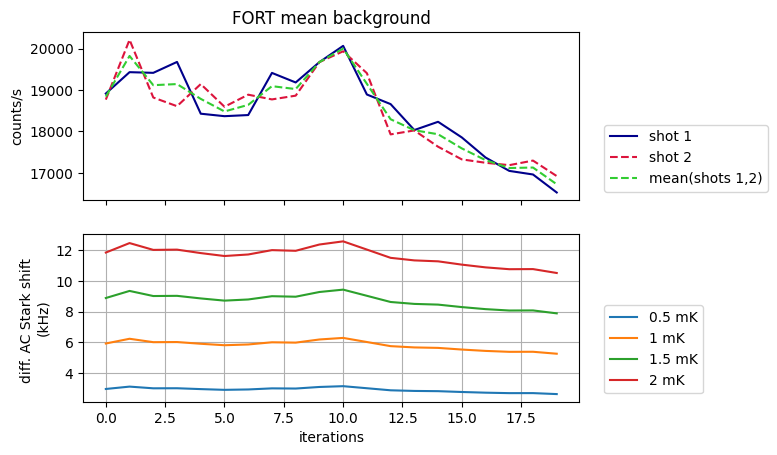

In [65]:
# how much is the stark shift changing over these experiments?
# subtract the mean non-FORT background from the background during readout

nonFORT_bg = 5600
mean_bg1 = np.array(mean1_by_iteration[0]).flatten()-nonFORT_bg
mean_bg2 = np.array(mean2_by_iteration[0]).flatten()-nonFORT_bg
mean_mean_bg = np.mean([mean_bg1, mean_bg2],axis=0)
fig,axes = plt.subplots(nrows=2,sharex=True)
ax,ax2 = axes
ax.plot(mean_bg1,color='darkblue',label='shot 1')
ax.plot(mean_bg2,color='crimson',ls='--',label='shot 2')
ax.plot(mean_mean_bg,color='limegreen',ls='--',label='mean(shots 1,2)')

# the minimum FORT background should correspond to the polarization being the most aligned to the polarizer behind the mirror,
# because when the polarization is misaligned, the AOM feedback will send more power to the SM fiber because it can't distinguish
# polarization from amplitude drift

c = 2.998e8
d1 = 2*np.pi*c*(1/794.978850e-9 - 1/852e-9)
d2 = 2*np.pi*c*(1/780.241209e-9 - 1/852e-9)
d_eff = 1/((1/d1 + 2/d2)/3) # weighted average of D lines. # see Oscillator strengths of the principal series lines of Rb", table 3
kB = 1.38e-23
hbar = 6.06e-34
omega_hfs = 2*np.pi*6.834682e9

eta = omega_hfs/d_eff # see "Analysis of dephasing mechanisms in a standing-wave dipole trap" by Meschede group
for TFORT in [0.5,1,1.5,2]:
# TFORT = 1e-3 # our guess at the trap depth in K. not sure what our error bars are.

    diff_shift = eta*TFORT*1e-3*kB/hbar
    acstark = (diff_shift*1e-3)*mean_mean_bg/np.min(mean_mean_bg)
    ax2.plot(acstark,label=f'{TFORT} mK')
ax2.grid()
ax2.set_ylabel("diff. AC Stark shift \n(kHz)")

ax.set_title("FORT mean background")
ax.set_ylabel("counts/s")
ax2.set_xlabel("iterations")

for axis in axes:
    axis.legend(loc=(1.05,0.05))
plt.show()

## 2024.05.01

## microwave Rabi flopping?
See the section below. I parked the dds frequency at 1 kHz > than the clock frequency per the frequency scan, and did a course scan over the microwave pulse time. It looks like there is indeed something real, but the oscillation (if you can call it that) is low contrast. The experiment is pumping the atom into F=1,m=0, doing a microwave pulse (which may not be on the 0-0 transition given how small of a detuning I'm using; maybe this is an off-resonant weak driving of one of the other hyperfine transitions) which should transfer population to an F=2 state, and then subsequently be blown away. So at t = 0, the atoms should mostly survive, while at t % t_pi == 0, the atoms should all be blown away.

In [7]:
fnames = get_files_by_criteria(date_filters=["2024-05-01"], # only find files from these date directories
                               name_filters=["microwave_Rabi", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    try:
        scan_str = str_from_h5(ds['scan_variable1_name'])
        if str_from_h5(ds['scan_variable2_name']) != '':
            scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
        # print(f"file {i} ({f[72:]}) scanned over "+scan_str)
        print(f"file {i} ({f}) scanned over "+scan_str)
    except:
        print(f"oops... something wrong with {f}")

found 2 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-01\07\000012760-GeneralVariableScan_microwave_Rabi_scan_over_t_microwave_pulse.h5) scanned over t_microwave_pulse
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-01\07\000012761-GeneralVariableScan_microwave_Rabi_scan_over_t_microwave_pulse.h5) scanned over t_microwave_pulse


In [12]:
fname = fnames[1] # first (really bad) Rabi oscillation?

f = h5py.File(os.path.join(results, fname))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
iterations = len(scan_sequence1)*len(scan_sequence2)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)

assert len(photocounts) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: microwave_Rabi_experiment
Pumping light off? False


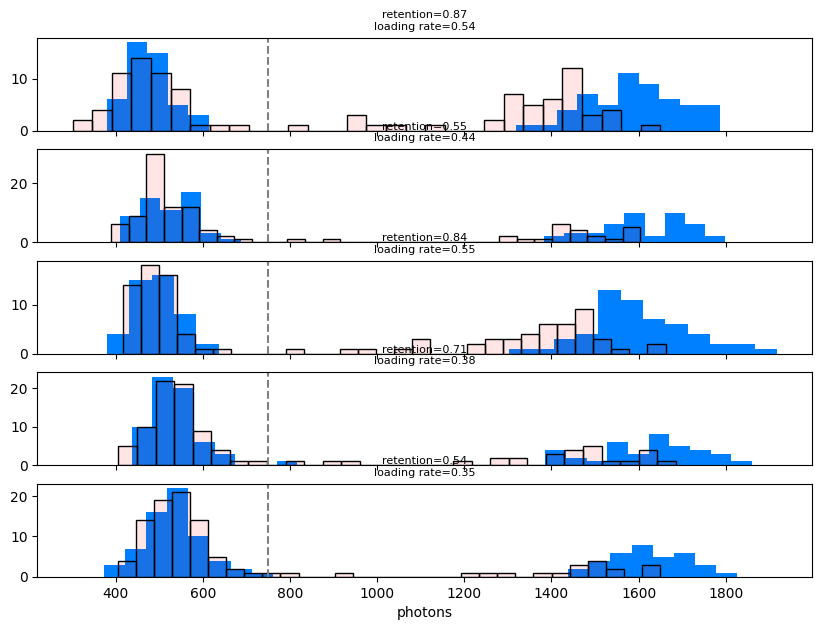

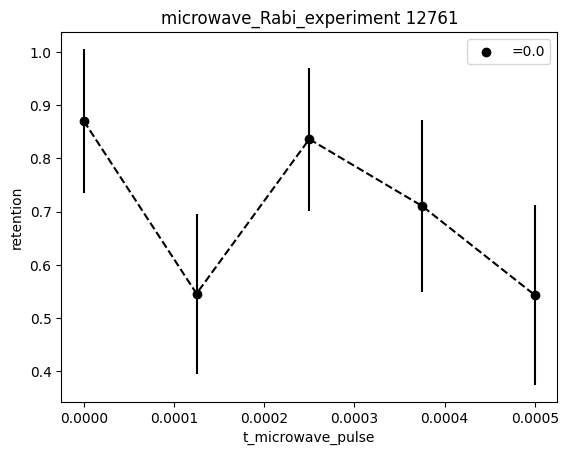

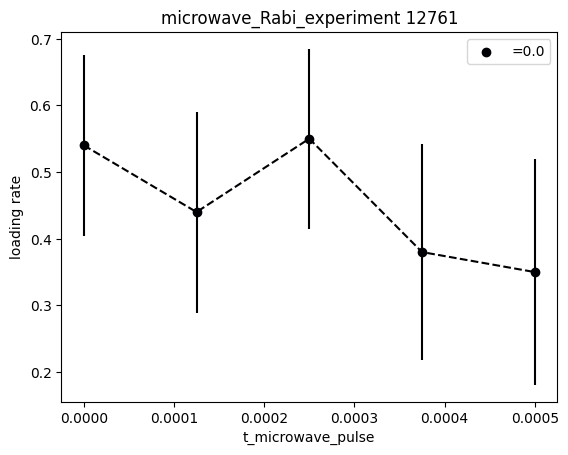

In [13]:
showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
# cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
# cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot

cutoff1=cutoff2 = 50000*t_SPCM_first_shot
# units = None

retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = photocounts[i*measurements:(i+1)*measurements]
    shot2 = photocounts2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
    for i, ax in enumerate(axes.flat):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        ax.axvline(cutoff1,color='grey',linestyle='--')
        # ax.set_ylabel("occurences")
    ax.set_xlabel("photons")
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1_name)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_function+f' {rid}')
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1_name)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_function+f' {rid}')
        plt.show()

## microwave spectroscopy with optical pumping on
since I have recently gotten optical pumping to 99% fidelity based on comparing the pump/depump time constants, I decided to run another microwave spectroscopy scan. the microwave experiment is now the current optical pumping experiment, with a microwave pulse between the pumping and blowaway phases.

In [14]:
fnames = get_files_by_criteria(date_filters=["2024-04-30"], # only find files from these date directories
                               name_filters=["microwave_Rabi", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    try:
        scan_str = str_from_h5(ds['scan_variable1_name'])
        if str_from_h5(ds['scan_variable2_name']) != '':
            scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
        # print(f"file {i} ({f[72:]}) scanned over "+scan_str)
        print(f"file {i} ({f}) scanned over "+scan_str)
    except:
        print(f"oops... something wrong with {f}")

found 1 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-30\18\000012759-GeneralVariableScan_microwave_Rabi_scan_over_f_microwaves_dds.h5) scanned over f_microwaves_dds


In [15]:
fname = fnames[0] # optical pumping has been consistent so these features are probably real

f = h5py.File(os.path.join(results, fname))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
iterations = len(scan_sequence1)*len(scan_sequence2)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)

assert len(photocounts) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: microwave_Rabi_experiment
Pumping light off? False


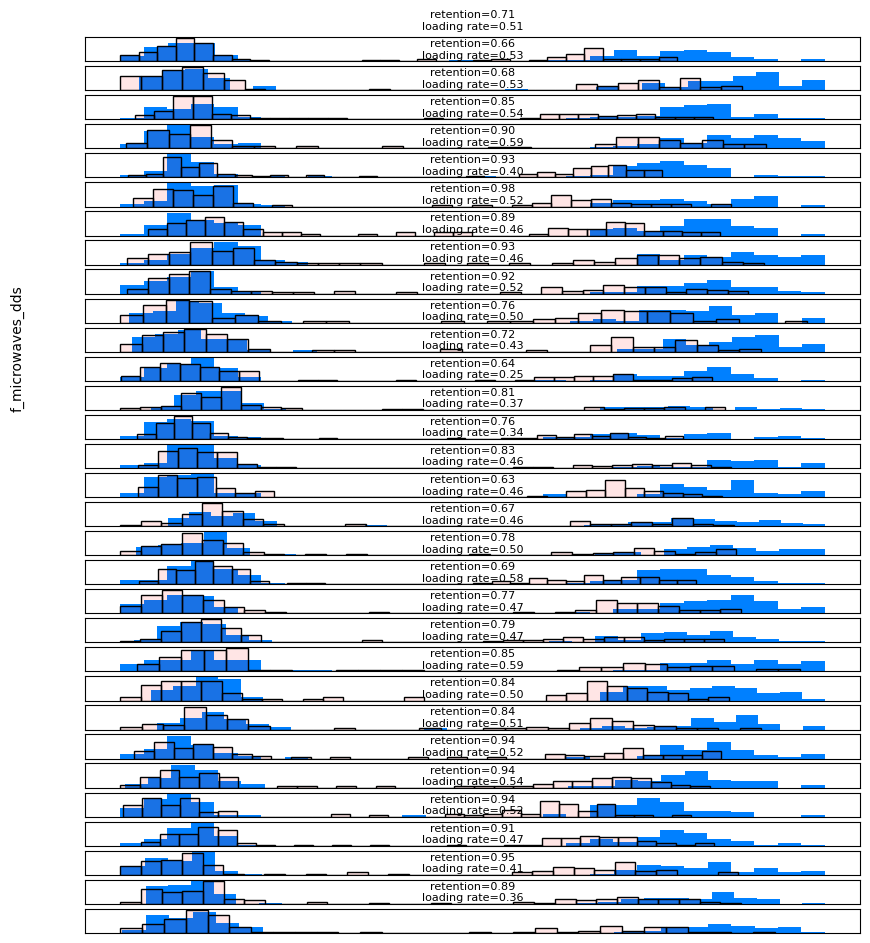

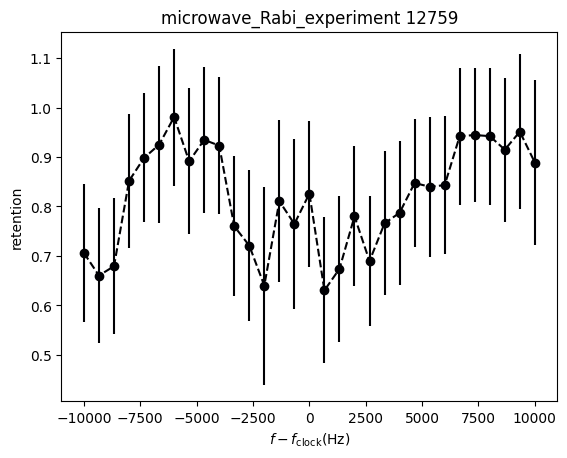

In [18]:
showhist = True
showloading = False # set to false when comparing multiple files
scan_offset = f_microwaves_dds
# scan_offset = 0

# don't try to compare multiple files if the scan is 2D
filelist=[
    fname
]

user_defined_cutoffs = False
cutoff1 = cutoff2 = 800


for f_idx, fname in enumerate(filelist):
    f = h5py.File(os.path.join(results, fname))
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    iterations = len(scan_sequence1)*len(scan_sequence2)

    # plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
    if not user_defined_cutoffs:
        cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
        cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
    
    retention_array = np.zeros(iterations)
    loading_rate_array = np.zeros(iterations)
    n_atoms_loaded_array = np.zeros(iterations)
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    
    dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
    if scan_is_2D:
        dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])
    
    measurements = n_measurements #if not control_experiment else n_measurements//2
    
    for i in range(iterations):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        
        atoms_loaded = [x > cutoff1 for x in shot1]
        n_atoms_loaded = sum(atoms_loaded)
        atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
        retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
        retention_array[i] = retention_fraction
        loading_rate_array[i] = n_atoms_loaded/n_measurements
        n_atoms_loaded_array[i] = n_atoms_loaded
    
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
        for i, ax in enumerate(axes.flat):
            shot1 = photocounts[i*measurements:(i+1)*measurements]
            shot2 = photocounts2[i*measurements:(i+1)*measurements]
            ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
            ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
            ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
            # ax.set_ylabel("occurences")
            # ax.set_xlabel("photons")
            ax.set_xticks([])
            ax.set_yticks([])
        if scan_is_2D: # todo
            axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
            [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
            [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
            [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
        fig.text(0.45,-0.5, scan_variable2_name)
        fig.text(0.05,0.35, scan_variable1_name,rotation=90)
        plt.subplots_adjust(bottom=-0.4)
        plt.show()
    
    if scan_is_2D:
        # plot a colormap of the retention
        fig,ax = plt.subplots()
        cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                      extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
        im = ax.get_images()
        extent =  im[0].get_extent()
        # plt.setp(ax.spines.values(), linewidth=0.1)
        ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
        ax.set_xticks(scan_sequence1)
        ax.set_yticks(scan_sequence2)
        ax.set_title(experiment_function)
        ax.set_xlabel(scan_variable1_name)
        ax.set_ylabel(scan_variable2_name)
        # ax.tick_params(axis='both', labelsize=10)
        fig.colorbar(cax)
        # plt.clim(0,1)
        plt.show()
    
    # plot a retention curve vs variable 1 for each variable 2 value
    # plot a retention curve vs variable 1 for each variable 2 value
    cmap = mpl.colormaps['inferno']
    for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if scan_is_2D:
            color=cmap(i/len(scan_sequence2))
            label=scan_variable2_name+"="+str(var2)
        else:
            color=cmap(f_idx/len(filelist))
            label=f"file {f_idx}"
        
        plt.plot(scan_sequence1-scan_offset, retention,color=color,linestyle='--')
        plt.scatter(scan_sequence1-scan_offset, retention,color=color,label=label)
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1-scan_offset, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))
    
        plt.xlabel(scan_variable1_name)
        plt.ylabel("retention")
        plt.xlabel(r"$f - f_{\rm clock} (\rm Hz)$")
        # plt.xlim((-7500,-2500))
        # plt.savefig("")
    
        if len(scan_sequence2)>1 or len(filelist)>1:
            plt.legend()
        plt.title(experiment_function+f' {rid}')
        # plt.title("microwave spectroscopy")
        # plt.savefig("first_microwave_spectroscopy_signal_expid000012164.png",bbox_inches='tight')
        # plt.show()
    
    if showloading:
        for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            plt.plot(scan_sequence1-scan_offset, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
            plt.scatter(scan_sequence1-scan_offset, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
            errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
            plt.errorbar(scan_sequence1-scan_offset, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))
    
            # plt.xlabel(scan_variable1_name)
            plt.xlabel(r"$f - f_{\rm clock} (\rm Hz)$")
            plt.ylabel("loading rate")
            plt.legend()
            plt.title(experiment_function)
            plt.show()
plt.show()

## 2024.04.23

## microwave spectroscopy
the atoms are hot, and we want to zero the B fields at the atoms with microwaves, but finding the microwave dip when the atoms have not been pumped into a single hyperfine state (at least partially) is going to be tough.

In [187]:
fnames = get_files_by_criteria(date_filters=["2024-04-23"], # only find files from these date directories
                               name_filters=["microwave_Rabi", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    try:
        scan_str = str_from_h5(ds['scan_variable1_name'])
        if str_from_h5(ds['scan_variable2_name']) != '':
            scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
        # print(f"file {i} ({f[72:]}) scanned over "+scan_str)
        print(f"file {i} ({f}) scanned over "+scan_str)
    except:
        print(f"oops... something wrong with {f}")

found 3 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-23\09\000012310-GeneralVariableScan_microwave_Rabi.h5) scanned over t_microwave_pulse
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-23\09\000012312-GeneralVariableScan_microwave_Rabi.h5) scanned over f_microwaves_dds
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-23\12\000012331-GeneralVariableScan_microwave_Rabi.h5) scanned over f_microwaves_dds


In [188]:
fname = fnames[0] # trying to do a Rabi oscilation using frequency found last night
fname = fnames[2] # the double pass AOM alignment was done incorrectly, but is fixed now


f = h5py.File(os.path.join(results, fname))
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
iterations = len(scan_sequence1)*len(scan_sequence2)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)

assert len(photocounts) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: microwave_Rabi_experiment
Pumping light off? True


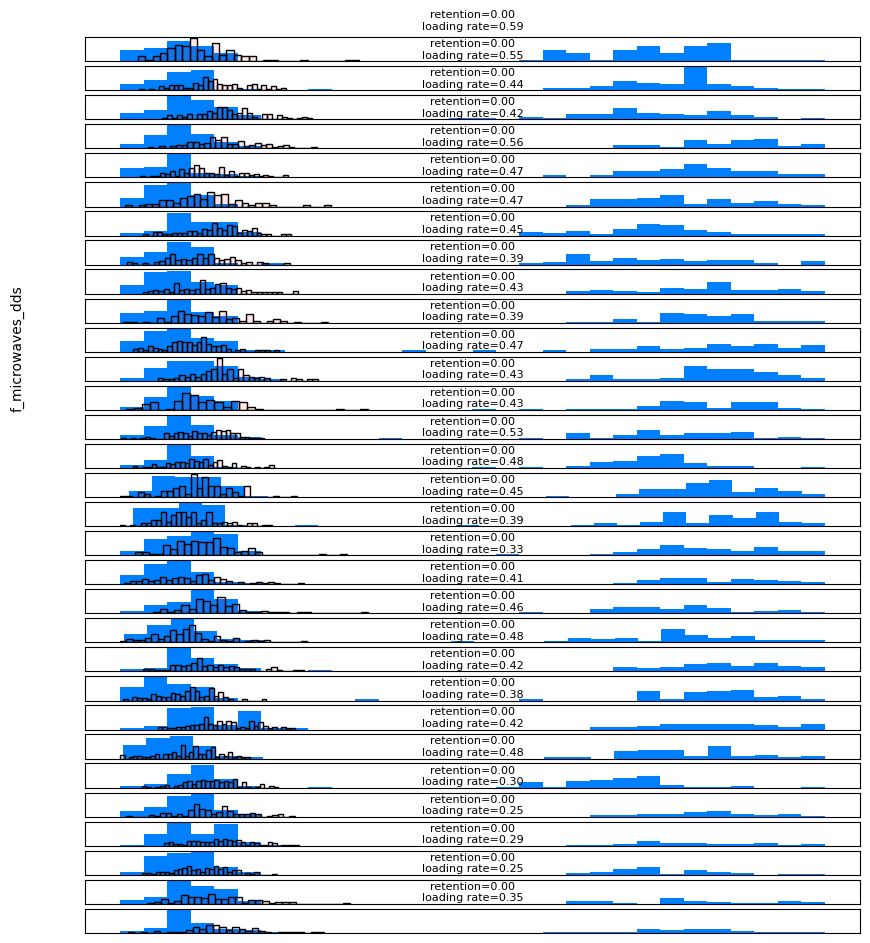

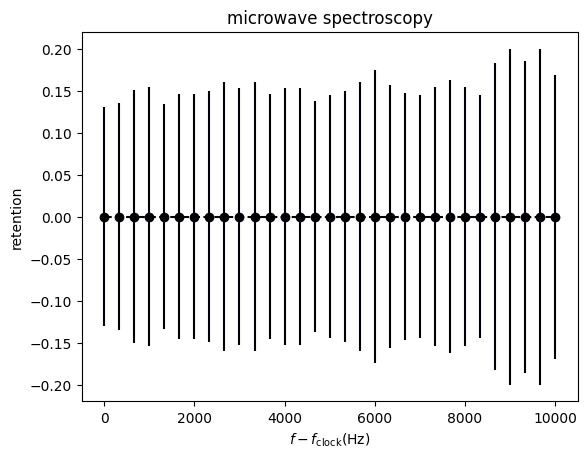

In [189]:
showhist = True
showloading = False # set to false when comparing multiple files
scan_offset = f_microwaves_dds
# scan_offset = 0

# don't try to compare multiple files if the scan is 2D
filelist=[
    fname
]

user_defined_cutoffs = False
cutoff1 = cutoff2 = 800


for f_idx, fname in enumerate(filelist):
    f = h5py.File(os.path.join(results, fname))
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    iterations = len(scan_sequence1)*len(scan_sequence2)

    # plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
    if not user_defined_cutoffs:
        cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
        cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
    
    retention_array = np.zeros(iterations)
    loading_rate_array = np.zeros(iterations)
    n_atoms_loaded_array = np.zeros(iterations)
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    
    dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
    if scan_is_2D:
        dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])
    
    measurements = n_measurements #if not control_experiment else n_measurements//2
    
    for i in range(iterations):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        
        atoms_loaded = [x > cutoff1 for x in shot1]
        n_atoms_loaded = sum(atoms_loaded)
        atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
        retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
        retention_array[i] = retention_fraction
        loading_rate_array[i] = n_atoms_loaded/n_measurements
        n_atoms_loaded_array[i] = n_atoms_loaded
    
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
        for i, ax in enumerate(axes.flat):
            shot1 = photocounts[i*measurements:(i+1)*measurements]
            shot2 = photocounts2[i*measurements:(i+1)*measurements]
            ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
            ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
            ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
            # ax.set_ylabel("occurences")
            # ax.set_xlabel("photons")
            ax.set_xticks([])
            ax.set_yticks([])
        if scan_is_2D: # todo
            axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
            [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
            [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
            [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
        fig.text(0.45,-0.5, scan_variable2_name)
        fig.text(0.05,0.35, scan_variable1_name,rotation=90)
        plt.subplots_adjust(bottom=-0.4)
        plt.show()
    
    if scan_is_2D:
        # plot a colormap of the retention
        fig,ax = plt.subplots()
        cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                      extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
        im = ax.get_images()
        extent =  im[0].get_extent()
        # plt.setp(ax.spines.values(), linewidth=0.1)
        ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
        ax.set_xticks(scan_sequence1)
        ax.set_yticks(scan_sequence2)
        ax.set_title(experiment_function)
        ax.set_xlabel(scan_variable1_name)
        ax.set_ylabel(scan_variable2_name)
        # ax.tick_params(axis='both', labelsize=10)
        fig.colorbar(cax)
        # plt.clim(0,1)
        plt.show()
    
    # plot a retention curve vs variable 1 for each variable 2 value
    # plot a retention curve vs variable 1 for each variable 2 value
    cmap = mpl.colormaps['inferno']
    for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if scan_is_2D:
            color=cmap(i/len(scan_sequence2))
            label=scan_variable2_name+"="+str(var2)
        else:
            color=cmap(f_idx/len(filelist))
            label=f"file {f_idx}"
        
        plt.plot(scan_sequence1-scan_offset, retention,color=color,linestyle='--')
        plt.scatter(scan_sequence1-scan_offset, retention,color=color,label=label)
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1-scan_offset, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))
    
        plt.xlabel(scan_variable1_name)
        plt.ylabel("retention")
        plt.xlabel(r"$f - f_{\rm clock} (\rm Hz)$")
        # plt.xlim((-7500,-2500))
        # plt.savefig("")
    
        if len(scan_sequence2)>1 or len(filelist)>1:
            plt.legend()
        # plt.title(experiment_function)
        plt.title("microwave spectroscopy")
        # plt.savefig("first_microwave_spectroscopy_signal_expid000012164.png",bbox_inches='tight')
        # plt.show()
    
    if showloading:
        for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            plt.plot(scan_sequence1-scan_offset, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
            plt.scatter(scan_sequence1-scan_offset, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
            errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
            plt.errorbar(scan_sequence1-scan_offset, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))
    
            # plt.xlabel(scan_variable1_name)
            plt.xlabel(r"$f - f_{\rm clock} (\rm Hz)$")
            plt.ylabel("loading rate")
            plt.legend()
            plt.title(experiment_function)
            plt.show()
plt.show()

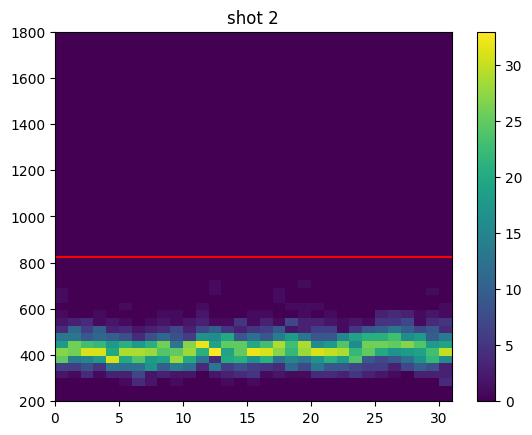

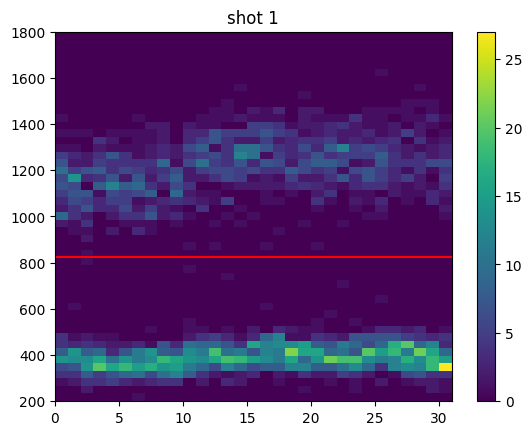

In [190]:
second_shot_hists = np.array([np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements],bins=np.linspace(200,1800,50))[0]
                              for i in range(iterations)])
fig,ax = plt.subplots()
cax=ax.imshow(second_shot_hists.transpose(),origin='lower',extent=[0,iterations,200,1800])
ax.set_title("shot 2")
ax.axhline(cutoff2,color='red')
ax.set_aspect('auto')
fig.colorbar(cax)

first_shot_hists = np.array([np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements],bins=np.linspace(200,1800,50))[0]
                              for i in range(iterations)])
fig,ax = plt.subplots()
cax=ax.imshow(first_shot_hists.transpose(),origin='lower',extent=[0,iterations,200,1800])
ax.set_title("shot 1")
ax.axhline(cutoff1,color='red')
ax.set_aspect('auto')
fig.colorbar(cax)

## 2024.04.22

## microwave spectroscopy
the atoms are hot, and we want to zero the B fields at the atoms with microwaves, but finding the microwave dip when the atoms have not been pumped into a single hyperfine state (at least partially) is going to be tough.

In [183]:
fnames = get_files_by_criteria(date_filters=["2024-04-22"], # only find files from these date directories
                               name_filters=["microwave_Rabi", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    try:
        scan_str = str_from_h5(ds['scan_variable1_name'])
        if str_from_h5(ds['scan_variable2_name']) != '':
            scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
        # print(f"file {i} ({f[72:]}) scanned over "+scan_str)
        print(f"file {i} ({f}) scanned over "+scan_str)
    except:
        print(f"oops... something wrong with {f}")

found 3 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-22\11\000012226-GeneralVariableScan_microwave_Rabi.h5) scanned over f_microwaves_dds
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-22\14\000012228-GeneralVariableScan_microwave_Rabi.h5) scanned over dummy_variable
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-22\19\000012307-GeneralVariableScan_microwave_Rabi.h5) scanned over f_microwaves_dds


In [184]:
fname = fnames[0] # checking if the FORT drift in the second readout is gone
fname = fnames[2] # finer microwave scan

f = h5py.File(os.path.join(results, fname))
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
iterations = len(scan_sequence1)*len(scan_sequence2)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)

assert len(photocounts) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: microwave_Rabi_experiment
Pumping light off? True


In [185]:
cutoff1

825.0

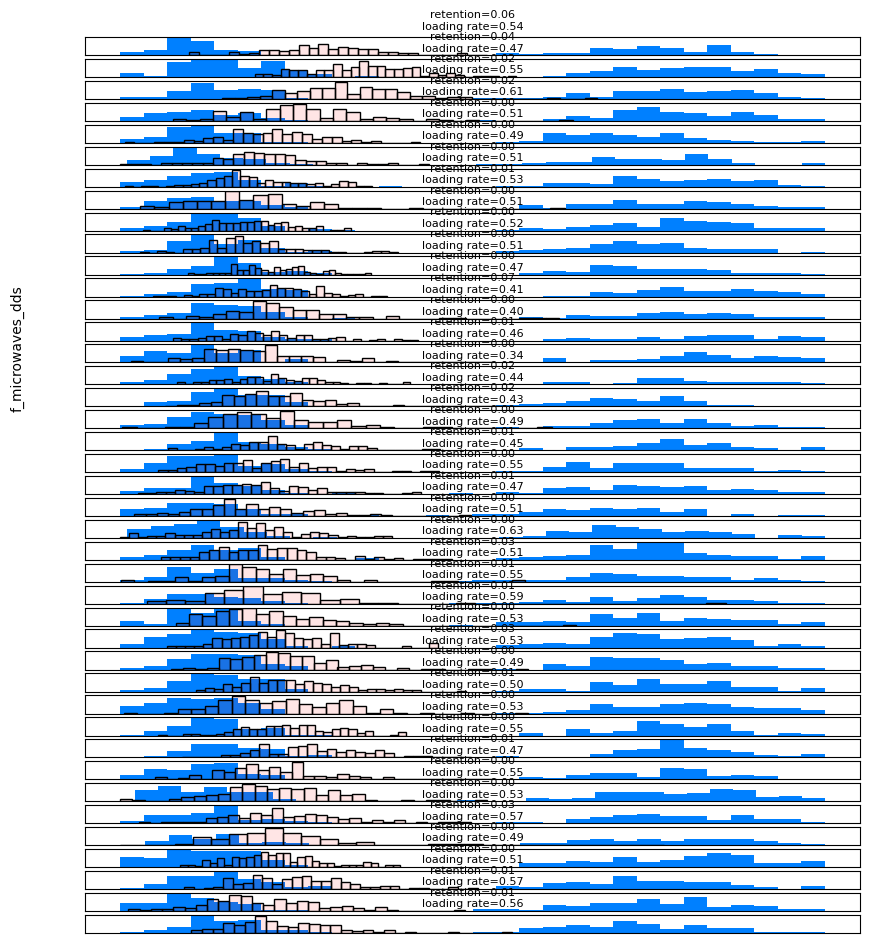

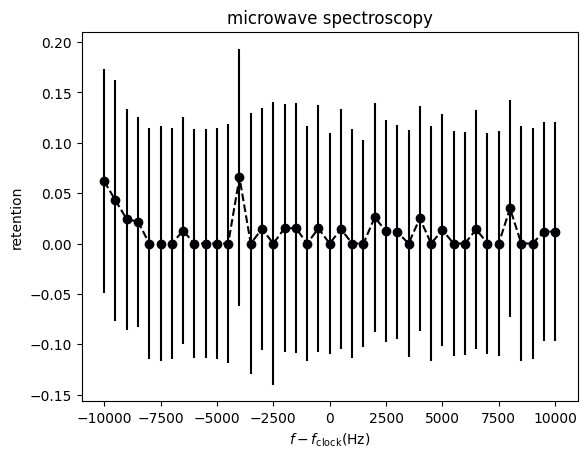

In [186]:
showhist = True
showloading = False # set to false when comparing multiple files
scan_offset = f_microwaves_dds
# scan_offset = 0

# don't try to compare multiple files if the scan is 2D
filelist=[
    # "2024-04-18\\21\\000012164-GeneralVariableScan_microwave_Rabi.h5", # shows FORT drift in second readout with single pass AOM
    fnames[2] # now we're using a double pass setup
]

user_defined_cutoffs = True
cutoff1 = cutoff2 = 800


for f_idx, fname in enumerate(filelist):
    f = h5py.File(os.path.join(results, fname))
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    iterations = len(scan_sequence1)*len(scan_sequence2)

    # plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
    if not user_defined_cutoffs:
        cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
        cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
    
    retention_array = np.zeros(iterations)
    loading_rate_array = np.zeros(iterations)
    n_atoms_loaded_array = np.zeros(iterations)
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    
    dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
    if scan_is_2D:
        dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])
    
    measurements = n_measurements #if not control_experiment else n_measurements//2
    
    for i in range(iterations):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        
        atoms_loaded = [x > cutoff1 for x in shot1]
        n_atoms_loaded = sum(atoms_loaded)
        atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
        retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
        retention_array[i] = retention_fraction
        loading_rate_array[i] = n_atoms_loaded/n_measurements
        n_atoms_loaded_array[i] = n_atoms_loaded
    
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
        for i, ax in enumerate(axes.flat):
            shot1 = photocounts[i*measurements:(i+1)*measurements]
            shot2 = photocounts2[i*measurements:(i+1)*measurements]
            ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
            ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
            ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
            # ax.set_ylabel("occurences")
            # ax.set_xlabel("photons")
            ax.set_xticks([])
            ax.set_yticks([])
        if scan_is_2D: # todo
            axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
            [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
            [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
            [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
        fig.text(0.45,-0.5, scan_variable2_name)
        fig.text(0.05,0.35, scan_variable1_name,rotation=90)
        plt.subplots_adjust(bottom=-0.4)
        plt.show()
    
    if scan_is_2D:
        # plot a colormap of the retention
        fig,ax = plt.subplots()
        cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                      extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
        im = ax.get_images()
        extent =  im[0].get_extent()
        # plt.setp(ax.spines.values(), linewidth=0.1)
        ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
        ax.set_xticks(scan_sequence1)
        ax.set_yticks(scan_sequence2)
        ax.set_title(experiment_function)
        ax.set_xlabel(scan_variable1_name)
        ax.set_ylabel(scan_variable2_name)
        # ax.tick_params(axis='both', labelsize=10)
        fig.colorbar(cax)
        # plt.clim(0,1)
        plt.show()
    
    # plot a retention curve vs variable 1 for each variable 2 value
    # plot a retention curve vs variable 1 for each variable 2 value
    cmap = mpl.colormaps['inferno']
    for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if scan_is_2D:
            color=cmap(i/len(scan_sequence2))
            label=scan_variable2_name+"="+str(var2)
        else:
            color=cmap(f_idx/len(filelist))
            label=f"file {f_idx}"
        
        plt.plot(scan_sequence1-scan_offset, retention,color=color,linestyle='--')
        plt.scatter(scan_sequence1-scan_offset, retention,color=color,label=label)
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1-scan_offset, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))
    
        plt.xlabel(scan_variable1_name)
        plt.ylabel("retention")
        plt.xlabel(r"$f - f_{\rm clock} (\rm Hz)$")
        # plt.xlim((-7500,-2500))
        # plt.savefig("")
    
        if len(scan_sequence2)>1 or len(filelist)>1:
            plt.legend()
        # plt.title(experiment_function)
        plt.title("microwave spectroscopy")
        # plt.savefig("first_microwave_spectroscopy_signal_expid000012164.png",bbox_inches='tight')
        # plt.show()
    
    if showloading:
        for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            plt.plot(scan_sequence1-scan_offset, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
            plt.scatter(scan_sequence1-scan_offset, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
            errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
            plt.errorbar(scan_sequence1-scan_offset, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))
    
            # plt.xlabel(scan_variable1_name)
            plt.xlabel(r"$f - f_{\rm clock} (\rm Hz)$")
            plt.ylabel("loading rate")
            plt.legend()
            plt.title(experiment_function)
            plt.show()
plt.show()

In [173]:
334.682 - .005

334.677

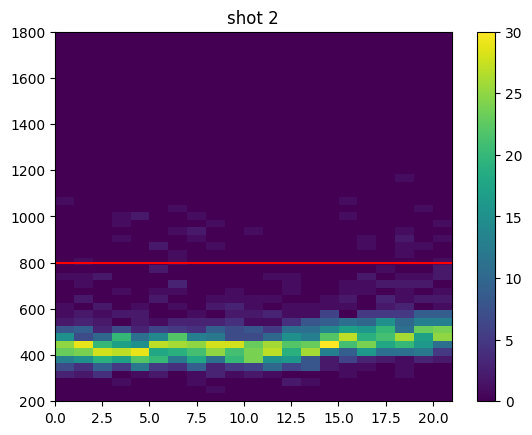

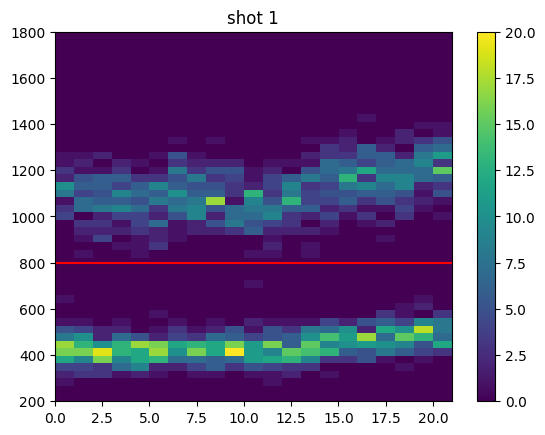

In [171]:
second_shot_hists = np.array([np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements],bins=np.linspace(200,1800,50))[0]
                              for i in range(iterations)])
fig,ax = plt.subplots()
cax=ax.imshow(second_shot_hists.transpose(),origin='lower',extent=[0,iterations,200,1800])
ax.set_title("shot 2")
ax.axhline(cutoff2,color='red')
ax.set_aspect('auto')
fig.colorbar(cax)

first_shot_hists = np.array([np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements],bins=np.linspace(200,1800,50))[0]
                              for i in range(iterations)])
fig,ax = plt.subplots()
cax=ax.imshow(first_shot_hists.transpose(),origin='lower',extent=[0,iterations,200,1800])
ax.set_title("shot 1")
ax.axhline(cutoff1,color='red')
ax.set_aspect('auto')
fig.colorbar(cax)

## 2024.04.19

## microwave spectroscopy
the atoms are hot, and we want to zero the B fields at the atoms with microwaves, but finding the microwave dip when the atoms have not been pumped into a single hyperfine state (at least partially) is going to be tough.

the scans below are not in the correct range. I forgot that the FORT gives a ~ 5 kHz differential shift around 1mK, but we haven't actually measured the trap depth yet.

In [71]:
fnames = get_files_by_criteria(date_filters=["2024-04-19"], # only find files from these date directories
                               name_filters=["microwave_Rabi", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    try:
        scan_str = str_from_h5(ds['scan_variable1_name'])
        if str_from_h5(ds['scan_variable2_name']) != '':
            scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
        # print(f"file {i} ({f[72:]}) scanned over "+scan_str)
        print(f"file {i} ({f}) scanned over "+scan_str)
    except:
        print(f"oops... something wrong with {f}")

found 1 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-19\08\000012165-GeneralVariableScan_microwave_Rabi.h5) scanned over f_microwaves_dds


In [144]:
fname = '2024-04-17\\22\\000012118-GeneralVariableScan_microwave_Rabi.h5' # microwave spectroscopy. shows a peak around 3.346817e+08
# fname = fnames[0] # trying to reproduce the signal we saw last night, but don't see anything


f = h5py.File(os.path.join(results, fname))
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
iterations = len(scan_sequence1)*len(scan_sequence2)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)

assert len(photocounts) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: microwave_Rabi_experiment
Pumping light off? True


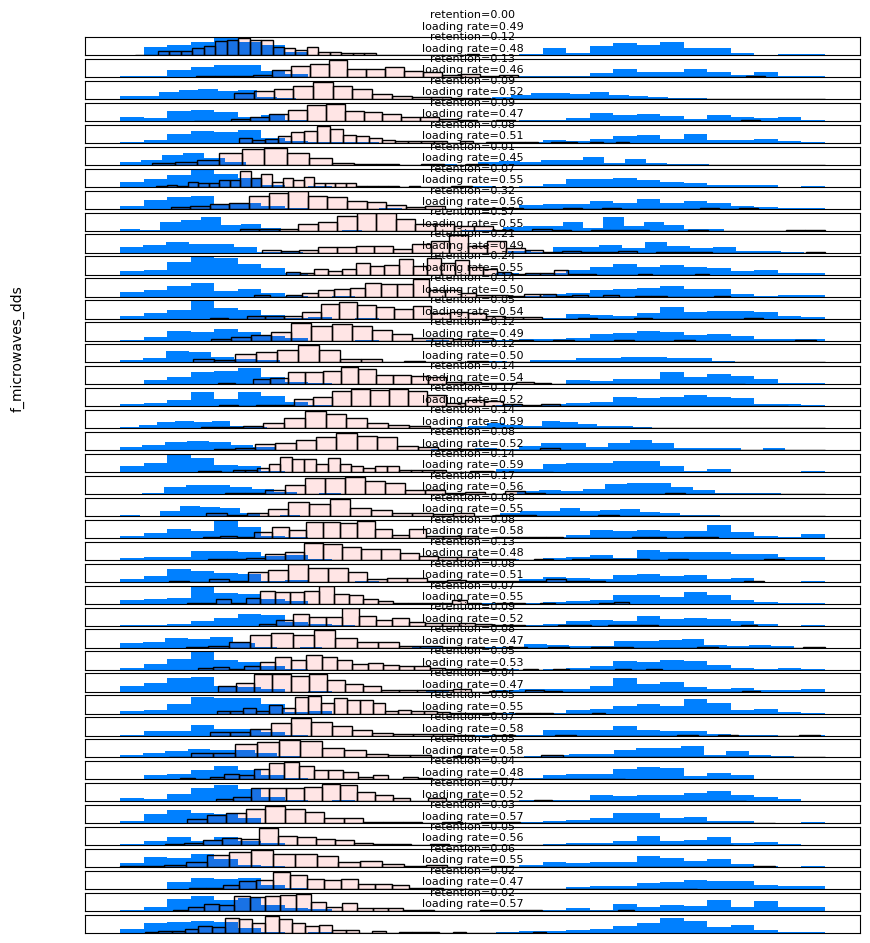

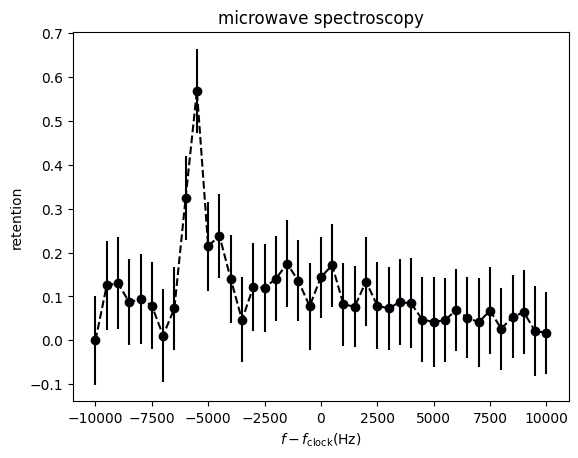

In [149]:
showhist = True
showloading = False # set to false when comparing multiple files
scan_offset = f_microwaves_dds
# scan_offset = 0

# don't try to compare multiple files if the scan is 2D
filelist=["2024-04-18\\21\\000012164-GeneralVariableScan_microwave_Rabi.h5"]#, fnames[0]]
# filelist=[fnames[0]]


for f_idx, fname in enumerate(filelist):
    f = h5py.File(os.path.join(results, fname))
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    iterations = len(scan_sequence1)*len(scan_sequence2)

    # plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
    cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
    cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
    retention_array = np.zeros(iterations)
    loading_rate_array = np.zeros(iterations)
    n_atoms_loaded_array = np.zeros(iterations)
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    
    dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
    if scan_is_2D:
        dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])
    
    measurements = n_measurements #if not control_experiment else n_measurements//2
    
    for i in range(iterations):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        
        atoms_loaded = [x > cutoff1 for x in shot1]
        n_atoms_loaded = sum(atoms_loaded)
        atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
        retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
        retention_array[i] = retention_fraction
        loading_rate_array[i] = n_atoms_loaded/n_measurements
        n_atoms_loaded_array[i] = n_atoms_loaded
    
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
        for i, ax in enumerate(axes.flat):
            shot1 = photocounts[i*measurements:(i+1)*measurements]
            shot2 = photocounts2[i*measurements:(i+1)*measurements]
            ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
            ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
            ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
            # ax.set_ylabel("occurences")
            # ax.set_xlabel("photons")
            ax.set_xticks([])
            ax.set_yticks([])
        if scan_is_2D: # todo
            axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
            [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
            [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
            [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
        fig.text(0.45,-0.5, scan_variable2_name)
        fig.text(0.05,0.35, scan_variable1_name,rotation=90)
        plt.subplots_adjust(bottom=-0.4)
        plt.show()
    
    if scan_is_2D:
        # plot a colormap of the retention
        fig,ax = plt.subplots()
        cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                      extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
        im = ax.get_images()
        extent =  im[0].get_extent()
        # plt.setp(ax.spines.values(), linewidth=0.1)
        ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
        ax.set_xticks(scan_sequence1)
        ax.set_yticks(scan_sequence2)
        ax.set_title(experiment_function)
        ax.set_xlabel(scan_variable1_name)
        ax.set_ylabel(scan_variable2_name)
        # ax.tick_params(axis='both', labelsize=10)
        fig.colorbar(cax)
        # plt.clim(0,1)
        plt.show()
    
    # plot a retention curve vs variable 1 for each variable 2 value
    # plot a retention curve vs variable 1 for each variable 2 value
    cmap = mpl.colormaps['inferno']
    for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
        if scan_is_2D:
            color=cmap(i/len(scan_sequence2))
            label=scan_variable2_name+"="+str(var2)
        else:
            color=cmap(f_idx/len(filelist))
            label=f"file {f_idx}"
        
        plt.plot(scan_sequence1-scan_offset, retention,color=color,linestyle='--')
        plt.scatter(scan_sequence1-scan_offset, retention,color=color,label=label)
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1-scan_offset, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))
    
        plt.xlabel(scan_variable1_name)
        plt.ylabel("retention")
        plt.xlabel(r"$f - f_{\rm clock} (\rm Hz)$")
        # plt.xlim((-7500,-2500))
        # plt.savefig("")
    
        if len(scan_sequence2)>1 or len(filelist)>1:
            plt.legend()
        # plt.title(experiment_function)
        plt.title("microwave spectroscopy")
        # plt.savefig("first_microwave_spectroscopy_signal_expid000012164.png",bbox_inches='tight')
        # plt.show()
    
    if showloading:
        for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
            plt.plot(scan_sequence1-scan_offset, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
            plt.scatter(scan_sequence1-scan_offset, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
            errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
            plt.errorbar(scan_sequence1-scan_offset, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))
    
            # plt.xlabel(scan_variable1_name)
            plt.xlabel(r"$f - f_{\rm clock} (\rm Hz)$")
            plt.ylabel("loading rate")
            plt.legend()
            plt.title(experiment_function)
            plt.show()
plt.show()

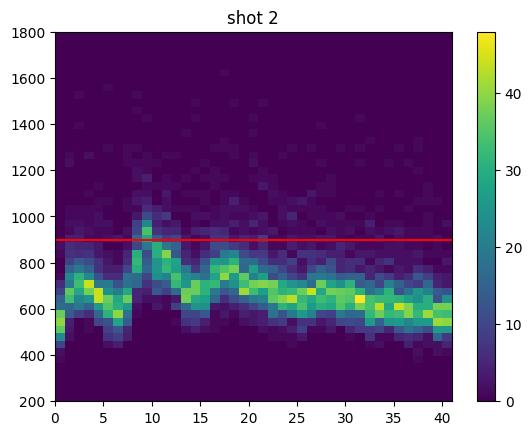

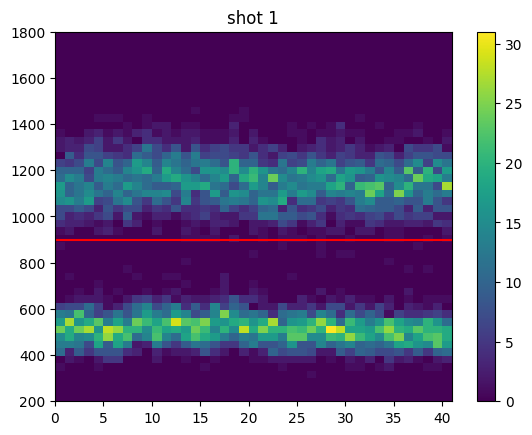

In [150]:
second_shot_hists = np.array([np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements],bins=np.linspace(200,1800,50))[0]
                              for i in range(iterations)])
fig,ax = plt.subplots()
cax=ax.imshow(second_shot_hists.transpose(),origin='lower',extent=[0,iterations,200,1800])
ax.set_title("shot 2")
ax.axhline(cutoff2,color='red')
ax.set_aspect('auto')
fig.colorbar(cax)

first_shot_hists = np.array([np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements],bins=np.linspace(200,1800,50))[0]
                              for i in range(iterations)])
fig,ax = plt.subplots()
cax=ax.imshow(first_shot_hists.transpose(),origin='lower',extent=[0,iterations,200,1800])
ax.set_title("shot 1")
ax.axhline(cutoff1,color='red')
ax.set_aspect('auto')
fig.colorbar(cax)

## 2024.04.18

## microwave spectroscopy
the atoms are hot, and we want to zero the B fields at the atoms with microwaves, but finding the microwave dip when the atoms have not been pumped into a single hyperfine state (at least partially) is going to be tough.

the scans below are not in the correct range. I forgot that the FORT gives a ~ 5 kHz differential shift around 1mK, but we haven't actually measured the trap depth yet.

In [50]:
fnames = get_files_by_criteria(date_filters=["2024-04-18"], # only find files from these date directories
                               name_filters=["microwave_Rabi", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    try:
        scan_str = str_from_h5(ds['scan_variable1_name'])
        if str_from_h5(ds['scan_variable2_name']) != '':
            scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
        # print(f"file {i} ({f[72:]}) scanned over "+scan_str)
        print(f"file {i} ({f}) scanned over "+scan_str)
    except:
        print(f"oops... something wrong with {f}")

found 7 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-18\08\000012119-GeneralVariableScan_microwave_Rabi.h5) scanned over f_microwaves_dds
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-18\10\000012136-GeneralVariableScan_microwave_Rabi.h5) scanned over f_microwaves_dds
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-18\11\000012139-GeneralVariableScan_microwave_Rabi.h5) scanned over f_microwaves_dds
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-18\11\000012140-GeneralVariableScan_microwave_Rabi.h5) scanned over f_microwaves_dds
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-18\13\000012142-GeneralVariableScan_microwave_Rabi.h5) scanned over f_microwaves_dds
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-18\18\000012163-GeneralVariableScan_microwave_Rabi.h5) scanned over f_microwaves_dds
file 6 (C:\Networking Experiment

In [51]:
fname = 'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-04-17\\22\\000012118-GeneralVariableScan_microwave_Rabi.h5' # microwave spectroscopy. shows a peak around 3.346817e+08
fname = fnames[0] # check if the peak was real. poor statistics-- try again. 
fname = fnames[1] 
fname = fnames[2] # maybe shows a peak around 384.68 MHz + 6.25 kHz
fname = fnames[6] # FOUND IT! VERY CLEAR MICROWAVE PEAK. 

f = h5py.File(os.path.join(results, fname))
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
iterations = len(scan_sequence1)*len(scan_sequence2)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)

assert len(photocounts) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: microwave_Rabi_experiment
Pumping light off? True


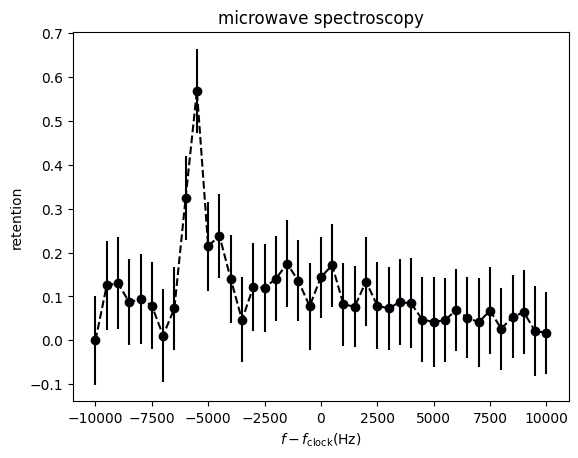

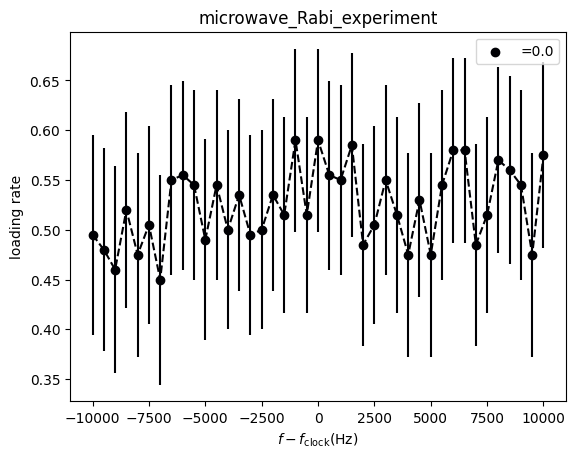

In [67]:
showhist = False
showloading = True
scan_offset = f_microwaves_dds
# scan_offset = 0

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = photocounts[i*measurements:(i+1)*measurements]
    shot2 = photocounts2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2_name)
    fig.text(0.05,0.35, scan_variable1_name,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_function)
    ax.set_xlabel(scan_variable1_name)
    ax.set_ylabel(scan_variable2_name)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1-scan_offset, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1-scan_offset, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1-scan_offset, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1_name)
    plt.ylabel("retention")
    plt.xlabel(r"$f - f_{\rm clock} (\rm Hz)$")
    plt.savefig("")

    if len(scan_sequence2)>1:
        plt.legend()
    # plt.title(experiment_function)
    plt.title("microwave spectroscopy")
    plt.savefig("first_microwave_spectroscopy_signal_expid000012164.png",bbox_inches='tight')
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1-scan_offset, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1-scan_offset, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1-scan_offset, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        # plt.xlabel(scan_variable1_name)
        plt.xlabel(r"$f - f_{\rm clock} (\rm Hz)$")
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_function)
        plt.show()

In [60]:
len(scan_sequence2)

1

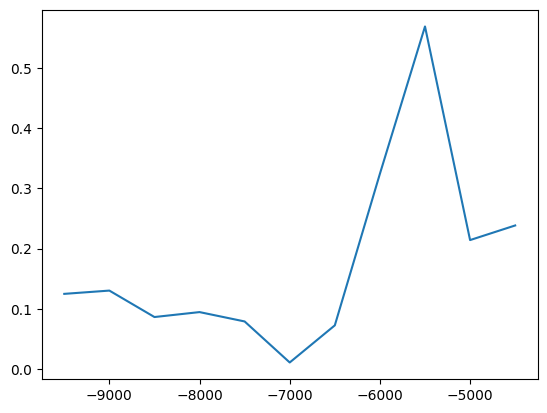

In [63]:
plt.plot(scan_sequence1[1:12]-f_microwaves_dds,retention_array[1:12])

In [40]:
retention_array[16]

0.1111111111111111

## 2024.04.10

In [21]:
fnames = get_files_by_criteria(date_filters=["2024-04-10"], # only find files from these date directories
                               name_filters=["atom_loading"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    scan_str = str_from_h5(ds['scan_variable1_name'])
    if str_from_h5(ds['scan_variable2_name']) != '':
        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
    print(f"file {i} scanned over "+scan_str)

found 18 files
file 0 scanned over f_cooling_DP_RO
file 1 scanned over f_cooling_DP_RO
file 2 scanned over f_cooling_DP_RO
file 3 scanned over f_cooling_DP_RO
file 4 scanned over f_cooling_DP_RO
file 5 scanned over f_cooling_DP_RO
file 6 scanned over f_cooling_DP_RO
file 7 scanned over f_cooling_DP_RO
file 8 scanned over f_cooling_DP_RO
file 9 scanned over t_SPCM_first_shot
file 10 scanned over t_SPCM_first_shot
file 11 scanned over t_SPCM_first_shot
file 12 scanned over p_cooling_DP_RO
file 13 scanned over p_cooling_DP_RO
file 14 scanned over t_MOT_dissipation
file 15 scanned over dummy_variable
file 16 scanned over AX_volts_RO
file 17 scanned over AY_volts_RO


In [22]:
fname = fnames[9]

f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

try:
    scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])
except:
    scan_sequence1 = np.array(f['datasets']['scan_sequence1'])

scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    try:
        scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    except:
        scan_sequence2 = np.array(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
t_SPCM_first_shot [0.007      0.00844444 0.00988889 0.01133333 0.01277778 0.01422222
 0.01566667 0.01711111 0.01855556 0.02      ]
 [0.]


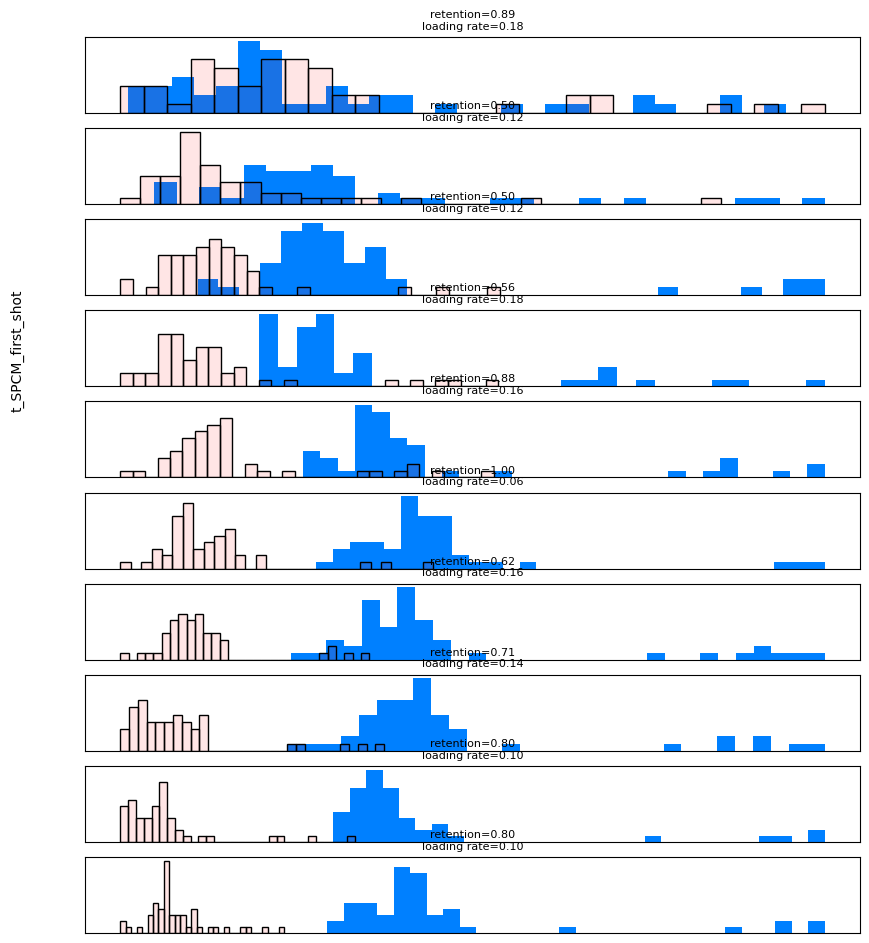

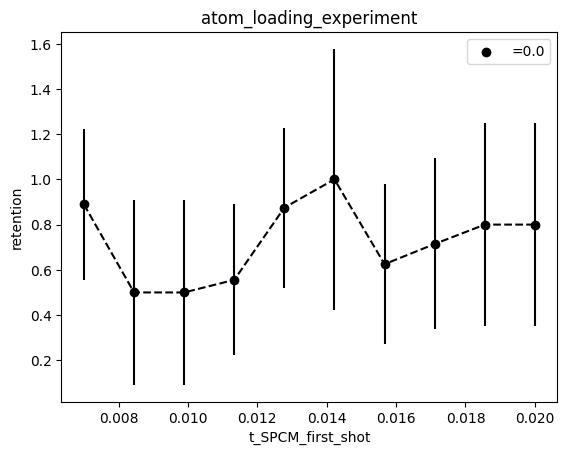

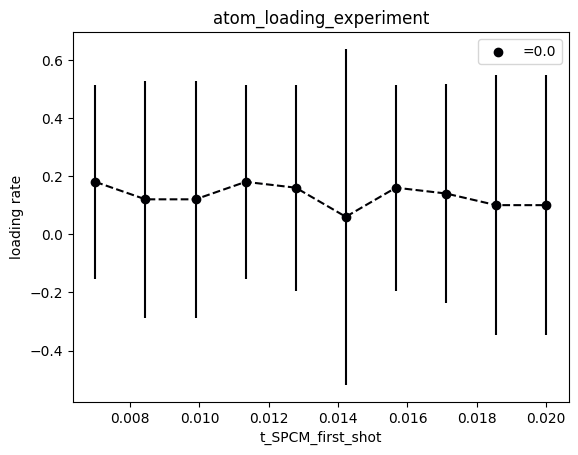

In [23]:
# caution: don't copy the cell below for other variable scans, since the readout time t_SCPM_first_shot changes how we calculate the atom theshold for each step

showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
# cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]

    # THIS IS ONLY VALID IF WE ARE SCANNING THE FIRST READOUT TIME
    cutoff1 = single_atom_counts_per_s*scan_sequence1[i]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

## scan over readout detuning - just testing this notebook

In [16]:
fname = fnames[7]

f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

try:
    scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])
except:
    scan_sequence1 = np.array(f['datasets']['scan_sequence1'])

scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    try:
        scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    except:
        scan_sequence2 = np.array(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
f_cooling_DP_RO [1.20e+08 1.21e+08 1.22e+08 1.23e+08 1.24e+08 1.25e+08]
 [0.]


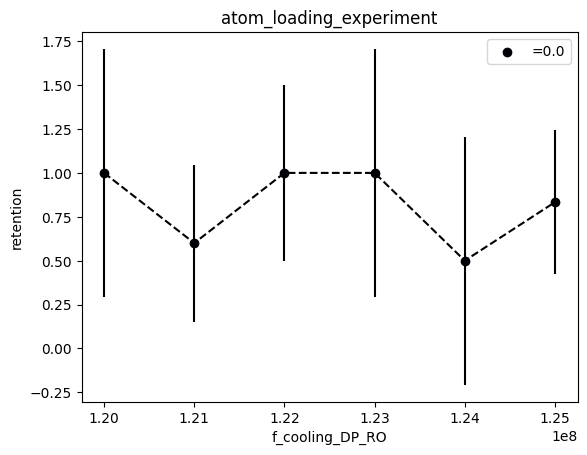

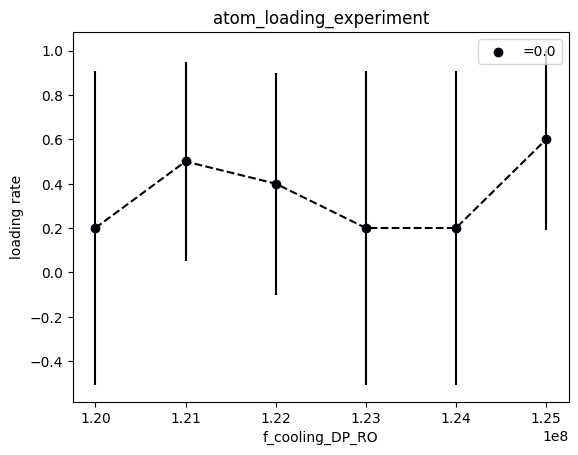

In [17]:
showhist = False
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()